# Anime face generation by basic GANs

## Import libraries

In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, MaxPool2D, Dropout, Conv2DTranspose
from keras.callbacks import EarlyStopping
import tensorflow as tf

C:\Users\chenq\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\chenq\anaconda3\lib\site-packages\numpy\.libs\libopenblas.PYQHXLVVQ7VESDPUVUADXEVJOBGHJPAY.gfortran-win_amd64.dll
C:\Users\chenq\anaconda3\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


In [2]:
import random
import math

In [3]:
import numpy as np

In [4]:
from PIL import Image

In [5]:
cwd = os.getcwd()

In [6]:
import matplotlib.pyplot as plt

## Basic gans

### Generator and discriminator

Two core component in a GAN network

In [9]:
generator = Sequential([
    
    Dense(128*16*16, activation = 'relu', input_shape = (100, )),# input a noise vector with length 100
    
    tf.keras.layers.Reshape((16, 16, 128), input_shape=(128*16*16,)),
    
    tf.keras.layers.UpSampling2D(size=(2, 2)),
    
    Conv2DTranspose(128, 4, activation = 'relu', padding = 'same'),
    
    tf.keras.layers.UpSampling2D(size=(2, 2)),
    
    #tf.keras.layers.Dropout(0.5),
    
    Conv2DTranspose(64, 4, activation = 'relu', padding = 'same'),
    
    #tf.keras.layers.Dropout(0.5),
    Conv2DTranspose(32, 4, activation = 'relu', padding = 'same'),
    
    Conv2DTranspose(3, 4, activation = 'tanh', padding = 'same'),

    # For a neural network, small numbers (-1, 1) often gives a better performence, so I want input and output be in this range.
    # A generator can only generate some pixels in (-1, 1) can not be an eligible adversary of discriminator
    # cause the real image can use (0, 255) as its pixel values
    # That is why we times 255 after final output.
    tf.keras.layers.experimental.preprocessing.Rescaling(255, input_shape=(img_height, img_width, 3))
])

generator.optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

In [10]:
generator.input_shape

(None, 100)

In [11]:
generator.output_shape

(None, 64, 64, 3)

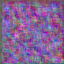

In [12]:
# test input

sample_vector = np.zeros(100,)

for a in range(100):
    n = 255 * random.random()
    #generator(n)
    sample_vector[a] = n


sample_vector = tf.random.normal([1,100], 0, 1, tf.float32, seed=1) # sample a 100 dimesional vector from a std normal distribution.
sample_output = generator(sample_vector).numpy()   


sample_img = tf.keras.preprocessing.image.array_to_img(sample_output.reshape(64, 64, 3))
#for i in range(len(sample_vector)):
#    print(sample_vector[i])
sample_img

In [8]:
batch_size = 32
img_height = 64
img_width = 64


discriminator = Sequential([
    
    # Again, networks works better with small number, normalize the inputs form (0, 255) to (-1, 1) is a nice preprocessing.
    tf.keras.layers.experimental.preprocessing.Rescaling(scale=1./127.5, offset=-1, input_shape=(img_height, img_width, 3)),
    
    Conv2D(32, 4, activation = 'relu', input_shape = (64, 64, 3)),
    
    Conv2D(64, 4, activation = 'relu', padding = "same"),
 
    Conv2D(128, 4, activation = 'relu'),

    Conv2D(256, 4, activation = 'relu'),
    
    Flatten(),
    
    Dense(1, activation = 'sigmoid') # we use something contains log as its loss function, need input a value greater than 0, sigmoid is used
])

discriminator.optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

In [13]:
# test IO
output_dis = discriminator(sample_output)
output_dis
#output_dis[0]

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.5236646]], dtype=float32)>

### Real data generator

Not the same "generator" mentioned above. This generate real images. 

In [8]:
# try to create a real data generator

real_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  cwd + "/dataset/",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 33431 files belonging to 1 classes.


In [98]:
real_dataset_iter = real_dataset.as_numpy_iterator() # prepard real dataset as an iterator

In [548]:
discriminator(real_dataset_iter.__next__()[0]) # Test 

<tf.Tensor: shape=(32, 1), dtype=float32, numpy=
array([[0.7747044 ],
       [0.53108746],
       [0.99960285],
       [0.85329837],
       [0.9609065 ],
       [0.6483611 ],
       [0.1738675 ],
       [0.69373095],
       [0.9452616 ],
       [0.69894165],
       [0.9996673 ],
       [0.6254188 ],
       [0.90773404],
       [0.81058776],
       [0.85785186],
       [0.76578635],
       [0.9890003 ],
       [0.65953445],
       [0.7756238 ],
       [0.98691213],
       [0.98143387],
       [0.51334685],
       [0.7510009 ],
       [0.71481436],
       [0.9031952 ],
       [0.9511372 ],
       [0.86333   ],
       [0.89472246],
       [0.94742435],
       [0.7051622 ],
       [0.76616716],
       [0.7088115 ]], dtype=float32)>

In [110]:
real_dataset_iter.__next__()[1]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### Put them inside a class

In [16]:
class myGANs:
    
    def __init__(self, generator, discriminator, real_data_path, seed, batch_size, img_height, img_width):
        
        self.generator = generator
        self.discriminator = discriminator
        self.batch_size = batch_size
        self.real_dataset_iter = self.get_real_dataset_iter(real_data_path, seed, batch_size, img_height, img_width)
        self.current_epoch = 1
        
    def get_real_dataset_iter(self, real_data_path, seed, batch_size, img_height, img_width):
        
        real_dataset = tf.keras.preprocessing.image_dataset_from_directory(
        real_data_path,
        seed=seed,
        image_size=(img_height, img_width),
        batch_size=batch_size)
        
        real_dataset_iter = real_dataset.as_numpy_iterator()
        
        return real_dataset_iter
    
    # This func gengerates a batch of noise vactor from a normal (0,1) distribution with specific noise dimension.
    def sample_batch_noise(self, batch_size, noise_dim):
        
        sample_noise = []
        
        for i in range(batch_size):

            sample_vector = tf.random.normal([1,100], 0, 1, tf.float32, seed=1)
            sample_noise.append(sample_vector)
            
        return np.asarray(sample_noise)
    
    def loss_d_fn(self, real_predicts, fake_predicts, batch_size):
        
        # calculate loss for real images
        avg_real_loss = tf.reduce_mean(tf.math.log(real_predicts))
        
        # calculate loss for fake images
        avg_fake_loss = tf.reduce_mean(tf.math.log(tf.constant(1.0) - fake_predicts))
        
        return - ( avg_real_loss + avg_fake_loss )
    
    # define update discriminator here
    def update_discriminator(self):
        real_images = self.real_dataset_iter.__next__()[0] # generate real images with batch size
        noise = self.sample_batch_noise(self.batch_size, noise_dim = 100) # generate noise vectors
        fake_images = self.generator(noise) # pass noise into generator, get fake images
        
        #loss = myGANs.loss_d_fn(real_predicts, np.ones(self.batch_size), fake_predicts, np.zeros(self.batch_size))
        
        with tf.GradientTape() as t:
            # Trainable variables are automatically tracked by GradientTape
            """
            bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
            real_labels = tf.ones(self.batch_size)
            real_predictions = self.discriminator(real_images)
            
            fake_labels = tf.zeros(self.batch_size)
            fake_predictions = self.discriminator(self.generator(noise))
                                                  
            real_loss = bce(real_labels, real_predictions)
            fake_loss = bce(fake_labels, fake_predictions)
            """
                        
            current_loss = self.loss_d_fn(self.discriminator(real_images), self.discriminator(self.generator(noise)), self.batch_size)
            #current_loss = real_loss + fake_loss

        print("Current loss for discriminator: {}".format(current_loss))
        self.discriminator.optimizer.minimize(current_loss, self.discriminator.trainable_variables, tape = t)
        #return self.discriminator.optimizer.minimize(current_loss, self.discriminator.trainable_variables, tape = t)
        
    def loss_g_fn(self, fake_predicts, batch_size):
        
        # calculate loss for fake images
        avg_fake_loss = tf.reduce_mean( - tf.math.log(fake_predicts))
        #avg_fake_loss = tf.math.divide(sum_fake_loss, tf.constant(float(batch_size)))
        
        return avg_fake_loss
    
    # update generator
    def update_generator(self):
        noise = self.sample_batch_noise(self.batch_size, noise_dim = 100)
        #fake_images = self.generator(noise)
        
        with tf.GradientTape() as t0:
            # Trainable variables are automatically tracked by GradientTape
            """
            bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
            real_labels = tf.ones(self.batch_size)
            predictions = self.discriminator(self.generator(noise))
            """
               
            
            current_loss = self.loss_g_fn(self.discriminator(self.generator(noise)), self.batch_size)
            #current_loss = bce(real_labels, predictions)
        
        print("Current loss for generator: {}".format(current_loss))

        self.generator.optimizer.minimize(current_loss, self.generator.trainable_variables, tape = t0)
        
        #new_loss = myGANs.loss_g_fn(self.discriminator(self.generator(noise)), self.batch_size)
        #new_predictions = self.discriminator(self.generator(noise))
        #new_loss = bce(real_labels, new_predictions)
        #print("New loss for generator: {}".format(new_loss))
        
    def training(self, max_iter, k = 1):
        
        for i in range(max_iter):
        # update discriminator func need to be implemented
            print("=======================================")            
            print("Epochs: {}".format(self.current_epoch))
            
            for i in range(k):
                self.update_discriminator()
            
            self.update_generator()
            
            print("=======================================")
            self.current_epoch += 1
            
    def test_and_show(self):
        
        generated_imgs_iter = self.generator(self.sample_batch_noise(self.batch_size, 100))
        
        for i in range(32):
            ax = plt.subplot(4, 8, i + 1)
            sample_img = tf.keras.preprocessing.image.array_to_img(generated_imgs_iter[i])
            plt.imshow(sample_img)
            plt.axis("off")
        
        plt.show()

In [44]:
mygans = myGANs(generator, discriminator, cwd + "/extra_data_from_danbooru/", 123, 32, 64, 64)

Found 140000 files belonging to 1 classes.


### Before training
Here is a sample that what a image can an untrained generator gives

In [45]:
# test input
def sample_generation(generator):


    sample_vector = tf.random.normal([1,100], 0, 1, tf.float32, seed=1)
    sample_output = generator(sample_vector).numpy()   

    sample_img = tf.keras.preprocessing.image.array_to_img(sample_output.reshape(64, 64, 3))
    #for i in range(len(sample_vector)):
    #    print(sample_vector[i])
    return sample_img
    


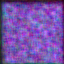

In [46]:
sample_generation(mygans.generator)

In [50]:
mygans.training(1)

Epochs: 2
Current loss for discriminator: 2.5518648624420166
Current loss for generator: 3.8722190856933594


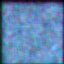

In [51]:
sample_generation(mygans.generator)

### Training procedure

In [16]:
# training procedure
mygans.training(1)

Epochs: 1
Current loss for discriminator: 1.3851592540740967
Current loss for generator: 5.164864540100098


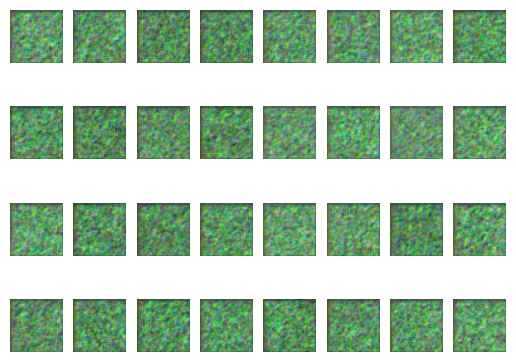

In [17]:
# sample after 10 update
mygans.test_and_show()

#mygans.generator.trainable_variables

In [18]:
# training procedure
mygans.training(9)

Epochs: 2
Current loss for discriminator: 1.272438406944275
Current loss for generator: 0.9474755525588989
Epochs: 3
Current loss for discriminator: 0.6198363304138184
Current loss for generator: 3.5221152305603027
Epochs: 4
Current loss for discriminator: 0.10855312645435333
Current loss for generator: 4.4467620849609375
Epochs: 5
Current loss for discriminator: 0.0701557919383049
Current loss for generator: 4.092815399169922
Epochs: 6
Current loss for discriminator: 0.4290023148059845
Current loss for generator: 2.8725783824920654
Epochs: 7
Current loss for discriminator: 5.241042137145996
Current loss for generator: 0.362302303314209
Epochs: 8
Current loss for discriminator: 3.1365299224853516
Current loss for generator: 2.0925025939941406
Epochs: 9
Current loss for discriminator: 2.064462423324585
Current loss for generator: 1.1377664804458618
Epochs: 10
Current loss for discriminator: 0.6734105348587036
Current loss for generator: 1.495938777923584


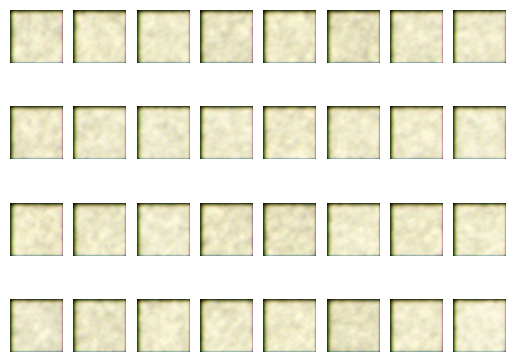

In [19]:
mygans.test_and_show()

In [20]:
mygans.training(90)

Epochs: 11
Current loss for discriminator: 0.4490211606025696
Current loss for generator: 2.612220287322998
Epochs: 12
Current loss for discriminator: 0.3214556574821472
Current loss for generator: 2.3358826637268066
Epochs: 13
Current loss for discriminator: 0.676527202129364
Current loss for generator: 1.9535611867904663
Epochs: 14
Current loss for discriminator: 1.8365546464920044
Current loss for generator: 0.6457226276397705
Epochs: 15
Current loss for discriminator: 1.6319764852523804
Current loss for generator: 1.1091058254241943
Epochs: 16
Current loss for discriminator: 0.6203599572181702
Current loss for generator: 1.4789516925811768
Epochs: 17
Current loss for discriminator: 0.4210248291492462
Current loss for generator: 1.3278696537017822
Epochs: 18
Current loss for discriminator: 1.0270484685897827
Current loss for generator: 1.1647382974624634
Epochs: 19
Current loss for discriminator: 0.6172410845756531
Current loss for generator: 1.6183741092681885
Epochs: 20
Current lo

Current loss for generator: 1.798995018005371
Epochs: 55
Current loss for discriminator: 0.5245184302330017
Current loss for generator: 1.4394021034240723
Epochs: 56
Current loss for discriminator: 0.5909781455993652
Current loss for generator: 1.297641634941101
Epochs: 57
Current loss for discriminator: 0.7398122549057007
Current loss for generator: 1.4118343591690063
Epochs: 58
Current loss for discriminator: 0.43964213132858276
Current loss for generator: 1.6090959310531616
Epochs: 59
Current loss for discriminator: 0.394573450088501
Current loss for generator: 1.7615865468978882
Epochs: 60
Current loss for discriminator: 0.5555641055107117
Current loss for generator: 1.6914516687393188
Epochs: 61
Current loss for discriminator: 0.3740782141685486
Current loss for generator: 1.8776586055755615
Epochs: 62
Current loss for discriminator: 0.44233471155166626
Current loss for generator: 1.7080552577972412
Epochs: 63
Current loss for discriminator: 0.466062992811203
Current loss for gene

Current loss for discriminator: 0.621525764465332
Current loss for generator: 0.978745698928833
Epochs: 99
Current loss for discriminator: 0.8076004981994629
Current loss for generator: 1.0550826787948608
Epochs: 100
Current loss for discriminator: 0.6940131187438965
Current loss for generator: 1.5937516689300537


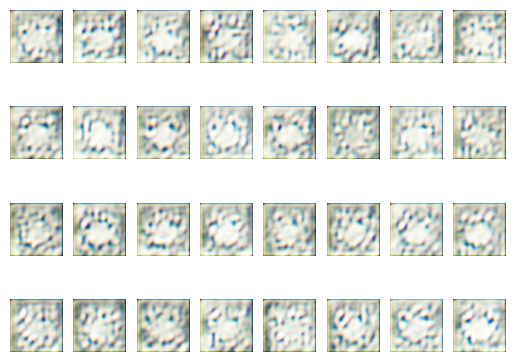

In [21]:
mygans.test_and_show()
#mygans.discriminator.trainable_variables

In [22]:
mygans.training(900)

Epochs: 101
Current loss for discriminator: 0.49250876903533936
Current loss for generator: 2.0033228397369385
Epochs: 102
Current loss for discriminator: 0.3934684097766876
Current loss for generator: 2.140662670135498
Epochs: 103
Current loss for discriminator: 0.36521583795547485
Current loss for generator: 2.1683778762817383
Epochs: 104
Current loss for discriminator: 0.3660511374473572
Current loss for generator: 2.237715721130371
Epochs: 105
Current loss for discriminator: 0.6379532217979431
Current loss for generator: 1.7445552349090576
Epochs: 106
Current loss for discriminator: 0.724862277507782
Current loss for generator: 2.181926965713501
Epochs: 107
Current loss for discriminator: 0.45781442523002625
Current loss for generator: 2.1358437538146973
Epochs: 108
Current loss for discriminator: 0.5850369930267334
Current loss for generator: 1.4967153072357178
Epochs: 109
Current loss for discriminator: 0.6399756669998169
Current loss for generator: 2.499344825744629
Epochs: 110


Current loss for discriminator: 1.4269185066223145
Current loss for generator: 1.7938740253448486
Epochs: 145
Current loss for discriminator: 1.1000601053237915
Current loss for generator: 1.6637399196624756
Epochs: 146
Current loss for discriminator: 0.7128421664237976
Current loss for generator: 1.4315533638000488
Epochs: 147
Current loss for discriminator: 0.5676896572113037
Current loss for generator: 1.4015090465545654
Epochs: 148
Current loss for discriminator: 0.595951497554779
Current loss for generator: 1.6593799591064453
Epochs: 149
Current loss for discriminator: 0.7286472320556641
Current loss for generator: 2.037163257598877
Epochs: 150
Current loss for discriminator: 0.7563109397888184
Current loss for generator: 1.9192559719085693
Epochs: 151
Current loss for discriminator: 0.8882663249969482
Current loss for generator: 1.5866913795471191
Epochs: 152
Current loss for discriminator: 0.8045162558555603
Current loss for generator: 1.6159489154815674
Epochs: 153
Current loss

Current loss for generator: 1.1912071704864502
Epochs: 188
Current loss for discriminator: 0.8172588348388672
Current loss for generator: 1.1972383260726929
Epochs: 189
Current loss for discriminator: 0.9125987887382507
Current loss for generator: 1.3679087162017822
Epochs: 190
Current loss for discriminator: 0.8658241033554077
Current loss for generator: 1.5363713502883911
Epochs: 191
Current loss for discriminator: 0.7019968628883362
Current loss for generator: 1.5764005184173584
Epochs: 192
Current loss for discriminator: 0.7833368182182312
Current loss for generator: 1.3500572443008423
Epochs: 193
Current loss for discriminator: 0.8730341792106628
Current loss for generator: 1.3597462177276611
Epochs: 194
Current loss for discriminator: 0.8153318166732788
Current loss for generator: 1.6029887199401855
Epochs: 195
Current loss for discriminator: 0.5654414892196655
Current loss for generator: 1.8867669105529785
Epochs: 196
Current loss for discriminator: 0.5166356563568115
Current lo

Epochs: 231
Current loss for discriminator: 0.9682740569114685
Current loss for generator: 2.1154367923736572
Epochs: 232
Current loss for discriminator: 0.3979926109313965
Current loss for generator: 2.619846820831299
Epochs: 233
Current loss for discriminator: 0.5263095498085022
Current loss for generator: 2.217135190963745
Epochs: 234
Current loss for discriminator: 0.870897114276886
Current loss for generator: 1.9670274257659912
Epochs: 235
Current loss for discriminator: 0.8069949150085449
Current loss for generator: 2.530297040939331
Epochs: 236
Current loss for discriminator: 0.7133362293243408
Current loss for generator: 1.9908721446990967
Epochs: 237
Current loss for discriminator: 0.7987743616104126
Current loss for generator: 1.5979772806167603
Epochs: 238
Current loss for discriminator: 0.6495320796966553
Current loss for generator: 3.977116346359253
Epochs: 239
Current loss for discriminator: 0.9388521313667297
Current loss for generator: 1.832337498664856
Epochs: 240
Curr

Current loss for discriminator: 0.6947510838508606
Current loss for generator: 2.0096652507781982
Epochs: 275
Current loss for discriminator: 0.5931047201156616
Current loss for generator: 2.097766876220703
Epochs: 276
Current loss for discriminator: 0.4777141511440277
Current loss for generator: 2.6542654037475586
Epochs: 277
Current loss for discriminator: 0.45034903287887573
Current loss for generator: 2.4688234329223633
Epochs: 278
Current loss for discriminator: 0.5480635166168213
Current loss for generator: 1.4592044353485107
Epochs: 279
Current loss for discriminator: 0.6823073625564575
Current loss for generator: 6.220612049102783
Epochs: 280
Current loss for discriminator: 1.3723033666610718
Current loss for generator: 0.2627687454223633
Epochs: 281
Current loss for discriminator: 1.883948564529419
Current loss for generator: 4.6480560302734375
Epochs: 282
Current loss for discriminator: 1.3137118816375732
Current loss for generator: 3.0464539527893066
Epochs: 283
Current loss

Current loss for generator: 1.6468948125839233
Epochs: 318
Current loss for discriminator: 0.43158358335494995
Current loss for generator: 2.41176700592041
Epochs: 319
Current loss for discriminator: 0.4795341193675995
Current loss for generator: 2.347551107406616
Epochs: 320
Current loss for discriminator: 0.6997076272964478
Current loss for generator: 1.9657599925994873
Epochs: 321
Current loss for discriminator: 0.6899617314338684
Current loss for generator: 2.9952480792999268
Epochs: 322
Current loss for discriminator: 0.7878968119621277
Current loss for generator: 1.3501567840576172
Epochs: 323
Current loss for discriminator: 1.0679824352264404
Current loss for generator: 4.567139625549316
Epochs: 324
Current loss for discriminator: 1.7576162815093994
Current loss for generator: 1.8370128870010376
Epochs: 325
Current loss for discriminator: 0.5929727554321289
Current loss for generator: 1.0360231399536133
Epochs: 326
Current loss for discriminator: 0.7138417363166809
Current loss 

Epochs: 361
Current loss for discriminator: 0.8284361958503723
Current loss for generator: 1.9195313453674316
Epochs: 362
Current loss for discriminator: 0.8417730331420898
Current loss for generator: 1.4366793632507324
Epochs: 363
Current loss for discriminator: 0.8364629745483398
Current loss for generator: 1.1969399452209473
Epochs: 364
Current loss for discriminator: 1.0412213802337646
Current loss for generator: 2.6970038414001465
Epochs: 365
Current loss for discriminator: 1.3356825113296509
Current loss for generator: 1.384421706199646
Epochs: 366
Current loss for discriminator: 0.5707394480705261
Current loss for generator: 0.9731714725494385
Epochs: 367
Current loss for discriminator: 0.8347392082214355
Current loss for generator: 1.6020987033843994
Epochs: 368
Current loss for discriminator: 0.7322889566421509
Current loss for generator: 1.6954935789108276
Epochs: 369
Current loss for discriminator: 0.9330462217330933
Current loss for generator: 1.1626837253570557
Epochs: 370

Current loss for discriminator: 0.8904392123222351
Current loss for generator: 1.2651171684265137
Epochs: 405
Current loss for discriminator: 0.8472834825515747
Current loss for generator: 1.8037623167037964
Epochs: 406
Current loss for discriminator: 0.5241910219192505
Current loss for generator: 2.17741060256958
Epochs: 407
Current loss for discriminator: 0.43421921133995056
Current loss for generator: 2.308530330657959
Epochs: 408
Current loss for discriminator: 0.5484505891799927
Current loss for generator: 1.687429428100586
Epochs: 409
Current loss for discriminator: 0.6465774774551392
Current loss for generator: 4.161529541015625
Epochs: 410
Current loss for discriminator: 1.105111002922058
Current loss for generator: 0.8970213532447815
Epochs: 411
Current loss for discriminator: 1.1271158456802368
Current loss for generator: 3.4828438758850098
Epochs: 412
Current loss for discriminator: 0.7701667547225952
Current loss for generator: 2.2431061267852783
Epochs: 413
Current loss fo

Current loss for generator: 2.0702626705169678
Epochs: 448
Current loss for discriminator: 0.6633111834526062
Current loss for generator: 1.9356046915054321
Epochs: 449
Current loss for discriminator: 0.6581767201423645
Current loss for generator: 1.1817665100097656
Epochs: 450
Current loss for discriminator: 0.7173118591308594
Current loss for generator: 1.7080633640289307
Epochs: 451
Current loss for discriminator: 0.5731679201126099
Current loss for generator: 2.1949734687805176
Epochs: 452
Current loss for discriminator: 0.6813532114028931
Current loss for generator: 1.536115288734436
Epochs: 453
Current loss for discriminator: 0.5617711544036865
Current loss for generator: 1.382042407989502
Epochs: 454
Current loss for discriminator: 0.7086795568466187
Current loss for generator: 1.9717206954956055
Epochs: 455
Current loss for discriminator: 0.624380350112915
Current loss for generator: 1.7014093399047852
Epochs: 456
Current loss for discriminator: 0.642330527305603
Current loss f

Epochs: 491
Current loss for discriminator: 0.5249215364456177
Current loss for generator: 1.6629599332809448
Epochs: 492
Current loss for discriminator: 0.4862383008003235
Current loss for generator: 2.6805953979492188
Epochs: 493
Current loss for discriminator: 0.47319650650024414
Current loss for generator: 1.6973531246185303
Epochs: 494
Current loss for discriminator: 0.49138736724853516
Current loss for generator: 3.5836968421936035
Epochs: 495
Current loss for discriminator: 1.0243546962738037
Current loss for generator: 0.20848482847213745
Epochs: 496
Current loss for discriminator: 2.0075459480285645
Current loss for generator: 4.772640228271484
Epochs: 497
Current loss for discriminator: 3.300441265106201
Current loss for generator: 2.219132423400879
Epochs: 498
Current loss for discriminator: 1.5301833152770996
Current loss for generator: 1.1109824180603027
Epochs: 499
Current loss for discriminator: 0.9122471809387207
Current loss for generator: 0.8423376083374023
Epochs: 50

Current loss for discriminator: 1.1744747161865234
Current loss for generator: 0.8377482891082764
Epochs: 535
Current loss for discriminator: 1.1985068321228027
Current loss for generator: 0.8905174732208252
Epochs: 536
Current loss for discriminator: 1.0913798809051514
Current loss for generator: 0.9442983269691467
Epochs: 537
Current loss for discriminator: 1.1788320541381836
Current loss for generator: 1.1053881645202637
Epochs: 538
Current loss for discriminator: 1.165218710899353
Current loss for generator: 1.6964590549468994
Epochs: 539
Current loss for discriminator: 0.8066770434379578
Current loss for generator: 1.557998776435852
Epochs: 540
Current loss for discriminator: 0.7713123559951782
Current loss for generator: 1.1795573234558105
Epochs: 541
Current loss for discriminator: 1.0899837017059326
Current loss for generator: 1.3276606798171997
Epochs: 542
Current loss for discriminator: 1.4547804594039917
Current loss for generator: 1.7332890033721924
Epochs: 543
Current loss

Current loss for generator: 1.1017168760299683
Epochs: 578
Current loss for discriminator: 0.9106533527374268
Current loss for generator: 2.9173004627227783
Epochs: 579
Current loss for discriminator: 0.8861234784126282
Current loss for generator: 1.2322537899017334
Epochs: 580
Current loss for discriminator: 0.628903329372406
Current loss for generator: 1.322805404663086
Epochs: 581
Current loss for discriminator: 0.5600972771644592
Current loss for generator: 1.6284401416778564
Epochs: 582
Current loss for discriminator: 0.5380046367645264
Current loss for generator: 1.8220102787017822
Epochs: 583
Current loss for discriminator: 0.539048433303833
Current loss for generator: 1.743829369544983
Epochs: 584
Current loss for discriminator: 0.5214524269104004
Current loss for generator: 1.8811211585998535
Epochs: 585
Current loss for discriminator: 0.6605652570724487
Current loss for generator: 1.3360544443130493
Epochs: 586
Current loss for discriminator: 0.7304757833480835
Current loss f

Epochs: 621
Current loss for discriminator: 0.8437002301216125
Current loss for generator: 1.9531490802764893
Epochs: 622
Current loss for discriminator: 0.8901021480560303
Current loss for generator: 1.0308547019958496
Epochs: 623
Current loss for discriminator: 0.9280085563659668
Current loss for generator: 1.3097326755523682
Epochs: 624
Current loss for discriminator: 0.7245690226554871
Current loss for generator: 1.905397891998291
Epochs: 625
Current loss for discriminator: 0.7921798825263977
Current loss for generator: 1.048710823059082
Epochs: 626
Current loss for discriminator: 0.9520782828330994
Current loss for generator: 2.200653076171875
Epochs: 627
Current loss for discriminator: 0.8923966288566589
Current loss for generator: 1.0666871070861816
Epochs: 628
Current loss for discriminator: 0.7601509094238281
Current loss for generator: 2.1832056045532227
Epochs: 629
Current loss for discriminator: 0.6820670962333679
Current loss for generator: 1.4696462154388428
Epochs: 630
C

Current loss for discriminator: 0.6015793085098267
Current loss for generator: 1.6188154220581055
Epochs: 665
Current loss for discriminator: 0.5544416904449463
Current loss for generator: 1.9065179824829102
Epochs: 666
Current loss for discriminator: 0.48688310384750366
Current loss for generator: 2.70103120803833
Epochs: 667
Current loss for discriminator: 0.6075650453567505
Current loss for generator: 1.0356166362762451
Epochs: 668
Current loss for discriminator: 0.7262985706329346
Current loss for generator: 5.41774320602417
Epochs: 669
Current loss for discriminator: 2.4404690265655518
Current loss for generator: 0.5901738405227661
Epochs: 670
Current loss for discriminator: 0.9543654918670654
Current loss for generator: 1.291630744934082
Epochs: 671
Current loss for discriminator: 0.7095848321914673
Current loss for generator: 1.8953564167022705
Epochs: 672
Current loss for discriminator: 0.7387735843658447
Current loss for generator: 2.205620765686035
Epochs: 673
Current loss fo

Current loss for generator: 2.9242725372314453
Epochs: 708
Current loss for discriminator: 1.0965698957443237
Current loss for generator: 0.8557864427566528
Epochs: 709
Current loss for discriminator: 1.1072344779968262
Current loss for generator: 3.057396173477173
Epochs: 710
Current loss for discriminator: 1.2966339588165283
Current loss for generator: 1.3664333820343018
Epochs: 711
Current loss for discriminator: 0.8491436243057251
Current loss for generator: 0.9092035293579102
Epochs: 712
Current loss for discriminator: 1.1123822927474976
Current loss for generator: 2.131075859069824
Epochs: 713
Current loss for discriminator: 1.1131091117858887
Current loss for generator: 1.32291579246521
Epochs: 714
Current loss for discriminator: 0.8504554629325867
Current loss for generator: 0.9916667342185974
Epochs: 715
Current loss for discriminator: 0.9113932251930237
Current loss for generator: 2.2234625816345215
Epochs: 716
Current loss for discriminator: 0.9430649280548096
Current loss f

Epochs: 751
Current loss for discriminator: 0.6110434532165527
Current loss for generator: 1.7349050045013428
Epochs: 752
Current loss for discriminator: 0.4976040720939636
Current loss for generator: 1.9528915882110596
Epochs: 753
Current loss for discriminator: 0.5410624742507935
Current loss for generator: 1.6068943738937378
Epochs: 754
Current loss for discriminator: 0.7610906362533569
Current loss for generator: 1.6531747579574585
Epochs: 755
Current loss for discriminator: 0.9200117588043213
Current loss for generator: 1.9966073036193848
Epochs: 756
Current loss for discriminator: 0.7287924885749817
Current loss for generator: 1.9201912879943848
Epochs: 757
Current loss for discriminator: 0.5695676803588867
Current loss for generator: 1.75734281539917
Epochs: 758
Current loss for discriminator: 0.50766521692276
Current loss for generator: 1.827194333076477
Epochs: 759
Current loss for discriminator: 0.5833614468574524
Current loss for generator: 2.583280086517334
Epochs: 760
Curr

Current loss for discriminator: 0.8292781114578247
Current loss for generator: 1.3992863893508911
Epochs: 795
Current loss for discriminator: 0.7509526014328003
Current loss for generator: 2.119091749191284
Epochs: 796
Current loss for discriminator: 0.697834849357605
Current loss for generator: 1.7599509954452515
Epochs: 797
Current loss for discriminator: 0.6177263259887695
Current loss for generator: 1.6540045738220215
Epochs: 798
Current loss for discriminator: 0.6868432760238647
Current loss for generator: 2.088031053543091
Epochs: 799
Current loss for discriminator: 0.9460265040397644
Current loss for generator: 1.6320046186447144
Epochs: 800
Current loss for discriminator: 0.672900915145874
Current loss for generator: 1.821221113204956
Epochs: 801
Current loss for discriminator: 0.4283769428730011
Current loss for generator: 1.9288737773895264
Epochs: 802
Current loss for discriminator: 0.4417584240436554
Current loss for generator: 2.211124897003174
Epochs: 803
Current loss for

Current loss for generator: 2.1318650245666504
Epochs: 838
Current loss for discriminator: 0.8009108901023865
Current loss for generator: 1.3000245094299316
Epochs: 839
Current loss for discriminator: 0.5698624849319458
Current loss for generator: 1.8739676475524902
Epochs: 840
Current loss for discriminator: 0.5674279928207397
Current loss for generator: 1.9298365116119385
Epochs: 841
Current loss for discriminator: 0.5897642970085144
Current loss for generator: 1.2416030168533325
Epochs: 842
Current loss for discriminator: 0.8085432648658752
Current loss for generator: 3.0002121925354004
Epochs: 843
Current loss for discriminator: 1.1238034963607788
Current loss for generator: 0.5197150707244873
Epochs: 844
Current loss for discriminator: 1.2441385984420776
Current loss for generator: 3.5260095596313477
Epochs: 845
Current loss for discriminator: 1.1018860340118408
Current loss for generator: 1.6893843412399292
Epochs: 846
Current loss for discriminator: 0.6582081317901611
Current lo

Epochs: 881
Current loss for discriminator: 2.258579730987549
Current loss for generator: 3.2549514770507812
Epochs: 882
Current loss for discriminator: 1.3134011030197144
Current loss for generator: 2.4207310676574707
Epochs: 883
Current loss for discriminator: 0.6871921420097351
Current loss for generator: 1.094763994216919
Epochs: 884
Current loss for discriminator: 0.6945554614067078
Current loss for generator: 1.3523683547973633
Epochs: 885
Current loss for discriminator: 0.7001770734786987
Current loss for generator: 1.9770495891571045
Epochs: 886
Current loss for discriminator: 0.7679500579833984
Current loss for generator: 1.791303038597107
Epochs: 887
Current loss for discriminator: 0.6835087537765503
Current loss for generator: 1.3448392152786255
Epochs: 888
Current loss for discriminator: 0.7095393538475037
Current loss for generator: 1.6342939138412476
Epochs: 889
Current loss for discriminator: 0.5792226791381836
Current loss for generator: 1.7381019592285156
Epochs: 890
C

Current loss for discriminator: 0.7170915603637695
Current loss for generator: 2.790079116821289
Epochs: 925
Current loss for discriminator: 0.9185783267021179
Current loss for generator: 0.500267505645752
Epochs: 926
Current loss for discriminator: 1.4543040990829468
Current loss for generator: 4.842825412750244
Epochs: 927
Current loss for discriminator: 2.313767433166504
Current loss for generator: 1.8020203113555908
Epochs: 928
Current loss for discriminator: 0.5654845833778381
Current loss for generator: 1.0066524744033813
Epochs: 929
Current loss for discriminator: 0.9405205249786377
Current loss for generator: 1.782967209815979
Epochs: 930
Current loss for discriminator: 0.6208682060241699
Current loss for generator: 1.7986267805099487
Epochs: 931
Current loss for discriminator: 0.7767971754074097
Current loss for generator: 1.6070761680603027
Epochs: 932
Current loss for discriminator: 0.7208249568939209
Current loss for generator: 1.189681887626648
Epochs: 933
Current loss for

Current loss for generator: 1.7413620948791504
Epochs: 968
Current loss for discriminator: 0.7261154651641846
Current loss for generator: 1.5605649948120117
Epochs: 969
Current loss for discriminator: 0.7164745330810547
Current loss for generator: 1.703811526298523
Epochs: 970
Current loss for discriminator: 0.6080464124679565
Current loss for generator: 2.0027096271514893
Epochs: 971
Current loss for discriminator: 0.5493533611297607
Current loss for generator: 1.5921571254730225
Epochs: 972
Current loss for discriminator: 0.4752606153488159
Current loss for generator: 2.1795899868011475
Epochs: 973
Current loss for discriminator: 0.38769012689590454
Current loss for generator: 2.215108871459961
Epochs: 974
Current loss for discriminator: 0.455498605966568
Current loss for generator: 1.3469138145446777
Epochs: 975
Current loss for discriminator: 0.6894443035125732
Current loss for generator: 2.502932071685791
Epochs: 976
Current loss for discriminator: 0.6773114204406738
Current loss 

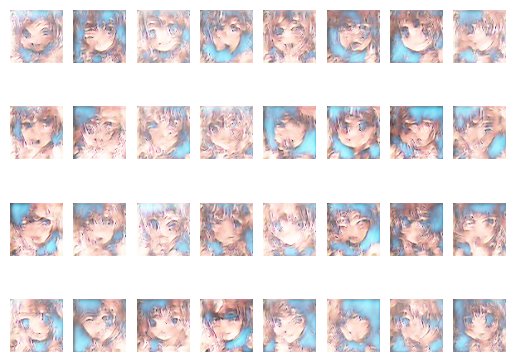

In [23]:
mygans.test_and_show()

In [24]:
mygans.training(1000)

Epochs: 1001
Current loss for discriminator: 0.5807511806488037
Current loss for generator: 1.6567879915237427
Epochs: 1002
Current loss for discriminator: 0.527848482131958
Current loss for generator: 2.0338070392608643
Epochs: 1003
Current loss for discriminator: 0.5545211434364319
Current loss for generator: 2.0737223625183105
Epochs: 1004
Current loss for discriminator: 0.5346912741661072
Current loss for generator: 1.9056553840637207
Epochs: 1005
Current loss for discriminator: 0.5639270544052124
Current loss for generator: 1.895256519317627
Epochs: 1006
Current loss for discriminator: 0.511452317237854
Current loss for generator: 2.1543617248535156
Epochs: 1007
Current loss for discriminator: 0.5555422902107239
Current loss for generator: 1.8157062530517578
Epochs: 1008
Current loss for discriminator: 0.7029141187667847
Current loss for generator: 2.8910322189331055
Epochs: 1009
Current loss for discriminator: 0.7803347706794739
Current loss for generator: 1.1998237371444702
Epoc

Current loss for discriminator: 0.63087397813797
Current loss for generator: 1.9120259284973145
Epochs: 1045
Current loss for discriminator: 0.5406497716903687
Current loss for generator: 1.6998088359832764
Epochs: 1046
Current loss for discriminator: 0.7136550545692444
Current loss for generator: 1.258636713027954
Epochs: 1047
Current loss for discriminator: 0.5085073709487915
Current loss for generator: 1.761993169784546
Epochs: 1048
Current loss for discriminator: 0.5572659969329834
Current loss for generator: 2.0212225914001465
Epochs: 1049
Current loss for discriminator: 0.49963635206222534
Current loss for generator: 2.0285332202911377
Epochs: 1050
Current loss for discriminator: 0.48282361030578613
Current loss for generator: 1.8032134771347046
Epochs: 1051
Current loss for discriminator: 0.5024527311325073
Current loss for generator: 2.237109422683716
Epochs: 1052
Current loss for discriminator: 0.5898269414901733
Current loss for generator: 1.3928673267364502
Epochs: 1053
Curr

Current loss for discriminator: 0.6481120586395264
Current loss for generator: 2.4532461166381836
Epochs: 1088
Current loss for discriminator: 0.5590875744819641
Current loss for generator: 1.8676629066467285
Epochs: 1089
Current loss for discriminator: 0.5275110602378845
Current loss for generator: 1.7498350143432617
Epochs: 1090
Current loss for discriminator: 0.5567864179611206
Current loss for generator: 2.560652494430542
Epochs: 1091
Current loss for discriminator: 0.880730926990509
Current loss for generator: 1.429581880569458
Epochs: 1092
Current loss for discriminator: 0.7600038647651672
Current loss for generator: 2.6757383346557617
Epochs: 1093
Current loss for discriminator: 0.4694656431674957
Current loss for generator: 2.1434662342071533
Epochs: 1094
Current loss for discriminator: 0.6207749843597412
Current loss for generator: 1.468324899673462
Epochs: 1095
Current loss for discriminator: 0.7570568323135376
Current loss for generator: 3.820263385772705
Epochs: 1096
Curren

Current loss for discriminator: 0.686842143535614
Current loss for generator: 2.430837869644165
Epochs: 1131
Current loss for discriminator: 0.45605748891830444
Current loss for generator: 1.7460377216339111
Epochs: 1132
Current loss for discriminator: 0.5354095697402954
Current loss for generator: 2.1106667518615723
Epochs: 1133
Current loss for discriminator: 0.5662709474563599
Current loss for generator: 2.31935453414917
Epochs: 1134
Current loss for discriminator: 0.48551294207572937
Current loss for generator: 1.9473991394042969
Epochs: 1135
Current loss for discriminator: 0.6239950656890869
Current loss for generator: 3.1143414974212646
Epochs: 1136
Current loss for discriminator: 0.8637183904647827
Current loss for generator: 0.3950590491294861
Epochs: 1137
Current loss for discriminator: 2.015540838241577
Current loss for generator: 5.671649932861328
Epochs: 1138
Current loss for discriminator: 2.88458514213562
Current loss for generator: 1.636641263961792
Epochs: 1139
Current 

Current loss for generator: 3.35945987701416
Epochs: 1174
Current loss for discriminator: 0.49824094772338867
Current loss for generator: 2.493886709213257
Epochs: 1175
Current loss for discriminator: 0.6483485102653503
Current loss for generator: 1.2371807098388672
Epochs: 1176
Current loss for discriminator: 1.1094204187393188
Current loss for generator: 4.898000240325928
Epochs: 1177
Current loss for discriminator: 1.732740044593811
Current loss for generator: 1.7449290752410889
Epochs: 1178
Current loss for discriminator: 0.45197805762290955
Current loss for generator: 1.3836143016815186
Epochs: 1179
Current loss for discriminator: 0.8596702218055725
Current loss for generator: 3.1522490978240967
Epochs: 1180
Current loss for discriminator: 0.7476494312286377
Current loss for generator: 2.0552239418029785
Epochs: 1181
Current loss for discriminator: 0.6064216494560242
Current loss for generator: 1.6236779689788818
Epochs: 1182
Current loss for discriminator: 0.9639558792114258
Curr

Current loss for generator: 0.6574772596359253
Epochs: 1217
Current loss for discriminator: 1.121763825416565
Current loss for generator: 2.5376877784729004
Epochs: 1218
Current loss for discriminator: 0.5357786417007446
Current loss for generator: 2.2780985832214355
Epochs: 1219
Current loss for discriminator: 0.6159794926643372
Current loss for generator: 1.3261587619781494
Epochs: 1220
Current loss for discriminator: 0.5714718103408813
Current loss for generator: 2.031385898590088
Epochs: 1221
Current loss for discriminator: 0.5428292751312256
Current loss for generator: 2.9191222190856934
Epochs: 1222
Current loss for discriminator: 0.6374507546424866
Current loss for generator: 1.6876013278961182
Epochs: 1223
Current loss for discriminator: 0.6869873404502869
Current loss for generator: 2.370121479034424
Epochs: 1224
Current loss for discriminator: 0.7327104806900024
Current loss for generator: 1.304736614227295
Epochs: 1225
Current loss for discriminator: 0.9180948734283447
Curre

Epochs: 1260
Current loss for discriminator: 0.714000940322876
Current loss for generator: 1.3071975708007812
Epochs: 1261
Current loss for discriminator: 0.822049617767334
Current loss for generator: 3.054640293121338
Epochs: 1262
Current loss for discriminator: 0.9342420101165771
Current loss for generator: 1.2722376585006714
Epochs: 1263
Current loss for discriminator: 0.7725560665130615
Current loss for generator: 2.7962546348571777
Epochs: 1264
Current loss for discriminator: 0.48473531007766724
Current loss for generator: 2.2542037963867188
Epochs: 1265
Current loss for discriminator: 0.48291948437690735
Current loss for generator: 1.5702866315841675
Epochs: 1266
Current loss for discriminator: 0.7115035057067871
Current loss for generator: 2.7067272663116455
Epochs: 1267
Current loss for discriminator: 0.555333137512207
Current loss for generator: 1.9497908353805542
Epochs: 1268
Current loss for discriminator: 0.699541449546814
Current loss for generator: 1.5582940578460693
Epoc

Current loss for discriminator: 0.751501202583313
Current loss for generator: 1.6255619525909424
Epochs: 1304
Current loss for discriminator: 0.4955986738204956
Current loss for generator: 2.567531108856201
Epochs: 1305
Current loss for discriminator: 0.4445788860321045
Current loss for generator: 2.7385926246643066
Epochs: 1306
Current loss for discriminator: 0.4712206721305847
Current loss for generator: 1.839733600616455
Epochs: 1307
Current loss for discriminator: 0.5412798523902893
Current loss for generator: 2.874145269393921
Epochs: 1308
Current loss for discriminator: 0.5729639530181885
Current loss for generator: 1.8473924398422241
Epochs: 1309
Current loss for discriminator: 0.5333026051521301
Current loss for generator: 1.5539859533309937
Epochs: 1310
Current loss for discriminator: 0.5455964803695679
Current loss for generator: 3.3999109268188477
Epochs: 1311
Current loss for discriminator: 0.8862946033477783
Current loss for generator: 1.36558997631073
Epochs: 1312
Current

Current loss for generator: 2.220243453979492
Epochs: 1347
Current loss for discriminator: 0.5927935838699341
Current loss for generator: 1.7427911758422852
Epochs: 1348
Current loss for discriminator: 0.5792399644851685
Current loss for generator: 2.1245899200439453
Epochs: 1349
Current loss for discriminator: 0.5910831689834595
Current loss for generator: 1.9819345474243164
Epochs: 1350
Current loss for discriminator: 0.5399219393730164
Current loss for generator: 1.7989559173583984
Epochs: 1351
Current loss for discriminator: 0.5289151072502136
Current loss for generator: 2.1917896270751953
Epochs: 1352
Current loss for discriminator: 0.45706483721733093
Current loss for generator: 2.1040124893188477
Epochs: 1353
Current loss for discriminator: 0.6284508109092712
Current loss for generator: 0.9660654067993164
Epochs: 1354
Current loss for discriminator: 0.6489680409431458
Current loss for generator: 3.269192934036255
Epochs: 1355
Current loss for discriminator: 0.8332699537277222
Cu

Current loss for generator: 2.188194751739502
Epochs: 1390
Current loss for discriminator: 0.5924452543258667
Current loss for generator: 1.6976938247680664
Epochs: 1391
Current loss for discriminator: 0.6384576559066772
Current loss for generator: 1.5664680004119873
Epochs: 1392
Current loss for discriminator: 0.6228551864624023
Current loss for generator: 1.9818816184997559
Epochs: 1393
Current loss for discriminator: 0.5842882394790649
Current loss for generator: 2.051342010498047
Epochs: 1394
Current loss for discriminator: 0.4381532669067383
Current loss for generator: 2.0474109649658203
Epochs: 1395
Current loss for discriminator: 0.5198043584823608
Current loss for generator: 1.7723839282989502
Epochs: 1396
Current loss for discriminator: 0.5084134340286255
Current loss for generator: 2.149413585662842
Epochs: 1397
Current loss for discriminator: 0.5232274532318115
Current loss for generator: 2.042665481567383
Epochs: 1398
Current loss for discriminator: 0.7433042526245117
Curre

Current loss for generator: 3.732239246368408
Epochs: 1433
Current loss for discriminator: 0.48383909463882446
Current loss for generator: 1.8287315368652344
Epochs: 1434
Current loss for discriminator: 0.6023493409156799
Current loss for generator: 2.3303513526916504
Epochs: 1435
Current loss for discriminator: 0.7238370180130005
Current loss for generator: 1.427192211151123
Epochs: 1436
Current loss for discriminator: 0.8281533718109131
Current loss for generator: 3.1143972873687744
Epochs: 1437
Current loss for discriminator: 1.1732494831085205
Current loss for generator: 0.7746145725250244
Epochs: 1438
Current loss for discriminator: 0.9816608428955078
Current loss for generator: 3.484722852706909
Epochs: 1439
Current loss for discriminator: 0.8658565282821655
Current loss for generator: 2.0429232120513916
Epochs: 1440
Current loss for discriminator: 0.8022264838218689
Current loss for generator: 1.9613852500915527
Epochs: 1441
Current loss for discriminator: 0.9046159386634827
Cur

Current loss for generator: 0.6947348713874817
Epochs: 1476
Current loss for discriminator: 0.812760055065155
Current loss for generator: 2.5197529792785645
Epochs: 1477
Current loss for discriminator: 0.4353504180908203
Current loss for generator: 2.505070686340332
Epochs: 1478
Current loss for discriminator: 0.6485924124717712
Current loss for generator: 1.7576299905776978
Epochs: 1479
Current loss for discriminator: 0.6484208106994629
Current loss for generator: 2.5918211936950684
Epochs: 1480
Current loss for discriminator: 0.7479762434959412
Current loss for generator: 1.3188928365707397
Epochs: 1481
Current loss for discriminator: 0.615830659866333
Current loss for generator: 3.036668300628662
Epochs: 1482
Current loss for discriminator: 0.6702085137367249
Current loss for generator: 1.657509207725525
Epochs: 1483
Current loss for discriminator: 0.5575889348983765
Current loss for generator: 2.40938138961792
Epochs: 1484
Current loss for discriminator: 0.5031315088272095
Current 

Current loss for generator: 1.794857144355774
Epochs: 1519
Current loss for discriminator: 0.454383909702301
Current loss for generator: 3.0851120948791504
Epochs: 1520
Current loss for discriminator: 0.7291750311851501
Current loss for generator: 1.5226120948791504
Epochs: 1521
Current loss for discriminator: 0.5973032712936401
Current loss for generator: 2.199390172958374
Epochs: 1522
Current loss for discriminator: 0.5331535935401917
Current loss for generator: 1.5559625625610352
Epochs: 1523
Current loss for discriminator: 0.5295915603637695
Current loss for generator: 2.6213088035583496
Epochs: 1524
Current loss for discriminator: 0.6284209489822388
Current loss for generator: 1.3241841793060303
Epochs: 1525
Current loss for discriminator: 0.6903089284896851
Current loss for generator: 1.8716779947280884
Epochs: 1526
Current loss for discriminator: 0.5092132091522217
Current loss for generator: 2.309603452682495
Epochs: 1527
Current loss for discriminator: 0.4888223111629486
Curre

Current loss for generator: 2.326380729675293
Epochs: 1562
Current loss for discriminator: 0.49260199069976807
Current loss for generator: 2.1449007987976074
Epochs: 1563
Current loss for discriminator: 0.560002326965332
Current loss for generator: 1.5295789241790771
Epochs: 1564
Current loss for discriminator: 0.7792805433273315
Current loss for generator: 3.5424461364746094
Epochs: 1565
Current loss for discriminator: 1.126736044883728
Current loss for generator: 0.7850862741470337
Epochs: 1566
Current loss for discriminator: 1.0898419618606567
Current loss for generator: 4.298243999481201
Epochs: 1567
Current loss for discriminator: 1.159279704093933
Current loss for generator: 2.2259609699249268
Epochs: 1568
Current loss for discriminator: 0.5843536853790283
Current loss for generator: 0.831068754196167
Epochs: 1569
Current loss for discriminator: 0.9826062917709351
Current loss for generator: 2.2455930709838867
Epochs: 1570
Current loss for discriminator: 0.5701629519462585
Curren

Current loss for generator: 2.048365592956543
Epochs: 1605
Current loss for discriminator: 0.4732091724872589
Current loss for generator: 2.346919059753418
Epochs: 1606
Current loss for discriminator: 0.7008998990058899
Current loss for generator: 1.4843780994415283
Epochs: 1607
Current loss for discriminator: 0.4907993674278259
Current loss for generator: 2.3089089393615723
Epochs: 1608
Current loss for discriminator: 0.4384755790233612
Current loss for generator: 2.1993355751037598
Epochs: 1609
Current loss for discriminator: 0.4876354932785034
Current loss for generator: 1.5334612131118774
Epochs: 1610
Current loss for discriminator: 0.4434688687324524
Current loss for generator: 2.695646286010742
Epochs: 1611
Current loss for discriminator: 0.5860182046890259
Current loss for generator: 1.2799692153930664
Epochs: 1612
Current loss for discriminator: 0.5840650796890259
Current loss for generator: 2.6237988471984863
Epochs: 1613
Current loss for discriminator: 0.4279343783855438
Curr

Current loss for generator: 3.2758073806762695
Epochs: 1648
Current loss for discriminator: 0.7879406809806824
Current loss for generator: 1.072345495223999
Epochs: 1649
Current loss for discriminator: 0.9625387787818909
Current loss for generator: 4.310061454772949
Epochs: 1650
Current loss for discriminator: 1.1680172681808472
Current loss for generator: 1.6327588558197021
Epochs: 1651
Current loss for discriminator: 0.6563752889633179
Current loss for generator: 1.3127896785736084
Epochs: 1652
Current loss for discriminator: 0.6244138479232788
Current loss for generator: 2.9144272804260254
Epochs: 1653
Current loss for discriminator: 0.5145875215530396
Current loss for generator: 2.2454135417938232
Epochs: 1654
Current loss for discriminator: 0.42771172523498535
Current loss for generator: 1.6504688262939453
Epochs: 1655
Current loss for discriminator: 0.40739044547080994
Current loss for generator: 2.4374403953552246
Epochs: 1656
Current loss for discriminator: 0.4855232834815979
C

Current loss for generator: 1.5935120582580566
Epochs: 1691
Current loss for discriminator: 0.833049476146698
Current loss for generator: 2.9764835834503174
Epochs: 1692
Current loss for discriminator: 0.7853193879127502
Current loss for generator: 1.8359603881835938
Epochs: 1693
Current loss for discriminator: 0.4643142819404602
Current loss for generator: 2.0789408683776855
Epochs: 1694
Current loss for discriminator: 0.49519777297973633
Current loss for generator: 2.3242075443267822
Epochs: 1695
Current loss for discriminator: 0.6694297194480896
Current loss for generator: 1.779318928718567
Epochs: 1696
Current loss for discriminator: 0.5048036575317383
Current loss for generator: 2.6335034370422363
Epochs: 1697
Current loss for discriminator: 0.392301082611084
Current loss for generator: 2.221865653991699
Epochs: 1698
Current loss for discriminator: 0.46199044585227966
Current loss for generator: 1.7314823865890503
Epochs: 1699
Current loss for discriminator: 0.4866226315498352
Cur

Current loss for generator: 1.7344249486923218
Epochs: 1734
Current loss for discriminator: 0.44529736042022705
Current loss for generator: 2.3892159461975098
Epochs: 1735
Current loss for discriminator: 0.34847497940063477
Current loss for generator: 2.421156644821167
Epochs: 1736
Current loss for discriminator: 0.38632822036743164
Current loss for generator: 2.058443069458008
Epochs: 1737
Current loss for discriminator: 0.3653341233730316
Current loss for generator: 2.547344207763672
Epochs: 1738
Current loss for discriminator: 0.41800743341445923
Current loss for generator: 2.510495185852051
Epochs: 1739
Current loss for discriminator: 0.7025482654571533
Current loss for generator: 1.287207841873169
Epochs: 1740
Current loss for discriminator: 1.5320580005645752
Current loss for generator: 5.171082496643066
Epochs: 1741
Current loss for discriminator: 2.27073335647583
Current loss for generator: 0.9536203145980835
Epochs: 1742
Current loss for discriminator: 1.2345150709152222
Curre

Current loss for generator: 2.209634304046631
Epochs: 1777
Current loss for discriminator: 0.5385349988937378
Current loss for generator: 2.5054244995117188
Epochs: 1778
Current loss for discriminator: 0.6178449392318726
Current loss for generator: 1.4897311925888062
Epochs: 1779
Current loss for discriminator: 0.7965303659439087
Current loss for generator: 2.2053802013397217
Epochs: 1780
Current loss for discriminator: 0.4677032232284546
Current loss for generator: 2.456573486328125
Epochs: 1781
Current loss for discriminator: 0.4075920581817627
Current loss for generator: 2.149672031402588
Epochs: 1782
Current loss for discriminator: 0.3961114287376404
Current loss for generator: 1.9437650442123413
Epochs: 1783
Current loss for discriminator: 0.38127538561820984
Current loss for generator: 2.074012041091919
Epochs: 1784
Current loss for discriminator: 0.41031092405319214
Current loss for generator: 2.849132537841797
Epochs: 1785
Current loss for discriminator: 0.4721209406852722
Curr

Current loss for generator: 1.4706073999404907
Epochs: 1820
Current loss for discriminator: 0.5496078729629517
Current loss for generator: 2.4149065017700195
Epochs: 1821
Current loss for discriminator: 0.59145188331604
Current loss for generator: 1.8076109886169434
Epochs: 1822
Current loss for discriminator: 0.5303635597229004
Current loss for generator: 1.710109829902649
Epochs: 1823
Current loss for discriminator: 0.5183892250061035
Current loss for generator: 1.7494417428970337
Epochs: 1824
Current loss for discriminator: 0.39156466722488403
Current loss for generator: 2.1796398162841797
Epochs: 1825
Current loss for discriminator: 0.5903095006942749
Current loss for generator: 1.5543570518493652
Epochs: 1826
Current loss for discriminator: 0.5510538816452026
Current loss for generator: 2.3545260429382324
Epochs: 1827
Current loss for discriminator: 0.499752938747406
Current loss for generator: 1.9634623527526855
Epochs: 1828
Current loss for discriminator: 0.4082382917404175
Curr

Current loss for generator: 2.653592109680176
Epochs: 1863
Current loss for discriminator: 0.4370289146900177
Current loss for generator: 3.6188173294067383
Epochs: 1864
Current loss for discriminator: 1.0122814178466797
Current loss for generator: 0.3894163966178894
Epochs: 1865
Current loss for discriminator: 2.4304356575012207
Current loss for generator: 7.610846519470215
Epochs: 1866
Current loss for discriminator: 5.200191497802734
Current loss for generator: 2.903472423553467
Epochs: 1867
Current loss for discriminator: 1.2361325025558472
Current loss for generator: 0.2437908947467804
Epochs: 1868
Current loss for discriminator: 2.0602755546569824
Current loss for generator: 1.33309805393219
Epochs: 1869
Current loss for discriminator: 0.7118360996246338
Current loss for generator: 2.3769683837890625
Epochs: 1870
Current loss for discriminator: 0.8343308568000793
Current loss for generator: 1.607532024383545
Epochs: 1871
Current loss for discriminator: 0.7082662582397461
Current 

Epochs: 1906
Current loss for discriminator: 0.43582263588905334
Current loss for generator: 1.7194304466247559
Epochs: 1907
Current loss for discriminator: 0.49293071031570435
Current loss for generator: 2.4950082302093506
Epochs: 1908
Current loss for discriminator: 0.4464435279369354
Current loss for generator: 2.428767681121826
Epochs: 1909
Current loss for discriminator: 0.5995323657989502
Current loss for generator: 1.2503869533538818
Epochs: 1910
Current loss for discriminator: 0.679515540599823
Current loss for generator: 3.3262810707092285
Epochs: 1911
Current loss for discriminator: 0.6712193489074707
Current loss for generator: 1.5766112804412842
Epochs: 1912
Current loss for discriminator: 0.5755645632743835
Current loss for generator: 2.018604278564453
Epochs: 1913
Current loss for discriminator: 0.7966355681419373
Current loss for generator: 2.6138863563537598
Epochs: 1914
Current loss for discriminator: 0.6346588134765625
Current loss for generator: 1.518264889717102
Epo

Epochs: 1949
Current loss for discriminator: 0.6905795335769653
Current loss for generator: 1.4936020374298096
Epochs: 1950
Current loss for discriminator: 0.6033414602279663
Current loss for generator: 2.7181997299194336
Epochs: 1951
Current loss for discriminator: 0.9189742207527161
Current loss for generator: 0.7261086702346802
Epochs: 1952
Current loss for discriminator: 1.074387550354004
Current loss for generator: 3.5232648849487305
Epochs: 1953
Current loss for discriminator: 1.1763633489608765
Current loss for generator: 1.4311609268188477
Epochs: 1954
Current loss for discriminator: 0.647334098815918
Current loss for generator: 1.270585060119629
Epochs: 1955
Current loss for discriminator: 0.6017172336578369
Current loss for generator: 2.581160545349121
Epochs: 1956
Current loss for discriminator: 0.6712543964385986
Current loss for generator: 1.656714916229248
Epochs: 1957
Current loss for discriminator: 0.5559033155441284
Current loss for generator: 1.8971343040466309
Epochs

Epochs: 1992
Current loss for discriminator: 0.7080686092376709
Current loss for generator: 2.8290815353393555
Epochs: 1993
Current loss for discriminator: 0.4516017436981201
Current loss for generator: 1.8032209873199463
Epochs: 1994
Current loss for discriminator: 0.5407834649085999
Current loss for generator: 2.230372428894043
Epochs: 1995
Current loss for discriminator: 0.5314496755599976
Current loss for generator: 2.0299413204193115
Epochs: 1996
Current loss for discriminator: 0.43557798862457275
Current loss for generator: 2.207625389099121
Epochs: 1997
Current loss for discriminator: 0.34933599829673767
Current loss for generator: 2.8928654193878174
Epochs: 1998
Current loss for discriminator: 0.36598724126815796
Current loss for generator: 2.3556160926818848
Epochs: 1999
Current loss for discriminator: 0.49760115146636963
Current loss for generator: 2.389572858810425
Epochs: 2000
Current loss for discriminator: 0.5584545731544495
Current loss for generator: 1.6131960153579712


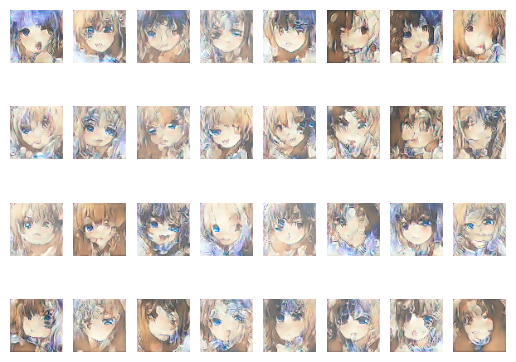

In [25]:
mygans.test_and_show()

In [26]:
mygans.training(1000)

Epochs: 2001
Current loss for discriminator: 0.41902145743370056
Current loss for generator: 3.627819299697876
Epochs: 2002
Current loss for discriminator: 0.6037311553955078
Current loss for generator: 0.9996827840805054
Epochs: 2003
Current loss for discriminator: 1.2823469638824463
Current loss for generator: 7.139842510223389
Epochs: 2004
Current loss for discriminator: 3.114122152328491
Current loss for generator: 0.6145728230476379
Epochs: 2005
Current loss for discriminator: 1.195496678352356
Current loss for generator: 2.384829044342041
Epochs: 2006
Current loss for discriminator: 0.35096633434295654
Current loss for generator: 3.043640613555908
Epochs: 2007
Current loss for discriminator: 0.5943489074707031
Current loss for generator: 1.5089722871780396
Epochs: 2008
Current loss for discriminator: 0.8647984862327576
Current loss for generator: 2.041926383972168
Epochs: 2009
Current loss for discriminator: 0.7442187070846558
Current loss for generator: 2.019806385040283
Epochs:

Current loss for discriminator: 0.5825644135475159
Current loss for generator: 3.449469804763794
Epochs: 2045
Current loss for discriminator: 0.5367604494094849
Current loss for generator: 1.565882682800293
Epochs: 2046
Current loss for discriminator: 0.4630865752696991
Current loss for generator: 3.0791871547698975
Epochs: 2047
Current loss for discriminator: 0.38761237263679504
Current loss for generator: 2.1361470222473145
Epochs: 2048
Current loss for discriminator: 0.37601369619369507
Current loss for generator: 2.8584725856781006
Epochs: 2049
Current loss for discriminator: 0.4083161950111389
Current loss for generator: 2.654768943786621
Epochs: 2050
Current loss for discriminator: 0.5139496326446533
Current loss for generator: 3.071928024291992
Epochs: 2051
Current loss for discriminator: 0.18262216448783875
Current loss for generator: 3.423616409301758
Epochs: 2052
Current loss for discriminator: 0.3563392758369446
Current loss for generator: 2.078127145767212
Epochs: 2053
Curr

Current loss for discriminator: 0.5096931457519531
Current loss for generator: 1.5515923500061035
Epochs: 2088
Current loss for discriminator: 0.4287579357624054
Current loss for generator: 2.3383302688598633
Epochs: 2089
Current loss for discriminator: 0.46350419521331787
Current loss for generator: 2.1782283782958984
Epochs: 2090
Current loss for discriminator: 0.4258541464805603
Current loss for generator: 2.3150181770324707
Epochs: 2091
Current loss for discriminator: 0.42783278226852417
Current loss for generator: 1.5487053394317627
Epochs: 2092
Current loss for discriminator: 0.511526882648468
Current loss for generator: 2.536369800567627
Epochs: 2093
Current loss for discriminator: 0.47258472442626953
Current loss for generator: 1.5900037288665771
Epochs: 2094
Current loss for discriminator: 0.46446463465690613
Current loss for generator: 2.368443489074707
Epochs: 2095
Current loss for discriminator: 0.43951210379600525
Current loss for generator: 1.974185585975647
Epochs: 2096


Current loss for discriminator: 0.6010247468948364
Current loss for generator: 2.582482099533081
Epochs: 2131
Current loss for discriminator: 0.5850112438201904
Current loss for generator: 1.4477386474609375
Epochs: 2132
Current loss for discriminator: 0.5146777629852295
Current loss for generator: 2.7603533267974854
Epochs: 2133
Current loss for discriminator: 0.39846092462539673
Current loss for generator: 2.3353891372680664
Epochs: 2134
Current loss for discriminator: 0.5229215621948242
Current loss for generator: 1.8890622854232788
Epochs: 2135
Current loss for discriminator: 0.4639059603214264
Current loss for generator: 2.2484874725341797
Epochs: 2136
Current loss for discriminator: 0.5422276258468628
Current loss for generator: 1.9703662395477295
Epochs: 2137
Current loss for discriminator: 0.6739223003387451
Current loss for generator: 2.757922410964966
Epochs: 2138
Current loss for discriminator: 0.610995888710022
Current loss for generator: 2.2164676189422607
Epochs: 2139
Cur

Current loss for generator: 2.676023006439209
Epochs: 2174
Current loss for discriminator: 0.7188431024551392
Current loss for generator: 1.8175071477890015
Epochs: 2175
Current loss for discriminator: 0.6421260833740234
Current loss for generator: 3.0859391689300537
Epochs: 2176
Current loss for discriminator: 0.5519524812698364
Current loss for generator: 2.1126692295074463
Epochs: 2177
Current loss for discriminator: 0.3546740710735321
Current loss for generator: 2.0980653762817383
Epochs: 2178
Current loss for discriminator: 0.409475177526474
Current loss for generator: 2.79518985748291
Epochs: 2179
Current loss for discriminator: 0.39894619584083557
Current loss for generator: 2.122255563735962
Epochs: 2180
Current loss for discriminator: 0.5536425709724426
Current loss for generator: 2.679586887359619
Epochs: 2181
Current loss for discriminator: 0.489137202501297
Current loss for generator: 2.1336631774902344
Epochs: 2182
Current loss for discriminator: 0.5795761346817017
Current

Epochs: 2217
Current loss for discriminator: 0.5623417496681213
Current loss for generator: 1.9019945859909058
Epochs: 2218
Current loss for discriminator: 0.3962036371231079
Current loss for generator: 2.0285825729370117
Epochs: 2219
Current loss for discriminator: 0.4904717803001404
Current loss for generator: 2.401195526123047
Epochs: 2220
Current loss for discriminator: 0.41776084899902344
Current loss for generator: 2.0791947841644287
Epochs: 2221
Current loss for discriminator: 0.47727519273757935
Current loss for generator: 2.015890598297119
Epochs: 2222
Current loss for discriminator: 0.3899232745170593
Current loss for generator: 1.9282431602478027
Epochs: 2223
Current loss for discriminator: 0.5104615092277527
Current loss for generator: 2.139836311340332
Epochs: 2224
Current loss for discriminator: 0.4171960651874542
Current loss for generator: 2.1657581329345703
Epochs: 2225
Current loss for discriminator: 0.5730303525924683
Current loss for generator: 2.0942726135253906
Ep

Epochs: 2260
Current loss for discriminator: 0.4235260486602783
Current loss for generator: 3.775548219680786
Epochs: 2261
Current loss for discriminator: 0.44506916403770447
Current loss for generator: 1.3529996871948242
Epochs: 2262
Current loss for discriminator: 0.8070939779281616
Current loss for generator: 6.167090892791748
Epochs: 2263
Current loss for discriminator: 2.0216569900512695
Current loss for generator: 0.9357144832611084
Epochs: 2264
Current loss for discriminator: 0.8108287453651428
Current loss for generator: 1.9378079175949097
Epochs: 2265
Current loss for discriminator: 0.4248273968696594
Current loss for generator: 3.4615731239318848
Epochs: 2266
Current loss for discriminator: 0.6591426134109497
Current loss for generator: 1.977071762084961
Epochs: 2267
Current loss for discriminator: 0.4411807358264923
Current loss for generator: 2.1342968940734863
Epochs: 2268
Current loss for discriminator: 0.3913521468639374
Current loss for generator: 2.8017449378967285
Epo

Epochs: 2303
Current loss for discriminator: 0.28451377153396606
Current loss for generator: 2.625682830810547
Epochs: 2304
Current loss for discriminator: 0.21714293956756592
Current loss for generator: 2.9930293560028076
Epochs: 2305
Current loss for discriminator: 0.384211927652359
Current loss for generator: 2.6079797744750977
Epochs: 2306
Current loss for discriminator: 0.634773313999176
Current loss for generator: 2.293386697769165
Epochs: 2307
Current loss for discriminator: 0.5810580253601074
Current loss for generator: 5.977581977844238
Epochs: 2308
Current loss for discriminator: 1.9892985820770264
Current loss for generator: 0.6232895255088806
Epochs: 2309
Current loss for discriminator: 1.4233261346817017
Current loss for generator: 3.5047216415405273
Epochs: 2310
Current loss for discriminator: 0.569435715675354
Current loss for generator: 2.663642168045044
Epochs: 2311
Current loss for discriminator: 0.4003636837005615
Current loss for generator: 1.7384353876113892
Epochs

Epochs: 2346
Current loss for discriminator: 0.7262890934944153
Current loss for generator: 1.6199837923049927
Epochs: 2347
Current loss for discriminator: 0.5800133347511292
Current loss for generator: 1.677532434463501
Epochs: 2348
Current loss for discriminator: 0.6074628233909607
Current loss for generator: 1.897451639175415
Epochs: 2349
Current loss for discriminator: 0.5563332438468933
Current loss for generator: 1.9348385334014893
Epochs: 2350
Current loss for discriminator: 0.5764940977096558
Current loss for generator: 1.7876936197280884
Epochs: 2351
Current loss for discriminator: 0.4763049781322479
Current loss for generator: 2.3056578636169434
Epochs: 2352
Current loss for discriminator: 0.4523361325263977
Current loss for generator: 2.316542625427246
Epochs: 2353
Current loss for discriminator: 0.36231568455696106
Current loss for generator: 2.1132259368896484
Epochs: 2354
Current loss for discriminator: 0.41632527112960815
Current loss for generator: 2.4476280212402344
Ep

Epochs: 2389
Current loss for discriminator: 0.4715837836265564
Current loss for generator: 2.279911518096924
Epochs: 2390
Current loss for discriminator: 0.5699185729026794
Current loss for generator: 1.9431993961334229
Epochs: 2391
Current loss for discriminator: 0.5604947209358215
Current loss for generator: 2.553494453430176
Epochs: 2392
Current loss for discriminator: 0.5597686767578125
Current loss for generator: 2.544895887374878
Epochs: 2393
Current loss for discriminator: 0.47232210636138916
Current loss for generator: 2.02840518951416
Epochs: 2394
Current loss for discriminator: 0.388420045375824
Current loss for generator: 1.837911605834961
Epochs: 2395
Current loss for discriminator: 0.4600752592086792
Current loss for generator: 1.828078269958496
Epochs: 2396
Current loss for discriminator: 0.5020224452018738
Current loss for generator: 2.4456145763397217
Epochs: 2397
Current loss for discriminator: 0.6169552803039551
Current loss for generator: 1.441983938217163
Epochs: 2

Current loss for discriminator: 0.6170645952224731
Current loss for generator: 3.4020328521728516
Epochs: 2433
Current loss for discriminator: 0.5068144202232361
Current loss for generator: 2.4057388305664062
Epochs: 2434
Current loss for discriminator: 0.3883194625377655
Current loss for generator: 2.3641726970672607
Epochs: 2435
Current loss for discriminator: 0.30276966094970703
Current loss for generator: 2.633455276489258
Epochs: 2436
Current loss for discriminator: 0.2926294803619385
Current loss for generator: 2.3061165809631348
Epochs: 2437
Current loss for discriminator: 0.41006430983543396
Current loss for generator: 2.422133445739746
Epochs: 2438
Current loss for discriminator: 0.38748982548713684
Current loss for generator: 2.33341908454895
Epochs: 2439
Current loss for discriminator: 0.3416914939880371
Current loss for generator: 2.4923555850982666
Epochs: 2440
Current loss for discriminator: 0.5563820600509644
Current loss for generator: 2.6292524337768555
Epochs: 2441
Cu

Current loss for discriminator: 0.2945322096347809
Current loss for generator: 1.7400720119476318
Epochs: 2476
Current loss for discriminator: 0.47625210881233215
Current loss for generator: 4.417362213134766
Epochs: 2477
Current loss for discriminator: 0.9478071928024292
Current loss for generator: 1.5949039459228516
Epochs: 2478
Current loss for discriminator: 0.6277597546577454
Current loss for generator: 3.513521194458008
Epochs: 2479
Current loss for discriminator: 0.5140876770019531
Current loss for generator: 2.802328109741211
Epochs: 2480
Current loss for discriminator: 0.5158068537712097
Current loss for generator: 1.5412847995758057
Epochs: 2481
Current loss for discriminator: 0.5870095491409302
Current loss for generator: 4.060863494873047
Epochs: 2482
Current loss for discriminator: 0.5125030875205994
Current loss for generator: 2.9114255905151367
Epochs: 2483
Current loss for discriminator: 0.48039984703063965
Current loss for generator: 2.9652812480926514
Epochs: 2484
Cur

Current loss for discriminator: 0.3514469265937805
Current loss for generator: 1.8128694295883179
Epochs: 2519
Current loss for discriminator: 0.44130340218544006
Current loss for generator: 3.519869327545166
Epochs: 2520
Current loss for discriminator: 0.5459156632423401
Current loss for generator: 2.4185166358947754
Epochs: 2521
Current loss for discriminator: 0.6371568441390991
Current loss for generator: 2.3641295433044434
Epochs: 2522
Current loss for discriminator: 0.43861180543899536
Current loss for generator: 2.744034767150879
Epochs: 2523
Current loss for discriminator: 0.39150556921958923
Current loss for generator: 3.101114511489868
Epochs: 2524
Current loss for discriminator: 0.37417519092559814
Current loss for generator: 1.8829851150512695
Epochs: 2525
Current loss for discriminator: 0.6901117563247681
Current loss for generator: 4.454492092132568
Epochs: 2526
Current loss for discriminator: 0.8820925951004028
Current loss for generator: 0.5916460752487183
Epochs: 2527
C

Current loss for discriminator: 0.6716195344924927
Current loss for generator: 5.810305595397949
Epochs: 2562
Current loss for discriminator: 1.1305989027023315
Current loss for generator: 1.0167405605316162
Epochs: 2563
Current loss for discriminator: 1.2265074253082275
Current loss for generator: 6.03024959564209
Epochs: 2564
Current loss for discriminator: 1.3769217729568481
Current loss for generator: 2.6039605140686035
Epochs: 2565
Current loss for discriminator: 0.5260293483734131
Current loss for generator: 1.7228443622589111
Epochs: 2566
Current loss for discriminator: 0.7095602750778198
Current loss for generator: 3.574232578277588
Epochs: 2567
Current loss for discriminator: 0.8014630079269409
Current loss for generator: 2.0410447120666504
Epochs: 2568
Current loss for discriminator: 0.5409950017929077
Current loss for generator: 2.061459541320801
Epochs: 2569
Current loss for discriminator: 0.604921281337738
Current loss for generator: 2.7761240005493164
Epochs: 2570
Current

Current loss for discriminator: 0.7237011790275574
Current loss for generator: 3.111523151397705
Epochs: 2605
Current loss for discriminator: 0.5700106024742126
Current loss for generator: 2.8880257606506348
Epochs: 2606
Current loss for discriminator: 0.6681807041168213
Current loss for generator: 1.3895506858825684
Epochs: 2607
Current loss for discriminator: 0.9626333117485046
Current loss for generator: 3.5501534938812256
Epochs: 2608
Current loss for discriminator: 0.7269569039344788
Current loss for generator: 2.438762903213501
Epochs: 2609
Current loss for discriminator: 0.7213347554206848
Current loss for generator: 0.7906279563903809
Epochs: 2610
Current loss for discriminator: 0.727621853351593
Current loss for generator: 2.2366349697113037
Epochs: 2611
Current loss for discriminator: 0.4134353995323181
Current loss for generator: 2.8830103874206543
Epochs: 2612
Current loss for discriminator: 0.46887364983558655
Current loss for generator: 2.0120291709899902
Epochs: 2613
Cur

Current loss for discriminator: 0.9023696184158325
Current loss for generator: 2.5112528800964355
Epochs: 2648
Current loss for discriminator: 0.2989346385002136
Current loss for generator: 2.691722869873047
Epochs: 2649
Current loss for discriminator: 0.286316841840744
Current loss for generator: 2.7714381217956543
Epochs: 2650
Current loss for discriminator: 0.35232973098754883
Current loss for generator: 2.37962007522583
Epochs: 2651
Current loss for discriminator: 0.2939189672470093
Current loss for generator: 2.753537178039551
Epochs: 2652
Current loss for discriminator: 0.4097111225128174
Current loss for generator: 2.812833547592163
Epochs: 2653
Current loss for discriminator: 0.4431864023208618
Current loss for generator: 2.506080150604248
Epochs: 2654
Current loss for discriminator: 0.6617908477783203
Current loss for generator: 2.847700834274292
Epochs: 2655
Current loss for discriminator: 0.41895702481269836
Current loss for generator: 2.2027204036712646
Epochs: 2656
Current

Current loss for discriminator: 0.32655006647109985
Current loss for generator: 2.126086473464966
Epochs: 2691
Current loss for discriminator: 0.4309418499469757
Current loss for generator: 2.65602970123291
Epochs: 2692
Current loss for discriminator: 0.33770686388015747
Current loss for generator: 3.147139549255371
Epochs: 2693
Current loss for discriminator: 0.5280755162239075
Current loss for generator: 1.38960862159729
Epochs: 2694
Current loss for discriminator: 0.8128801584243774
Current loss for generator: 5.860551834106445
Epochs: 2695
Current loss for discriminator: 1.752956509590149
Current loss for generator: 0.8255324363708496
Epochs: 2696
Current loss for discriminator: 1.0315057039260864
Current loss for generator: 3.408203363418579
Epochs: 2697
Current loss for discriminator: 0.47494474053382874
Current loss for generator: 3.20070219039917
Epochs: 2698
Current loss for discriminator: 0.2829447388648987
Current loss for generator: 2.2193655967712402
Epochs: 2699
Current l

Current loss for discriminator: 0.6226374506950378
Current loss for generator: 2.1425440311431885
Epochs: 2734
Current loss for discriminator: 0.8533402681350708
Current loss for generator: 5.967968940734863
Epochs: 2735
Current loss for discriminator: 1.3542625904083252
Current loss for generator: 1.6880419254302979
Epochs: 2736
Current loss for discriminator: 0.9808958172798157
Current loss for generator: 4.014789581298828
Epochs: 2737
Current loss for discriminator: 0.41043996810913086
Current loss for generator: 3.4454448223114014
Epochs: 2738
Current loss for discriminator: 0.3962911367416382
Current loss for generator: 1.2271959781646729
Epochs: 2739
Current loss for discriminator: 1.395483374595642
Current loss for generator: 6.218155860900879
Epochs: 2740
Current loss for discriminator: 2.2237679958343506
Current loss for generator: 2.331699848175049
Epochs: 2741
Current loss for discriminator: 0.5119478106498718
Current loss for generator: 1.336330533027649
Epochs: 2742
Curren

Current loss for generator: 1.1819050312042236
Epochs: 2777
Current loss for discriminator: 0.8068628311157227
Current loss for generator: 3.341925621032715
Epochs: 2778
Current loss for discriminator: 0.3971169590950012
Current loss for generator: 2.874077796936035
Epochs: 2779
Current loss for discriminator: 0.5421541333198547
Current loss for generator: 1.5792231559753418
Epochs: 2780
Current loss for discriminator: 0.5215597748756409
Current loss for generator: 2.0263113975524902
Epochs: 2781
Current loss for discriminator: 0.5042219758033752
Current loss for generator: 2.920191764831543
Epochs: 2782
Current loss for discriminator: 0.45259934663772583
Current loss for generator: 2.220510482788086
Epochs: 2783
Current loss for discriminator: 0.3744455575942993
Current loss for generator: 1.9433469772338867
Epochs: 2784
Current loss for discriminator: 0.4717913866043091
Current loss for generator: 2.7200191020965576
Epochs: 2785
Current loss for discriminator: 0.31280744075775146
Cur

Current loss for generator: 2.008315324783325
Epochs: 2820
Current loss for discriminator: 0.3322805166244507
Current loss for generator: 2.9229581356048584
Epochs: 2821
Current loss for discriminator: 0.34556394815444946
Current loss for generator: 2.2919392585754395
Epochs: 2822
Current loss for discriminator: 0.3899955749511719
Current loss for generator: 2.1755802631378174
Epochs: 2823
Current loss for discriminator: 0.33814704418182373
Current loss for generator: 3.74216365814209
Epochs: 2824
Current loss for discriminator: 0.5089973211288452
Current loss for generator: 1.8493791818618774
Epochs: 2825
Current loss for discriminator: 0.4937649071216583
Current loss for generator: 3.226665496826172
Epochs: 2826
Current loss for discriminator: 0.28372588753700256
Current loss for generator: 3.6586530208587646
Epochs: 2827
Current loss for discriminator: 0.35679179430007935
Current loss for generator: 2.4986679553985596
Epochs: 2828
Current loss for discriminator: 0.45147043466567993


Current loss for generator: 1.8510699272155762
Epochs: 2863
Current loss for discriminator: 0.60987389087677
Current loss for generator: 2.419271469116211
Epochs: 2864
Current loss for discriminator: 0.32663077116012573
Current loss for generator: 2.9972047805786133
Epochs: 2865
Current loss for discriminator: 0.439422070980072
Current loss for generator: 2.4954819679260254
Epochs: 2866
Current loss for discriminator: 0.4141883850097656
Current loss for generator: 2.615814208984375
Epochs: 2867
Current loss for discriminator: 0.31454944610595703
Current loss for generator: 2.745471477508545
Epochs: 2868
Current loss for discriminator: 0.36774811148643494
Current loss for generator: 2.7840206623077393
Epochs: 2869
Current loss for discriminator: 0.5611523389816284
Current loss for generator: 2.8534650802612305
Epochs: 2870
Current loss for discriminator: 0.49568378925323486
Current loss for generator: 4.822303295135498
Epochs: 2871
Current loss for discriminator: 0.5004116892814636
Curr

Epochs: 2906
Current loss for discriminator: 0.4702831506729126
Current loss for generator: 2.44738507270813
Epochs: 2907
Current loss for discriminator: 0.2799687087535858
Current loss for generator: 3.075387716293335
Epochs: 2908
Current loss for discriminator: 0.35560745000839233
Current loss for generator: 2.2482352256774902
Epochs: 2909
Current loss for discriminator: 0.7000710964202881
Current loss for generator: 1.9899826049804688
Epochs: 2910
Current loss for discriminator: 0.5483456254005432
Current loss for generator: 3.0704336166381836
Epochs: 2911
Current loss for discriminator: 0.6587672233581543
Current loss for generator: 1.8028863668441772
Epochs: 2912
Current loss for discriminator: 0.5290595293045044
Current loss for generator: 2.108724594116211
Epochs: 2913
Current loss for discriminator: 0.3949962854385376
Current loss for generator: 2.6860382556915283
Epochs: 2914
Current loss for discriminator: 0.3343391418457031
Current loss for generator: 2.719545841217041
Epoch

Current loss for discriminator: 0.5346078872680664
Current loss for generator: 2.987246036529541
Epochs: 2950
Current loss for discriminator: 0.37552815675735474
Current loss for generator: 2.955059766769409
Epochs: 2951
Current loss for discriminator: 0.5910838842391968
Current loss for generator: 2.8118746280670166
Epochs: 2952
Current loss for discriminator: 0.3678274154663086
Current loss for generator: 3.3651320934295654
Epochs: 2953
Current loss for discriminator: 0.531791090965271
Current loss for generator: 2.246434211730957
Epochs: 2954
Current loss for discriminator: 0.5677422285079956
Current loss for generator: 2.9354658126831055
Epochs: 2955
Current loss for discriminator: 0.40012288093566895
Current loss for generator: 2.4347476959228516
Epochs: 2956
Current loss for discriminator: 0.24225319921970367
Current loss for generator: 2.6808900833129883
Epochs: 2957
Current loss for discriminator: 0.32906198501586914
Current loss for generator: 2.9400150775909424
Epochs: 2958
C

Current loss for discriminator: 0.5109617114067078
Current loss for generator: 4.36194372177124
Epochs: 2993
Current loss for discriminator: 0.6495209336280823
Current loss for generator: 1.9770514965057373
Epochs: 2994
Current loss for discriminator: 0.6657419800758362
Current loss for generator: 3.7968406677246094
Epochs: 2995
Current loss for discriminator: 0.5228331685066223
Current loss for generator: 1.9157655239105225
Epochs: 2996
Current loss for discriminator: 0.49269208312034607
Current loss for generator: 3.2275404930114746
Epochs: 2997
Current loss for discriminator: 0.34724563360214233
Current loss for generator: 2.759739875793457
Epochs: 2998
Current loss for discriminator: 0.375527948141098
Current loss for generator: 2.2262637615203857
Epochs: 2999
Current loss for discriminator: 0.5096619129180908
Current loss for generator: 1.8924572467803955
Epochs: 3000
Current loss for discriminator: 0.3375919461250305
Current loss for generator: 3.4437108039855957


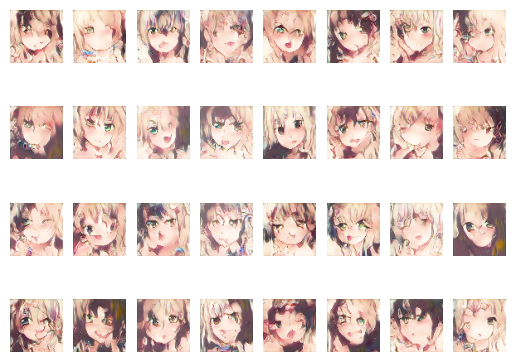

In [27]:
mygans.test_and_show()

In [28]:
mygans.training(1375)

Epochs: 3001
Current loss for discriminator: 0.2790999114513397
Current loss for generator: 2.913039207458496
Epochs: 3002
Current loss for discriminator: 0.40942448377609253
Current loss for generator: 1.415759801864624
Epochs: 3003
Current loss for discriminator: 0.6210814118385315
Current loss for generator: 3.581024169921875
Epochs: 3004
Current loss for discriminator: 0.5607966184616089
Current loss for generator: 1.9734487533569336
Epochs: 3005
Current loss for discriminator: 0.30931389331817627
Current loss for generator: 1.825014352798462
Epochs: 3006
Current loss for discriminator: 0.4190354347229004
Current loss for generator: 2.3265886306762695
Epochs: 3007
Current loss for discriminator: 0.29757148027420044
Current loss for generator: 2.5542593002319336
Epochs: 3008
Current loss for discriminator: 0.34616008400917053
Current loss for generator: 1.7330684661865234
Epochs: 3009
Current loss for discriminator: 0.47960853576660156
Current loss for generator: 1.8938225507736206


Current loss for discriminator: 0.9407005310058594
Current loss for generator: 1.6981943845748901
Epochs: 3045
Current loss for discriminator: 0.40020662546157837
Current loss for generator: 2.071251153945923
Epochs: 3046
Current loss for discriminator: 0.33808642625808716
Current loss for generator: 2.539367198944092
Epochs: 3047
Current loss for discriminator: 0.34432241320610046
Current loss for generator: 2.115835189819336
Epochs: 3048
Current loss for discriminator: 0.34623000025749207
Current loss for generator: 2.614807367324829
Epochs: 3049
Current loss for discriminator: 0.5697708129882812
Current loss for generator: 1.7808377742767334
Epochs: 3050
Current loss for discriminator: 0.5725347995758057
Current loss for generator: 3.557234287261963
Epochs: 3051
Current loss for discriminator: 0.6404001116752625
Current loss for generator: 2.0369160175323486
Epochs: 3052
Current loss for discriminator: 0.3012961447238922
Current loss for generator: 2.261779308319092
Epochs: 3053
Cur

Current loss for discriminator: 0.6785288453102112
Current loss for generator: 3.5649471282958984
Epochs: 3088
Current loss for discriminator: 0.3690018057823181
Current loss for generator: 3.283423900604248
Epochs: 3089
Current loss for discriminator: 0.5360021591186523
Current loss for generator: 1.7528690099716187
Epochs: 3090
Current loss for discriminator: 0.6787877082824707
Current loss for generator: 3.0674121379852295
Epochs: 3091
Current loss for discriminator: 0.40832310914993286
Current loss for generator: 2.954674482345581
Epochs: 3092
Current loss for discriminator: 0.5228003263473511
Current loss for generator: 1.780414342880249
Epochs: 3093
Current loss for discriminator: 0.49197840690612793
Current loss for generator: 2.0893197059631348
Epochs: 3094
Current loss for discriminator: 0.6083604097366333
Current loss for generator: 2.2028651237487793
Epochs: 3095
Current loss for discriminator: 0.44066864252090454
Current loss for generator: 1.8614399433135986
Epochs: 3096
C

Current loss for discriminator: 0.304679274559021
Current loss for generator: 2.30881404876709
Epochs: 3131
Current loss for discriminator: 0.42526692152023315
Current loss for generator: 3.468517303466797
Epochs: 3132
Current loss for discriminator: 0.5891842246055603
Current loss for generator: 1.1791439056396484
Epochs: 3133
Current loss for discriminator: 0.7130937576293945
Current loss for generator: 5.334636211395264
Epochs: 3134
Current loss for discriminator: 1.3628432750701904
Current loss for generator: 1.4420433044433594
Epochs: 3135
Current loss for discriminator: 0.5283371806144714
Current loss for generator: 2.1193904876708984
Epochs: 3136
Current loss for discriminator: 0.44523733854293823
Current loss for generator: 2.54128360748291
Epochs: 3137
Current loss for discriminator: 0.5316034555435181
Current loss for generator: 1.959909439086914
Epochs: 3138
Current loss for discriminator: 0.5340927243232727
Current loss for generator: 2.1653084754943848
Epochs: 3139
Current

Current loss for discriminator: 0.5492796301841736
Current loss for generator: 2.567837715148926
Epochs: 3174
Current loss for discriminator: 0.3049874007701874
Current loss for generator: 1.4734697341918945
Epochs: 3175
Current loss for discriminator: 0.4761735498905182
Current loss for generator: 3.322329521179199
Epochs: 3176
Current loss for discriminator: 0.490628719329834
Current loss for generator: 2.3325958251953125
Epochs: 3177
Current loss for discriminator: 0.37834852933883667
Current loss for generator: 2.3267462253570557
Epochs: 3178
Current loss for discriminator: 0.26813197135925293
Current loss for generator: 2.6882681846618652
Epochs: 3179
Current loss for discriminator: 0.46419304609298706
Current loss for generator: 1.4536808729171753
Epochs: 3180
Current loss for discriminator: 0.43129241466522217
Current loss for generator: 4.339873313903809
Epochs: 3181
Current loss for discriminator: 0.43305039405822754
Current loss for generator: 2.614473342895508
Epochs: 3182
C

Current loss for discriminator: 0.4289965033531189
Current loss for generator: 1.6710002422332764
Epochs: 3217
Current loss for discriminator: 0.43961185216903687
Current loss for generator: 3.6468465328216553
Epochs: 3218
Current loss for discriminator: 0.38377201557159424
Current loss for generator: 2.8123741149902344
Epochs: 3219
Current loss for discriminator: 0.4851807951927185
Current loss for generator: 1.3382372856140137
Epochs: 3220
Current loss for discriminator: 0.669410765171051
Current loss for generator: 4.260427474975586
Epochs: 3221
Current loss for discriminator: 0.895699143409729
Current loss for generator: 1.4976073503494263
Epochs: 3222
Current loss for discriminator: 0.3799290359020233
Current loss for generator: 2.7700910568237305
Epochs: 3223
Current loss for discriminator: 0.3194674253463745
Current loss for generator: 3.1938977241516113
Epochs: 3224
Current loss for discriminator: 0.4341577887535095
Current loss for generator: 1.7364213466644287
Epochs: 3225
Cu

Current loss for generator: 1.504442572593689
Epochs: 3260
Current loss for discriminator: 0.8167057633399963
Current loss for generator: 1.9517457485198975
Epochs: 3261
Current loss for discriminator: 0.8840013742446899
Current loss for generator: 1.5244224071502686
Epochs: 3262
Current loss for discriminator: 0.676608145236969
Current loss for generator: 1.5955218076705933
Epochs: 3263
Current loss for discriminator: 0.8525780439376831
Current loss for generator: 1.823383092880249
Epochs: 3264
Current loss for discriminator: 0.7349633574485779
Current loss for generator: 2.391880989074707
Epochs: 3265
Current loss for discriminator: 0.6773874163627625
Current loss for generator: 2.3379015922546387
Epochs: 3266
Current loss for discriminator: 0.8586889505386353
Current loss for generator: 1.4750803709030151
Epochs: 3267
Current loss for discriminator: 0.8636289834976196
Current loss for generator: 1.5940709114074707
Epochs: 3268
Current loss for discriminator: 0.6266230344772339
Curre

Current loss for generator: 2.202146053314209
Epochs: 3303
Current loss for discriminator: 0.4768885374069214
Current loss for generator: 2.7257540225982666
Epochs: 3304
Current loss for discriminator: 0.58644700050354
Current loss for generator: 2.6193127632141113
Epochs: 3305
Current loss for discriminator: 0.4320695102214813
Current loss for generator: 2.5566225051879883
Epochs: 3306
Current loss for discriminator: 0.6023980975151062
Current loss for generator: 4.055707931518555
Epochs: 3307
Current loss for discriminator: 0.579994261264801
Current loss for generator: 2.105893611907959
Epochs: 3308
Current loss for discriminator: 0.47260600328445435
Current loss for generator: 3.4734694957733154
Epochs: 3309
Current loss for discriminator: 0.49720025062561035
Current loss for generator: 1.8042988777160645
Epochs: 3310
Current loss for discriminator: 0.5694119930267334
Current loss for generator: 4.1423659324646
Epochs: 3311
Current loss for discriminator: 0.6900869607925415
Current 

Current loss for generator: 2.9647722244262695
Epochs: 3346
Current loss for discriminator: 0.5077062845230103
Current loss for generator: 2.548645496368408
Epochs: 3347
Current loss for discriminator: 0.36240583658218384
Current loss for generator: 3.579212188720703
Epochs: 3348
Current loss for discriminator: 0.43135201930999756
Current loss for generator: 2.375732898712158
Epochs: 3349
Current loss for discriminator: 0.45612475275993347
Current loss for generator: 5.139654636383057
Epochs: 3350
Current loss for discriminator: 1.2238707542419434
Current loss for generator: 0.3208199739456177
Epochs: 3351
Current loss for discriminator: 2.5703125
Current loss for generator: 6.802232265472412
Epochs: 3352
Current loss for discriminator: 2.7155768871307373
Current loss for generator: 1.4341192245483398
Epochs: 3353
Current loss for discriminator: 0.8737034201622009
Current loss for generator: 1.198061466217041
Epochs: 3354
Current loss for discriminator: 0.9955053329467773
Current loss 

Epochs: 3389
Current loss for discriminator: 0.6028920412063599
Current loss for generator: 1.9195083379745483
Epochs: 3390
Current loss for discriminator: 0.733446478843689
Current loss for generator: 1.8201476335525513
Epochs: 3391
Current loss for discriminator: 0.4938822388648987
Current loss for generator: 2.780930995941162
Epochs: 3392
Current loss for discriminator: 0.49804484844207764
Current loss for generator: 2.444685935974121
Epochs: 3393
Current loss for discriminator: 0.3742140233516693
Current loss for generator: 2.3791773319244385
Epochs: 3394
Current loss for discriminator: 0.34043776988983154
Current loss for generator: 2.945448637008667
Epochs: 3395
Current loss for discriminator: 0.4839365780353546
Current loss for generator: 2.8058512210845947
Epochs: 3396
Current loss for discriminator: 0.5912230014801025
Current loss for generator: 3.106314182281494
Epochs: 3397
Current loss for discriminator: 0.44396406412124634
Current loss for generator: 2.3440725803375244
Epo

Epochs: 3432
Current loss for discriminator: 0.5315167903900146
Current loss for generator: 1.9703192710876465
Epochs: 3433
Current loss for discriminator: 0.6422491073608398
Current loss for generator: 6.266534805297852
Epochs: 3434
Current loss for discriminator: 1.9167872667312622
Current loss for generator: 0.304301917552948
Epochs: 3435
Current loss for discriminator: 1.9377706050872803
Current loss for generator: 5.181118965148926
Epochs: 3436
Current loss for discriminator: 1.3475291728973389
Current loss for generator: 2.7812671661376953
Epochs: 3437
Current loss for discriminator: 0.5685995221138
Current loss for generator: 0.8081513047218323
Epochs: 3438
Current loss for discriminator: 0.7700638771057129
Current loss for generator: 1.8596820831298828
Epochs: 3439
Current loss for discriminator: 0.4638819396495819
Current loss for generator: 2.996861457824707
Epochs: 3440
Current loss for discriminator: 0.42847132682800293
Current loss for generator: 2.6932873725891113
Epochs:

Epochs: 3475
Current loss for discriminator: 0.4049610495567322
Current loss for generator: 2.5643231868743896
Epochs: 3476
Current loss for discriminator: 0.3477230370044708
Current loss for generator: 2.671825647354126
Epochs: 3477
Current loss for discriminator: 0.3727298974990845
Current loss for generator: 2.1532647609710693
Epochs: 3478
Current loss for discriminator: 0.43469542264938354
Current loss for generator: 1.7247419357299805
Epochs: 3479
Current loss for discriminator: 0.34957462549209595
Current loss for generator: 3.4819774627685547
Epochs: 3480
Current loss for discriminator: 0.7498540282249451
Current loss for generator: 0.8464555740356445
Epochs: 3481
Current loss for discriminator: 0.7309937477111816
Current loss for generator: 4.366113662719727
Epochs: 3482
Current loss for discriminator: 0.6881849765777588
Current loss for generator: 2.663992404937744
Epochs: 3483
Current loss for discriminator: 0.19919808208942413
Current loss for generator: 1.962859034538269
Ep

Epochs: 3518
Current loss for discriminator: 0.27212172746658325
Current loss for generator: 3.037222385406494
Epochs: 3519
Current loss for discriminator: 0.4171052873134613
Current loss for generator: 1.8629770278930664
Epochs: 3520
Current loss for discriminator: 0.6076850891113281
Current loss for generator: 4.011493682861328
Epochs: 3521
Current loss for discriminator: 0.646389901638031
Current loss for generator: 2.10109806060791
Epochs: 3522
Current loss for discriminator: 0.45646145939826965
Current loss for generator: 2.722782611846924
Epochs: 3523
Current loss for discriminator: 0.3919406533241272
Current loss for generator: 2.572300434112549
Epochs: 3524
Current loss for discriminator: 0.3044911026954651
Current loss for generator: 2.37229585647583
Epochs: 3525
Current loss for discriminator: 0.40485990047454834
Current loss for generator: 2.4995808601379395
Epochs: 3526
Current loss for discriminator: 0.27231767773628235
Current loss for generator: 2.608755350112915
Epochs:

Epochs: 3561
Current loss for discriminator: 0.20631727576255798
Current loss for generator: 3.440821886062622
Epochs: 3562
Current loss for discriminator: 0.2668071389198303
Current loss for generator: 3.031006336212158
Epochs: 3563
Current loss for discriminator: 0.30152708292007446
Current loss for generator: 3.2385001182556152
Epochs: 3564
Current loss for discriminator: 0.6474280953407288
Current loss for generator: 3.706892967224121
Epochs: 3565
Current loss for discriminator: 0.4201999604701996
Current loss for generator: 2.6706979274749756
Epochs: 3566
Current loss for discriminator: 0.4913522005081177
Current loss for generator: 1.8881845474243164
Epochs: 3567
Current loss for discriminator: 0.6190910339355469
Current loss for generator: 4.480939865112305
Epochs: 3568
Current loss for discriminator: 0.9007107019424438
Current loss for generator: 1.3929320573806763
Epochs: 3569
Current loss for discriminator: 0.8096331357955933
Current loss for generator: 5.002556324005127
Epoc

Epochs: 3604
Current loss for discriminator: 0.3306291103363037
Current loss for generator: 1.8546563386917114
Epochs: 3605
Current loss for discriminator: 0.802966833114624
Current loss for generator: 3.4256839752197266
Epochs: 3606
Current loss for discriminator: 0.5392118692398071
Current loss for generator: 2.6220765113830566
Epochs: 3607
Current loss for discriminator: 0.3979158401489258
Current loss for generator: 2.492299795150757
Epochs: 3608
Current loss for discriminator: 0.37873706221580505
Current loss for generator: 2.912302017211914
Epochs: 3609
Current loss for discriminator: 0.2870606482028961
Current loss for generator: 3.702488899230957
Epochs: 3610
Current loss for discriminator: 0.21683990955352783
Current loss for generator: 3.795877456665039
Epochs: 3611
Current loss for discriminator: 0.09253106266260147
Current loss for generator: 3.798708915710449
Epochs: 3612
Current loss for discriminator: 0.1346164345741272
Current loss for generator: 5.205417156219482
Epoch

Epochs: 3647
Current loss for discriminator: 0.4841625690460205
Current loss for generator: 2.567080020904541
Epochs: 3648
Current loss for discriminator: 0.5405867099761963
Current loss for generator: 2.2076315879821777
Epochs: 3649
Current loss for discriminator: 0.5280941724777222
Current loss for generator: 2.1386871337890625
Epochs: 3650
Current loss for discriminator: 0.45656922459602356
Current loss for generator: 2.6568684577941895
Epochs: 3651
Current loss for discriminator: 0.36640024185180664
Current loss for generator: 2.3810105323791504
Epochs: 3652
Current loss for discriminator: 0.4741624593734741
Current loss for generator: 2.291036367416382
Epochs: 3653
Current loss for discriminator: 0.4846348166465759
Current loss for generator: 2.0954606533050537
Epochs: 3654
Current loss for discriminator: 0.6604669690132141
Current loss for generator: 2.710531711578369
Epochs: 3655
Current loss for discriminator: 0.45346012711524963
Current loss for generator: 2.9291250705718994
E

Epochs: 3690
Current loss for discriminator: 0.6434522867202759
Current loss for generator: 3.0303096771240234
Epochs: 3691
Current loss for discriminator: 0.44411230087280273
Current loss for generator: 2.594677209854126
Epochs: 3692
Current loss for discriminator: 0.30840811133384705
Current loss for generator: 3.396493434906006
Epochs: 3693
Current loss for discriminator: 0.3785177171230316
Current loss for generator: 2.4226980209350586
Epochs: 3694
Current loss for discriminator: 0.47614356875419617
Current loss for generator: 3.510497570037842
Epochs: 3695
Current loss for discriminator: 0.7265670299530029
Current loss for generator: 1.9538733959197998
Epochs: 3696
Current loss for discriminator: 0.280010461807251
Current loss for generator: 2.4933247566223145
Epochs: 3697
Current loss for discriminator: 0.22659170627593994
Current loss for generator: 3.159402370452881
Epochs: 3698
Current loss for discriminator: 0.4231748878955841
Current loss for generator: 2.2391271591186523
Ep

Epochs: 3733
Current loss for discriminator: 0.4099169075489044
Current loss for generator: 2.3062703609466553
Epochs: 3734
Current loss for discriminator: 0.40559282898902893
Current loss for generator: 2.759645462036133
Epochs: 3735
Current loss for discriminator: 0.39303475618362427
Current loss for generator: 2.318356513977051
Epochs: 3736
Current loss for discriminator: 0.3487758934497833
Current loss for generator: 3.7398219108581543
Epochs: 3737
Current loss for discriminator: 0.42424410581588745
Current loss for generator: 2.15565824508667
Epochs: 3738
Current loss for discriminator: 0.5734591484069824
Current loss for generator: 4.933584213256836
Epochs: 3739
Current loss for discriminator: 0.629111111164093
Current loss for generator: 1.8899915218353271
Epochs: 3740
Current loss for discriminator: 0.4358210265636444
Current loss for generator: 3.2027926445007324
Epochs: 3741
Current loss for discriminator: 0.2027851790189743
Current loss for generator: 2.9608635902404785
Epoc

Epochs: 3776
Current loss for discriminator: 0.5580547451972961
Current loss for generator: 2.0229365825653076
Epochs: 3777
Current loss for discriminator: 0.5995639562606812
Current loss for generator: 1.945845127105713
Epochs: 3778
Current loss for discriminator: 0.5006316304206848
Current loss for generator: 2.391232967376709
Epochs: 3779
Current loss for discriminator: 0.7141791582107544
Current loss for generator: 1.6269538402557373
Epochs: 3780
Current loss for discriminator: 0.7034783959388733
Current loss for generator: 2.618633270263672
Epochs: 3781
Current loss for discriminator: 0.8872063755989075
Current loss for generator: 1.6657752990722656
Epochs: 3782
Current loss for discriminator: 0.6333913207054138
Current loss for generator: 1.8180632591247559
Epochs: 3783
Current loss for discriminator: 0.8097906112670898
Current loss for generator: 2.6718623638153076
Epochs: 3784
Current loss for discriminator: 0.4592132568359375
Current loss for generator: 2.674879550933838
Epoch

Epochs: 3819
Current loss for discriminator: 0.41744065284729004
Current loss for generator: 2.713735580444336
Epochs: 3820
Current loss for discriminator: 0.5995298624038696
Current loss for generator: 1.8443639278411865
Epochs: 3821
Current loss for discriminator: 0.5579147338867188
Current loss for generator: 2.5031909942626953
Epochs: 3822
Current loss for discriminator: 0.41642463207244873
Current loss for generator: 2.731248140335083
Epochs: 3823
Current loss for discriminator: 0.44449999928474426
Current loss for generator: 2.0428709983825684
Epochs: 3824
Current loss for discriminator: 0.4450281262397766
Current loss for generator: 1.7990992069244385
Epochs: 3825
Current loss for discriminator: 0.31658434867858887
Current loss for generator: 2.4438376426696777
Epochs: 3826
Current loss for discriminator: 0.44777271151542664
Current loss for generator: 2.320873260498047
Epochs: 3827
Current loss for discriminator: 0.4557642340660095
Current loss for generator: 1.9689017534255981

Epochs: 3862
Current loss for discriminator: 0.39165592193603516
Current loss for generator: 2.5038504600524902
Epochs: 3863
Current loss for discriminator: 0.5703456401824951
Current loss for generator: 3.1294634342193604
Epochs: 3864
Current loss for discriminator: 0.47153833508491516
Current loss for generator: 2.3622677326202393
Epochs: 3865
Current loss for discriminator: 0.30547893047332764
Current loss for generator: 2.3706250190734863
Epochs: 3866
Current loss for discriminator: 0.4539789855480194
Current loss for generator: 2.9455294609069824
Epochs: 3867
Current loss for discriminator: 0.4405401349067688
Current loss for generator: 1.8979038000106812
Epochs: 3868
Current loss for discriminator: 0.49654239416122437
Current loss for generator: 2.185606002807617
Epochs: 3869
Current loss for discriminator: 0.2811223268508911
Current loss for generator: 2.7449445724487305
Epochs: 3870
Current loss for discriminator: 0.45417991280555725
Current loss for generator: 1.76765799522399

Epochs: 3905
Current loss for discriminator: 0.16030794382095337
Current loss for generator: 2.7345082759857178
Epochs: 3906
Current loss for discriminator: 0.48659634590148926
Current loss for generator: 3.7225708961486816
Epochs: 3907
Current loss for discriminator: 0.36364489793777466
Current loss for generator: 2.6074416637420654
Epochs: 3908
Current loss for discriminator: 0.33857113122940063
Current loss for generator: 4.590587615966797
Epochs: 3909
Current loss for discriminator: 0.5655220746994019
Current loss for generator: 1.525108814239502
Epochs: 3910
Current loss for discriminator: 1.1270071268081665
Current loss for generator: 9.693090438842773
Epochs: 3911
Current loss for discriminator: 3.446254253387451
Current loss for generator: 0.8034354448318481
Epochs: 3912
Current loss for discriminator: 1.1436586380004883
Current loss for generator: 3.1150808334350586
Epochs: 3913
Current loss for discriminator: 0.4628655016422272
Current loss for generator: 3.0719339847564697
E

Epochs: 3948
Current loss for discriminator: 0.25746381282806396
Current loss for generator: 3.455216646194458
Epochs: 3949
Current loss for discriminator: 0.5464682579040527
Current loss for generator: 1.5630385875701904
Epochs: 3950
Current loss for discriminator: 0.7068697214126587
Current loss for generator: 5.620731353759766
Epochs: 3951
Current loss for discriminator: 1.0916091203689575
Current loss for generator: 2.6826894283294678
Epochs: 3952
Current loss for discriminator: 0.24200722575187683
Current loss for generator: 1.7652227878570557
Epochs: 3953
Current loss for discriminator: 0.5409327149391174
Current loss for generator: 4.153031826019287
Epochs: 3954
Current loss for discriminator: 0.24359750747680664
Current loss for generator: 3.867699146270752
Epochs: 3955
Current loss for discriminator: 0.49272000789642334
Current loss for generator: 1.5615379810333252
Epochs: 3956
Current loss for discriminator: 0.8814714550971985
Current loss for generator: 4.49072265625
Epochs

Epochs: 3991
Current loss for discriminator: 0.5726425051689148
Current loss for generator: 2.139723300933838
Epochs: 3992
Current loss for discriminator: 0.408622145652771
Current loss for generator: 2.702130079269409
Epochs: 3993
Current loss for discriminator: 0.22649642825126648
Current loss for generator: 2.9638795852661133
Epochs: 3994
Current loss for discriminator: 0.342970609664917
Current loss for generator: 2.783301830291748
Epochs: 3995
Current loss for discriminator: 0.35545092821121216
Current loss for generator: 2.2409420013427734
Epochs: 3996
Current loss for discriminator: 0.3222532272338867
Current loss for generator: 2.488936424255371
Epochs: 3997
Current loss for discriminator: 0.4047473073005676
Current loss for generator: 2.4931459426879883
Epochs: 3998
Current loss for discriminator: 0.3364732265472412
Current loss for generator: 2.687042713165283
Epochs: 3999
Current loss for discriminator: 0.2613065838813782
Current loss for generator: 2.5214176177978516
Epochs

Epochs: 4034
Current loss for discriminator: 0.38421955704689026
Current loss for generator: 2.908674716949463
Epochs: 4035
Current loss for discriminator: 0.35142022371292114
Current loss for generator: 2.2174582481384277
Epochs: 4036
Current loss for discriminator: 0.30504274368286133
Current loss for generator: 3.6387441158294678
Epochs: 4037
Current loss for discriminator: 0.37344762682914734
Current loss for generator: 2.5179615020751953
Epochs: 4038
Current loss for discriminator: 0.2677580416202545
Current loss for generator: 3.044558525085449
Epochs: 4039
Current loss for discriminator: 0.45715564489364624
Current loss for generator: 2.4776365756988525
Epochs: 4040
Current loss for discriminator: 0.3478378653526306
Current loss for generator: 3.721886157989502
Epochs: 4041
Current loss for discriminator: 0.39339399337768555
Current loss for generator: 1.6569437980651855
Epochs: 4042
Current loss for discriminator: 0.6153528094291687
Current loss for generator: 5.932187080383301

Epochs: 4077
Current loss for discriminator: 0.677446186542511
Current loss for generator: 2.0107553005218506
Epochs: 4078
Current loss for discriminator: 0.4263650178909302
Current loss for generator: 1.5940589904785156
Epochs: 4079
Current loss for discriminator: 0.4557821452617645
Current loss for generator: 2.311398983001709
Epochs: 4080
Current loss for discriminator: 0.33425769209861755
Current loss for generator: 2.66143536567688
Epochs: 4081
Current loss for discriminator: 0.4969603419303894
Current loss for generator: 1.9217469692230225
Epochs: 4082
Current loss for discriminator: 0.4968112111091614
Current loss for generator: 1.4820985794067383
Epochs: 4083
Current loss for discriminator: 0.4441292881965637
Current loss for generator: 2.2843213081359863
Epochs: 4084
Current loss for discriminator: 0.29777735471725464
Current loss for generator: 2.9128880500793457
Epochs: 4085
Current loss for discriminator: 0.3433524966239929
Current loss for generator: 2.6883459091186523
Epo

Epochs: 4120
Current loss for discriminator: 0.4020647406578064
Current loss for generator: 1.5389955043792725
Epochs: 4121
Current loss for discriminator: 0.6133298277854919
Current loss for generator: 5.374031066894531
Epochs: 4122
Current loss for discriminator: 0.7560221552848816
Current loss for generator: 1.538726568222046
Epochs: 4123
Current loss for discriminator: 0.553066074848175
Current loss for generator: 3.082380771636963
Epochs: 4124
Current loss for discriminator: 0.275727242231369
Current loss for generator: 3.473781108856201
Epochs: 4125
Current loss for discriminator: 0.30685997009277344
Current loss for generator: 2.172879934310913
Epochs: 4126
Current loss for discriminator: 0.22260132431983948
Current loss for generator: 2.101578712463379
Epochs: 4127
Current loss for discriminator: 0.32163405418395996
Current loss for generator: 1.8650765419006348
Epochs: 4128
Current loss for discriminator: 0.34667134284973145
Current loss for generator: 2.7158026695251465
Epoch

Epochs: 4163
Current loss for discriminator: 0.4723431468009949
Current loss for generator: 1.3907946348190308
Epochs: 4164
Current loss for discriminator: 0.694678783416748
Current loss for generator: 3.5943737030029297
Epochs: 4165
Current loss for discriminator: 0.38373905420303345
Current loss for generator: 3.1961259841918945
Epochs: 4166
Current loss for discriminator: 0.32791709899902344
Current loss for generator: 2.203972816467285
Epochs: 4167
Current loss for discriminator: 0.3853929936885834
Current loss for generator: 2.280282974243164
Epochs: 4168
Current loss for discriminator: 0.47577762603759766
Current loss for generator: 2.5680220127105713
Epochs: 4169
Current loss for discriminator: 0.3021852970123291
Current loss for generator: 2.6354856491088867
Epochs: 4170
Current loss for discriminator: 0.392484188079834
Current loss for generator: 2.5643227100372314
Epochs: 4171
Current loss for discriminator: 0.3890096843242645
Current loss for generator: 2.7388432025909424
Ep

Epochs: 4206
Current loss for discriminator: 0.44160449504852295
Current loss for generator: 2.345992088317871
Epochs: 4207
Current loss for discriminator: 0.2702855169773102
Current loss for generator: 3.3331942558288574
Epochs: 4208
Current loss for discriminator: 0.19971591234207153
Current loss for generator: 3.744170904159546
Epochs: 4209
Current loss for discriminator: 0.4511643052101135
Current loss for generator: 1.7955516576766968
Epochs: 4210
Current loss for discriminator: 0.6058127284049988
Current loss for generator: 3.632974624633789
Epochs: 4211
Current loss for discriminator: 0.34251976013183594
Current loss for generator: 2.775322914123535
Epochs: 4212
Current loss for discriminator: 0.36794763803482056
Current loss for generator: 2.796581745147705
Epochs: 4213
Current loss for discriminator: 0.45028263330459595
Current loss for generator: 3.4426164627075195
Epochs: 4214
Current loss for discriminator: 0.28526508808135986
Current loss for generator: 3.5642030239105225


Epochs: 4249
Current loss for discriminator: 0.2843931019306183
Current loss for generator: 3.3642008304595947
Epochs: 4250
Current loss for discriminator: 0.2534944415092468
Current loss for generator: 2.323957920074463
Epochs: 4251
Current loss for discriminator: 0.3967471122741699
Current loss for generator: 4.581028461456299
Epochs: 4252
Current loss for discriminator: 0.31432318687438965
Current loss for generator: 3.1793861389160156
Epochs: 4253
Current loss for discriminator: 0.385364830493927
Current loss for generator: 2.047731399536133
Epochs: 4254
Current loss for discriminator: 0.5432229042053223
Current loss for generator: 4.430474281311035
Epochs: 4255
Current loss for discriminator: 0.8941052556037903
Current loss for generator: 2.1182451248168945
Epochs: 4256
Current loss for discriminator: 0.4511432647705078
Current loss for generator: 2.681281089782715
Epochs: 4257
Current loss for discriminator: 0.2896314263343811
Current loss for generator: 3.257814407348633
Epochs:

Epochs: 4292
Current loss for discriminator: 0.34321191906929016
Current loss for generator: 2.4949023723602295
Epochs: 4293
Current loss for discriminator: 0.3115309476852417
Current loss for generator: 3.012274980545044
Epochs: 4294
Current loss for discriminator: 0.34467613697052
Current loss for generator: 3.3740386962890625
Epochs: 4295
Current loss for discriminator: 0.19167186319828033
Current loss for generator: 3.0573296546936035
Epochs: 4296
Current loss for discriminator: 0.3662482500076294
Current loss for generator: 3.3486599922180176
Epochs: 4297
Current loss for discriminator: 0.37728574872016907
Current loss for generator: 3.3636386394500732
Epochs: 4298
Current loss for discriminator: 0.4152355492115021
Current loss for generator: 3.5764784812927246
Epochs: 4299
Current loss for discriminator: 0.3731600046157837
Current loss for generator: 3.1155853271484375
Epochs: 4300
Current loss for discriminator: 0.5013259649276733
Current loss for generator: 2.6750621795654297
E

Epochs: 4335
Current loss for discriminator: 0.3283963203430176
Current loss for generator: 2.685765504837036
Epochs: 4336
Current loss for discriminator: 0.5273257493972778
Current loss for generator: 1.8299546241760254
Epochs: 4337
Current loss for discriminator: 0.5004782676696777
Current loss for generator: 2.654052495956421
Epochs: 4338
Current loss for discriminator: 0.37076276540756226
Current loss for generator: 2.5812277793884277
Epochs: 4339
Current loss for discriminator: 0.40971308946609497
Current loss for generator: 1.7018940448760986
Epochs: 4340
Current loss for discriminator: 0.36250025033950806
Current loss for generator: 2.936129570007324
Epochs: 4341
Current loss for discriminator: 0.26977723836898804
Current loss for generator: 3.3158183097839355
Epochs: 4342
Current loss for discriminator: 0.2287321835756302
Current loss for generator: 2.77492094039917
Epochs: 4343
Current loss for discriminator: 0.44622689485549927
Current loss for generator: 2.6669325828552246
E

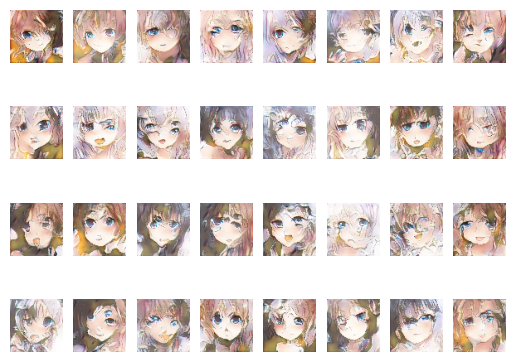

In [29]:
mygans.test_and_show()

Use data form same source continue training

In [21]:
saved_generator = tf.keras.models.load_model(cwd + "/Saved_models/basic_GANs/danbooru_dataset_4375iter/generator")

saved_discriminator = tf.keras.models.load_model(cwd + "/Saved_models/basic_GANs/danbooru_dataset_4375iter/discriminator")

In [34]:
saved_discriminator.compile()
saved_discriminator.optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

In [35]:
saved_generator.compile()

saved_generator.optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

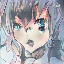

In [48]:
sample_vector = tf.random.normal([1,100], 0, 1, tf.float32, seed=1) # sample a 100 dimesional vector from a std normal distribution.
sample_output = saved_generator(sample_vector).numpy()   


sample_img = tf.keras.preprocessing.image.array_to_img(sample_output.reshape(64, 64, 3))
#for i in range(len(sample_vector)):
#    print(sample_vector[i])
sample_img

In [24]:
mygans = myGANs(saved_generator, saved_discriminator, cwd + "/extra_data_from_danbooru/", 123, 32, 64, 64)

Found 140000 files belonging to 1 classes.


Restart training after 4375 iters

In [36]:
mygans.training(1000)

Epochs: 1
Current loss for discriminator: 0.38701802492141724
Current loss for generator: 6.263803482055664
Epochs: 2
Current loss for discriminator: 1.9936230182647705
Current loss for generator: 2.6542348861694336
Epochs: 3
Current loss for discriminator: 0.17676103115081787
Current loss for generator: 1.0687813758850098
Epochs: 4
Current loss for discriminator: 0.5925503969192505
Current loss for generator: 2.213207721710205
Epochs: 5
Current loss for discriminator: 0.3756466209888458
Current loss for generator: 2.7931251525878906
Epochs: 6
Current loss for discriminator: 0.27446267008781433
Current loss for generator: 2.8150107860565186
Epochs: 7
Current loss for discriminator: 0.3602749705314636
Current loss for generator: 2.296745777130127
Epochs: 8
Current loss for discriminator: 0.26967599987983704
Current loss for generator: 2.874290943145752
Epochs: 9
Current loss for discriminator: 0.3377337157726288
Current loss for generator: 2.729548454284668
Epochs: 10
Current loss for d

Current loss for generator: 3.9149556159973145
Epochs: 45
Current loss for discriminator: 0.41477054357528687
Current loss for generator: 1.0303573608398438
Epochs: 46
Current loss for discriminator: 1.5919020175933838
Current loss for generator: 9.108304977416992
Epochs: 47
Current loss for discriminator: 4.1898956298828125
Current loss for generator: 2.554774761199951
Epochs: 48
Current loss for discriminator: 0.44673952460289
Current loss for generator: 0.5168550610542297
Epochs: 49
Current loss for discriminator: 1.3247284889221191
Current loss for generator: 3.179187774658203
Epochs: 50
Current loss for discriminator: 0.41420918703079224
Current loss for generator: 3.0276436805725098
Epochs: 51
Current loss for discriminator: 0.3581277132034302
Current loss for generator: 2.510099411010742
Epochs: 52
Current loss for discriminator: 0.38978344202041626
Current loss for generator: 1.7320594787597656
Epochs: 53
Current loss for discriminator: 0.7021450996398926
Current loss for gener

Current loss for discriminator: 0.6244249939918518
Current loss for generator: 4.543107986450195
Epochs: 89
Current loss for discriminator: 0.2364233434200287
Current loss for generator: 4.355066776275635
Epochs: 90
Current loss for discriminator: 0.43466973304748535
Current loss for generator: 1.857735276222229
Epochs: 91
Current loss for discriminator: 0.7845327854156494
Current loss for generator: 5.1775922775268555
Epochs: 92
Current loss for discriminator: 1.340750813484192
Current loss for generator: 1.7417049407958984
Epochs: 93
Current loss for discriminator: 0.5608766078948975
Current loss for generator: 1.777277946472168
Epochs: 94
Current loss for discriminator: 0.3929060101509094
Current loss for generator: 2.564459800720215
Epochs: 95
Current loss for discriminator: 0.21027228236198425
Current loss for generator: 3.31771183013916
Epochs: 96
Current loss for discriminator: 0.27545347809791565
Current loss for generator: 3.115109443664551
Epochs: 97
Current loss for discrimi

Current loss for generator: 7.46274995803833
Epochs: 132
Current loss for discriminator: 2.112075090408325
Current loss for generator: 1.2699604034423828
Epochs: 133
Current loss for discriminator: 0.5129225254058838
Current loss for generator: 2.085472583770752
Epochs: 134
Current loss for discriminator: 0.37342703342437744
Current loss for generator: 3.3221640586853027
Epochs: 135
Current loss for discriminator: 0.18781089782714844
Current loss for generator: 3.518690824508667
Epochs: 136
Current loss for discriminator: 0.13337787985801697
Current loss for generator: 3.1931629180908203
Epochs: 137
Current loss for discriminator: 0.45229342579841614
Current loss for generator: 1.668181300163269
Epochs: 138
Current loss for discriminator: 0.443617582321167
Current loss for generator: 2.1184420585632324
Epochs: 139
Current loss for discriminator: 0.4521723687648773
Current loss for generator: 3.221543312072754
Epochs: 140
Current loss for discriminator: 0.4877535104751587
Current loss f

Epochs: 175
Current loss for discriminator: 0.4732910096645355
Current loss for generator: 2.674859046936035
Epochs: 176
Current loss for discriminator: 0.5616638660430908
Current loss for generator: 2.7967112064361572
Epochs: 177
Current loss for discriminator: 0.5545434355735779
Current loss for generator: 3.338879346847534
Epochs: 178
Current loss for discriminator: 0.3898187577724457
Current loss for generator: 2.699277877807617
Epochs: 179
Current loss for discriminator: 0.35300177335739136
Current loss for generator: 2.984182834625244
Epochs: 180
Current loss for discriminator: 0.6091533303260803
Current loss for generator: 5.372475624084473
Epochs: 181
Current loss for discriminator: 0.7390995025634766
Current loss for generator: 1.912056565284729
Epochs: 182
Current loss for discriminator: 0.6580977439880371
Current loss for generator: 2.3811745643615723
Epochs: 183
Current loss for discriminator: 0.523876428604126
Current loss for generator: 4.703024864196777
Epochs: 184
Curre

Current loss for discriminator: 0.23161007463932037
Current loss for generator: 3.3707327842712402
Epochs: 219
Current loss for discriminator: 0.18205374479293823
Current loss for generator: 2.9907500743865967
Epochs: 220
Current loss for discriminator: 0.3652014434337616
Current loss for generator: 2.2672576904296875
Epochs: 221
Current loss for discriminator: 0.33426633477211
Current loss for generator: 3.018429756164551
Epochs: 222
Current loss for discriminator: 0.40234965085983276
Current loss for generator: 2.190474510192871
Epochs: 223
Current loss for discriminator: 0.5258461833000183
Current loss for generator: 2.125791549682617
Epochs: 224
Current loss for discriminator: 0.5412054657936096
Current loss for generator: 3.0439443588256836
Epochs: 225
Current loss for discriminator: 0.39569878578186035
Current loss for generator: 2.195979118347168
Epochs: 226
Current loss for discriminator: 0.43178609013557434
Current loss for generator: 1.995091199874878
Epochs: 227
Current loss

Current loss for generator: 1.6826756000518799
Epochs: 262
Current loss for discriminator: 0.49398505687713623
Current loss for generator: 4.469618797302246
Epochs: 263
Current loss for discriminator: 0.5388799905776978
Current loss for generator: 2.919015645980835
Epochs: 264
Current loss for discriminator: 0.2987331449985504
Current loss for generator: 2.467606782913208
Epochs: 265
Current loss for discriminator: 0.24249529838562012
Current loss for generator: 3.053711175918579
Epochs: 266
Current loss for discriminator: 0.31831297278404236
Current loss for generator: 2.7302908897399902
Epochs: 267
Current loss for discriminator: 0.171298086643219
Current loss for generator: 2.979513168334961
Epochs: 268
Current loss for discriminator: 0.21527665853500366
Current loss for generator: 3.4469709396362305
Epochs: 269
Current loss for discriminator: 0.43884557485580444
Current loss for generator: 1.983183741569519
Epochs: 270
Current loss for discriminator: 0.5097107887268066
Current loss

Epochs: 305
Current loss for discriminator: 0.5370062589645386
Current loss for generator: 3.4127087593078613
Epochs: 306
Current loss for discriminator: 0.3160286247730255
Current loss for generator: 3.252923011779785
Epochs: 307
Current loss for discriminator: 0.3078831732273102
Current loss for generator: 3.063706874847412
Epochs: 308
Current loss for discriminator: 0.22241497039794922
Current loss for generator: 2.8982062339782715
Epochs: 309
Current loss for discriminator: 0.23710159957408905
Current loss for generator: 2.942761182785034
Epochs: 310
Current loss for discriminator: 0.2963281273841858
Current loss for generator: 3.9749457836151123
Epochs: 311
Current loss for discriminator: 0.3950934112071991
Current loss for generator: 2.1321821212768555
Epochs: 312
Current loss for discriminator: 0.47295862436294556
Current loss for generator: 5.981752395629883
Epochs: 313
Current loss for discriminator: 0.6763477325439453
Current loss for generator: 1.8669010400772095
Epochs: 314

Current loss for discriminator: 0.3990192115306854
Current loss for generator: 1.8047385215759277
Epochs: 349
Current loss for discriminator: 0.38498079776763916
Current loss for generator: 3.3339409828186035
Epochs: 350
Current loss for discriminator: 0.31289994716644287
Current loss for generator: 2.8137993812561035
Epochs: 351
Current loss for discriminator: 0.4115374684333801
Current loss for generator: 2.5820627212524414
Epochs: 352
Current loss for discriminator: 0.2682529389858246
Current loss for generator: 2.8661129474639893
Epochs: 353
Current loss for discriminator: 0.377871572971344
Current loss for generator: 3.3117620944976807
Epochs: 354
Current loss for discriminator: 0.24462053179740906
Current loss for generator: 2.9444541931152344
Epochs: 355
Current loss for discriminator: 0.3612517714500427
Current loss for generator: 2.3605496883392334
Epochs: 356
Current loss for discriminator: 0.3421919345855713
Current loss for generator: 3.4093031883239746
Epochs: 357
Current 

Current loss for generator: 2.4724044799804688
Epochs: 392
Current loss for discriminator: 0.4121197462081909
Current loss for generator: 3.5421290397644043
Epochs: 393
Current loss for discriminator: 0.3468132019042969
Current loss for generator: 2.361276149749756
Epochs: 394
Current loss for discriminator: 0.440281480550766
Current loss for generator: 3.102316379547119
Epochs: 395
Current loss for discriminator: 0.219417005777359
Current loss for generator: 2.4800727367401123
Epochs: 396
Current loss for discriminator: 0.31118151545524597
Current loss for generator: 3.367750883102417
Epochs: 397
Current loss for discriminator: 0.30189692974090576
Current loss for generator: 3.9281275272369385
Epochs: 398
Current loss for discriminator: 0.39373037219047546
Current loss for generator: 2.0098466873168945
Epochs: 399
Current loss for discriminator: 0.443644255399704
Current loss for generator: 5.073945999145508
Epochs: 400
Current loss for discriminator: 0.9977364540100098
Current loss f

Epochs: 435
Current loss for discriminator: 0.2760300040245056
Current loss for generator: 3.7236874103546143
Epochs: 436
Current loss for discriminator: 0.22471418976783752
Current loss for generator: 3.193268299102783
Epochs: 437
Current loss for discriminator: 0.4313199520111084
Current loss for generator: 2.015803098678589
Epochs: 438
Current loss for discriminator: 0.7079830765724182
Current loss for generator: 6.238815784454346
Epochs: 439
Current loss for discriminator: 1.1398123502731323
Current loss for generator: 1.886596918106079
Epochs: 440
Current loss for discriminator: 0.4068336486816406
Current loss for generator: 1.8781049251556396
Epochs: 441
Current loss for discriminator: 0.6510021090507507
Current loss for generator: 5.725696086883545
Epochs: 442
Current loss for discriminator: 1.1547528505325317
Current loss for generator: 3.2820119857788086
Epochs: 443
Current loss for discriminator: 0.31650006771087646
Current loss for generator: 1.3973071575164795
Epochs: 444
C

Current loss for discriminator: 0.4704053997993469
Current loss for generator: 1.667902946472168
Epochs: 479
Current loss for discriminator: 0.493333637714386
Current loss for generator: 3.45121431350708
Epochs: 480
Current loss for discriminator: 0.6998383402824402
Current loss for generator: 2.5205249786376953
Epochs: 481
Current loss for discriminator: 0.46846717596054077
Current loss for generator: 2.4034547805786133
Epochs: 482
Current loss for discriminator: 0.73691326379776
Current loss for generator: 1.806136965751648
Epochs: 483
Current loss for discriminator: 0.4176922142505646
Current loss for generator: 2.4060659408569336
Epochs: 484
Current loss for discriminator: 0.42972397804260254
Current loss for generator: 2.665410280227661
Epochs: 485
Current loss for discriminator: 0.5547176003456116
Current loss for generator: 2.89355731010437
Epochs: 486
Current loss for discriminator: 0.5272585153579712
Current loss for generator: 2.0938358306884766
Epochs: 487
Current loss for d

Current loss for generator: 2.7049455642700195
Epochs: 522
Current loss for discriminator: 0.3437483012676239
Current loss for generator: 3.1853108406066895
Epochs: 523
Current loss for discriminator: 0.4885721206665039
Current loss for generator: 2.390502452850342
Epochs: 524
Current loss for discriminator: 0.31483033299446106
Current loss for generator: 2.3479437828063965
Epochs: 525
Current loss for discriminator: 0.6174756288528442
Current loss for generator: 1.7737098932266235
Epochs: 526
Current loss for discriminator: 0.46447792649269104
Current loss for generator: 3.041585922241211
Epochs: 527
Current loss for discriminator: 0.32370486855506897
Current loss for generator: 3.003969430923462
Epochs: 528
Current loss for discriminator: 0.4207802414894104
Current loss for generator: 2.0642542839050293
Epochs: 529
Current loss for discriminator: 0.5126477479934692
Current loss for generator: 2.2897825241088867
Epochs: 530
Current loss for discriminator: 0.2916913628578186
Current lo

Epochs: 565
Current loss for discriminator: 0.32243531942367554
Current loss for generator: 3.0450408458709717
Epochs: 566
Current loss for discriminator: 0.510974645614624
Current loss for generator: 4.23771333694458
Epochs: 567
Current loss for discriminator: 0.5755144357681274
Current loss for generator: 1.3196132183074951
Epochs: 568
Current loss for discriminator: 0.4290849566459656
Current loss for generator: 3.076986312866211
Epochs: 569
Current loss for discriminator: 0.18601495027542114
Current loss for generator: 4.1129913330078125
Epochs: 570
Current loss for discriminator: 0.2730824947357178
Current loss for generator: 3.727846145629883
Epochs: 571
Current loss for discriminator: 0.28640344738960266
Current loss for generator: 1.850719690322876
Epochs: 572
Current loss for discriminator: 0.6530174612998962
Current loss for generator: 4.818058967590332
Epochs: 573
Current loss for discriminator: 0.3088228106498718
Current loss for generator: 4.744093894958496
Epochs: 574
Cur

Current loss for discriminator: 0.5930955410003662
Current loss for generator: 1.255647897720337
Epochs: 609
Current loss for discriminator: 1.9569118022918701
Current loss for generator: 12.104268074035645
Epochs: 610
Current loss for discriminator: 6.382979393005371
Current loss for generator: 3.6904335021972656
Epochs: 611
Current loss for discriminator: 0.8858003616333008
Current loss for generator: 0.576057493686676
Epochs: 612
Current loss for discriminator: 1.2380599975585938
Current loss for generator: 1.7840402126312256
Epochs: 613
Current loss for discriminator: 0.49581921100616455
Current loss for generator: 2.7900867462158203
Epochs: 614
Current loss for discriminator: 0.42337536811828613
Current loss for generator: 2.025275945663452
Epochs: 615
Current loss for discriminator: 0.4614601731300354
Current loss for generator: 2.0474181175231934
Epochs: 616
Current loss for discriminator: 0.46043258905410767
Current loss for generator: 3.2066292762756348
Epochs: 617
Current los

Current loss for generator: 3.0636560916900635
Epochs: 652
Current loss for discriminator: 0.38392066955566406
Current loss for generator: 2.407771587371826
Epochs: 653
Current loss for discriminator: 0.42399322986602783
Current loss for generator: 2.7915120124816895
Epochs: 654
Current loss for discriminator: 0.3924195170402527
Current loss for generator: 2.8826258182525635
Epochs: 655
Current loss for discriminator: 0.4154801070690155
Current loss for generator: 2.5213475227355957
Epochs: 656
Current loss for discriminator: 0.3944466710090637
Current loss for generator: 3.2504520416259766
Epochs: 657
Current loss for discriminator: 0.3854545056819916
Current loss for generator: 3.7820162773132324
Epochs: 658
Current loss for discriminator: 0.3828958570957184
Current loss for generator: 2.5462193489074707
Epochs: 659
Current loss for discriminator: 0.4415075182914734
Current loss for generator: 3.6395344734191895
Epochs: 660
Current loss for discriminator: 0.49136608839035034
Current 

Epochs: 695
Current loss for discriminator: 0.4812663197517395
Current loss for generator: 1.7544115781784058
Epochs: 696
Current loss for discriminator: 0.3272063136100769
Current loss for generator: 2.941190004348755
Epochs: 697
Current loss for discriminator: 0.33966928720474243
Current loss for generator: 2.9908571243286133
Epochs: 698
Current loss for discriminator: 0.26444652676582336
Current loss for generator: 2.8995227813720703
Epochs: 699
Current loss for discriminator: 0.3321857154369354
Current loss for generator: 1.7998425960540771
Epochs: 700
Current loss for discriminator: 0.454302579164505
Current loss for generator: 4.134067535400391
Epochs: 701
Current loss for discriminator: 0.3452039062976837
Current loss for generator: 3.0783348083496094
Epochs: 702
Current loss for discriminator: 0.3779672682285309
Current loss for generator: 2.022770643234253
Epochs: 703
Current loss for discriminator: 0.39485225081443787
Current loss for generator: 2.8024168014526367
Epochs: 704

Current loss for discriminator: 0.3313332796096802
Current loss for generator: 3.4845824241638184
Epochs: 739
Current loss for discriminator: 0.29970481991767883
Current loss for generator: 2.884373664855957
Epochs: 740
Current loss for discriminator: 0.3691157400608063
Current loss for generator: 1.833629846572876
Epochs: 741
Current loss for discriminator: 0.48772382736206055
Current loss for generator: 3.997547149658203
Epochs: 742
Current loss for discriminator: 0.4927511513233185
Current loss for generator: 2.267152786254883
Epochs: 743
Current loss for discriminator: 0.3791309595108032
Current loss for generator: 2.1646347045898438
Epochs: 744
Current loss for discriminator: 0.2788696885108948
Current loss for generator: 3.805992364883423
Epochs: 745
Current loss for discriminator: 0.2710754871368408
Current loss for generator: 3.320937156677246
Epochs: 746
Current loss for discriminator: 0.26534324884414673
Current loss for generator: 2.4718408584594727
Epochs: 747
Current loss 

Current loss for generator: 0.5096790790557861
Epochs: 782
Current loss for discriminator: 1.2598154544830322
Current loss for generator: 2.474571704864502
Epochs: 783
Current loss for discriminator: 0.6978185772895813
Current loss for generator: 2.0306613445281982
Epochs: 784
Current loss for discriminator: 0.8433516025543213
Current loss for generator: 1.457703948020935
Epochs: 785
Current loss for discriminator: 0.6572421789169312
Current loss for generator: 1.3787479400634766
Epochs: 786
Current loss for discriminator: 0.6735575795173645
Current loss for generator: 1.8710319995880127
Epochs: 787
Current loss for discriminator: 0.714114248752594
Current loss for generator: 2.1722640991210938
Epochs: 788
Current loss for discriminator: 0.6570751070976257
Current loss for generator: 1.763676643371582
Epochs: 789
Current loss for discriminator: 0.653745174407959
Current loss for generator: 1.9903429746627808
Epochs: 790
Current loss for discriminator: 0.8349767327308655
Current loss fo

Epochs: 825
Current loss for discriminator: 0.26617294549942017
Current loss for generator: 2.285369396209717
Epochs: 826
Current loss for discriminator: 0.23896028101444244
Current loss for generator: 2.7008914947509766
Epochs: 827
Current loss for discriminator: 0.3926098644733429
Current loss for generator: 2.904580593109131
Epochs: 828
Current loss for discriminator: 0.5795742273330688
Current loss for generator: 2.30186128616333
Epochs: 829
Current loss for discriminator: 0.3597870469093323
Current loss for generator: 3.058185577392578
Epochs: 830
Current loss for discriminator: 0.3600962460041046
Current loss for generator: 3.33837890625
Epochs: 831
Current loss for discriminator: 0.38847458362579346
Current loss for generator: 2.140385627746582
Epochs: 832
Current loss for discriminator: 0.3060411214828491
Current loss for generator: 3.8304386138916016
Epochs: 833
Current loss for discriminator: 0.4460108280181885
Current loss for generator: 3.5563955307006836
Epochs: 834
Curren

Current loss for discriminator: 0.5135262608528137
Current loss for generator: 2.5185930728912354
Epochs: 869
Current loss for discriminator: 0.30049198865890503
Current loss for generator: 2.622288227081299
Epochs: 870
Current loss for discriminator: 0.3239373564720154
Current loss for generator: 2.8038597106933594
Epochs: 871
Current loss for discriminator: 0.424757182598114
Current loss for generator: 2.1188459396362305
Epochs: 872
Current loss for discriminator: 0.4387984275817871
Current loss for generator: 3.5092406272888184
Epochs: 873
Current loss for discriminator: 0.20655250549316406
Current loss for generator: 3.7893338203430176
Epochs: 874
Current loss for discriminator: 0.425914466381073
Current loss for generator: 1.798142910003662
Epochs: 875
Current loss for discriminator: 0.472276896238327
Current loss for generator: 1.8499722480773926
Epochs: 876
Current loss for discriminator: 0.603316605091095
Current loss for generator: 5.210589408874512
Epochs: 877
Current loss fo

Current loss for generator: 3.209742546081543
Epochs: 912
Current loss for discriminator: 0.35382139682769775
Current loss for generator: 2.1222400665283203
Epochs: 913
Current loss for discriminator: 0.4640491008758545
Current loss for generator: 3.4494407176971436
Epochs: 914
Current loss for discriminator: 0.4146253168582916
Current loss for generator: 2.7549455165863037
Epochs: 915
Current loss for discriminator: 0.28799739480018616
Current loss for generator: 2.9559617042541504
Epochs: 916
Current loss for discriminator: 0.561984658241272
Current loss for generator: 3.0328335762023926
Epochs: 917
Current loss for discriminator: 0.3439825773239136
Current loss for generator: 3.0868418216705322
Epochs: 918
Current loss for discriminator: 0.33329206705093384
Current loss for generator: 2.9825499057769775
Epochs: 919
Current loss for discriminator: 0.19968095421791077
Current loss for generator: 3.2412075996398926
Epochs: 920
Current loss for discriminator: 0.358633816242218
Current l

Epochs: 955
Current loss for discriminator: 0.6862813234329224
Current loss for generator: 1.9007526636123657
Epochs: 956
Current loss for discriminator: 0.4567151367664337
Current loss for generator: 2.336956262588501
Epochs: 957
Current loss for discriminator: 0.5032509565353394
Current loss for generator: 2.0286154747009277
Epochs: 958
Current loss for discriminator: 0.5311728715896606
Current loss for generator: 1.4863953590393066
Epochs: 959
Current loss for discriminator: 0.4928608238697052
Current loss for generator: 2.5811047554016113
Epochs: 960
Current loss for discriminator: 0.5054754018783569
Current loss for generator: 1.8924431800842285
Epochs: 961
Current loss for discriminator: 0.5372753143310547
Current loss for generator: 2.170830249786377
Epochs: 962
Current loss for discriminator: 0.4928324520587921
Current loss for generator: 1.9083623886108398
Epochs: 963
Current loss for discriminator: 0.4698241949081421
Current loss for generator: 1.97989821434021
Epochs: 964
Cu

Current loss for discriminator: 0.18160688877105713
Current loss for generator: 3.673778533935547
Epochs: 999
Current loss for discriminator: 0.3129352331161499
Current loss for generator: 2.6573312282562256
Epochs: 1000
Current loss for discriminator: 0.37767916917800903
Current loss for generator: 3.377408504486084


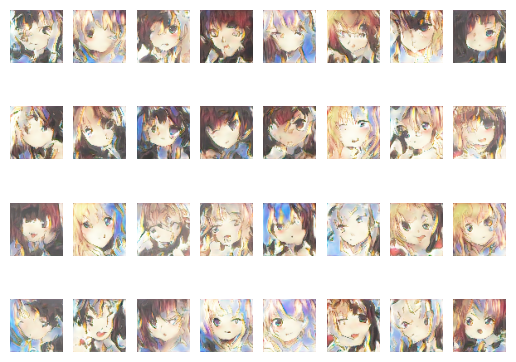

In [38]:
mygans.test_and_show()

In [39]:
mygans.training(3375)

Epochs: 1001
Current loss for discriminator: 0.3587706685066223
Current loss for generator: 3.43025279045105
Epochs: 1002
Current loss for discriminator: 0.47179660201072693
Current loss for generator: 1.5022203922271729
Epochs: 1003
Current loss for discriminator: 0.6576159596443176
Current loss for generator: 6.455836772918701
Epochs: 1004
Current loss for discriminator: 1.1115550994873047
Current loss for generator: 2.617765426635742
Epochs: 1005
Current loss for discriminator: 0.45763784646987915
Current loss for generator: 1.5614484548568726
Epochs: 1006
Current loss for discriminator: 0.5733665227890015
Current loss for generator: 4.515651226043701
Epochs: 1007
Current loss for discriminator: 0.565661609172821
Current loss for generator: 3.0522427558898926
Epochs: 1008
Current loss for discriminator: 0.37368541955947876
Current loss for generator: 2.3070476055145264
Epochs: 1009
Current loss for discriminator: 0.34200698137283325
Current loss for generator: 2.172848701477051
Epoc

Current loss for discriminator: 0.6512424945831299
Current loss for generator: 1.6641361713409424
Epochs: 1045
Current loss for discriminator: 1.1290788650512695
Current loss for generator: 8.546142578125
Epochs: 1046
Current loss for discriminator: 2.5264220237731934
Current loss for generator: 1.438049554824829
Epochs: 1047
Current loss for discriminator: 0.7488209009170532
Current loss for generator: 2.1624302864074707
Epochs: 1048
Current loss for discriminator: 0.4073133170604706
Current loss for generator: 3.0689587593078613
Epochs: 1049
Current loss for discriminator: 0.4269855320453644
Current loss for generator: 2.2991461753845215
Epochs: 1050
Current loss for discriminator: 0.3798205256462097
Current loss for generator: 2.4646921157836914
Epochs: 1051
Current loss for discriminator: 0.4278966784477234
Current loss for generator: 1.9108083248138428
Epochs: 1052
Current loss for discriminator: 0.436286985874176
Current loss for generator: 2.8740668296813965
Epochs: 1053
Current

Current loss for discriminator: 0.4729931652545929
Current loss for generator: 2.5029635429382324
Epochs: 1088
Current loss for discriminator: 0.470613956451416
Current loss for generator: 2.571042060852051
Epochs: 1089
Current loss for discriminator: 0.5017704367637634
Current loss for generator: 4.064499855041504
Epochs: 1090
Current loss for discriminator: 0.2633186876773834
Current loss for generator: 3.795954465866089
Epochs: 1091
Current loss for discriminator: 0.5464968681335449
Current loss for generator: 7.546202182769775
Epochs: 1092
Current loss for discriminator: 0.36595943570137024
Current loss for generator: 5.418091773986816
Epochs: 1093
Current loss for discriminator: 0.36612099409103394
Current loss for generator: 3.128474235534668
Epochs: 1094
Current loss for discriminator: 0.4796150028705597
Current loss for generator: 5.120607376098633
Epochs: 1095
Current loss for discriminator: 0.47701773047447205
Current loss for generator: 3.8406982421875
Epochs: 1096
Current l

Current loss for discriminator: 0.2266179770231247
Current loss for generator: 2.3605055809020996
Epochs: 1131
Current loss for discriminator: 0.5397984385490417
Current loss for generator: 1.7566421031951904
Epochs: 1132
Current loss for discriminator: 0.4871135354042053
Current loss for generator: 3.0431630611419678
Epochs: 1133
Current loss for discriminator: 0.3304728865623474
Current loss for generator: 3.1286745071411133
Epochs: 1134
Current loss for discriminator: 0.43319171667099
Current loss for generator: 1.3943846225738525
Epochs: 1135
Current loss for discriminator: 0.41110119223594666
Current loss for generator: 3.2039146423339844
Epochs: 1136
Current loss for discriminator: 0.3203849196434021
Current loss for generator: 2.750417947769165
Epochs: 1137
Current loss for discriminator: 0.3995476961135864
Current loss for generator: 2.1350107192993164
Epochs: 1138
Current loss for discriminator: 0.26206374168395996
Current loss for generator: 2.7636866569519043
Epochs: 1139
Cu

Current loss for discriminator: 0.21828705072402954
Current loss for generator: 2.956118106842041
Epochs: 1174
Current loss for discriminator: 0.3629741668701172
Current loss for generator: 2.182199239730835
Epochs: 1175
Current loss for discriminator: 0.3551614284515381
Current loss for generator: 3.017735242843628
Epochs: 1176
Current loss for discriminator: 0.24615848064422607
Current loss for generator: 2.886345386505127
Epochs: 1177
Current loss for discriminator: 0.2772478759288788
Current loss for generator: 2.9575018882751465
Epochs: 1178
Current loss for discriminator: 0.22190460562705994
Current loss for generator: 3.152538299560547
Epochs: 1179
Current loss for discriminator: 0.23725777864456177
Current loss for generator: 3.0371758937835693
Epochs: 1180
Current loss for discriminator: 0.40719982981681824
Current loss for generator: 1.4639883041381836
Epochs: 1181
Current loss for discriminator: 0.6996965408325195
Current loss for generator: 5.525540351867676
Epochs: 1182
Cu

Current loss for discriminator: 0.3870628774166107
Current loss for generator: 2.9889073371887207
Epochs: 1217
Current loss for discriminator: 0.4127621352672577
Current loss for generator: 2.3432483673095703
Epochs: 1218
Current loss for discriminator: 0.3398829400539398
Current loss for generator: 3.2704248428344727
Epochs: 1219
Current loss for discriminator: 0.15610194206237793
Current loss for generator: 3.5109410285949707
Epochs: 1220
Current loss for discriminator: 0.25311559438705444
Current loss for generator: 2.160123348236084
Epochs: 1221
Current loss for discriminator: 0.21804581582546234
Current loss for generator: 2.346971035003662
Epochs: 1222
Current loss for discriminator: 0.25889426469802856
Current loss for generator: 4.423853874206543
Epochs: 1223
Current loss for discriminator: 0.32709741592407227
Current loss for generator: 3.7445015907287598
Epochs: 1224
Current loss for discriminator: 0.3603917360305786
Current loss for generator: 1.925929307937622
Epochs: 1225


Current loss for discriminator: 0.46798211336135864
Current loss for generator: 2.4880130290985107
Epochs: 1260
Current loss for discriminator: 0.38270750641822815
Current loss for generator: 4.548051834106445
Epochs: 1261
Current loss for discriminator: 0.4465550184249878
Current loss for generator: 1.559786081314087
Epochs: 1262
Current loss for discriminator: 0.5659297704696655
Current loss for generator: 6.175158500671387
Epochs: 1263
Current loss for discriminator: 0.9385818243026733
Current loss for generator: 1.8430383205413818
Epochs: 1264
Current loss for discriminator: 0.47310250997543335
Current loss for generator: 3.5257349014282227
Epochs: 1265
Current loss for discriminator: 0.2930058240890503
Current loss for generator: 3.1114864349365234
Epochs: 1266
Current loss for discriminator: 0.2483218014240265
Current loss for generator: 2.705824851989746
Epochs: 1267
Current loss for discriminator: 0.41998887062072754
Current loss for generator: 2.4421796798706055
Epochs: 1268
C

Current loss for discriminator: 0.36993807554244995
Current loss for generator: 2.204711675643921
Epochs: 1303
Current loss for discriminator: 0.39799341559410095
Current loss for generator: 2.8997931480407715
Epochs: 1304
Current loss for discriminator: 0.3658514618873596
Current loss for generator: 2.3911657333374023
Epochs: 1305
Current loss for discriminator: 0.31581753492355347
Current loss for generator: 3.4488844871520996
Epochs: 1306
Current loss for discriminator: 0.33142563700675964
Current loss for generator: 3.0132055282592773
Epochs: 1307
Current loss for discriminator: 0.286878764629364
Current loss for generator: 2.6160058975219727
Epochs: 1308
Current loss for discriminator: 0.30375808477401733
Current loss for generator: 3.9777913093566895
Epochs: 1309
Current loss for discriminator: 0.4988044798374176
Current loss for generator: 2.609522581100464
Epochs: 1310
Current loss for discriminator: 0.31916186213493347
Current loss for generator: 2.996119260787964
Epochs: 1311

Current loss for discriminator: 0.4045604467391968
Current loss for generator: 4.869147777557373
Epochs: 1346
Current loss for discriminator: 0.13711676001548767
Current loss for generator: 5.355500221252441
Epochs: 1347
Current loss for discriminator: 0.5498237013816833
Current loss for generator: 2.3378467559814453
Epochs: 1348
Current loss for discriminator: 1.8463523387908936
Current loss for generator: 12.559947967529297
Epochs: 1349
Current loss for discriminator: 6.576213836669922
Current loss for generator: 2.080305337905884
Epochs: 1350
Current loss for discriminator: 0.8215381503105164
Current loss for generator: 2.768734931945801
Epochs: 1351
Current loss for discriminator: 0.3928346633911133
Current loss for generator: 3.1251726150512695
Epochs: 1352
Current loss for discriminator: 0.66102135181427
Current loss for generator: 2.17435622215271
Epochs: 1353
Current loss for discriminator: 0.5419129133224487
Current loss for generator: 2.864400863647461
Epochs: 1354
Current lo

Current loss for generator: 1.9283324480056763
Epochs: 1389
Current loss for discriminator: 0.5014781951904297
Current loss for generator: 2.5374255180358887
Epochs: 1390
Current loss for discriminator: 0.3623338043689728
Current loss for generator: 3.0033798217773438
Epochs: 1391
Current loss for discriminator: 0.4503360390663147
Current loss for generator: 2.398690700531006
Epochs: 1392
Current loss for discriminator: 0.4221360385417938
Current loss for generator: 2.0039663314819336
Epochs: 1393
Current loss for discriminator: 0.5539144277572632
Current loss for generator: 2.0509800910949707
Epochs: 1394
Current loss for discriminator: 0.4885846674442291
Current loss for generator: 2.494720935821533
Epochs: 1395
Current loss for discriminator: 0.5842708945274353
Current loss for generator: 2.218803882598877
Epochs: 1396
Current loss for discriminator: 0.4351118803024292
Current loss for generator: 2.292677879333496
Epochs: 1397
Current loss for discriminator: 0.4391629099845886
Curre

Current loss for generator: 2.9576194286346436
Epochs: 1432
Current loss for discriminator: 0.36353859305381775
Current loss for generator: 3.685215711593628
Epochs: 1433
Current loss for discriminator: 0.3636350631713867
Current loss for generator: 2.690603256225586
Epochs: 1434
Current loss for discriminator: 0.5761321783065796
Current loss for generator: 4.388210296630859
Epochs: 1435
Current loss for discriminator: 0.5070587396621704
Current loss for generator: 2.3997695446014404
Epochs: 1436
Current loss for discriminator: 0.1838596761226654
Current loss for generator: 3.157956123352051
Epochs: 1437
Current loss for discriminator: 0.2398565709590912
Current loss for generator: 3.7531118392944336
Epochs: 1438
Current loss for discriminator: 0.6579737663269043
Current loss for generator: 1.2115962505340576
Epochs: 1439
Current loss for discriminator: 0.7934355735778809
Current loss for generator: 5.3228759765625
Epochs: 1440
Current loss for discriminator: 1.0436241626739502
Current

Current loss for generator: 6.179088592529297
Epochs: 1475
Current loss for discriminator: 0.4082476496696472
Current loss for generator: 3.976372480392456
Epochs: 1476
Current loss for discriminator: 0.4774417579174042
Current loss for generator: 2.126840591430664
Epochs: 1477
Current loss for discriminator: 0.5583842396736145
Current loss for generator: 5.733477592468262
Epochs: 1478
Current loss for discriminator: 0.5760641098022461
Current loss for generator: 4.355116844177246
Epochs: 1479
Current loss for discriminator: 0.35636183619499207
Current loss for generator: 1.6754395961761475
Epochs: 1480
Current loss for discriminator: 0.5007420778274536
Current loss for generator: 2.7476677894592285
Epochs: 1481
Current loss for discriminator: 0.30660301446914673
Current loss for generator: 3.2287373542785645
Epochs: 1482
Current loss for discriminator: 0.17098405957221985
Current loss for generator: 3.4607739448547363
Epochs: 1483
Current loss for discriminator: 0.3009271025657654
Cur

Current loss for generator: 3.0816173553466797
Epochs: 1518
Current loss for discriminator: 0.45085248351097107
Current loss for generator: 1.9313688278198242
Epochs: 1519
Current loss for discriminator: 0.5541397333145142
Current loss for generator: 4.906601428985596
Epochs: 1520
Current loss for discriminator: 0.9324504137039185
Current loss for generator: 2.0246074199676514
Epochs: 1521
Current loss for discriminator: 0.3808671236038208
Current loss for generator: 2.028380870819092
Epochs: 1522
Current loss for discriminator: 0.3331478238105774
Current loss for generator: 2.8693132400512695
Epochs: 1523
Current loss for discriminator: 0.4772375226020813
Current loss for generator: 2.908538341522217
Epochs: 1524
Current loss for discriminator: 0.4607870876789093
Current loss for generator: 2.4483938217163086
Epochs: 1525
Current loss for discriminator: 0.28482234477996826
Current loss for generator: 2.8736844062805176
Epochs: 1526
Current loss for discriminator: 0.3455618619918823
Cu

Current loss for generator: 2.4005680084228516
Epochs: 1561
Current loss for discriminator: 0.4705761969089508
Current loss for generator: 2.779143810272217
Epochs: 1562
Current loss for discriminator: 0.5635521411895752
Current loss for generator: 2.5511555671691895
Epochs: 1563
Current loss for discriminator: 0.42705264687538147
Current loss for generator: 2.338522434234619
Epochs: 1564
Current loss for discriminator: 0.29296499490737915
Current loss for generator: 2.748788833618164
Epochs: 1565
Current loss for discriminator: 0.19390565156936646
Current loss for generator: 4.036884784698486
Epochs: 1566
Current loss for discriminator: 0.21404944360256195
Current loss for generator: 3.3646738529205322
Epochs: 1567
Current loss for discriminator: 0.1206040233373642
Current loss for generator: 3.7313153743743896
Epochs: 1568
Current loss for discriminator: 0.24363262951374054
Current loss for generator: 3.0803775787353516
Epochs: 1569
Current loss for discriminator: 0.1621188223361969


Current loss for generator: 0.8653099536895752
Epochs: 1604
Current loss for discriminator: 1.3400444984436035
Current loss for generator: 4.010619163513184
Epochs: 1605
Current loss for discriminator: 0.7838571667671204
Current loss for generator: 3.250613212585449
Epochs: 1606
Current loss for discriminator: 0.587809681892395
Current loss for generator: 1.9301364421844482
Epochs: 1607
Current loss for discriminator: 0.9875006079673767
Current loss for generator: 4.031698226928711
Epochs: 1608
Current loss for discriminator: 0.8006054162979126
Current loss for generator: 2.0307655334472656
Epochs: 1609
Current loss for discriminator: 0.5381314158439636
Current loss for generator: 2.749807119369507
Epochs: 1610
Current loss for discriminator: 0.6017652750015259
Current loss for generator: 2.5761160850524902
Epochs: 1611
Current loss for discriminator: 0.45932427048683167
Current loss for generator: 2.466977596282959
Epochs: 1612
Current loss for discriminator: 0.4658987820148468
Curren

Epochs: 1647
Current loss for discriminator: 0.38305896520614624
Current loss for generator: 2.4742584228515625
Epochs: 1648
Current loss for discriminator: 0.45169883966445923
Current loss for generator: 2.055610179901123
Epochs: 1649
Current loss for discriminator: 0.6688416004180908
Current loss for generator: 1.7403180599212646
Epochs: 1650
Current loss for discriminator: 0.6159518361091614
Current loss for generator: 2.468613386154175
Epochs: 1651
Current loss for discriminator: 0.39796993136405945
Current loss for generator: 3.0862627029418945
Epochs: 1652
Current loss for discriminator: 0.4040735960006714
Current loss for generator: 2.170534372329712
Epochs: 1653
Current loss for discriminator: 0.2664351463317871
Current loss for generator: 2.4071147441864014
Epochs: 1654
Current loss for discriminator: 0.29048895835876465
Current loss for generator: 2.4320428371429443
Epochs: 1655
Current loss for discriminator: 0.3048160970211029
Current loss for generator: 3.661212921142578
E

Epochs: 1690
Current loss for discriminator: 0.4138032793998718
Current loss for generator: 2.0304296016693115
Epochs: 1691
Current loss for discriminator: 0.34079301357269287
Current loss for generator: 3.495678424835205
Epochs: 1692
Current loss for discriminator: 0.36194926500320435
Current loss for generator: 3.593411445617676
Epochs: 1693
Current loss for discriminator: 0.45946234464645386
Current loss for generator: 2.4347667694091797
Epochs: 1694
Current loss for discriminator: 0.2779679298400879
Current loss for generator: 3.4646999835968018
Epochs: 1695
Current loss for discriminator: 0.29847127199172974
Current loss for generator: 4.3150835037231445
Epochs: 1696
Current loss for discriminator: 0.14224563539028168
Current loss for generator: 4.439464092254639
Epochs: 1697
Current loss for discriminator: 0.3845168352127075
Current loss for generator: 2.1642677783966064
Epochs: 1698
Current loss for discriminator: 0.23136217892169952
Current loss for generator: 3.286844730377197

Epochs: 1733
Current loss for discriminator: 0.2799421548843384
Current loss for generator: 3.1749398708343506
Epochs: 1734
Current loss for discriminator: 0.8054859638214111
Current loss for generator: 1.7424609661102295
Epochs: 1735
Current loss for discriminator: 0.8787501454353333
Current loss for generator: 6.421546936035156
Epochs: 1736
Current loss for discriminator: 1.0271317958831787
Current loss for generator: 3.2689170837402344
Epochs: 1737
Current loss for discriminator: 0.22706300020217896
Current loss for generator: 1.993768334388733
Epochs: 1738
Current loss for discriminator: 0.7020032405853271
Current loss for generator: 5.100174427032471
Epochs: 1739
Current loss for discriminator: 0.3563201129436493
Current loss for generator: 4.611820220947266
Epochs: 1740
Current loss for discriminator: 0.35605481266975403
Current loss for generator: 2.8240723609924316
Epochs: 1741
Current loss for discriminator: 0.5250285863876343
Current loss for generator: 3.2699594497680664
Epo

Epochs: 1776
Current loss for discriminator: 0.5033580660820007
Current loss for generator: 1.9695886373519897
Epochs: 1777
Current loss for discriminator: 0.47856414318084717
Current loss for generator: 2.2079763412475586
Epochs: 1778
Current loss for discriminator: 0.5789958238601685
Current loss for generator: 2.383497953414917
Epochs: 1779
Current loss for discriminator: 0.43703263998031616
Current loss for generator: 2.799792766571045
Epochs: 1780
Current loss for discriminator: 0.4734249711036682
Current loss for generator: 2.371159076690674
Epochs: 1781
Current loss for discriminator: 0.4002441167831421
Current loss for generator: 2.2609763145446777
Epochs: 1782
Current loss for discriminator: 0.3116414546966553
Current loss for generator: 2.632999897003174
Epochs: 1783
Current loss for discriminator: 0.2376672923564911
Current loss for generator: 3.353658437728882
Epochs: 1784
Current loss for discriminator: 0.3029097318649292
Current loss for generator: 3.0693883895874023
Epoc

Epochs: 1819
Current loss for discriminator: 0.32479575276374817
Current loss for generator: 2.9845614433288574
Epochs: 1820
Current loss for discriminator: 0.29803457856178284
Current loss for generator: 3.5610439777374268
Epochs: 1821
Current loss for discriminator: 0.31225478649139404
Current loss for generator: 5.073533535003662
Epochs: 1822
Current loss for discriminator: 0.4347250461578369
Current loss for generator: 2.6343162059783936
Epochs: 1823
Current loss for discriminator: 0.7315706610679626
Current loss for generator: 6.500263214111328
Epochs: 1824
Current loss for discriminator: 0.9323616027832031
Current loss for generator: 3.0066819190979004
Epochs: 1825
Current loss for discriminator: 0.20598290860652924
Current loss for generator: 1.4491491317749023
Epochs: 1826
Current loss for discriminator: 0.667620062828064
Current loss for generator: 6.049379348754883
Epochs: 1827
Current loss for discriminator: 1.0592468976974487
Current loss for generator: 2.7390570640563965
E

Epochs: 1862
Current loss for discriminator: 0.26892465353012085
Current loss for generator: 3.012376308441162
Epochs: 1863
Current loss for discriminator: 0.2945188283920288
Current loss for generator: 4.1428914070129395
Epochs: 1864
Current loss for discriminator: 0.2552007734775543
Current loss for generator: 3.3877198696136475
Epochs: 1865
Current loss for discriminator: 0.44519639015197754
Current loss for generator: 2.1164932250976562
Epochs: 1866
Current loss for discriminator: 0.4010508060455322
Current loss for generator: 3.8672075271606445
Epochs: 1867
Current loss for discriminator: 0.2953912913799286
Current loss for generator: 3.2479538917541504
Epochs: 1868
Current loss for discriminator: 0.3365429937839508
Current loss for generator: 1.8999972343444824
Epochs: 1869
Current loss for discriminator: 0.4260815680027008
Current loss for generator: 3.579993963241577
Epochs: 1870
Current loss for discriminator: 0.3506492078304291
Current loss for generator: 3.4718971252441406
E

Epochs: 1905
Current loss for discriminator: 0.43120038509368896
Current loss for generator: 3.1829123497009277
Epochs: 1906
Current loss for discriminator: 0.28138864040374756
Current loss for generator: 3.057033061981201
Epochs: 1907
Current loss for discriminator: 0.26363927125930786
Current loss for generator: 2.555421829223633
Epochs: 1908
Current loss for discriminator: 0.23544137179851532
Current loss for generator: 4.528592109680176
Epochs: 1909
Current loss for discriminator: 0.4645603597164154
Current loss for generator: 2.9360156059265137
Epochs: 1910
Current loss for discriminator: 0.2749539911746979
Current loss for generator: 2.2677955627441406
Epochs: 1911
Current loss for discriminator: 0.3733081817626953
Current loss for generator: 2.5772452354431152
Epochs: 1912
Current loss for discriminator: 0.3917202353477478
Current loss for generator: 4.486428260803223
Epochs: 1913
Current loss for discriminator: 0.4453233778476715
Current loss for generator: 2.469146728515625
Ep

Epochs: 1948
Current loss for discriminator: 0.8229286670684814
Current loss for generator: 2.3252475261688232
Epochs: 1949
Current loss for discriminator: 0.605552613735199
Current loss for generator: 3.029898166656494
Epochs: 1950
Current loss for discriminator: 0.37175771594047546
Current loss for generator: 2.862135171890259
Epochs: 1951
Current loss for discriminator: 0.2911428213119507
Current loss for generator: 2.5421385765075684
Epochs: 1952
Current loss for discriminator: 0.31059786677360535
Current loss for generator: 2.08162784576416
Epochs: 1953
Current loss for discriminator: 0.44362056255340576
Current loss for generator: 3.606630802154541
Epochs: 1954
Current loss for discriminator: 0.453882098197937
Current loss for generator: 2.6910476684570312
Epochs: 1955
Current loss for discriminator: 0.681806743144989
Current loss for generator: 2.500884771347046
Epochs: 1956
Current loss for discriminator: 0.705447793006897
Current loss for generator: 3.417308807373047
Epochs: 1

Epochs: 1991
Current loss for discriminator: 0.15864726901054382
Current loss for generator: 3.209357500076294
Epochs: 1992
Current loss for discriminator: 0.27803871035575867
Current loss for generator: 2.8100030422210693
Epochs: 1993
Current loss for discriminator: 0.44736504554748535
Current loss for generator: 3.45487117767334
Epochs: 1994
Current loss for discriminator: 0.39467284083366394
Current loss for generator: 1.6722718477249146
Epochs: 1995
Current loss for discriminator: 0.48247310519218445
Current loss for generator: 3.6763916015625
Epochs: 1996
Current loss for discriminator: 0.2847857177257538
Current loss for generator: 3.306914806365967
Epochs: 1997
Current loss for discriminator: 0.36390072107315063
Current loss for generator: 2.4597089290618896
Epochs: 1998
Current loss for discriminator: 0.5253469944000244
Current loss for generator: 2.5857155323028564
Epochs: 1999
Current loss for discriminator: 0.2003696858882904
Current loss for generator: 3.0910892486572266
Ep

Epochs: 2034
Current loss for discriminator: 0.765625
Current loss for generator: 3.872748851776123
Epochs: 2035
Current loss for discriminator: 0.12707670032978058
Current loss for generator: 4.731629371643066
Epochs: 2036
Current loss for discriminator: 0.3540482521057129
Current loss for generator: 3.1932997703552246
Epochs: 2037
Current loss for discriminator: 0.3457627594470978
Current loss for generator: 3.114069938659668
Epochs: 2038
Current loss for discriminator: 0.31353217363357544
Current loss for generator: 4.012240409851074
Epochs: 2039
Current loss for discriminator: 0.5394904613494873
Current loss for generator: 1.207680344581604
Epochs: 2040
Current loss for discriminator: 1.0517174005508423
Current loss for generator: 6.698904991149902
Epochs: 2041
Current loss for discriminator: 1.964590311050415
Current loss for generator: 2.3127706050872803
Epochs: 2042
Current loss for discriminator: 0.38752424716949463
Current loss for generator: 1.077463150024414
Epochs: 2043
Cur

Epochs: 2077
Current loss for discriminator: 0.33521515130996704
Current loss for generator: 4.598845958709717
Epochs: 2078
Current loss for discriminator: 0.2111712396144867
Current loss for generator: 3.0875425338745117
Epochs: 2079
Current loss for discriminator: 0.2559628188610077
Current loss for generator: 2.764714241027832
Epochs: 2080
Current loss for discriminator: 0.264138400554657
Current loss for generator: 4.682988166809082
Epochs: 2081
Current loss for discriminator: 0.16287633776664734
Current loss for generator: 4.164249897003174
Epochs: 2082
Current loss for discriminator: 0.19334372878074646
Current loss for generator: 3.0031352043151855
Epochs: 2083
Current loss for discriminator: 0.21266886591911316
Current loss for generator: 3.333542585372925
Epochs: 2084
Current loss for discriminator: 0.15158377587795258
Current loss for generator: 3.4132919311523438
Epochs: 2085
Current loss for discriminator: 0.30340275168418884
Current loss for generator: 4.215603351593018
Ep

Epochs: 2120
Current loss for discriminator: 0.3574557304382324
Current loss for generator: 3.573611259460449
Epochs: 2121
Current loss for discriminator: 0.32046082615852356
Current loss for generator: 2.470611572265625
Epochs: 2122
Current loss for discriminator: 0.3516790568828583
Current loss for generator: 3.474903106689453
Epochs: 2123
Current loss for discriminator: 0.22021447122097015
Current loss for generator: 4.0211944580078125
Epochs: 2124
Current loss for discriminator: 0.36913642287254333
Current loss for generator: 2.855570077896118
Epochs: 2125
Current loss for discriminator: 0.35724693536758423
Current loss for generator: 3.368168830871582
Epochs: 2126
Current loss for discriminator: 0.4169750213623047
Current loss for generator: 2.8232035636901855
Epochs: 2127
Current loss for discriminator: 0.4283182621002197
Current loss for generator: 2.4370720386505127
Epochs: 2128
Current loss for discriminator: 0.3835350275039673
Current loss for generator: 4.363780975341797
Epo

Epochs: 2163
Current loss for discriminator: 0.49260401725769043
Current loss for generator: 2.71541428565979
Epochs: 2164
Current loss for discriminator: 0.3552173972129822
Current loss for generator: 3.1003916263580322
Epochs: 2165
Current loss for discriminator: 0.36645764112472534
Current loss for generator: 2.928431987762451
Epochs: 2166
Current loss for discriminator: 0.34687894582748413
Current loss for generator: 2.910794496536255
Epochs: 2167
Current loss for discriminator: 0.5351840257644653
Current loss for generator: 2.9183509349823
Epochs: 2168
Current loss for discriminator: 0.40170028805732727
Current loss for generator: 2.3695414066314697
Epochs: 2169
Current loss for discriminator: 0.4516400396823883
Current loss for generator: 2.334077835083008
Epochs: 2170
Current loss for discriminator: 0.30584657192230225
Current loss for generator: 2.934969425201416
Epochs: 2171
Current loss for discriminator: 0.3546622097492218
Current loss for generator: 2.3981990814208984
Epoch

Epochs: 2206
Current loss for discriminator: 0.17763453722000122
Current loss for generator: 5.273520469665527
Epochs: 2207
Current loss for discriminator: 0.5059880018234253
Current loss for generator: 2.0771708488464355
Epochs: 2208
Current loss for discriminator: 0.4656037390232086
Current loss for generator: 4.651559829711914
Epochs: 2209
Current loss for discriminator: 0.0395311564207077
Current loss for generator: 5.162096977233887
Epochs: 2210
Current loss for discriminator: 0.4368799030780792
Current loss for generator: 3.200352668762207
Epochs: 2211
Current loss for discriminator: 0.3911607265472412
Current loss for generator: 6.352238655090332
Epochs: 2212
Current loss for discriminator: 0.1385640799999237
Current loss for generator: 6.803190231323242
Epochs: 2213
Current loss for discriminator: 0.4894116222858429
Current loss for generator: 2.496426582336426
Epochs: 2214
Current loss for discriminator: 0.6597234010696411
Current loss for generator: 7.387510299682617
Epochs: 

Current loss for discriminator: 0.2684471607208252
Current loss for generator: 3.240138530731201
Epochs: 2250
Current loss for discriminator: 0.331684410572052
Current loss for generator: 3.073056221008301
Epochs: 2251
Current loss for discriminator: 0.2614409327507019
Current loss for generator: 4.5752105712890625
Epochs: 2252
Current loss for discriminator: 0.3124149441719055
Current loss for generator: 3.0088632106781006
Epochs: 2253
Current loss for discriminator: 0.3203836679458618
Current loss for generator: 4.569537162780762
Epochs: 2254
Current loss for discriminator: 0.41565603017807007
Current loss for generator: 2.2122771739959717
Epochs: 2255
Current loss for discriminator: 0.3560602068901062
Current loss for generator: 4.070049285888672
Epochs: 2256
Current loss for discriminator: 0.5564908385276794
Current loss for generator: 2.2486822605133057
Epochs: 2257
Current loss for discriminator: 0.40069276094436646
Current loss for generator: 3.021742582321167
Epochs: 2258
Curre

Current loss for discriminator: 0.19573324918746948
Current loss for generator: 3.4905099868774414
Epochs: 2293
Current loss for discriminator: 0.44766074419021606
Current loss for generator: 1.6186697483062744
Epochs: 2294
Current loss for discriminator: 0.639821469783783
Current loss for generator: 5.4527764320373535
Epochs: 2295
Current loss for discriminator: 0.32362601161003113
Current loss for generator: 4.470085144042969
Epochs: 2296
Current loss for discriminator: 0.5305613875389099
Current loss for generator: 1.194467544555664
Epochs: 2297
Current loss for discriminator: 0.632569432258606
Current loss for generator: 3.403613805770874
Epochs: 2298
Current loss for discriminator: 0.2622474730014801
Current loss for generator: 3.6043624877929688
Epochs: 2299
Current loss for discriminator: 0.4407500922679901
Current loss for generator: 2.7503886222839355
Epochs: 2300
Current loss for discriminator: 0.2753341794013977
Current loss for generator: 2.985480785369873
Epochs: 2301
Curr

Current loss for discriminator: 0.2210303544998169
Current loss for generator: 3.1600403785705566
Epochs: 2336
Current loss for discriminator: 0.1994820535182953
Current loss for generator: 2.7738089561462402
Epochs: 2337
Current loss for discriminator: 0.28304100036621094
Current loss for generator: 2.9716293811798096
Epochs: 2338
Current loss for discriminator: 0.3552466034889221
Current loss for generator: 2.3241677284240723
Epochs: 2339
Current loss for discriminator: 0.23029792308807373
Current loss for generator: 2.559009075164795
Epochs: 2340
Current loss for discriminator: 0.18763212859630585
Current loss for generator: 4.273830890655518
Epochs: 2341
Current loss for discriminator: 0.2444717288017273
Current loss for generator: 3.6104536056518555
Epochs: 2342
Current loss for discriminator: 0.24092020094394684
Current loss for generator: 2.3415119647979736
Epochs: 2343
Current loss for discriminator: 0.23961441218852997
Current loss for generator: 4.486384391784668
Epochs: 2344

Current loss for discriminator: 0.20813891291618347
Current loss for generator: 3.4416775703430176
Epochs: 2379
Current loss for discriminator: 0.3159191906452179
Current loss for generator: 2.6331920623779297
Epochs: 2380
Current loss for discriminator: 0.4215203523635864
Current loss for generator: 3.733070135116577
Epochs: 2381
Current loss for discriminator: 0.2823902666568756
Current loss for generator: 3.393728256225586
Epochs: 2382
Current loss for discriminator: 0.26605188846588135
Current loss for generator: 3.537301540374756
Epochs: 2383
Current loss for discriminator: 0.32545483112335205
Current loss for generator: 3.0878701210021973
Epochs: 2384
Current loss for discriminator: 0.3374791145324707
Current loss for generator: 3.438782215118408
Epochs: 2385
Current loss for discriminator: 0.262762188911438
Current loss for generator: 3.8024230003356934
Epochs: 2386
Current loss for discriminator: 0.5409716367721558
Current loss for generator: 1.2044042348861694
Epochs: 2387
Cur

Current loss for discriminator: 0.6287330389022827
Current loss for generator: 1.9148534536361694
Epochs: 2422
Current loss for discriminator: 0.7075415849685669
Current loss for generator: 1.6942944526672363
Epochs: 2423
Current loss for discriminator: 0.8054994344711304
Current loss for generator: 1.6868712902069092
Epochs: 2424
Current loss for discriminator: 0.7291187047958374
Current loss for generator: 1.995436429977417
Epochs: 2425
Current loss for discriminator: 0.6190559267997742
Current loss for generator: 1.9047739505767822
Epochs: 2426
Current loss for discriminator: 0.7067723274230957
Current loss for generator: 1.7680108547210693
Epochs: 2427
Current loss for discriminator: 0.6310515403747559
Current loss for generator: 2.3068511486053467
Epochs: 2428
Current loss for discriminator: 0.598119854927063
Current loss for generator: 2.7319328784942627
Epochs: 2429
Current loss for discriminator: 0.6299868822097778
Current loss for generator: 2.15813946723938
Epochs: 2430
Curre

Current loss for discriminator: 0.42517250776290894
Current loss for generator: 3.958822011947632
Epochs: 2465
Current loss for discriminator: 0.32660967111587524
Current loss for generator: 3.847104072570801
Epochs: 2466
Current loss for discriminator: 0.36127182841300964
Current loss for generator: 3.4390878677368164
Epochs: 2467
Current loss for discriminator: 0.36938226222991943
Current loss for generator: 4.204603672027588
Epochs: 2468
Current loss for discriminator: 0.3125933110713959
Current loss for generator: 5.002964973449707
Epochs: 2469
Current loss for discriminator: 0.4866482615470886
Current loss for generator: 2.5658257007598877
Epochs: 2470
Current loss for discriminator: 0.2861402630805969
Current loss for generator: 4.133962631225586
Epochs: 2471
Current loss for discriminator: 0.2064344584941864
Current loss for generator: 3.6717782020568848
Epochs: 2472
Current loss for discriminator: 0.28864896297454834
Current loss for generator: 3.2935781478881836
Epochs: 2473
C

Current loss for generator: 3.6676583290100098
Epochs: 2508
Current loss for discriminator: 0.32186317443847656
Current loss for generator: 2.5037918090820312
Epochs: 2509
Current loss for discriminator: 0.46038079261779785
Current loss for generator: 3.1952154636383057
Epochs: 2510
Current loss for discriminator: 0.27280640602111816
Current loss for generator: 3.0891971588134766
Epochs: 2511
Current loss for discriminator: 0.5378998517990112
Current loss for generator: 2.960221290588379
Epochs: 2512
Current loss for discriminator: 0.28182849287986755
Current loss for generator: 2.469906806945801
Epochs: 2513
Current loss for discriminator: 0.2899836301803589
Current loss for generator: 2.8108959197998047
Epochs: 2514
Current loss for discriminator: 0.34645766019821167
Current loss for generator: 3.3884811401367188
Epochs: 2515
Current loss for discriminator: 0.23443874716758728
Current loss for generator: 2.6174838542938232
Epochs: 2516
Current loss for discriminator: 0.22400745749473

Current loss for generator: 2.7369227409362793
Epochs: 2551
Current loss for discriminator: 0.21814465522766113
Current loss for generator: 3.0863823890686035
Epochs: 2552
Current loss for discriminator: 0.20350074768066406
Current loss for generator: 3.067850351333618
Epochs: 2553
Current loss for discriminator: 0.23525822162628174
Current loss for generator: 2.9794046878814697
Epochs: 2554
Current loss for discriminator: 0.18016599118709564
Current loss for generator: 3.6316189765930176
Epochs: 2555
Current loss for discriminator: 0.16746892035007477
Current loss for generator: 3.2911741733551025
Epochs: 2556
Current loss for discriminator: 0.16327622532844543
Current loss for generator: 3.5182065963745117
Epochs: 2557
Current loss for discriminator: 0.13171905279159546
Current loss for generator: 3.803316593170166
Epochs: 2558
Current loss for discriminator: 0.398101806640625
Current loss for generator: 1.3870909214019775
Epochs: 2559
Current loss for discriminator: 0.57048177719116

Current loss for generator: 3.0607991218566895
Epochs: 2594
Current loss for discriminator: 0.283855676651001
Current loss for generator: 2.1818439960479736
Epochs: 2595
Current loss for discriminator: 0.2821985185146332
Current loss for generator: 2.74318265914917
Epochs: 2596
Current loss for discriminator: 0.3049298822879791
Current loss for generator: 3.484541893005371
Epochs: 2597
Current loss for discriminator: 0.21589010953903198
Current loss for generator: 3.3105854988098145
Epochs: 2598
Current loss for discriminator: 0.24485595524311066
Current loss for generator: 2.4377777576446533
Epochs: 2599
Current loss for discriminator: 0.4377475380897522
Current loss for generator: 3.3702480792999268
Epochs: 2600
Current loss for discriminator: 0.4114491939544678
Current loss for generator: 3.5188846588134766
Epochs: 2601
Current loss for discriminator: 0.25213634967803955
Current loss for generator: 3.8834831714630127
Epochs: 2602
Current loss for discriminator: 0.4232581555843353
Cu

Current loss for generator: 5.659090042114258
Epochs: 2637
Current loss for discriminator: 0.42328476905822754
Current loss for generator: 2.9277594089508057
Epochs: 2638
Current loss for discriminator: 0.4197750985622406
Current loss for generator: 4.2938408851623535
Epochs: 2639
Current loss for discriminator: 0.44992274045944214
Current loss for generator: 3.073563575744629
Epochs: 2640
Current loss for discriminator: 0.5428764820098877
Current loss for generator: 4.4275922775268555
Epochs: 2641
Current loss for discriminator: 0.16276724636554718
Current loss for generator: 5.538161754608154
Epochs: 2642
Current loss for discriminator: 0.3241715431213379
Current loss for generator: 3.515439510345459
Epochs: 2643
Current loss for discriminator: 0.32219958305358887
Current loss for generator: 6.7738237380981445
Epochs: 2644
Current loss for discriminator: 0.6592586040496826
Current loss for generator: 2.791391611099243
Epochs: 2645
Current loss for discriminator: 0.4395454525947571
Cu

Current loss for generator: 3.5970702171325684
Epochs: 2680
Current loss for discriminator: 0.23576070368289948
Current loss for generator: 2.9919824600219727
Epochs: 2681
Current loss for discriminator: 0.26869815587997437
Current loss for generator: 3.7520928382873535
Epochs: 2682
Current loss for discriminator: 0.17994050681591034
Current loss for generator: 3.1619648933410645
Epochs: 2683
Current loss for discriminator: 0.48914626240730286
Current loss for generator: 2.0966968536376953
Epochs: 2684
Current loss for discriminator: 0.46362996101379395
Current loss for generator: 4.464556694030762
Epochs: 2685
Current loss for discriminator: 0.44153156876564026
Current loss for generator: 3.429529905319214
Epochs: 2686
Current loss for discriminator: 0.3827662467956543
Current loss for generator: 4.859014511108398
Epochs: 2687
Current loss for discriminator: 0.33340874314308167
Current loss for generator: 3.681267738342285
Epochs: 2688
Current loss for discriminator: 0.217550843954086

Current loss for generator: 2.493344306945801
Epochs: 2723
Current loss for discriminator: 0.4355752468109131
Current loss for generator: 6.968345642089844
Epochs: 2724
Current loss for discriminator: 0.735786497592926
Current loss for generator: 1.9984471797943115
Epochs: 2725
Current loss for discriminator: 0.31799089908599854
Current loss for generator: 2.526017189025879
Epochs: 2726
Current loss for discriminator: 0.4809209704399109
Current loss for generator: 6.690546035766602
Epochs: 2727
Current loss for discriminator: 1.105974793434143
Current loss for generator: 2.990492343902588
Epochs: 2728
Current loss for discriminator: 0.30493849515914917
Current loss for generator: 2.517414093017578
Epochs: 2729
Current loss for discriminator: 0.39229097962379456
Current loss for generator: 3.7172670364379883
Epochs: 2730
Current loss for discriminator: 0.3089521527290344
Current loss for generator: 3.7582545280456543
Epochs: 2731
Current loss for discriminator: 0.37713393568992615
Curre

Current loss for generator: 3.5680363178253174
Epochs: 2766
Current loss for discriminator: 0.22828379273414612
Current loss for generator: 2.1881330013275146
Epochs: 2767
Current loss for discriminator: 0.352756142616272
Current loss for generator: 3.435591697692871
Epochs: 2768
Current loss for discriminator: 0.21039730310440063
Current loss for generator: 3.1896705627441406
Epochs: 2769
Current loss for discriminator: 0.20007994771003723
Current loss for generator: 2.7391395568847656
Epochs: 2770
Current loss for discriminator: 0.20610330998897552
Current loss for generator: 3.3757975101470947
Epochs: 2771
Current loss for discriminator: 0.2856433093547821
Current loss for generator: 2.518195629119873
Epochs: 2772
Current loss for discriminator: 0.31205856800079346
Current loss for generator: 3.3961877822875977
Epochs: 2773
Current loss for discriminator: 0.2812664806842804
Current loss for generator: 3.2086870670318604
Epochs: 2774
Current loss for discriminator: 0.3201997280120849

Current loss for generator: 3.51191782951355
Epochs: 2809
Current loss for discriminator: 0.28511446714401245
Current loss for generator: 2.747826099395752
Epochs: 2810
Current loss for discriminator: 0.2356364130973816
Current loss for generator: 2.7855710983276367
Epochs: 2811
Current loss for discriminator: 0.25595489144325256
Current loss for generator: 3.6367874145507812
Epochs: 2812
Current loss for discriminator: 0.30206936597824097
Current loss for generator: 2.8483119010925293
Epochs: 2813
Current loss for discriminator: 0.37035250663757324
Current loss for generator: 2.055105686187744
Epochs: 2814
Current loss for discriminator: 0.365729421377182
Current loss for generator: 3.906996250152588
Epochs: 2815
Current loss for discriminator: 0.41773974895477295
Current loss for generator: 3.009002208709717
Epochs: 2816
Current loss for discriminator: 0.40603020787239075
Current loss for generator: 2.0399856567382812
Epochs: 2817
Current loss for discriminator: 0.2718302011489868
Cu

Current loss for generator: 2.082728385925293
Epochs: 2852
Current loss for discriminator: 0.29959213733673096
Current loss for generator: 3.1229400634765625
Epochs: 2853
Current loss for discriminator: 0.28537893295288086
Current loss for generator: 3.593512773513794
Epochs: 2854
Current loss for discriminator: 0.43851423263549805
Current loss for generator: 2.1729390621185303
Epochs: 2855
Current loss for discriminator: 0.41176876425743103
Current loss for generator: 3.419499158859253
Epochs: 2856
Current loss for discriminator: 0.22612343728542328
Current loss for generator: 3.2540230751037598
Epochs: 2857
Current loss for discriminator: 0.4989328384399414
Current loss for generator: 1.7497119903564453
Epochs: 2858
Current loss for discriminator: 0.4724249839782715
Current loss for generator: 4.266629219055176
Epochs: 2859
Current loss for discriminator: 0.28476256132125854
Current loss for generator: 3.888571262359619
Epochs: 2860
Current loss for discriminator: 0.29809653759002686

Current loss for generator: 1.4698700904846191
Epochs: 2895
Current loss for discriminator: 0.5582644939422607
Current loss for generator: 3.833493709564209
Epochs: 2896
Current loss for discriminator: 0.24263423681259155
Current loss for generator: 3.8123111724853516
Epochs: 2897
Current loss for discriminator: 0.23682978749275208
Current loss for generator: 2.994403600692749
Epochs: 2898
Current loss for discriminator: 0.12141259014606476
Current loss for generator: 2.6890485286712646
Epochs: 2899
Current loss for discriminator: 0.1522790491580963
Current loss for generator: 3.05696177482605
Epochs: 2900
Current loss for discriminator: 0.22692181169986725
Current loss for generator: 3.280770778656006
Epochs: 2901
Current loss for discriminator: 0.16319724917411804
Current loss for generator: 3.257946729660034
Epochs: 2902
Current loss for discriminator: 0.20261752605438232
Current loss for generator: 3.672273635864258
Epochs: 2903
Current loss for discriminator: 0.33399325609207153
C

Current loss for generator: 3.947615146636963
Epochs: 2938
Current loss for discriminator: 0.32283955812454224
Current loss for generator: 3.601408004760742
Epochs: 2939
Current loss for discriminator: 0.2387162446975708
Current loss for generator: 2.96026611328125
Epochs: 2940
Current loss for discriminator: 0.26835691928863525
Current loss for generator: 4.11453914642334
Epochs: 2941
Current loss for discriminator: 0.23813875019550323
Current loss for generator: 3.5395116806030273
Epochs: 2942
Current loss for discriminator: 0.41607117652893066
Current loss for generator: 2.7199935913085938
Epochs: 2943
Current loss for discriminator: 0.3708970248699188
Current loss for generator: 5.482171535491943
Epochs: 2944
Current loss for discriminator: 0.2963006794452667
Current loss for generator: 4.976751804351807
Epochs: 2945
Current loss for discriminator: 0.378031849861145
Current loss for generator: 2.9729747772216797
Epochs: 2946
Current loss for discriminator: 0.6179230213165283
Curren

Current loss for generator: 2.6091220378875732
Epochs: 2981
Current loss for discriminator: 0.3047490119934082
Current loss for generator: 4.345871925354004
Epochs: 2982
Current loss for discriminator: 0.445079505443573
Current loss for generator: 3.362241506576538
Epochs: 2983
Current loss for discriminator: 0.14473974704742432
Current loss for generator: 2.6903157234191895
Epochs: 2984
Current loss for discriminator: 0.3902096152305603
Current loss for generator: 3.5281598567962646
Epochs: 2985
Current loss for discriminator: 0.35479140281677246
Current loss for generator: 3.7100772857666016
Epochs: 2986
Current loss for discriminator: 0.22779938578605652
Current loss for generator: 2.8372693061828613
Epochs: 2987
Current loss for discriminator: 0.24714797735214233
Current loss for generator: 4.915222644805908
Epochs: 2988
Current loss for discriminator: 0.2981446087360382
Current loss for generator: 2.9560577869415283
Epochs: 2989
Current loss for discriminator: 0.3469057083129883
C

Current loss for generator: 2.954374074935913
Epochs: 3024
Current loss for discriminator: 0.3830985724925995
Current loss for generator: 3.6057236194610596
Epochs: 3025
Current loss for discriminator: 0.2500550448894501
Current loss for generator: 3.6655049324035645
Epochs: 3026
Current loss for discriminator: 0.34108659625053406
Current loss for generator: 3.801415205001831
Epochs: 3027
Current loss for discriminator: 0.23608824610710144
Current loss for generator: 4.108099937438965
Epochs: 3028
Current loss for discriminator: 0.27306002378463745
Current loss for generator: 3.148705005645752
Epochs: 3029
Current loss for discriminator: 0.22976334393024445
Current loss for generator: 2.6754817962646484
Epochs: 3030
Current loss for discriminator: 0.31748461723327637
Current loss for generator: 4.125840187072754
Epochs: 3031
Current loss for discriminator: 0.2498738169670105
Current loss for generator: 3.729459524154663
Epochs: 3032
Current loss for discriminator: 0.31350263953208923
C

Current loss for generator: 2.6255640983581543
Epochs: 3067
Current loss for discriminator: 0.2918471097946167
Current loss for generator: 2.503366470336914
Epochs: 3068
Current loss for discriminator: 0.2705065608024597
Current loss for generator: 3.9249439239501953
Epochs: 3069
Current loss for discriminator: 0.12694226205348969
Current loss for generator: 4.043728828430176
Epochs: 3070
Current loss for discriminator: 0.43407711386680603
Current loss for generator: 1.993062973022461
Epochs: 3071
Current loss for discriminator: 0.4510722756385803
Current loss for generator: 3.2326698303222656
Epochs: 3072
Current loss for discriminator: 0.29965949058532715
Current loss for generator: 3.2449212074279785
Epochs: 3073
Current loss for discriminator: 0.2646714746952057
Current loss for generator: 2.9363553524017334
Epochs: 3074
Current loss for discriminator: 0.2813902497291565
Current loss for generator: 3.6048481464385986
Epochs: 3075
Current loss for discriminator: 0.2211771309375763
C

Current loss for generator: 3.6848630905151367
Epochs: 3110
Current loss for discriminator: 0.16111859679222107
Current loss for generator: 3.3592443466186523
Epochs: 3111
Current loss for discriminator: 0.19292962551116943
Current loss for generator: 4.29824161529541
Epochs: 3112
Current loss for discriminator: 0.23617443442344666
Current loss for generator: 3.3120651245117188
Epochs: 3113
Current loss for discriminator: 0.18603666126728058
Current loss for generator: 3.8965091705322266
Epochs: 3114
Current loss for discriminator: 0.3508359491825104
Current loss for generator: 2.840475082397461
Epochs: 3115
Current loss for discriminator: 0.41904330253601074
Current loss for generator: 2.8375487327575684
Epochs: 3116
Current loss for discriminator: 0.4185452163219452
Current loss for generator: 3.376786231994629
Epochs: 3117
Current loss for discriminator: 0.3050086796283722
Current loss for generator: 4.821036338806152
Epochs: 3118
Current loss for discriminator: 0.3933885395526886
C

Current loss for generator: 2.4798362255096436
Epochs: 3153
Current loss for discriminator: 0.6395944356918335
Current loss for generator: 2.1676523685455322
Epochs: 3154
Current loss for discriminator: 0.49662652611732483
Current loss for generator: 2.451144218444824
Epochs: 3155
Current loss for discriminator: 0.37317460775375366
Current loss for generator: 2.706096887588501
Epochs: 3156
Current loss for discriminator: 0.4957374334335327
Current loss for generator: 2.12778639793396
Epochs: 3157
Current loss for discriminator: 0.4096280038356781
Current loss for generator: 2.7019901275634766
Epochs: 3158
Current loss for discriminator: 0.4428562521934509
Current loss for generator: 2.6793973445892334
Epochs: 3159
Current loss for discriminator: 0.4981183409690857
Current loss for generator: 1.8491950035095215
Epochs: 3160
Current loss for discriminator: 0.4743747115135193
Current loss for generator: 2.7377500534057617
Epochs: 3161
Current loss for discriminator: 0.3928748667240143
Cur

Current loss for generator: 3.7075247764587402
Epochs: 3196
Current loss for discriminator: 0.3001973032951355
Current loss for generator: 4.009820938110352
Epochs: 3197
Current loss for discriminator: 0.4917163550853729
Current loss for generator: 3.100210189819336
Epochs: 3198
Current loss for discriminator: 0.3132202923297882
Current loss for generator: 4.5264105796813965
Epochs: 3199
Current loss for discriminator: 0.47383201122283936
Current loss for generator: 2.7867321968078613
Epochs: 3200
Current loss for discriminator: 0.35235166549682617
Current loss for generator: 1.765798807144165
Epochs: 3201
Current loss for discriminator: 0.8506483435630798
Current loss for generator: 6.871773719787598
Epochs: 3202
Current loss for discriminator: 1.1560434103012085
Current loss for generator: 3.675661563873291
Epochs: 3203
Current loss for discriminator: 0.3234950304031372
Current loss for generator: 1.6751337051391602
Epochs: 3204
Current loss for discriminator: 0.7051709294319153
Curr

Current loss for generator: 2.924436569213867
Epochs: 3239
Current loss for discriminator: 0.42002788186073303
Current loss for generator: 2.03619384765625
Epochs: 3240
Current loss for discriminator: 0.3510173261165619
Current loss for generator: 3.136364459991455
Epochs: 3241
Current loss for discriminator: 0.2291400283575058
Current loss for generator: 3.5343446731567383
Epochs: 3242
Current loss for discriminator: 0.2718058228492737
Current loss for generator: 2.7043163776397705
Epochs: 3243
Current loss for discriminator: 0.2674008905887604
Current loss for generator: 2.5659613609313965
Epochs: 3244
Current loss for discriminator: 0.35842061042785645
Current loss for generator: 3.7732882499694824
Epochs: 3245
Current loss for discriminator: 0.23124374449253082
Current loss for generator: 3.62235689163208
Epochs: 3246
Current loss for discriminator: 0.22991526126861572
Current loss for generator: 3.6054868698120117
Epochs: 3247
Current loss for discriminator: 0.2667491137981415
Cur

Current loss for generator: 3.5087552070617676
Epochs: 3282
Current loss for discriminator: 0.7590398788452148
Current loss for generator: 3.6220602989196777
Epochs: 3283
Current loss for discriminator: 0.2945705056190491
Current loss for generator: 4.002091407775879
Epochs: 3284
Current loss for discriminator: 0.2819207012653351
Current loss for generator: 3.261578321456909
Epochs: 3285
Current loss for discriminator: 0.271734356880188
Current loss for generator: 3.020247459411621
Epochs: 3286
Current loss for discriminator: 0.24417373538017273
Current loss for generator: 2.6254913806915283
Epochs: 3287
Current loss for discriminator: 0.284441202878952
Current loss for generator: 4.391571044921875
Epochs: 3288
Current loss for discriminator: 0.3326728641986847
Current loss for generator: 2.8806896209716797
Epochs: 3289
Current loss for discriminator: 0.20885103940963745
Current loss for generator: 2.6184611320495605
Epochs: 3290
Current loss for discriminator: 0.266796737909317
Curren

Current loss for generator: 4.19757604598999
Epochs: 3325
Current loss for discriminator: 0.3155091404914856
Current loss for generator: 2.8943779468536377
Epochs: 3326
Current loss for discriminator: 0.37468159198760986
Current loss for generator: 3.716395616531372
Epochs: 3327
Current loss for discriminator: 0.2674659490585327
Current loss for generator: 3.6702637672424316
Epochs: 3328
Current loss for discriminator: 0.417190819978714
Current loss for generator: 2.563000202178955
Epochs: 3329
Current loss for discriminator: 0.3318916857242584
Current loss for generator: 3.663020372390747
Epochs: 3330
Current loss for discriminator: 0.28693491220474243
Current loss for generator: 3.777484178543091
Epochs: 3331
Current loss for discriminator: 0.14869539439678192
Current loss for generator: 3.992457151412964
Epochs: 3332
Current loss for discriminator: 0.11166411638259888
Current loss for generator: 3.697197437286377
Epochs: 3333
Current loss for discriminator: 0.27378541231155396
Curre

Current loss for generator: 3.1096787452697754
Epochs: 3368
Current loss for discriminator: 0.11638505756855011
Current loss for generator: 3.2100608348846436
Epochs: 3369
Current loss for discriminator: 0.3032045066356659
Current loss for generator: 3.9654064178466797
Epochs: 3370
Current loss for discriminator: 0.2768540382385254
Current loss for generator: 2.696629524230957
Epochs: 3371
Current loss for discriminator: 0.30235591530799866
Current loss for generator: 4.060787200927734
Epochs: 3372
Current loss for discriminator: 0.26561611890792847
Current loss for generator: 3.6284022331237793
Epochs: 3373
Current loss for discriminator: 0.31870850920677185
Current loss for generator: 2.0404553413391113
Epochs: 3374
Current loss for discriminator: 0.3993578851222992
Current loss for generator: 5.737973213195801
Epochs: 3375
Current loss for discriminator: 0.6519850492477417
Current loss for generator: 2.774226188659668
Epochs: 3376
Current loss for discriminator: 0.2815973460674286
C

Current loss for generator: 1.6592731475830078
Epochs: 3411
Current loss for discriminator: 0.9043588042259216
Current loss for generator: 6.522024154663086
Epochs: 3412
Current loss for discriminator: 0.6723325848579407
Current loss for generator: 4.8275041580200195
Epochs: 3413
Current loss for discriminator: 0.41194987297058105
Current loss for generator: 1.4145004749298096
Epochs: 3414
Current loss for discriminator: 1.0796325206756592
Current loss for generator: 7.180610656738281
Epochs: 3415
Current loss for discriminator: 1.5715934038162231
Current loss for generator: 3.3087782859802246
Epochs: 3416
Current loss for discriminator: 0.48357415199279785
Current loss for generator: 1.5400075912475586
Epochs: 3417
Current loss for discriminator: 0.835495114326477
Current loss for generator: 4.060304164886475
Epochs: 3418
Current loss for discriminator: 0.18446099758148193
Current loss for generator: 4.5038838386535645
Epochs: 3419
Current loss for discriminator: 0.5165721774101257
Cu

Current loss for generator: 4.000617980957031
Epochs: 3454
Current loss for discriminator: 0.41188567876815796
Current loss for generator: 2.548794984817505
Epochs: 3455
Current loss for discriminator: 0.2872859239578247
Current loss for generator: 3.301846981048584
Epochs: 3456
Current loss for discriminator: 0.2447059601545334
Current loss for generator: 3.294302225112915
Epochs: 3457
Current loss for discriminator: 0.3850182592868805
Current loss for generator: 3.9300453662872314
Epochs: 3458
Current loss for discriminator: 0.20585280656814575
Current loss for generator: 3.5698249340057373
Epochs: 3459
Current loss for discriminator: 0.13304351270198822
Current loss for generator: 3.808098554611206
Epochs: 3460
Current loss for discriminator: 0.2733728289604187
Current loss for generator: 3.1393795013427734
Epochs: 3461
Current loss for discriminator: 0.22513626515865326
Current loss for generator: 3.190873146057129
Epochs: 3462
Current loss for discriminator: 0.46981358528137207
Cu

Current loss for generator: 2.320641040802002
Epochs: 3497
Current loss for discriminator: 0.26083654165267944
Current loss for generator: 2.964505195617676
Epochs: 3498
Current loss for discriminator: 0.30873554944992065
Current loss for generator: 3.893223762512207
Epochs: 3499
Current loss for discriminator: 0.2715717852115631
Current loss for generator: 3.572533369064331
Epochs: 3500
Current loss for discriminator: 0.32125380635261536
Current loss for generator: 2.66448974609375
Epochs: 3501
Current loss for discriminator: 0.24361567199230194
Current loss for generator: 3.490471601486206
Epochs: 3502
Current loss for discriminator: 0.17732416093349457
Current loss for generator: 3.7591657638549805
Epochs: 3503
Current loss for discriminator: 0.14163312315940857
Current loss for generator: 2.6554627418518066
Epochs: 3504
Current loss for discriminator: 0.12283961474895477
Current loss for generator: 3.014275074005127
Epochs: 3505
Current loss for discriminator: 0.2954277992248535
Cu

Current loss for generator: 3.648939371109009
Epochs: 3540
Current loss for discriminator: 0.2146766185760498
Current loss for generator: 2.820587158203125
Epochs: 3541
Current loss for discriminator: 0.3523212969303131
Current loss for generator: 3.121166467666626
Epochs: 3542
Current loss for discriminator: 0.19082117080688477
Current loss for generator: 3.8889756202697754
Epochs: 3543
Current loss for discriminator: 0.17743228375911713
Current loss for generator: 3.8961710929870605
Epochs: 3544
Current loss for discriminator: 0.25955086946487427
Current loss for generator: 2.0957765579223633
Epochs: 3545
Current loss for discriminator: 0.2998313009738922
Current loss for generator: 4.102424144744873
Epochs: 3546
Current loss for discriminator: 0.18310901522636414
Current loss for generator: 3.8491945266723633
Epochs: 3547
Current loss for discriminator: 0.14482809603214264
Current loss for generator: 2.6461262702941895
Epochs: 3548
Current loss for discriminator: 0.2024955451488495


Current loss for generator: 3.353482723236084
Epochs: 3583
Current loss for discriminator: 0.2208043336868286
Current loss for generator: 3.2844085693359375
Epochs: 3584
Current loss for discriminator: 0.28868046402931213
Current loss for generator: 3.246188163757324
Epochs: 3585
Current loss for discriminator: 0.36495906114578247
Current loss for generator: 2.937150478363037
Epochs: 3586
Current loss for discriminator: 0.45716583728790283
Current loss for generator: 4.071325778961182
Epochs: 3587
Current loss for discriminator: 0.30095231533050537
Current loss for generator: 2.9029786586761475
Epochs: 3588
Current loss for discriminator: 0.264906644821167
Current loss for generator: 3.458707094192505
Epochs: 3589
Current loss for discriminator: 0.29484546184539795
Current loss for generator: 5.012953281402588
Epochs: 3590
Current loss for discriminator: 0.24444334208965302
Current loss for generator: 4.817702293395996
Epochs: 3591
Current loss for discriminator: 0.23080143332481384
Cu

Current loss for generator: 3.029484748840332
Epochs: 3626
Current loss for discriminator: 0.31273823976516724
Current loss for generator: 3.007932424545288
Epochs: 3627
Current loss for discriminator: 0.13771098852157593
Current loss for generator: 3.347747802734375
Epochs: 3628
Current loss for discriminator: 0.44128456711769104
Current loss for generator: 2.4414772987365723
Epochs: 3629
Current loss for discriminator: 0.37527596950531006
Current loss for generator: 3.7711968421936035
Epochs: 3630
Current loss for discriminator: 0.1997954547405243
Current loss for generator: 3.72379732131958
Epochs: 3631
Current loss for discriminator: 0.3708187937736511
Current loss for generator: 2.533559799194336
Epochs: 3632
Current loss for discriminator: 0.4930795729160309
Current loss for generator: 3.060864210128784
Epochs: 3633
Current loss for discriminator: 0.34159982204437256
Current loss for generator: 2.3726086616516113
Epochs: 3634
Current loss for discriminator: 0.3330646753311157
Cur

Current loss for generator: 3.4589357376098633
Epochs: 3669
Current loss for discriminator: 0.21024008095264435
Current loss for generator: 2.965735673904419
Epochs: 3670
Current loss for discriminator: 0.3968925476074219
Current loss for generator: 6.494237899780273
Epochs: 3671
Current loss for discriminator: 0.6775209307670593
Current loss for generator: 2.34517502784729
Epochs: 3672
Current loss for discriminator: 0.8885773420333862
Current loss for generator: 6.892242431640625
Epochs: 3673
Current loss for discriminator: 0.8014583587646484
Current loss for generator: 3.7395501136779785
Epochs: 3674
Current loss for discriminator: 0.31500107049942017
Current loss for generator: 1.6264408826828003
Epochs: 3675
Current loss for discriminator: 0.9893137216567993
Current loss for generator: 5.474603652954102
Epochs: 3676
Current loss for discriminator: 0.6006535291671753
Current loss for generator: 2.8552536964416504
Epochs: 3677
Current loss for discriminator: 0.5482327938079834
Curre

Current loss for generator: 3.457270383834839
Epochs: 3712
Current loss for discriminator: 0.23152953386306763
Current loss for generator: 4.807941436767578
Epochs: 3713
Current loss for discriminator: 0.39542433619499207
Current loss for generator: 2.9674363136291504
Epochs: 3714
Current loss for discriminator: 0.3647434115409851
Current loss for generator: 3.0201148986816406
Epochs: 3715
Current loss for discriminator: 0.3540106415748596
Current loss for generator: 5.330169677734375
Epochs: 3716
Current loss for discriminator: 0.6604902744293213
Current loss for generator: 2.823986053466797
Epochs: 3717
Current loss for discriminator: 0.33780044317245483
Current loss for generator: 2.8615200519561768
Epochs: 3718
Current loss for discriminator: 0.2676770091056824
Current loss for generator: 4.630555629730225
Epochs: 3719
Current loss for discriminator: 0.11330728232860565
Current loss for generator: 4.597196578979492
Epochs: 3720
Current loss for discriminator: 0.39137476682662964
Cu

Current loss for generator: 2.2694144248962402
Epochs: 3755
Current loss for discriminator: 0.37093251943588257
Current loss for generator: 3.5802998542785645
Epochs: 3756
Current loss for discriminator: 0.3852086663246155
Current loss for generator: 2.571286916732788
Epochs: 3757
Current loss for discriminator: 0.25148504972457886
Current loss for generator: 3.9819488525390625
Epochs: 3758
Current loss for discriminator: 0.46864578127861023
Current loss for generator: 2.2227962017059326
Epochs: 3759
Current loss for discriminator: 0.3891136050224304
Current loss for generator: 4.454828262329102
Epochs: 3760
Current loss for discriminator: 0.4603528082370758
Current loss for generator: 2.5085248947143555
Epochs: 3761
Current loss for discriminator: 0.3463519513607025
Current loss for generator: 4.622067928314209
Epochs: 3762
Current loss for discriminator: 0.21958237886428833
Current loss for generator: 4.406441688537598
Epochs: 3763
Current loss for discriminator: 0.19352935254573822


Current loss for generator: 3.031351089477539
Epochs: 3798
Current loss for discriminator: 0.2761710286140442
Current loss for generator: 1.9678224325180054
Epochs: 3799
Current loss for discriminator: 0.5727593898773193
Current loss for generator: 6.734689235687256
Epochs: 3800
Current loss for discriminator: 0.6444804668426514
Current loss for generator: 3.9652624130249023
Epochs: 3801
Current loss for discriminator: 0.1736147403717041
Current loss for generator: 1.8750109672546387
Epochs: 3802
Current loss for discriminator: 0.5287837386131287
Current loss for generator: 5.93806266784668
Epochs: 3803
Current loss for discriminator: 0.6431348919868469
Current loss for generator: 2.628234386444092
Epochs: 3804
Current loss for discriminator: 0.4233710765838623
Current loss for generator: 2.130673408508301
Epochs: 3805
Current loss for discriminator: 0.2789076566696167
Current loss for generator: 3.990924835205078
Epochs: 3806
Current loss for discriminator: 0.22236034274101257
Current

Current loss for generator: 3.7530112266540527
Epochs: 3841
Current loss for discriminator: 0.5564684867858887
Current loss for generator: 2.266911268234253
Epochs: 3842
Current loss for discriminator: 0.4006863534450531
Current loss for generator: 3.663214921951294
Epochs: 3843
Current loss for discriminator: 0.3087611496448517
Current loss for generator: 3.5704383850097656
Epochs: 3844
Current loss for discriminator: 0.19940920174121857
Current loss for generator: 3.1374430656433105
Epochs: 3845
Current loss for discriminator: 0.15176260471343994
Current loss for generator: 3.792017936706543
Epochs: 3846
Current loss for discriminator: 0.23685391247272491
Current loss for generator: 3.0788769721984863
Epochs: 3847
Current loss for discriminator: 0.19934001564979553
Current loss for generator: 2.764845848083496
Epochs: 3848
Current loss for discriminator: 0.16175228357315063
Current loss for generator: 3.250779628753662
Epochs: 3849
Current loss for discriminator: 0.27929458022117615


Current loss for generator: 3.3136825561523438
Epochs: 3884
Current loss for discriminator: 0.28335919976234436
Current loss for generator: 3.169621467590332
Epochs: 3885
Current loss for discriminator: 0.3896973729133606
Current loss for generator: 3.136911153793335
Epochs: 3886
Current loss for discriminator: 0.12411489337682724
Current loss for generator: 3.9633450508117676
Epochs: 3887
Current loss for discriminator: 0.30026429891586304
Current loss for generator: 2.3955087661743164
Epochs: 3888
Current loss for discriminator: 0.28250640630722046
Current loss for generator: 2.8144185543060303
Epochs: 3889
Current loss for discriminator: 0.28454118967056274
Current loss for generator: 3.8278050422668457
Epochs: 3890
Current loss for discriminator: 0.2111699879169464
Current loss for generator: 4.096135139465332
Epochs: 3891
Current loss for discriminator: 0.3530087172985077
Current loss for generator: 1.9517794847488403
Epochs: 3892
Current loss for discriminator: 0.560151994228363


Current loss for generator: 2.5712978839874268
Epochs: 3927
Current loss for discriminator: 0.3630165457725525
Current loss for generator: 2.5564863681793213
Epochs: 3928
Current loss for discriminator: 0.4306993782520294
Current loss for generator: 4.060441493988037
Epochs: 3929
Current loss for discriminator: 0.21313822269439697
Current loss for generator: 3.521012783050537
Epochs: 3930
Current loss for discriminator: 0.14684295654296875
Current loss for generator: 3.5376853942871094
Epochs: 3931
Current loss for discriminator: 0.18886376917362213
Current loss for generator: 3.1664021015167236
Epochs: 3932
Current loss for discriminator: 0.2186129242181778
Current loss for generator: 2.9772119522094727
Epochs: 3933
Current loss for discriminator: 0.34361153841018677
Current loss for generator: 3.6202733516693115
Epochs: 3934
Current loss for discriminator: 0.20490777492523193
Current loss for generator: 4.161351203918457
Epochs: 3935
Current loss for discriminator: 0.3067415356636047

Current loss for generator: 3.5858068466186523
Epochs: 3970
Current loss for discriminator: 0.30503660440444946
Current loss for generator: 2.258934497833252
Epochs: 3971
Current loss for discriminator: 0.5847706198692322
Current loss for generator: 6.331060409545898
Epochs: 3972
Current loss for discriminator: 0.7635074257850647
Current loss for generator: 3.934117555618286
Epochs: 3973
Current loss for discriminator: 0.220933735370636
Current loss for generator: 2.1759605407714844
Epochs: 3974
Current loss for discriminator: 0.25847384333610535
Current loss for generator: 2.974911689758301
Epochs: 3975
Current loss for discriminator: 0.32253342866897583
Current loss for generator: 3.3077034950256348
Epochs: 3976
Current loss for discriminator: 0.15714439749717712
Current loss for generator: 4.384213447570801
Epochs: 3977
Current loss for discriminator: 0.31051144003868103
Current loss for generator: 2.542954444885254
Epochs: 3978
Current loss for discriminator: 0.3651123046875
Curren

Current loss for generator: 2.4453022480010986
Epochs: 4013
Current loss for discriminator: 0.9403908252716064
Current loss for generator: 8.154712677001953
Epochs: 4014
Current loss for discriminator: 1.1128778457641602
Current loss for generator: 3.9674155712127686
Epochs: 4015
Current loss for discriminator: 0.18493834137916565
Current loss for generator: 2.3069188594818115
Epochs: 4016
Current loss for discriminator: 0.7002584934234619
Current loss for generator: 5.849462032318115
Epochs: 4017
Current loss for discriminator: 0.34493523836135864
Current loss for generator: 4.948461055755615
Epochs: 4018
Current loss for discriminator: 0.31118878722190857
Current loss for generator: 2.546541213989258
Epochs: 4019
Current loss for discriminator: 0.7347460985183716
Current loss for generator: 4.396417617797852
Epochs: 4020
Current loss for discriminator: 0.3990967571735382
Current loss for generator: 3.198578357696533
Epochs: 4021
Current loss for discriminator: 0.2909863591194153
Curr

Current loss for generator: 3.922419309616089
Epochs: 4056
Current loss for discriminator: 0.20240585505962372
Current loss for generator: 3.764151096343994
Epochs: 4057
Current loss for discriminator: 0.24085508286952972
Current loss for generator: 2.230466365814209
Epochs: 4058
Current loss for discriminator: 0.6831844449043274
Current loss for generator: 8.393417358398438
Epochs: 4059
Current loss for discriminator: 1.8669832944869995
Current loss for generator: 1.8546011447906494
Epochs: 4060
Current loss for discriminator: 0.5636805295944214
Current loss for generator: 1.9401679039001465
Epochs: 4061
Current loss for discriminator: 0.3378030061721802
Current loss for generator: 2.9450156688690186
Epochs: 4062
Current loss for discriminator: 0.26033252477645874
Current loss for generator: 2.7944414615631104
Epochs: 4063
Current loss for discriminator: 0.38345029950141907
Current loss for generator: 2.91794490814209
Epochs: 4064
Current loss for discriminator: 0.3035726547241211
Cur

Current loss for generator: 5.589260578155518
Epochs: 4099
Current loss for discriminator: 0.08964187651872635
Current loss for generator: 5.898885726928711
Epochs: 4100
Current loss for discriminator: 0.4329879581928253
Current loss for generator: 3.049351692199707
Epochs: 4101
Current loss for discriminator: 0.29589301347732544
Current loss for generator: 3.9171128273010254
Epochs: 4102
Current loss for discriminator: 0.20633827149868011
Current loss for generator: 5.067098617553711
Epochs: 4103
Current loss for discriminator: 0.26205742359161377
Current loss for generator: 5.084017753601074
Epochs: 4104
Current loss for discriminator: 0.22866229712963104
Current loss for generator: 5.343779563903809
Epochs: 4105
Current loss for discriminator: 0.7236592769622803
Current loss for generator: 2.946579933166504
Epochs: 4106
Current loss for discriminator: 0.37807518243789673
Current loss for generator: 4.588943958282471
Epochs: 4107
Current loss for discriminator: 0.3905293941497803
Cur

Epochs: 4142
Current loss for discriminator: 0.46167999505996704
Current loss for generator: 1.2648499011993408
Epochs: 4143
Current loss for discriminator: 0.7520273923873901
Current loss for generator: 4.62116813659668
Epochs: 4144
Current loss for discriminator: 0.3499378263950348
Current loss for generator: 4.2140092849731445
Epochs: 4145
Current loss for discriminator: 0.30912163853645325
Current loss for generator: 2.974299430847168
Epochs: 4146
Current loss for discriminator: 0.34565863013267517
Current loss for generator: 3.2094013690948486
Epochs: 4147
Current loss for discriminator: 0.27698999643325806
Current loss for generator: 4.08763313293457
Epochs: 4148
Current loss for discriminator: 0.225754514336586
Current loss for generator: 3.711961269378662
Epochs: 4149
Current loss for discriminator: 0.29038622975349426
Current loss for generator: 2.9237277507781982
Epochs: 4150
Current loss for discriminator: 0.3167269229888916
Current loss for generator: 3.8501992225646973
Epo

Epochs: 4185
Current loss for discriminator: 0.16003894805908203
Current loss for generator: 4.029156684875488
Epochs: 4186
Current loss for discriminator: 0.3001251220703125
Current loss for generator: 2.8694286346435547
Epochs: 4187
Current loss for discriminator: 0.4002161920070648
Current loss for generator: 3.8623576164245605
Epochs: 4188
Current loss for discriminator: 0.2462674081325531
Current loss for generator: 3.166276454925537
Epochs: 4189
Current loss for discriminator: 0.4047532081604004
Current loss for generator: 1.9905586242675781
Epochs: 4190
Current loss for discriminator: 0.37070468068122864
Current loss for generator: 4.632195472717285
Epochs: 4191
Current loss for discriminator: 0.3256039321422577
Current loss for generator: 4.145429611206055
Epochs: 4192
Current loss for discriminator: 0.13724291324615479
Current loss for generator: 3.465711832046509
Epochs: 4193
Current loss for discriminator: 0.23734983801841736
Current loss for generator: 2.6201443672180176
Ep

Epochs: 4228
Current loss for discriminator: 0.3140612840652466
Current loss for generator: 3.504152297973633
Epochs: 4229
Current loss for discriminator: 0.37924641370773315
Current loss for generator: 3.0416178703308105
Epochs: 4230
Current loss for discriminator: 0.20301413536071777
Current loss for generator: 3.8052635192871094
Epochs: 4231
Current loss for discriminator: 0.17609182000160217
Current loss for generator: 4.206258296966553
Epochs: 4232
Current loss for discriminator: 0.468511164188385
Current loss for generator: 2.218001365661621
Epochs: 4233
Current loss for discriminator: 0.5522677302360535
Current loss for generator: 7.08349609375
Epochs: 4234
Current loss for discriminator: 1.1775767803192139
Current loss for generator: 2.326864004135132
Epochs: 4235
Current loss for discriminator: 0.3512697219848633
Current loss for generator: 1.8145685195922852
Epochs: 4236
Current loss for discriminator: 0.5582932829856873
Current loss for generator: 4.0315046310424805
Epochs: 

Epochs: 4271
Current loss for discriminator: 0.2531261444091797
Current loss for generator: 3.6869702339172363
Epochs: 4272
Current loss for discriminator: 0.2814345359802246
Current loss for generator: 3.515082836151123
Epochs: 4273
Current loss for discriminator: 0.29100462794303894
Current loss for generator: 2.677271842956543
Epochs: 4274
Current loss for discriminator: 0.30765995383262634
Current loss for generator: 5.030942916870117
Epochs: 4275
Current loss for discriminator: 0.46525317430496216
Current loss for generator: 3.2270240783691406
Epochs: 4276
Current loss for discriminator: 0.3094863295555115
Current loss for generator: 2.408630847930908
Epochs: 4277
Current loss for discriminator: 0.19310013949871063
Current loss for generator: 4.0818305015563965
Epochs: 4278
Current loss for discriminator: 0.42211654782295227
Current loss for generator: 2.583390235900879
Epochs: 4279
Current loss for discriminator: 0.19490543007850647
Current loss for generator: 3.353638172149658
E

Epochs: 4314
Current loss for discriminator: 0.24178743362426758
Current loss for generator: 4.3599371910095215
Epochs: 4315
Current loss for discriminator: 0.1284710019826889
Current loss for generator: 4.620543479919434
Epochs: 4316
Current loss for discriminator: 0.25236454606056213
Current loss for generator: 4.840949058532715
Epochs: 4317
Current loss for discriminator: 0.3311420977115631
Current loss for generator: 4.932348251342773
Epochs: 4318
Current loss for discriminator: 0.38459113240242004
Current loss for generator: 2.717705249786377
Epochs: 4319
Current loss for discriminator: 0.4316592216491699
Current loss for generator: 5.561886787414551
Epochs: 4320
Current loss for discriminator: 0.43067410588264465
Current loss for generator: 3.3255181312561035
Epochs: 4321
Current loss for discriminator: 0.2538747489452362
Current loss for generator: 4.718691825866699
Epochs: 4322
Current loss for discriminator: 0.21652629971504211
Current loss for generator: 3.3158833980560303
Ep

Epochs: 4357
Current loss for discriminator: 0.271053671836853
Current loss for generator: 3.114212989807129
Epochs: 4358
Current loss for discriminator: 0.263401061296463
Current loss for generator: 3.481748342514038
Epochs: 4359
Current loss for discriminator: 0.3209344446659088
Current loss for generator: 4.1898651123046875
Epochs: 4360
Current loss for discriminator: 0.3647805452346802
Current loss for generator: 2.4105043411254883
Epochs: 4361
Current loss for discriminator: 1.0054118633270264
Current loss for generator: 7.184445858001709
Epochs: 4362
Current loss for discriminator: 0.8941035270690918
Current loss for generator: 1.9100220203399658
Epochs: 4363
Current loss for discriminator: 0.6513996720314026
Current loss for generator: 4.897665023803711
Epochs: 4364
Current loss for discriminator: 0.3186880946159363
Current loss for generator: 4.214796543121338
Epochs: 4365
Current loss for discriminator: 0.3724623918533325
Current loss for generator: 2.4240567684173584
Epochs: 

StopIteration: 

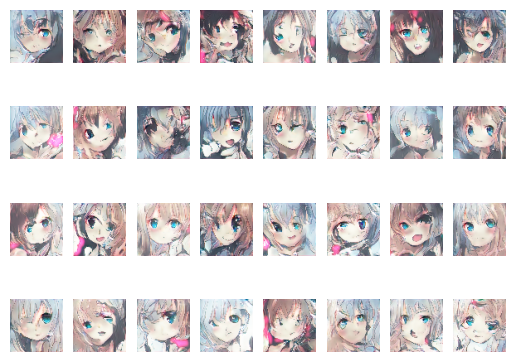

In [41]:
mygans.test_and_show()

tf.Tensor([[0.00228196]], shape=(1, 1), dtype=float32)


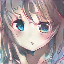

In [97]:
sample_vector = tf.random.normal([1,100], 0, 1, tf.float32, seed=1) # sample a 100 dimesional vector from a std normal distribution.
sample_output = saved_generator(sample_vector).numpy()   


sample_img = tf.keras.preprocessing.image.array_to_img(sample_output.reshape(64, 64, 3))
#for i in range(len(sample_vector)):
#    print(sample_vector[i])
print(mygans.discriminator(sample_output))

sample_img

In [43]:
mygans = myGANs(saved_generator, saved_discriminator, cwd + "/extra_data_from_danbooru/", 0, 32, 64, 64)

Found 140000 files belonging to 1 classes.


In [98]:
mygans.training(1252)

Epochs: 1
Current loss for discriminator: 0.5034456253051758
Current loss for generator: 3.0476818084716797
Epochs: 2
Current loss for discriminator: 0.5869237184524536
Current loss for generator: 4.984893798828125
Epochs: 3
Current loss for discriminator: 0.40001586079597473
Current loss for generator: 2.897387742996216
Epochs: 4
Current loss for discriminator: 0.17357048392295837
Current loss for generator: 3.0002355575561523
Epochs: 5
Current loss for discriminator: 0.5213872194290161
Current loss for generator: 5.138378143310547
Epochs: 6
Current loss for discriminator: 0.14203105866909027
Current loss for generator: 4.771983623504639
Epochs: 7
Current loss for discriminator: 0.6192730665206909
Current loss for generator: 1.7223035097122192
Epochs: 8
Current loss for discriminator: 0.5518521070480347
Current loss for generator: 4.52665376663208
Epochs: 9
Current loss for discriminator: 0.3563729524612427
Current loss for generator: 4.252901077270508
Epochs: 10
Current loss for disc

Current loss for generator: 3.9225971698760986
Epochs: 45
Current loss for discriminator: 0.21905933320522308
Current loss for generator: 5.281613349914551
Epochs: 46
Current loss for discriminator: 0.28835389018058777
Current loss for generator: 4.779372215270996
Epochs: 47
Current loss for discriminator: 0.2068312019109726
Current loss for generator: 4.854092121124268
Epochs: 48
Current loss for discriminator: 0.17635591328144073
Current loss for generator: 4.442643642425537
Epochs: 49
Current loss for discriminator: 0.28023481369018555
Current loss for generator: 3.6906790733337402
Epochs: 50
Current loss for discriminator: 0.1533413976430893
Current loss for generator: 3.674591064453125
Epochs: 51
Current loss for discriminator: 0.2152896374464035
Current loss for generator: 6.368203163146973
Epochs: 52
Current loss for discriminator: 0.19034872949123383
Current loss for generator: 4.0968451499938965
Epochs: 53
Current loss for discriminator: 0.2472633421421051
Current loss for gen

Current loss for discriminator: 0.25382521748542786
Current loss for generator: 3.973238468170166
Epochs: 89
Current loss for discriminator: 0.17442873120307922
Current loss for generator: 4.51201868057251
Epochs: 90
Current loss for discriminator: 0.15035057067871094
Current loss for generator: 4.189496040344238
Epochs: 91
Current loss for discriminator: 0.37275582551956177
Current loss for generator: 3.103762626647949
Epochs: 92
Current loss for discriminator: 0.26626431941986084
Current loss for generator: 5.242897033691406
Epochs: 93
Current loss for discriminator: 0.18931974470615387
Current loss for generator: 3.8431129455566406
Epochs: 94
Current loss for discriminator: 0.17333298921585083
Current loss for generator: 3.4543344974517822
Epochs: 95
Current loss for discriminator: 0.31687307357788086
Current loss for generator: 2.481795310974121
Epochs: 96
Current loss for discriminator: 0.256538987159729
Current loss for generator: 4.923587799072266
Epochs: 97
Current loss for dis

Current loss for generator: 4.517481803894043
Epochs: 132
Current loss for discriminator: 0.32085418701171875
Current loss for generator: 4.186144828796387
Epochs: 133
Current loss for discriminator: 0.22539842128753662
Current loss for generator: 3.977898597717285
Epochs: 134
Current loss for discriminator: 0.176904559135437
Current loss for generator: 2.8898775577545166
Epochs: 135
Current loss for discriminator: 0.20896047353744507
Current loss for generator: 3.8108644485473633
Epochs: 136
Current loss for discriminator: 0.19991618394851685
Current loss for generator: 3.799499273300171
Epochs: 137
Current loss for discriminator: 0.30140894651412964
Current loss for generator: 4.311070442199707
Epochs: 138
Current loss for discriminator: 0.2000645101070404
Current loss for generator: 4.499700546264648
Epochs: 139
Current loss for discriminator: 0.39080899953842163
Current loss for generator: 1.9967782497406006
Epochs: 140
Current loss for discriminator: 0.6104179620742798
Current los

Epochs: 175
Current loss for discriminator: 0.21310682594776154
Current loss for generator: 4.747106552124023
Epochs: 176
Current loss for discriminator: 0.14921757578849792
Current loss for generator: 3.9934945106506348
Epochs: 177
Current loss for discriminator: 0.34896120429039
Current loss for generator: 2.6954731941223145
Epochs: 178
Current loss for discriminator: 0.5337483286857605
Current loss for generator: 4.102627754211426
Epochs: 179
Current loss for discriminator: 0.36708083748817444
Current loss for generator: 4.470874786376953
Epochs: 180
Current loss for discriminator: 0.22671499848365784
Current loss for generator: 3.187652111053467
Epochs: 181
Current loss for discriminator: 0.1150413453578949
Current loss for generator: 3.4410970211029053
Epochs: 182
Current loss for discriminator: 0.2917291224002838
Current loss for generator: 3.089236259460449
Epochs: 183
Current loss for discriminator: 0.29015880823135376
Current loss for generator: 4.244938850402832
Epochs: 184
C

Current loss for discriminator: 0.49062594771385193
Current loss for generator: 1.5586352348327637
Epochs: 219
Current loss for discriminator: 0.637135922908783
Current loss for generator: 4.850194454193115
Epochs: 220
Current loss for discriminator: 0.4272066354751587
Current loss for generator: 3.5909295082092285
Epochs: 221
Current loss for discriminator: 0.1637289822101593
Current loss for generator: 2.7866549491882324
Epochs: 222
Current loss for discriminator: 0.27733415365219116
Current loss for generator: 2.96189546585083
Epochs: 223
Current loss for discriminator: 0.31894659996032715
Current loss for generator: 4.953729629516602
Epochs: 224
Current loss for discriminator: 0.27737271785736084
Current loss for generator: 3.178873062133789
Epochs: 225
Current loss for discriminator: 0.49306678771972656
Current loss for generator: 2.7407946586608887
Epochs: 226
Current loss for discriminator: 0.7118003368377686
Current loss for generator: 6.649604797363281
Epochs: 227
Current loss

Current loss for generator: 4.859692096710205
Epochs: 262
Current loss for discriminator: 0.21783411502838135
Current loss for generator: 4.34515905380249
Epochs: 263
Current loss for discriminator: 0.28058260679244995
Current loss for generator: 3.0952577590942383
Epochs: 264
Current loss for discriminator: 0.3528875708580017
Current loss for generator: 5.129549026489258
Epochs: 265
Current loss for discriminator: 0.44842618703842163
Current loss for generator: 3.2631585597991943
Epochs: 266
Current loss for discriminator: 0.3398876488208771
Current loss for generator: 5.194077014923096
Epochs: 267
Current loss for discriminator: 0.4411666691303253
Current loss for generator: 2.56390380859375
Epochs: 268
Current loss for discriminator: 0.3344897925853729
Current loss for generator: 4.586288928985596
Epochs: 269
Current loss for discriminator: 0.14836250245571136
Current loss for generator: 4.011923313140869
Epochs: 270
Current loss for discriminator: 0.21031637489795685
Current loss f

Epochs: 305
Current loss for discriminator: 0.3507291078567505
Current loss for generator: 3.498251438140869
Epochs: 306
Current loss for discriminator: 0.2253667265176773
Current loss for generator: 4.846879959106445
Epochs: 307
Current loss for discriminator: 0.3246852457523346
Current loss for generator: 3.712524175643921
Epochs: 308
Current loss for discriminator: 0.25430577993392944
Current loss for generator: 4.38362455368042
Epochs: 309
Current loss for discriminator: 0.3485564589500427
Current loss for generator: 2.678041934967041
Epochs: 310
Current loss for discriminator: 0.4459851384162903
Current loss for generator: 7.120684623718262
Epochs: 311
Current loss for discriminator: 0.39020827412605286
Current loss for generator: 4.980084419250488
Epochs: 312
Current loss for discriminator: 0.11223901063203812
Current loss for generator: 2.398015022277832
Epochs: 313
Current loss for discriminator: 0.26714053750038147
Current loss for generator: 5.170835494995117
Epochs: 314
Curr

Current loss for discriminator: 0.42535388469696045
Current loss for generator: 2.568049907684326
Epochs: 349
Current loss for discriminator: 0.23811015486717224
Current loss for generator: 3.4882397651672363
Epochs: 350
Current loss for discriminator: 0.2708820104598999
Current loss for generator: 3.173245429992676
Epochs: 351
Current loss for discriminator: 0.44595298171043396
Current loss for generator: 2.898313522338867
Epochs: 352
Current loss for discriminator: 0.22500652074813843
Current loss for generator: 3.6715738773345947
Epochs: 353
Current loss for discriminator: 0.1106477752327919
Current loss for generator: 4.191272735595703
Epochs: 354
Current loss for discriminator: 0.24673151969909668
Current loss for generator: 3.549654960632324
Epochs: 355
Current loss for discriminator: 0.1683979034423828
Current loss for generator: 4.2260284423828125
Epochs: 356
Current loss for discriminator: 0.2844852805137634
Current loss for generator: 2.819413661956787
Epochs: 357
Current los

Current loss for generator: 2.913153648376465
Epochs: 392
Current loss for discriminator: 0.36941200494766235
Current loss for generator: 2.9205808639526367
Epochs: 393
Current loss for discriminator: 0.30314862728118896
Current loss for generator: 4.859994411468506
Epochs: 394
Current loss for discriminator: 0.3389790952205658
Current loss for generator: 2.4815828800201416
Epochs: 395
Current loss for discriminator: 0.48642000555992126
Current loss for generator: 6.857473373413086
Epochs: 396
Current loss for discriminator: 0.4285869598388672
Current loss for generator: 3.742584228515625
Epochs: 397
Current loss for discriminator: 0.28404584527015686
Current loss for generator: 4.096297264099121
Epochs: 398
Current loss for discriminator: 0.24404239654541016
Current loss for generator: 5.634620666503906
Epochs: 399
Current loss for discriminator: 0.26664602756500244
Current loss for generator: 3.162734031677246
Epochs: 400
Current loss for discriminator: 0.15054473280906677
Current lo

Epochs: 435
Current loss for discriminator: 0.22390872240066528
Current loss for generator: 2.7681431770324707
Epochs: 436
Current loss for discriminator: 0.27202552556991577
Current loss for generator: 3.3188512325286865
Epochs: 437
Current loss for discriminator: 0.22452901303768158
Current loss for generator: 3.5451714992523193
Epochs: 438
Current loss for discriminator: 0.29688796401023865
Current loss for generator: 3.877467155456543
Epochs: 439
Current loss for discriminator: 0.32505708932876587
Current loss for generator: 1.9082863330841064
Epochs: 440
Current loss for discriminator: 0.3909076154232025
Current loss for generator: 4.585789680480957
Epochs: 441
Current loss for discriminator: 0.31745046377182007
Current loss for generator: 5.246739387512207
Epochs: 442
Current loss for discriminator: 0.31356075406074524
Current loss for generator: 3.1102983951568604
Epochs: 443
Current loss for discriminator: 0.1905619204044342
Current loss for generator: 2.6168484687805176
Epochs

Current loss for discriminator: 0.2943416237831116
Current loss for generator: 3.3459339141845703
Epochs: 479
Current loss for discriminator: 0.21731150150299072
Current loss for generator: 3.2489261627197266
Epochs: 480
Current loss for discriminator: 0.2746616005897522
Current loss for generator: 4.286923408508301
Epochs: 481
Current loss for discriminator: 0.23498862981796265
Current loss for generator: 4.051024913787842
Epochs: 482
Current loss for discriminator: 0.17481300234794617
Current loss for generator: 3.8531389236450195
Epochs: 483
Current loss for discriminator: 0.18705196678638458
Current loss for generator: 4.036198139190674
Epochs: 484
Current loss for discriminator: 0.09687038511037827
Current loss for generator: 4.108041763305664
Epochs: 485
Current loss for discriminator: 0.16005665063858032
Current loss for generator: 3.8240630626678467
Epochs: 486
Current loss for discriminator: 0.3130173087120056
Current loss for generator: 4.990116119384766
Epochs: 487
Current l

Current loss for generator: 3.7477264404296875
Epochs: 522
Current loss for discriminator: 0.2853127121925354
Current loss for generator: 2.4252991676330566
Epochs: 523
Current loss for discriminator: 0.2594684064388275
Current loss for generator: 4.32102108001709
Epochs: 524
Current loss for discriminator: 0.13009518384933472
Current loss for generator: 3.83994722366333
Epochs: 525
Current loss for discriminator: 0.28537270426750183
Current loss for generator: 2.832650661468506
Epochs: 526
Current loss for discriminator: 0.27876877784729004
Current loss for generator: 4.983192443847656
Epochs: 527
Current loss for discriminator: 0.22402870655059814
Current loss for generator: 4.168615341186523
Epochs: 528
Current loss for discriminator: 0.14323443174362183
Current loss for generator: 2.9847545623779297
Epochs: 529
Current loss for discriminator: 0.17783702909946442
Current loss for generator: 2.6752171516418457
Epochs: 530
Current loss for discriminator: 0.4535748362541199
Current los

Epochs: 565
Current loss for discriminator: 0.26604703068733215
Current loss for generator: 3.38529896736145
Epochs: 566
Current loss for discriminator: 0.10787305980920792
Current loss for generator: 4.909842014312744
Epochs: 567
Current loss for discriminator: 0.29271119832992554
Current loss for generator: 3.474949598312378
Epochs: 568
Current loss for discriminator: 0.4134902358055115
Current loss for generator: 2.708939552307129
Epochs: 569
Current loss for discriminator: 0.27843233942985535
Current loss for generator: 5.632819175720215
Epochs: 570
Current loss for discriminator: 0.6985554695129395
Current loss for generator: 1.612990140914917
Epochs: 571
Current loss for discriminator: 0.7934566140174866
Current loss for generator: 7.157820224761963
Epochs: 572
Current loss for discriminator: 0.865778386592865
Current loss for generator: 3.2050442695617676
Epochs: 573
Current loss for discriminator: 0.13524504005908966
Current loss for generator: 2.4399940967559814
Epochs: 574
Cu

Current loss for discriminator: 0.18073013424873352
Current loss for generator: 3.305267333984375
Epochs: 609
Current loss for discriminator: 0.18090078234672546
Current loss for generator: 3.5942935943603516
Epochs: 610
Current loss for discriminator: 0.1879950761795044
Current loss for generator: 3.188262462615967
Epochs: 611
Current loss for discriminator: 0.4740810990333557
Current loss for generator: 2.367985248565674
Epochs: 612
Current loss for discriminator: 0.2849254906177521
Current loss for generator: 3.114295482635498
Epochs: 613
Current loss for discriminator: 0.28233230113983154
Current loss for generator: 2.7055511474609375
Epochs: 614
Current loss for discriminator: 0.2701796293258667
Current loss for generator: 3.711428642272949
Epochs: 615
Current loss for discriminator: 0.18051500618457794
Current loss for generator: 2.8140439987182617
Epochs: 616
Current loss for discriminator: 0.19717217981815338
Current loss for generator: 3.3263235092163086
Epochs: 617
Current lo

Current loss for generator: 1.836830496788025
Epochs: 652
Current loss for discriminator: 0.5428406000137329
Current loss for generator: 2.6422934532165527
Epochs: 653
Current loss for discriminator: 0.38791924715042114
Current loss for generator: 2.8491010665893555
Epochs: 654
Current loss for discriminator: 0.3704357147216797
Current loss for generator: 3.5540175437927246
Epochs: 655
Current loss for discriminator: 0.5879621505737305
Current loss for generator: 2.4054758548736572
Epochs: 656
Current loss for discriminator: 0.5988914966583252
Current loss for generator: 2.722386121749878
Epochs: 657
Current loss for discriminator: 0.389187216758728
Current loss for generator: 2.509646415710449
Epochs: 658
Current loss for discriminator: 0.4290732443332672
Current loss for generator: 3.0255041122436523
Epochs: 659
Current loss for discriminator: 0.44331204891204834
Current loss for generator: 2.574662923812866
Epochs: 660
Current loss for discriminator: 0.5807934999465942
Current loss 

Epochs: 695
Current loss for discriminator: 0.22264890372753143
Current loss for generator: 3.3838446140289307
Epochs: 696
Current loss for discriminator: 0.2171820104122162
Current loss for generator: 4.051288604736328
Epochs: 697
Current loss for discriminator: 0.530539333820343
Current loss for generator: 1.5335359573364258
Epochs: 698
Current loss for discriminator: 0.5928192734718323
Current loss for generator: 4.9737653732299805
Epochs: 699
Current loss for discriminator: 0.37663212418556213
Current loss for generator: 3.9468746185302734
Epochs: 700
Current loss for discriminator: 0.2155144065618515
Current loss for generator: 2.8911006450653076
Epochs: 701
Current loss for discriminator: 0.3591974973678589
Current loss for generator: 2.8695712089538574
Epochs: 702
Current loss for discriminator: 0.22109106183052063
Current loss for generator: 3.402162790298462
Epochs: 703
Current loss for discriminator: 0.27965161204338074
Current loss for generator: 4.1881422996521
Epochs: 704


Current loss for discriminator: 0.6583741307258606
Current loss for generator: 6.215559005737305
Epochs: 739
Current loss for discriminator: 0.7612460851669312
Current loss for generator: 3.8753652572631836
Epochs: 740
Current loss for discriminator: 0.19093650579452515
Current loss for generator: 2.2796003818511963
Epochs: 741
Current loss for discriminator: 0.4085330069065094
Current loss for generator: 3.8440701961517334
Epochs: 742
Current loss for discriminator: 0.207122340798378
Current loss for generator: 4.261802673339844
Epochs: 743
Current loss for discriminator: 0.2483614683151245
Current loss for generator: 3.426476001739502
Epochs: 744
Current loss for discriminator: 0.17578139901161194
Current loss for generator: 2.7300572395324707
Epochs: 745
Current loss for discriminator: 0.2457132190465927
Current loss for generator: 4.287952423095703
Epochs: 746
Current loss for discriminator: 0.32566624879837036
Current loss for generator: 3.269486427307129
Epochs: 747
Current loss 

Current loss for generator: 3.9336235523223877
Epochs: 782
Current loss for discriminator: 0.20274844765663147
Current loss for generator: 2.472731590270996
Epochs: 783
Current loss for discriminator: 0.3217991292476654
Current loss for generator: 5.759217739105225
Epochs: 784
Current loss for discriminator: 0.47320955991744995
Current loss for generator: 4.766919136047363
Epochs: 785
Current loss for discriminator: 0.4364410936832428
Current loss for generator: 2.2670741081237793
Epochs: 786
Current loss for discriminator: 0.5129677057266235
Current loss for generator: 5.519925117492676
Epochs: 787
Current loss for discriminator: 0.5128646492958069
Current loss for generator: 2.865955352783203
Epochs: 788
Current loss for discriminator: 0.1349208503961563
Current loss for generator: 2.800103187561035
Epochs: 789
Current loss for discriminator: 0.3023729920387268
Current loss for generator: 4.758093357086182
Epochs: 790
Current loss for discriminator: 0.27147993445396423
Current loss f

Epochs: 825
Current loss for discriminator: 0.23454907536506653
Current loss for generator: 3.417396068572998
Epochs: 826
Current loss for discriminator: 0.26062628626823425
Current loss for generator: 2.577725887298584
Epochs: 827
Current loss for discriminator: 0.36222097277641296
Current loss for generator: 4.326071739196777
Epochs: 828
Current loss for discriminator: 0.29124537110328674
Current loss for generator: 2.8378381729125977
Epochs: 829
Current loss for discriminator: 0.6078497767448425
Current loss for generator: 3.0211079120635986
Epochs: 830
Current loss for discriminator: 0.21917656064033508
Current loss for generator: 3.1510915756225586
Epochs: 831
Current loss for discriminator: 0.37233203649520874
Current loss for generator: 3.300055980682373
Epochs: 832
Current loss for discriminator: 0.1718546748161316
Current loss for generator: 3.10496187210083
Epochs: 833
Current loss for discriminator: 0.1843515932559967
Current loss for generator: 3.047212600708008
Epochs: 834

Current loss for discriminator: 0.40465688705444336
Current loss for generator: 3.2160427570343018
Epochs: 869
Current loss for discriminator: 0.35281169414520264
Current loss for generator: 2.7218358516693115
Epochs: 870
Current loss for discriminator: 0.3186757564544678
Current loss for generator: 2.7169713973999023
Epochs: 871
Current loss for discriminator: 0.22435423731803894
Current loss for generator: 3.072944164276123
Epochs: 872
Current loss for discriminator: 0.4573269784450531
Current loss for generator: 2.573122501373291
Epochs: 873
Current loss for discriminator: 0.4694209396839142
Current loss for generator: 4.469579696655273
Epochs: 874
Current loss for discriminator: 0.39003872871398926
Current loss for generator: 3.9328668117523193
Epochs: 875
Current loss for discriminator: 0.3976038098335266
Current loss for generator: 1.5259649753570557
Epochs: 876
Current loss for discriminator: 0.5869452953338623
Current loss for generator: 5.330877780914307
Epochs: 877
Current lo

Current loss for generator: 3.448848009109497
Epochs: 912
Current loss for discriminator: 0.2021397203207016
Current loss for generator: 5.321567058563232
Epochs: 913
Current loss for discriminator: 0.23723803460597992
Current loss for generator: 4.231273651123047
Epochs: 914
Current loss for discriminator: 0.17454981803894043
Current loss for generator: 4.186044692993164
Epochs: 915
Current loss for discriminator: 0.2417028844356537
Current loss for generator: 2.8766183853149414
Epochs: 916
Current loss for discriminator: 0.3817707300186157
Current loss for generator: 4.734794616699219
Epochs: 917
Current loss for discriminator: 0.2308594286441803
Current loss for generator: 4.178744792938232
Epochs: 918
Current loss for discriminator: 0.3512718081474304
Current loss for generator: 3.0844011306762695
Epochs: 919
Current loss for discriminator: 0.42386555671691895
Current loss for generator: 5.476485252380371
Epochs: 920
Current loss for discriminator: 0.24770362675189972
Current loss 

Epochs: 955
Current loss for discriminator: 0.30019962787628174
Current loss for generator: 4.28538703918457
Epochs: 956
Current loss for discriminator: 0.2824198603630066
Current loss for generator: 3.496567726135254
Epochs: 957
Current loss for discriminator: 0.44760245084762573
Current loss for generator: 2.1984291076660156
Epochs: 958
Current loss for discriminator: 0.3551487624645233
Current loss for generator: 3.5115227699279785
Epochs: 959
Current loss for discriminator: 0.1604398488998413
Current loss for generator: 4.202023029327393
Epochs: 960
Current loss for discriminator: 0.33041733503341675
Current loss for generator: 3.4831223487854004
Epochs: 961
Current loss for discriminator: 0.14921292662620544
Current loss for generator: 3.0099823474884033
Epochs: 962
Current loss for discriminator: 0.3092285394668579
Current loss for generator: 4.390530586242676
Epochs: 963
Current loss for discriminator: 0.2610291838645935
Current loss for generator: 3.7754104137420654
Epochs: 964

Current loss for discriminator: 0.3157322406768799
Current loss for generator: 2.7038967609405518
Epochs: 999
Current loss for discriminator: 0.2388899177312851
Current loss for generator: 3.879868745803833
Epochs: 1000
Current loss for discriminator: 0.4778459370136261
Current loss for generator: 4.099302768707275
Epochs: 1001
Current loss for discriminator: 0.18481849133968353
Current loss for generator: 3.3592398166656494
Epochs: 1002
Current loss for discriminator: 0.3785092830657959
Current loss for generator: 4.463835716247559
Epochs: 1003
Current loss for discriminator: 0.23137161135673523
Current loss for generator: 3.9406545162200928
Epochs: 1004
Current loss for discriminator: 0.3166954219341278
Current loss for generator: 3.5914015769958496
Epochs: 1005
Current loss for discriminator: 0.26597535610198975
Current loss for generator: 2.9732275009155273
Epochs: 1006
Current loss for discriminator: 0.26923394203186035
Current loss for generator: 4.67371129989624
Epochs: 1007
Cur

Current loss for discriminator: 0.3763713538646698
Current loss for generator: 4.57368278503418
Epochs: 1042
Current loss for discriminator: 0.2958033084869385
Current loss for generator: 5.140648365020752
Epochs: 1043
Current loss for discriminator: 0.14953573048114777
Current loss for generator: 4.209755897521973
Epochs: 1044
Current loss for discriminator: 0.3702777028083801
Current loss for generator: 7.600837707519531
Epochs: 1045
Current loss for discriminator: 1.0207778215408325
Current loss for generator: 2.266418695449829
Epochs: 1046
Current loss for discriminator: 1.0444610118865967
Current loss for generator: 8.006006240844727
Epochs: 1047
Current loss for discriminator: 1.3931735754013062
Current loss for generator: 3.4851508140563965
Epochs: 1048
Current loss for discriminator: 0.1986590325832367
Current loss for generator: 1.9234373569488525
Epochs: 1049
Current loss for discriminator: 0.5737327337265015
Current loss for generator: 4.709609508514404
Epochs: 1050
Current 

Current loss for discriminator: 0.6175528764724731
Current loss for generator: 2.902864456176758
Epochs: 1085
Current loss for discriminator: 0.43447402119636536
Current loss for generator: 3.3879785537719727
Epochs: 1086
Current loss for discriminator: 0.3070003092288971
Current loss for generator: 4.029753684997559
Epochs: 1087
Current loss for discriminator: 0.2728375196456909
Current loss for generator: 3.445871591567993
Epochs: 1088
Current loss for discriminator: 0.22882753610610962
Current loss for generator: 2.7782514095306396
Epochs: 1089
Current loss for discriminator: 0.264721155166626
Current loss for generator: 2.547513961791992
Epochs: 1090
Current loss for discriminator: 0.49305057525634766
Current loss for generator: 3.580367088317871
Epochs: 1091
Current loss for discriminator: 0.27260857820510864
Current loss for generator: 3.9425792694091797
Epochs: 1092
Current loss for discriminator: 0.2474721074104309
Current loss for generator: 3.036647319793701
Epochs: 1093
Curr

Current loss for discriminator: 0.2521699070930481
Current loss for generator: 2.665522575378418
Epochs: 1128
Current loss for discriminator: 0.1918276995420456
Current loss for generator: 2.9749369621276855
Epochs: 1129
Current loss for discriminator: 0.389760822057724
Current loss for generator: 3.4993820190429688
Epochs: 1130
Current loss for discriminator: 0.17501160502433777
Current loss for generator: 3.244110107421875
Epochs: 1131
Current loss for discriminator: 0.25120070576667786
Current loss for generator: 3.4470510482788086
Epochs: 1132
Current loss for discriminator: 0.11372362077236176
Current loss for generator: 3.5071353912353516
Epochs: 1133
Current loss for discriminator: 0.2244819700717926
Current loss for generator: 2.8856499195098877
Epochs: 1134
Current loss for discriminator: 0.1487654596567154
Current loss for generator: 3.1160545349121094
Epochs: 1135
Current loss for discriminator: 0.1873703896999359
Current loss for generator: 4.145949363708496
Epochs: 1136
Cu

Current loss for discriminator: 0.15010160207748413
Current loss for generator: 5.046212673187256
Epochs: 1171
Current loss for discriminator: 0.4183196425437927
Current loss for generator: 3.092480182647705
Epochs: 1172
Current loss for discriminator: 0.2994893193244934
Current loss for generator: 5.104434013366699
Epochs: 1173
Current loss for discriminator: 0.12830740213394165
Current loss for generator: 5.683542251586914
Epochs: 1174
Current loss for discriminator: 0.2975064516067505
Current loss for generator: 2.539599895477295
Epochs: 1175
Current loss for discriminator: 0.38191479444503784
Current loss for generator: 5.0757856369018555
Epochs: 1176
Current loss for discriminator: 0.33410608768463135
Current loss for generator: 4.0897674560546875
Epochs: 1177
Current loss for discriminator: 0.12016913294792175
Current loss for generator: 3.3016557693481445
Epochs: 1178
Current loss for discriminator: 0.2417810559272766
Current loss for generator: 3.4324512481689453
Epochs: 1179
C

Current loss for discriminator: 0.19687321782112122
Current loss for generator: 5.302609920501709
Epochs: 1214
Current loss for discriminator: 0.11120833456516266
Current loss for generator: 4.499769687652588
Epochs: 1215
Current loss for discriminator: 0.15542468428611755
Current loss for generator: 3.580514907836914
Epochs: 1216
Current loss for discriminator: 0.1394188106060028
Current loss for generator: 3.9565269947052
Epochs: 1217
Current loss for discriminator: 0.24496057629585266
Current loss for generator: 4.341615676879883
Epochs: 1218
Current loss for discriminator: 0.30871930718421936
Current loss for generator: 2.7880825996398926
Epochs: 1219
Current loss for discriminator: 0.3035275638103485
Current loss for generator: 4.381930351257324
Epochs: 1220
Current loss for discriminator: 0.20351536571979523
Current loss for generator: 4.152676582336426
Epochs: 1221
Current loss for discriminator: 0.2066870927810669
Current loss for generator: 3.103321075439453
Epochs: 1222
Curre

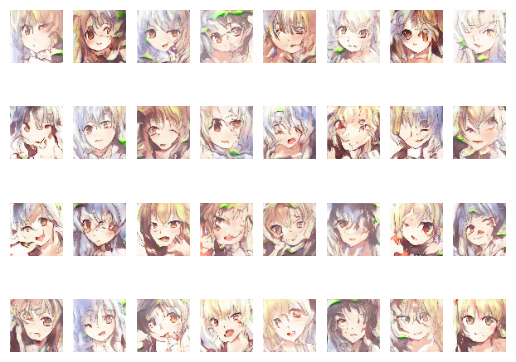

In [100]:
mygans.test_and_show()

In [103]:
mygans.discriminator.save(cwd + "/Saved_models/basic_GANs/danbooru_dataset_10000iter/discriminator")
mygans.generator.save(cwd + "/Saved_models/basic_GANs/danbooru_dataset_10000iter/generator")

INFO:tensorflow:Assets written to: C:\Users\chenq\Desktop\machine learning\Project_animeface_generator\HW3/Saved_models/basic_GANs/danbooru_dataset_10000iter/discriminator\assets
INFO:tensorflow:Assets written to: C:\Users\chenq\Desktop\machine learning\Project_animeface_generator\HW3/Saved_models/basic_GANs/danbooru_dataset_10000iter/generator\assets


10000 training loop finished!!!!!!!!!!!!!

In [101]:
mygans = myGANs(saved_generator, saved_discriminator, cwd + "/extra_data_from_danbooru/", 1, 32, 64, 64)

Found 140000 files belonging to 1 classes.


In [107]:
mygans.training(4000)

Epochs: 1
Current loss for discriminator: 0.10325479507446289
Current loss for generator: 5.254909992218018
Epochs: 2
Current loss for discriminator: 0.18147484958171844
Current loss for generator: 4.490128993988037
Epochs: 3
Current loss for discriminator: 0.11797313392162323
Current loss for generator: 3.8065481185913086
Epochs: 4
Current loss for discriminator: 0.43083807826042175
Current loss for generator: 2.50681471824646
Epochs: 5
Current loss for discriminator: 0.5228546857833862
Current loss for generator: 6.788476943969727
Epochs: 6
Current loss for discriminator: 0.8126916885375977
Current loss for generator: 3.532855272293091
Epochs: 7
Current loss for discriminator: 0.18551938235759735
Current loss for generator: 2.836650848388672
Epochs: 8
Current loss for discriminator: 0.32942330837249756
Current loss for generator: 4.506507873535156
Epochs: 9
Current loss for discriminator: 0.18778975307941437
Current loss for generator: 4.281004905700684
Epochs: 10
Current loss for di

Current loss for generator: 2.2045845985412598
Epochs: 45
Current loss for discriminator: 0.5055539011955261
Current loss for generator: 6.380833625793457
Epochs: 46
Current loss for discriminator: 0.26207512617111206
Current loss for generator: 4.77254581451416
Epochs: 47
Current loss for discriminator: 0.19611787796020508
Current loss for generator: 2.7153146266937256
Epochs: 48
Current loss for discriminator: 0.561424195766449
Current loss for generator: 6.861843109130859
Epochs: 49
Current loss for discriminator: 1.0001009702682495
Current loss for generator: 3.566868305206299
Epochs: 50
Current loss for discriminator: 0.1972181499004364
Current loss for generator: 2.0328257083892822
Epochs: 51
Current loss for discriminator: 0.49226027727127075
Current loss for generator: 5.264334678649902
Epochs: 52
Current loss for discriminator: 0.2664022445678711
Current loss for generator: 4.924068450927734
Epochs: 53
Current loss for discriminator: 0.22959423065185547
Current loss for genera

Current loss for discriminator: 0.4077046811580658
Current loss for generator: 2.467440605163574
Epochs: 89
Current loss for discriminator: 0.3147030472755432
Current loss for generator: 3.804929733276367
Epochs: 90
Current loss for discriminator: 0.1896899938583374
Current loss for generator: 5.286420822143555
Epochs: 91
Current loss for discriminator: 0.13372132182121277
Current loss for generator: 3.773374080657959
Epochs: 92
Current loss for discriminator: 0.22764988243579865
Current loss for generator: 4.4282708168029785
Epochs: 93
Current loss for discriminator: 0.23012542724609375
Current loss for generator: 3.992356300354004
Epochs: 94
Current loss for discriminator: 0.26143118739128113
Current loss for generator: 6.720931053161621
Epochs: 95
Current loss for discriminator: 0.5147919058799744
Current loss for generator: 2.0637309551239014
Epochs: 96
Current loss for discriminator: 0.42019739747047424
Current loss for generator: 6.328235626220703
Epochs: 97
Current loss for disc

Current loss for generator: 3.4244399070739746
Epochs: 132
Current loss for discriminator: 0.35456883907318115
Current loss for generator: 2.934544563293457
Epochs: 133
Current loss for discriminator: 0.4341357350349426
Current loss for generator: 5.203315734863281
Epochs: 134
Current loss for discriminator: 0.43671905994415283
Current loss for generator: 3.306922435760498
Epochs: 135
Current loss for discriminator: 0.1822843998670578
Current loss for generator: 2.500263214111328
Epochs: 136
Current loss for discriminator: 0.36058223247528076
Current loss for generator: 6.027344703674316
Epochs: 137
Current loss for discriminator: 0.41484585404396057
Current loss for generator: 3.2686009407043457
Epochs: 138
Current loss for discriminator: 0.4052055776119232
Current loss for generator: 3.4941599369049072
Epochs: 139
Current loss for discriminator: 0.2798078656196594
Current loss for generator: 3.69942569732666
Epochs: 140
Current loss for discriminator: 0.23371222615242004
Current loss

Epochs: 175
Current loss for discriminator: 0.2092593014240265
Current loss for generator: 4.197742938995361
Epochs: 176
Current loss for discriminator: 0.10559100657701492
Current loss for generator: 3.3395657539367676
Epochs: 177
Current loss for discriminator: 0.21202418208122253
Current loss for generator: 4.279596328735352
Epochs: 178
Current loss for discriminator: 0.0933038517832756
Current loss for generator: 5.286338806152344
Epochs: 179
Current loss for discriminator: 0.48927807807922363
Current loss for generator: 1.5752956867218018
Epochs: 180
Current loss for discriminator: 0.8765338063240051
Current loss for generator: 6.699306964874268
Epochs: 181
Current loss for discriminator: 0.7968204617500305
Current loss for generator: 4.950415134429932
Epochs: 182
Current loss for discriminator: 0.12323716282844543
Current loss for generator: 3.235133647918701
Epochs: 183
Current loss for discriminator: 0.3852747082710266
Current loss for generator: 5.309780597686768
Epochs: 184
C

Current loss for discriminator: 0.4278920590877533
Current loss for generator: 3.4942448139190674
Epochs: 219
Current loss for discriminator: 0.3796737492084503
Current loss for generator: 2.643068790435791
Epochs: 220
Current loss for discriminator: 0.31317615509033203
Current loss for generator: 2.69738507270813
Epochs: 221
Current loss for discriminator: 0.23113226890563965
Current loss for generator: 3.024991273880005
Epochs: 222
Current loss for discriminator: 0.3225095868110657
Current loss for generator: 3.506248950958252
Epochs: 223
Current loss for discriminator: 0.24859149754047394
Current loss for generator: 3.833089828491211
Epochs: 224
Current loss for discriminator: 0.24186491966247559
Current loss for generator: 3.2353107929229736
Epochs: 225
Current loss for discriminator: 0.2505123019218445
Current loss for generator: 3.0202083587646484
Epochs: 226
Current loss for discriminator: 0.20365899801254272
Current loss for generator: 3.114119291305542
Epochs: 227
Current loss

Current loss for generator: 3.2874841690063477
Epochs: 262
Current loss for discriminator: 0.3388224244117737
Current loss for generator: 2.936551809310913
Epochs: 263
Current loss for discriminator: 0.2615082263946533
Current loss for generator: 2.99566388130188
Epochs: 264
Current loss for discriminator: 0.1594465970993042
Current loss for generator: 3.8186120986938477
Epochs: 265
Current loss for discriminator: 0.36790716648101807
Current loss for generator: 4.075615406036377
Epochs: 266
Current loss for discriminator: 0.30625978112220764
Current loss for generator: 3.2221224308013916
Epochs: 267
Current loss for discriminator: 0.16826453804969788
Current loss for generator: 3.2335734367370605
Epochs: 268
Current loss for discriminator: 0.2539430856704712
Current loss for generator: 3.317619562149048
Epochs: 269
Current loss for discriminator: 0.3199745714664459
Current loss for generator: 3.4216389656066895
Epochs: 270
Current loss for discriminator: 0.2806593179702759
Current loss

Epochs: 305
Current loss for discriminator: 0.09142769873142242
Current loss for generator: 3.927034854888916
Epochs: 306
Current loss for discriminator: 0.11548936367034912
Current loss for generator: 5.0927934646606445
Epochs: 307
Current loss for discriminator: 0.14436933398246765
Current loss for generator: 4.328546524047852
Epochs: 308
Current loss for discriminator: 0.17262545228004456
Current loss for generator: 3.3072752952575684
Epochs: 309
Current loss for discriminator: 0.2868649959564209
Current loss for generator: 4.855280876159668
Epochs: 310
Current loss for discriminator: 0.17947034537792206
Current loss for generator: 4.288087368011475
Epochs: 311
Current loss for discriminator: 0.08049902319908142
Current loss for generator: 4.077240943908691
Epochs: 312
Current loss for discriminator: 0.2517741322517395
Current loss for generator: 5.590693473815918
Epochs: 313
Current loss for discriminator: 0.08878862857818604
Current loss for generator: 5.663540840148926
Epochs: 31

Current loss for discriminator: 0.2633228898048401
Current loss for generator: 3.298048973083496
Epochs: 349
Current loss for discriminator: 0.2817992866039276
Current loss for generator: 3.504293918609619
Epochs: 350
Current loss for discriminator: 0.2162744104862213
Current loss for generator: 3.3869094848632812
Epochs: 351
Current loss for discriminator: 0.07574011385440826
Current loss for generator: 3.774102210998535
Epochs: 352
Current loss for discriminator: 0.10350356251001358
Current loss for generator: 4.279806137084961
Epochs: 353
Current loss for discriminator: 0.2643555998802185
Current loss for generator: 3.0424416065216064
Epochs: 354
Current loss for discriminator: 0.2440192997455597
Current loss for generator: 3.826122283935547
Epochs: 355
Current loss for discriminator: 0.2530728578567505
Current loss for generator: 4.004843711853027
Epochs: 356
Current loss for discriminator: 0.26151055097579956
Current loss for generator: 4.157217979431152
Epochs: 357
Current loss f

Current loss for generator: 5.355008125305176
Epochs: 392
Current loss for discriminator: 0.2765100300312042
Current loss for generator: 5.28867244720459
Epochs: 393
Current loss for discriminator: 0.24881717562675476
Current loss for generator: 4.6964921951293945
Epochs: 394
Current loss for discriminator: 0.13786408305168152
Current loss for generator: 5.896018981933594
Epochs: 395
Current loss for discriminator: 0.3986261188983917
Current loss for generator: 3.823317050933838
Epochs: 396
Current loss for discriminator: 0.42193105816841125
Current loss for generator: 7.326870918273926
Epochs: 397
Current loss for discriminator: 0.23564210534095764
Current loss for generator: 5.908007621765137
Epochs: 398
Current loss for discriminator: 0.2866511046886444
Current loss for generator: 3.418896436691284
Epochs: 399
Current loss for discriminator: 0.35282838344573975
Current loss for generator: 5.457659721374512
Epochs: 400
Current loss for discriminator: 0.31129616498947144
Current loss 

Epochs: 435
Current loss for discriminator: 0.18137766420841217
Current loss for generator: 5.983470916748047
Epochs: 436
Current loss for discriminator: 0.5713332295417786
Current loss for generator: 3.173964023590088
Epochs: 437
Current loss for discriminator: 0.10780957341194153
Current loss for generator: 2.2788283824920654
Epochs: 438
Current loss for discriminator: 0.43092724680900574
Current loss for generator: 4.645003795623779
Epochs: 439
Current loss for discriminator: 0.18394368886947632
Current loss for generator: 4.785831928253174
Epochs: 440
Current loss for discriminator: 0.13052810728549957
Current loss for generator: 3.660688877105713
Epochs: 441
Current loss for discriminator: 0.16310133039951324
Current loss for generator: 3.277024269104004
Epochs: 442
Current loss for discriminator: 0.29383328557014465
Current loss for generator: 4.941413402557373
Epochs: 443
Current loss for discriminator: 0.14358802139759064
Current loss for generator: 4.934785842895508
Epochs: 44

Current loss for discriminator: 0.21332497894763947
Current loss for generator: 3.482604742050171
Epochs: 479
Current loss for discriminator: 0.2824668884277344
Current loss for generator: 3.955136775970459
Epochs: 480
Current loss for discriminator: 0.6160804033279419
Current loss for generator: 2.9934515953063965
Epochs: 481
Current loss for discriminator: 0.5299763679504395
Current loss for generator: 3.8600058555603027
Epochs: 482
Current loss for discriminator: 0.23814764618873596
Current loss for generator: 5.746333122253418
Epochs: 483
Current loss for discriminator: 0.22959817945957184
Current loss for generator: 4.276118278503418
Epochs: 484
Current loss for discriminator: 0.13766494393348694
Current loss for generator: 3.150360345840454
Epochs: 485
Current loss for discriminator: 0.3400171995162964
Current loss for generator: 4.578968524932861
Epochs: 486
Current loss for discriminator: 0.13003186881542206
Current loss for generator: 4.739281177520752
Epochs: 487
Current loss

Current loss for generator: 3.8395943641662598
Epochs: 522
Current loss for discriminator: 0.11788411438465118
Current loss for generator: 4.36716365814209
Epochs: 523
Current loss for discriminator: 0.1569383144378662
Current loss for generator: 4.763050079345703
Epochs: 524
Current loss for discriminator: 0.24206393957138062
Current loss for generator: 4.460184097290039
Epochs: 525
Current loss for discriminator: 0.25170594453811646
Current loss for generator: 4.889004707336426
Epochs: 526
Current loss for discriminator: 0.17688198387622833
Current loss for generator: 3.4401426315307617
Epochs: 527
Current loss for discriminator: 0.08862800896167755
Current loss for generator: 4.788095474243164
Epochs: 528
Current loss for discriminator: 0.19445715844631195
Current loss for generator: 4.706380844116211
Epochs: 529
Current loss for discriminator: 0.08829066902399063
Current loss for generator: 4.601855278015137
Epochs: 530
Current loss for discriminator: 0.558042585849762
Current loss

Epochs: 565
Current loss for discriminator: 0.10107202082872391
Current loss for generator: 2.9678425788879395
Epochs: 566
Current loss for discriminator: 0.21067875623703003
Current loss for generator: 3.9434125423431396
Epochs: 567
Current loss for discriminator: 0.058155447244644165
Current loss for generator: 4.526037216186523
Epochs: 568
Current loss for discriminator: 0.19819283485412598
Current loss for generator: 3.128239631652832
Epochs: 569
Current loss for discriminator: 0.15488652884960175
Current loss for generator: 3.5576047897338867
Epochs: 570
Current loss for discriminator: 0.1585817039012909
Current loss for generator: 4.615848541259766
Epochs: 571
Current loss for discriminator: 0.29070013761520386
Current loss for generator: 3.4345576763153076
Epochs: 572
Current loss for discriminator: 0.3517470061779022
Current loss for generator: 5.485219955444336
Epochs: 573
Current loss for discriminator: 0.16007459163665771
Current loss for generator: 5.116955757141113
Epochs:

Current loss for discriminator: 0.6252155303955078
Current loss for generator: 1.9115991592407227
Epochs: 609
Current loss for discriminator: 0.7381165027618408
Current loss for generator: 2.79312801361084
Epochs: 610
Current loss for discriminator: 0.6096571087837219
Current loss for generator: 1.4998748302459717
Epochs: 611
Current loss for discriminator: 0.6955366134643555
Current loss for generator: 2.1910505294799805
Epochs: 612
Current loss for discriminator: 0.6998165845870972
Current loss for generator: 1.9010357856750488
Epochs: 613
Current loss for discriminator: 0.6916667222976685
Current loss for generator: 1.4978878498077393
Epochs: 614
Current loss for discriminator: 0.5102576017379761
Current loss for generator: 2.3586459159851074
Epochs: 615
Current loss for discriminator: 0.672399640083313
Current loss for generator: 0.9083034992218018
Epochs: 616
Current loss for discriminator: 1.656670093536377
Current loss for generator: 4.536027431488037
Epochs: 617
Current loss fo

Current loss for generator: 2.140209436416626
Epochs: 652
Current loss for discriminator: 0.44112563133239746
Current loss for generator: 3.575690269470215
Epochs: 653
Current loss for discriminator: 0.22351381182670593
Current loss for generator: 3.9373271465301514
Epochs: 654
Current loss for discriminator: 0.26802128553390503
Current loss for generator: 3.5522704124450684
Epochs: 655
Current loss for discriminator: 0.689845860004425
Current loss for generator: 2.4315195083618164
Epochs: 656
Current loss for discriminator: 0.8037124276161194
Current loss for generator: 7.073050498962402
Epochs: 657
Current loss for discriminator: 2.6794538497924805
Current loss for generator: 0.5119531154632568
Epochs: 658
Current loss for discriminator: 1.5725544691085815
Current loss for generator: 3.080120086669922
Epochs: 659
Current loss for discriminator: 0.574951171875
Current loss for generator: 3.9869000911712646
Epochs: 660
Current loss for discriminator: 0.4874739646911621
Current loss for

Epochs: 695
Current loss for discriminator: 0.31042397022247314
Current loss for generator: 3.3790526390075684
Epochs: 696
Current loss for discriminator: 0.4936649203300476
Current loss for generator: 3.113056182861328
Epochs: 697
Current loss for discriminator: 0.31559234857559204
Current loss for generator: 2.9115471839904785
Epochs: 698
Current loss for discriminator: 0.3349061608314514
Current loss for generator: 3.634989023208618
Epochs: 699
Current loss for discriminator: 0.14644205570220947
Current loss for generator: 4.2300615310668945
Epochs: 700
Current loss for discriminator: 0.34439656138420105
Current loss for generator: 3.4877684116363525
Epochs: 701
Current loss for discriminator: 0.26019230484962463
Current loss for generator: 2.5380516052246094
Epochs: 702
Current loss for discriminator: 0.3029481768608093
Current loss for generator: 2.708914041519165
Epochs: 703
Current loss for discriminator: 0.36580324172973633
Current loss for generator: 4.044064998626709
Epochs: 

Current loss for discriminator: 0.21725279092788696
Current loss for generator: 2.9873175621032715
Epochs: 739
Current loss for discriminator: 0.385137140750885
Current loss for generator: 3.123129367828369
Epochs: 740
Current loss for discriminator: 0.2261577695608139
Current loss for generator: 3.8210675716400146
Epochs: 741
Current loss for discriminator: 0.2233780324459076
Current loss for generator: 4.861459732055664
Epochs: 742
Current loss for discriminator: 0.25490444898605347
Current loss for generator: 3.819451332092285
Epochs: 743
Current loss for discriminator: 0.17139331996440887
Current loss for generator: 4.136133193969727
Epochs: 744
Current loss for discriminator: 0.2763691246509552
Current loss for generator: 3.113473892211914
Epochs: 745
Current loss for discriminator: 0.2700885832309723
Current loss for generator: 5.048260688781738
Epochs: 746
Current loss for discriminator: 0.3712778687477112
Current loss for generator: 2.864948034286499
Epochs: 747
Current loss fo

Current loss for generator: 3.5050783157348633
Epochs: 782
Current loss for discriminator: 0.12274441868066788
Current loss for generator: 5.118467807769775
Epochs: 783
Current loss for discriminator: 0.3489375114440918
Current loss for generator: 2.931594133377075
Epochs: 784
Current loss for discriminator: 0.19505655765533447
Current loss for generator: 3.4210543632507324
Epochs: 785
Current loss for discriminator: 0.3353862166404724
Current loss for generator: 4.2917070388793945
Epochs: 786
Current loss for discriminator: 0.14274010062217712
Current loss for generator: 4.483165740966797
Epochs: 787
Current loss for discriminator: 0.26225289702415466
Current loss for generator: 3.9595110416412354
Epochs: 788
Current loss for discriminator: 0.12268555164337158
Current loss for generator: 4.169882297515869
Epochs: 789
Current loss for discriminator: 0.32263362407684326
Current loss for generator: 5.013998985290527
Epochs: 790
Current loss for discriminator: 0.2522839903831482
Current l

Epochs: 825
Current loss for discriminator: 0.3682095408439636
Current loss for generator: 5.61441707611084
Epochs: 826
Current loss for discriminator: 0.4987986981868744
Current loss for generator: 3.697715997695923
Epochs: 827
Current loss for discriminator: 0.26113784313201904
Current loss for generator: 3.0391807556152344
Epochs: 828
Current loss for discriminator: 0.29204118251800537
Current loss for generator: 3.5710678100585938
Epochs: 829
Current loss for discriminator: 0.1792595386505127
Current loss for generator: 4.880890846252441
Epochs: 830
Current loss for discriminator: 0.12139684706926346
Current loss for generator: 5.085516452789307
Epochs: 831
Current loss for discriminator: 0.307054340839386
Current loss for generator: 3.49757719039917
Epochs: 832
Current loss for discriminator: 0.12254597246646881
Current loss for generator: 3.091118574142456
Epochs: 833
Current loss for discriminator: 0.30140793323516846
Current loss for generator: 3.6154539585113525
Epochs: 834
Cu

Current loss for discriminator: 0.21108300983905792
Current loss for generator: 4.038733005523682
Epochs: 869
Current loss for discriminator: 0.1403685212135315
Current loss for generator: 4.658981800079346
Epochs: 870
Current loss for discriminator: 0.18025419116020203
Current loss for generator: 3.353684186935425
Epochs: 871
Current loss for discriminator: 0.1929967701435089
Current loss for generator: 3.4919700622558594
Epochs: 872
Current loss for discriminator: 0.15280663967132568
Current loss for generator: 3.738774299621582
Epochs: 873
Current loss for discriminator: 0.2166433036327362
Current loss for generator: 3.32114839553833
Epochs: 874
Current loss for discriminator: 0.08686472475528717
Current loss for generator: 4.005768775939941
Epochs: 875
Current loss for discriminator: 0.11820176243782043
Current loss for generator: 4.622396469116211
Epochs: 876
Current loss for discriminator: 0.16158053278923035
Current loss for generator: 5.603569984436035
Epochs: 877
Current loss 

Current loss for generator: 4.077054500579834
Epochs: 912
Current loss for discriminator: 0.10651285946369171
Current loss for generator: 4.241842269897461
Epochs: 913
Current loss for discriminator: 0.2741054892539978
Current loss for generator: 3.0345067977905273
Epochs: 914
Current loss for discriminator: 0.2624570429325104
Current loss for generator: 3.640927314758301
Epochs: 915
Current loss for discriminator: 0.34660425782203674
Current loss for generator: 3.3182129859924316
Epochs: 916
Current loss for discriminator: 0.16744071245193481
Current loss for generator: 3.013855457305908
Epochs: 917
Current loss for discriminator: 0.20942124724388123
Current loss for generator: 3.266282558441162
Epochs: 918
Current loss for discriminator: 0.31061264872550964
Current loss for generator: 4.053289413452148
Epochs: 919
Current loss for discriminator: 0.19214873015880585
Current loss for generator: 4.289138317108154
Epochs: 920
Current loss for discriminator: 0.14790822565555573
Current lo

Epochs: 955
Current loss for discriminator: 0.2725954055786133
Current loss for generator: 4.956141471862793
Epochs: 956
Current loss for discriminator: 0.29287397861480713
Current loss for generator: 3.764643430709839
Epochs: 957
Current loss for discriminator: 0.12679600715637207
Current loss for generator: 2.6758084297180176
Epochs: 958
Current loss for discriminator: 0.3328877389431
Current loss for generator: 5.2162065505981445
Epochs: 959
Current loss for discriminator: 0.35344573855400085
Current loss for generator: 4.386624336242676
Epochs: 960
Current loss for discriminator: 0.17529360949993134
Current loss for generator: 2.840064525604248
Epochs: 961
Current loss for discriminator: 0.2329740822315216
Current loss for generator: 3.903313159942627
Epochs: 962
Current loss for discriminator: 0.19513942301273346
Current loss for generator: 4.13800048828125
Epochs: 963
Current loss for discriminator: 0.2579439878463745
Current loss for generator: 4.535659313201904
Epochs: 964
Curr

Current loss for discriminator: 0.2003144919872284
Current loss for generator: 4.695092678070068
Epochs: 999
Current loss for discriminator: 0.4365086853504181
Current loss for generator: 2.344444513320923
Epochs: 1000
Current loss for discriminator: 0.33354902267456055
Current loss for generator: 3.080509662628174
Epochs: 1001
Current loss for discriminator: 0.17385751008987427
Current loss for generator: 5.473433494567871
Epochs: 1002
Current loss for discriminator: 0.23174141347408295
Current loss for generator: 4.94475793838501
Epochs: 1003
Current loss for discriminator: 0.24133262038230896
Current loss for generator: 2.925996780395508
Epochs: 1004
Current loss for discriminator: 0.19240432977676392
Current loss for generator: 3.1896605491638184
Epochs: 1005
Current loss for discriminator: 0.2377268224954605
Current loss for generator: 4.806909084320068
Epochs: 1006
Current loss for discriminator: 0.15034006536006927
Current loss for generator: 5.123889923095703
Epochs: 1007
Curre

Current loss for discriminator: 0.8333632946014404
Current loss for generator: 9.625795364379883
Epochs: 1042
Current loss for discriminator: 2.37494158744812
Current loss for generator: 2.880366086959839
Epochs: 1043
Current loss for discriminator: 0.3586389720439911
Current loss for generator: 1.5526952743530273
Epochs: 1044
Current loss for discriminator: 1.6932008266448975
Current loss for generator: 6.629227161407471
Epochs: 1045
Current loss for discriminator: 1.742707371711731
Current loss for generator: 3.7102599143981934
Epochs: 1046
Current loss for discriminator: 0.2807600796222687
Current loss for generator: 1.9401682615280151
Epochs: 1047
Current loss for discriminator: 0.5289633870124817
Current loss for generator: 2.4967281818389893
Epochs: 1048
Current loss for discriminator: 0.313950777053833
Current loss for generator: 2.890240430831909
Epochs: 1049
Current loss for discriminator: 0.2961176633834839
Current loss for generator: 3.1866183280944824
Epochs: 1050
Current l

Current loss for discriminator: 0.20876117050647736
Current loss for generator: 3.8557639122009277
Epochs: 1085
Current loss for discriminator: 0.2627790868282318
Current loss for generator: 4.2816643714904785
Epochs: 1086
Current loss for discriminator: 0.10589173436164856
Current loss for generator: 3.9630656242370605
Epochs: 1087
Current loss for discriminator: 0.11271828413009644
Current loss for generator: 3.7469587326049805
Epochs: 1088
Current loss for discriminator: 0.22210824489593506
Current loss for generator: 3.5891146659851074
Epochs: 1089
Current loss for discriminator: 0.13915400207042694
Current loss for generator: 3.1100497245788574
Epochs: 1090
Current loss for discriminator: 0.22159218788146973
Current loss for generator: 4.64292049407959
Epochs: 1091
Current loss for discriminator: 0.27707260847091675
Current loss for generator: 2.458484649658203
Epochs: 1092
Current loss for discriminator: 0.38853394985198975
Current loss for generator: 4.456734657287598
Epochs: 10

Current loss for discriminator: 0.2163897454738617
Current loss for generator: 3.5189049243927
Epochs: 1128
Current loss for discriminator: 0.1606428027153015
Current loss for generator: 3.3649141788482666
Epochs: 1129
Current loss for discriminator: 0.13447117805480957
Current loss for generator: 3.4725608825683594
Epochs: 1130
Current loss for discriminator: 0.21560348570346832
Current loss for generator: 3.6819376945495605
Epochs: 1131
Current loss for discriminator: 0.2698012888431549
Current loss for generator: 3.384000539779663
Epochs: 1132
Current loss for discriminator: 0.2065899670124054
Current loss for generator: 3.40000057220459
Epochs: 1133
Current loss for discriminator: 0.30353495478630066
Current loss for generator: 3.849006175994873
Epochs: 1134
Current loss for discriminator: 0.3203231692314148
Current loss for generator: 2.74668550491333
Epochs: 1135
Current loss for discriminator: 0.40898898243904114
Current loss for generator: 4.804652214050293
Epochs: 1136
Current

Current loss for discriminator: 0.33107179403305054
Current loss for generator: 4.032290458679199
Epochs: 1171
Current loss for discriminator: 0.27131980657577515
Current loss for generator: 2.768531322479248
Epochs: 1172
Current loss for discriminator: 0.38691744208335876
Current loss for generator: 5.725181579589844
Epochs: 1173
Current loss for discriminator: 0.15535521507263184
Current loss for generator: 5.855781555175781
Epochs: 1174
Current loss for discriminator: 0.17197899520397186
Current loss for generator: 4.0759968757629395
Epochs: 1175
Current loss for discriminator: 0.21470953524112701
Current loss for generator: 3.821551561355591
Epochs: 1176
Current loss for discriminator: 0.1577649712562561
Current loss for generator: 5.379311561584473
Epochs: 1177
Current loss for discriminator: 0.18915893137454987
Current loss for generator: 3.7356927394866943
Epochs: 1178
Current loss for discriminator: 0.3015426993370056
Current loss for generator: 4.858984470367432
Epochs: 1179
C

Current loss for discriminator: 0.18176141381263733
Current loss for generator: 5.335990905761719
Epochs: 1214
Current loss for discriminator: 0.2565195560455322
Current loss for generator: 3.7066032886505127
Epochs: 1215
Current loss for discriminator: 0.13556353747844696
Current loss for generator: 4.470560073852539
Epochs: 1216
Current loss for discriminator: 0.20608410239219666
Current loss for generator: 3.2065792083740234
Epochs: 1217
Current loss for discriminator: 0.25639310479164124
Current loss for generator: 4.871232986450195
Epochs: 1218
Current loss for discriminator: 0.3692682683467865
Current loss for generator: 4.578327655792236
Epochs: 1219
Current loss for discriminator: 0.1676049381494522
Current loss for generator: 4.28878116607666
Epochs: 1220
Current loss for discriminator: 0.1281874030828476
Current loss for generator: 4.486047744750977
Epochs: 1221
Current loss for discriminator: 0.12924039363861084
Current loss for generator: 4.489248275756836
Epochs: 1222
Curr

Current loss for discriminator: 0.271795392036438
Current loss for generator: 3.4454598426818848
Epochs: 1257
Current loss for discriminator: 0.17479760944843292
Current loss for generator: 4.803560256958008
Epochs: 1258
Current loss for discriminator: 0.3214969038963318
Current loss for generator: 2.9558467864990234
Epochs: 1259
Current loss for discriminator: 0.14312207698822021
Current loss for generator: 3.44283390045166
Epochs: 1260
Current loss for discriminator: 0.27197176218032837
Current loss for generator: 4.187171936035156
Epochs: 1261
Current loss for discriminator: 0.42249730229377747
Current loss for generator: 3.704441547393799
Epochs: 1262
Current loss for discriminator: 0.29100024700164795
Current loss for generator: 4.579358100891113
Epochs: 1263
Current loss for discriminator: 0.15056383609771729
Current loss for generator: 4.452019691467285
Epochs: 1264
Current loss for discriminator: 0.08154064416885376
Current loss for generator: 4.361216068267822
Epochs: 1265
Cur

Current loss for discriminator: 0.19906401634216309
Current loss for generator: 5.970318794250488
Epochs: 1300
Current loss for discriminator: 0.26309317350387573
Current loss for generator: 4.035165786743164
Epochs: 1301
Current loss for discriminator: 0.4978795051574707
Current loss for generator: 3.1817126274108887
Epochs: 1302
Current loss for discriminator: 0.29952362179756165
Current loss for generator: 5.547072410583496
Epochs: 1303
Current loss for discriminator: 0.26415562629699707
Current loss for generator: 3.9006214141845703
Epochs: 1304
Current loss for discriminator: 0.15505379438400269
Current loss for generator: 3.6559059619903564
Epochs: 1305
Current loss for discriminator: 0.15874245762825012
Current loss for generator: 4.329140663146973
Epochs: 1306
Current loss for discriminator: 0.1325027048587799
Current loss for generator: 4.948703765869141
Epochs: 1307
Current loss for discriminator: 0.20225025713443756
Current loss for generator: 4.343259811401367
Epochs: 1308


Current loss for discriminator: 0.3700549304485321
Current loss for generator: 3.1789417266845703
Epochs: 1343
Current loss for discriminator: 0.25746363401412964
Current loss for generator: 7.189881324768066
Epochs: 1344
Current loss for discriminator: 0.3480968773365021
Current loss for generator: 3.5461654663085938
Epochs: 1345
Current loss for discriminator: 0.18271484971046448
Current loss for generator: 4.653366565704346
Epochs: 1346
Current loss for discriminator: 0.10922755300998688
Current loss for generator: 4.727415561676025
Epochs: 1347
Current loss for discriminator: 0.12359748780727386
Current loss for generator: 4.11639404296875
Epochs: 1348
Current loss for discriminator: 0.23208917677402496
Current loss for generator: 2.427334785461426
Epochs: 1349
Current loss for discriminator: 0.28443723917007446
Current loss for generator: 3.61824631690979
Epochs: 1350
Current loss for discriminator: 0.16367357969284058
Current loss for generator: 5.242292404174805
Epochs: 1351
Cur

Current loss for discriminator: 0.3319299817085266
Current loss for generator: 3.488520622253418
Epochs: 1386
Current loss for discriminator: 0.1287134736776352
Current loss for generator: 4.929931163787842
Epochs: 1387
Current loss for discriminator: 0.15876956284046173
Current loss for generator: 4.542206764221191
Epochs: 1388
Current loss for discriminator: 0.14668861031532288
Current loss for generator: 3.702230930328369
Epochs: 1389
Current loss for discriminator: 0.27443957328796387
Current loss for generator: 4.248071670532227
Epochs: 1390
Current loss for discriminator: 0.33271610736846924
Current loss for generator: 3.358649253845215
Epochs: 1391
Current loss for discriminator: 0.1874600648880005
Current loss for generator: 5.084969520568848
Epochs: 1392
Current loss for discriminator: 0.2034258246421814
Current loss for generator: 2.6067276000976562
Epochs: 1393
Current loss for discriminator: 0.26028573513031006
Current loss for generator: 3.827186107635498
Epochs: 1394
Curr

Current loss for discriminator: 0.21532095968723297
Current loss for generator: 3.4393279552459717
Epochs: 1429
Current loss for discriminator: 0.16827166080474854
Current loss for generator: 4.965583801269531
Epochs: 1430
Current loss for discriminator: 0.04944401979446411
Current loss for generator: 4.610908031463623
Epochs: 1431
Current loss for discriminator: 0.14908885955810547
Current loss for generator: 3.8067169189453125
Epochs: 1432
Current loss for discriminator: 0.29195278882980347
Current loss for generator: 4.149833679199219
Epochs: 1433
Current loss for discriminator: 0.388278603553772
Current loss for generator: 2.4089550971984863
Epochs: 1434
Current loss for discriminator: 0.34018924832344055
Current loss for generator: 4.496623992919922
Epochs: 1435
Current loss for discriminator: 0.17972028255462646
Current loss for generator: 4.205207824707031
Epochs: 1436
Current loss for discriminator: 0.43930119276046753
Current loss for generator: 2.1286203861236572
Epochs: 1437

Current loss for discriminator: 0.12467912584543228
Current loss for generator: 3.771918773651123
Epochs: 1472
Current loss for discriminator: 0.16808515787124634
Current loss for generator: 4.168057441711426
Epochs: 1473
Current loss for discriminator: 0.09110277146100998
Current loss for generator: 4.616239547729492
Epochs: 1474
Current loss for discriminator: 0.08849085122346878
Current loss for generator: 5.38640832901001
Epochs: 1475
Current loss for discriminator: 0.19177761673927307
Current loss for generator: 4.094692230224609
Epochs: 1476
Current loss for discriminator: 0.22366032004356384
Current loss for generator: 4.215531349182129
Epochs: 1477
Current loss for discriminator: 0.08947324752807617
Current loss for generator: 4.82009220123291
Epochs: 1478
Current loss for discriminator: 0.2090996652841568
Current loss for generator: 3.2544710636138916
Epochs: 1479
Current loss for discriminator: 0.2863094210624695
Current loss for generator: 4.1765642166137695
Epochs: 1480
Cur

Current loss for discriminator: 0.14654706418514252
Current loss for generator: 4.701576232910156
Epochs: 1515
Current loss for discriminator: 0.23893140256404877
Current loss for generator: 2.773792266845703
Epochs: 1516
Current loss for discriminator: 0.49167558550834656
Current loss for generator: 6.442229270935059
Epochs: 1517
Current loss for discriminator: 0.6578445434570312
Current loss for generator: 4.160370349884033
Epochs: 1518
Current loss for discriminator: 0.1885955035686493
Current loss for generator: 3.042639970779419
Epochs: 1519
Current loss for discriminator: 0.18932169675827026
Current loss for generator: 3.287642002105713
Epochs: 1520
Current loss for discriminator: 0.1863684505224228
Current loss for generator: 4.190361976623535
Epochs: 1521
Current loss for discriminator: 0.13458698987960815
Current loss for generator: 4.478215217590332
Epochs: 1522
Current loss for discriminator: 0.28748515248298645
Current loss for generator: 4.0565619468688965
Epochs: 1523
Cur

Current loss for discriminator: 0.3686571419239044
Current loss for generator: 3.292731285095215
Epochs: 1558
Current loss for discriminator: 0.22375783324241638
Current loss for generator: 2.7682671546936035
Epochs: 1559
Current loss for discriminator: 0.15296146273612976
Current loss for generator: 2.7501163482666016
Epochs: 1560
Current loss for discriminator: 0.32779449224472046
Current loss for generator: 3.9631285667419434
Epochs: 1561
Current loss for discriminator: 0.16735801100730896
Current loss for generator: 4.045156955718994
Epochs: 1562
Current loss for discriminator: 0.21659065783023834
Current loss for generator: 2.8257083892822266
Epochs: 1563
Current loss for discriminator: 0.3724266290664673
Current loss for generator: 5.329252243041992
Epochs: 1564
Current loss for discriminator: 0.28614360094070435
Current loss for generator: 4.45773983001709
Epochs: 1565
Current loss for discriminator: 0.07909248024225235
Current loss for generator: 4.217705249786377
Epochs: 1566


Current loss for discriminator: 0.39773479104042053
Current loss for generator: 4.611977577209473
Epochs: 1601
Current loss for discriminator: 0.36915719509124756
Current loss for generator: 1.2970969676971436
Epochs: 1602
Current loss for discriminator: 0.6586785912513733
Current loss for generator: 8.95559024810791
Epochs: 1603
Current loss for discriminator: 0.8707154989242554
Current loss for generator: 4.200599193572998
Epochs: 1604
Current loss for discriminator: 0.1591247320175171
Current loss for generator: 1.9251104593276978
Epochs: 1605
Current loss for discriminator: 1.3227486610412598
Current loss for generator: 10.356354713439941
Epochs: 1606
Current loss for discriminator: 2.494048595428467
Current loss for generator: 3.8430891036987305
Epochs: 1607
Current loss for discriminator: 0.2793366312980652
Current loss for generator: 1.8760734796524048
Epochs: 1608
Current loss for discriminator: 0.5886391401290894
Current loss for generator: 4.648730754852295
Epochs: 1609
Curre

Current loss for discriminator: 0.2570442855358124
Current loss for generator: 3.844576358795166
Epochs: 1644
Current loss for discriminator: 0.38462644815444946
Current loss for generator: 3.387058734893799
Epochs: 1645
Current loss for discriminator: 0.17777280509471893
Current loss for generator: 3.9333086013793945
Epochs: 1646
Current loss for discriminator: 0.12504717707633972
Current loss for generator: 4.115854263305664
Epochs: 1647
Current loss for discriminator: 0.12174935638904572
Current loss for generator: 3.57344126701355
Epochs: 1648
Current loss for discriminator: 0.22348490357398987
Current loss for generator: 3.4564177989959717
Epochs: 1649
Current loss for discriminator: 0.4418099522590637
Current loss for generator: 7.482700347900391
Epochs: 1650
Current loss for discriminator: 0.7730787992477417
Current loss for generator: 3.5162715911865234
Epochs: 1651
Current loss for discriminator: 0.17160813510417938
Current loss for generator: 2.7389187812805176
Epochs: 1652
C

Current loss for discriminator: 0.20970529317855835
Current loss for generator: 3.4054665565490723
Epochs: 1687
Current loss for discriminator: 0.1652155965566635
Current loss for generator: 4.080751895904541
Epochs: 1688
Current loss for discriminator: 0.18123328685760498
Current loss for generator: 4.326422691345215
Epochs: 1689
Current loss for discriminator: 0.32673120498657227
Current loss for generator: 2.9183690547943115
Epochs: 1690
Current loss for discriminator: 0.228763610124588
Current loss for generator: 3.9526147842407227
Epochs: 1691
Current loss for discriminator: 0.21182888746261597
Current loss for generator: 5.126733303070068
Epochs: 1692
Current loss for discriminator: 0.21986395120620728
Current loss for generator: 3.260096549987793
Epochs: 1693
Current loss for discriminator: 0.1226411908864975
Current loss for generator: 3.5355052947998047
Epochs: 1694
Current loss for discriminator: 0.36295202374458313
Current loss for generator: 4.202149391174316
Epochs: 1695
C

Current loss for discriminator: 0.33360856771469116
Current loss for generator: 7.493371486663818
Epochs: 1730
Current loss for discriminator: 0.39066579937934875
Current loss for generator: 5.0064520835876465
Epochs: 1731
Current loss for discriminator: 0.19616922736167908
Current loss for generator: 2.741955280303955
Epochs: 1732
Current loss for discriminator: 0.32498884201049805
Current loss for generator: 5.2263031005859375
Epochs: 1733
Current loss for discriminator: 0.1800864338874817
Current loss for generator: 5.126450538635254
Epochs: 1734
Current loss for discriminator: 0.09785018861293793
Current loss for generator: 4.357419013977051
Epochs: 1735
Current loss for discriminator: 0.3625456392765045
Current loss for generator: 4.345727920532227
Epochs: 1736
Current loss for discriminator: 0.1123976856470108
Current loss for generator: 3.915778636932373
Epochs: 1737
Current loss for discriminator: 0.1366548091173172
Current loss for generator: 5.177657604217529
Epochs: 1738
Cur

Current loss for discriminator: 0.2635993957519531
Current loss for generator: 4.592252731323242
Epochs: 1773
Current loss for discriminator: 0.2661016881465912
Current loss for generator: 4.0064544677734375
Epochs: 1774
Current loss for discriminator: 0.2395106554031372
Current loss for generator: 3.1520586013793945
Epochs: 1775
Current loss for discriminator: 0.16079740226268768
Current loss for generator: 3.6358461380004883
Epochs: 1776
Current loss for discriminator: 0.0838431715965271
Current loss for generator: 4.084662437438965
Epochs: 1777
Current loss for discriminator: 0.11682463437318802
Current loss for generator: 3.3837356567382812
Epochs: 1778
Current loss for discriminator: 0.2140672355890274
Current loss for generator: 3.6619575023651123
Epochs: 1779
Current loss for discriminator: 0.09965482354164124
Current loss for generator: 4.826684951782227
Epochs: 1780
Current loss for discriminator: 0.07849399745464325
Current loss for generator: 4.395208358764648
Epochs: 1781
C

Current loss for discriminator: 0.13252966105937958
Current loss for generator: 3.157085418701172
Epochs: 1816
Current loss for discriminator: 0.15149343013763428
Current loss for generator: 4.303147315979004
Epochs: 1817
Current loss for discriminator: 0.14654922485351562
Current loss for generator: 4.950497627258301
Epochs: 1818
Current loss for discriminator: 0.10836906731128693
Current loss for generator: 4.445378303527832
Epochs: 1819
Current loss for discriminator: 0.1629546582698822
Current loss for generator: 4.3814496994018555
Epochs: 1820
Current loss for discriminator: 0.18629825115203857
Current loss for generator: 5.464785575866699
Epochs: 1821
Current loss for discriminator: 0.2694636583328247
Current loss for generator: 3.4197731018066406
Epochs: 1822
Current loss for discriminator: 0.37673842906951904
Current loss for generator: 5.42153263092041
Epochs: 1823
Current loss for discriminator: 0.1657906174659729
Current loss for generator: 3.882345199584961
Epochs: 1824
Cur

Current loss for generator: 3.1560049057006836
Epochs: 1859
Current loss for discriminator: 0.24980255961418152
Current loss for generator: 2.241856098175049
Epochs: 1860
Current loss for discriminator: 0.420887291431427
Current loss for generator: 4.741086959838867
Epochs: 1861
Current loss for discriminator: 0.14445839822292328
Current loss for generator: 5.591195106506348
Epochs: 1862
Current loss for discriminator: 0.3073113262653351
Current loss for generator: 3.964695930480957
Epochs: 1863
Current loss for discriminator: 0.2818761169910431
Current loss for generator: 2.0375006198883057
Epochs: 1864
Current loss for discriminator: 0.35990843176841736
Current loss for generator: 6.89422082901001
Epochs: 1865
Current loss for discriminator: 0.6091585159301758
Current loss for generator: 3.8087573051452637
Epochs: 1866
Current loss for discriminator: 0.22791258990764618
Current loss for generator: 3.4718096256256104
Epochs: 1867
Current loss for discriminator: 0.26453715562820435
Cur

Current loss for generator: 3.756052017211914
Epochs: 1902
Current loss for discriminator: 0.2032622992992401
Current loss for generator: 3.354659080505371
Epochs: 1903
Current loss for discriminator: 0.2680935263633728
Current loss for generator: 5.098296165466309
Epochs: 1904
Current loss for discriminator: 0.4687875211238861
Current loss for generator: 3.9620072841644287
Epochs: 1905
Current loss for discriminator: 0.4909694790840149
Current loss for generator: 7.76518440246582
Epochs: 1906
Current loss for discriminator: 1.0138565301895142
Current loss for generator: 1.486222743988037
Epochs: 1907
Current loss for discriminator: 0.9331484436988831
Current loss for generator: 5.977831840515137
Epochs: 1908
Current loss for discriminator: 0.3877105712890625
Current loss for generator: 4.573968887329102
Epochs: 1909
Current loss for discriminator: 0.3152255415916443
Current loss for generator: 2.9423632621765137
Epochs: 1910
Current loss for discriminator: 0.2685834765434265
Current l

Current loss for generator: 4.244913101196289
Epochs: 1945
Current loss for discriminator: 0.25855553150177
Current loss for generator: 3.469573974609375
Epochs: 1946
Current loss for discriminator: 0.4428175091743469
Current loss for generator: 5.840256214141846
Epochs: 1947
Current loss for discriminator: 0.48328131437301636
Current loss for generator: 3.229539394378662
Epochs: 1948
Current loss for discriminator: 0.1260501593351364
Current loss for generator: 3.0694947242736816
Epochs: 1949
Current loss for discriminator: 0.35233378410339355
Current loss for generator: 4.488454341888428
Epochs: 1950
Current loss for discriminator: 0.298117995262146
Current loss for generator: 4.75911808013916
Epochs: 1951
Current loss for discriminator: 0.0821971446275711
Current loss for generator: 4.597677230834961
Epochs: 1952
Current loss for discriminator: 0.260983943939209
Current loss for generator: 4.424167633056641
Epochs: 1953
Current loss for discriminator: 0.36608558893203735
Current los

Current loss for generator: 7.2370171546936035
Epochs: 1988
Current loss for discriminator: 0.674915075302124
Current loss for generator: 2.484546184539795
Epochs: 1989
Current loss for discriminator: 0.1687988042831421
Current loss for generator: 2.985443592071533
Epochs: 1990
Current loss for discriminator: 0.25813227891921997
Current loss for generator: 4.577304840087891
Epochs: 1991
Current loss for discriminator: 0.1456366777420044
Current loss for generator: 4.0016608238220215
Epochs: 1992
Current loss for discriminator: 0.15221059322357178
Current loss for generator: 3.0883092880249023
Epochs: 1993
Current loss for discriminator: 0.26861876249313354
Current loss for generator: 5.6221113204956055
Epochs: 1994
Current loss for discriminator: 0.4158320426940918
Current loss for generator: 3.805791139602661
Epochs: 1995
Current loss for discriminator: 0.17637616395950317
Current loss for generator: 4.278360843658447
Epochs: 1996
Current loss for discriminator: 0.1935243010520935
Cur

Current loss for generator: 6.266059875488281
Epochs: 2031
Current loss for discriminator: 0.5940315127372742
Current loss for generator: 3.0037753582000732
Epochs: 2032
Current loss for discriminator: 0.16335242986679077
Current loss for generator: 3.002439022064209
Epochs: 2033
Current loss for discriminator: 0.1566338688135147
Current loss for generator: 4.31307315826416
Epochs: 2034
Current loss for discriminator: 0.13532333076000214
Current loss for generator: 5.064387798309326
Epochs: 2035
Current loss for discriminator: 0.2478795349597931
Current loss for generator: 2.9659814834594727
Epochs: 2036
Current loss for discriminator: 0.22582563757896423
Current loss for generator: 3.6545896530151367
Epochs: 2037
Current loss for discriminator: 0.23252350091934204
Current loss for generator: 5.172794818878174
Epochs: 2038
Current loss for discriminator: 0.1940147876739502
Current loss for generator: 4.181726932525635
Epochs: 2039
Current loss for discriminator: 0.20583093166351318
Cur

Current loss for generator: 3.8131601810455322
Epochs: 2074
Current loss for discriminator: 0.21467527747154236
Current loss for generator: 4.403151512145996
Epochs: 2075
Current loss for discriminator: 0.22636932134628296
Current loss for generator: 4.186443328857422
Epochs: 2076
Current loss for discriminator: 0.11400195956230164
Current loss for generator: 4.42844295501709
Epochs: 2077
Current loss for discriminator: 0.19380995631217957
Current loss for generator: 4.263869285583496
Epochs: 2078
Current loss for discriminator: 0.24127331376075745
Current loss for generator: 4.008566856384277
Epochs: 2079
Current loss for discriminator: 0.39915773272514343
Current loss for generator: 3.222400665283203
Epochs: 2080
Current loss for discriminator: 0.20075073838233948
Current loss for generator: 5.391816139221191
Epochs: 2081
Current loss for discriminator: 0.3489205539226532
Current loss for generator: 4.195649147033691
Epochs: 2082
Current loss for discriminator: 0.38418495655059814
Cu

Current loss for generator: 1.4653034210205078
Epochs: 2117
Current loss for discriminator: 0.7618484497070312
Current loss for generator: 2.7412705421447754
Epochs: 2118
Current loss for discriminator: 0.51217120885849
Current loss for generator: 1.7724486589431763
Epochs: 2119
Current loss for discriminator: 0.8755199909210205
Current loss for generator: 3.2204880714416504
Epochs: 2120
Current loss for discriminator: 0.598422110080719
Current loss for generator: 1.568026065826416
Epochs: 2121
Current loss for discriminator: 0.8497035503387451
Current loss for generator: 3.398883819580078
Epochs: 2122
Current loss for discriminator: 1.4250502586364746
Current loss for generator: 1.2278621196746826
Epochs: 2123
Current loss for discriminator: 0.7560153007507324
Current loss for generator: 2.0060901641845703
Epochs: 2124
Current loss for discriminator: 0.5872460007667542
Current loss for generator: 2.314511775970459
Epochs: 2125
Current loss for discriminator: 0.7235974669456482
Current

Current loss for generator: 2.6257779598236084
Epochs: 2160
Current loss for discriminator: 0.332107275724411
Current loss for generator: 3.0897111892700195
Epochs: 2161
Current loss for discriminator: 0.3433768153190613
Current loss for generator: 4.200255393981934
Epochs: 2162
Current loss for discriminator: 0.32057130336761475
Current loss for generator: 5.336014270782471
Epochs: 2163
Current loss for discriminator: 0.2858022153377533
Current loss for generator: 2.927785873413086
Epochs: 2164
Current loss for discriminator: 0.9093631505966187
Current loss for generator: 2.442732334136963
Epochs: 2165
Current loss for discriminator: 0.4821462035179138
Current loss for generator: 3.3985493183135986
Epochs: 2166
Current loss for discriminator: 0.43644979596138
Current loss for generator: 2.5524888038635254
Epochs: 2167
Current loss for discriminator: 0.38545000553131104
Current loss for generator: 3.38435697555542
Epochs: 2168
Current loss for discriminator: 0.3916427493095398
Current 

Current loss for generator: 3.3747923374176025
Epochs: 2203
Current loss for discriminator: 0.21557089686393738
Current loss for generator: 3.8826141357421875
Epochs: 2204
Current loss for discriminator: 0.25411710143089294
Current loss for generator: 4.327858924865723
Epochs: 2205
Current loss for discriminator: 0.2730441093444824
Current loss for generator: 3.245192527770996
Epochs: 2206
Current loss for discriminator: 0.5005455017089844
Current loss for generator: 4.038261413574219
Epochs: 2207
Current loss for discriminator: 0.3722051680088043
Current loss for generator: 4.010262966156006
Epochs: 2208
Current loss for discriminator: 0.2736949920654297
Current loss for generator: 3.0326013565063477
Epochs: 2209
Current loss for discriminator: 0.4752577245235443
Current loss for generator: 4.539572715759277
Epochs: 2210
Current loss for discriminator: 0.5276537537574768
Current loss for generator: 3.0490336418151855
Epochs: 2211
Current loss for discriminator: 0.5128839612007141
Curr

Current loss for generator: 9.141316413879395
Epochs: 2246
Current loss for discriminator: 1.5269100666046143
Current loss for generator: 0.7762441635131836
Epochs: 2247
Current loss for discriminator: 1.3660484552383423
Current loss for generator: 5.084990978240967
Epochs: 2248
Current loss for discriminator: 0.6342013478279114
Current loss for generator: 4.505147457122803
Epochs: 2249
Current loss for discriminator: 0.2181297391653061
Current loss for generator: 3.1552658081054688
Epochs: 2250
Current loss for discriminator: 0.2011813074350357
Current loss for generator: 2.858254909515381
Epochs: 2251
Current loss for discriminator: 0.33751198649406433
Current loss for generator: 3.208223342895508
Epochs: 2252
Current loss for discriminator: 0.14218443632125854
Current loss for generator: 4.366486549377441
Epochs: 2253
Current loss for discriminator: 0.5020822286605835
Current loss for generator: 3.2362866401672363
Epochs: 2254
Current loss for discriminator: 0.3327135443687439
Curre

Current loss for generator: 4.570963382720947
Epochs: 2289
Current loss for discriminator: 0.1593036651611328
Current loss for generator: 4.129992961883545
Epochs: 2290
Current loss for discriminator: 0.1796756386756897
Current loss for generator: 3.5195348262786865
Epochs: 2291
Current loss for discriminator: 0.16405120491981506
Current loss for generator: 3.6146559715270996
Epochs: 2292
Current loss for discriminator: 0.1526661366224289
Current loss for generator: 5.6272149085998535
Epochs: 2293
Current loss for discriminator: 0.2976638376712799
Current loss for generator: 3.306833505630493
Epochs: 2294
Current loss for discriminator: 0.29152971506118774
Current loss for generator: 3.722442388534546
Epochs: 2295
Current loss for discriminator: 0.1115187406539917
Current loss for generator: 5.212163925170898
Epochs: 2296
Current loss for discriminator: 0.187771275639534
Current loss for generator: 2.997115135192871
Epochs: 2297
Current loss for discriminator: 0.20125921070575714
Curre

Current loss for generator: 3.5785036087036133
Epochs: 2332
Current loss for discriminator: 0.19829340279102325
Current loss for generator: 4.6897077560424805
Epochs: 2333
Current loss for discriminator: 0.20237013697624207
Current loss for generator: 4.103224754333496
Epochs: 2334
Current loss for discriminator: 0.14426876604557037
Current loss for generator: 4.000249862670898
Epochs: 2335
Current loss for discriminator: 0.15130935609340668
Current loss for generator: 4.977906227111816
Epochs: 2336
Current loss for discriminator: 0.1041175127029419
Current loss for generator: 4.909372806549072
Epochs: 2337
Current loss for discriminator: 0.12105537950992584
Current loss for generator: 3.797299385070801
Epochs: 2338
Current loss for discriminator: 0.13887518644332886
Current loss for generator: 3.81203031539917
Epochs: 2339
Current loss for discriminator: 0.15906067192554474
Current loss for generator: 5.405064582824707
Epochs: 2340
Current loss for discriminator: 0.3192902207374573
Cu

Current loss for generator: 2.785003662109375
Epochs: 2375
Current loss for discriminator: 0.4010382294654846
Current loss for generator: 2.430772304534912
Epochs: 2376
Current loss for discriminator: 0.3035892844200134
Current loss for generator: 4.183384895324707
Epochs: 2377
Current loss for discriminator: 0.22335298359394073
Current loss for generator: 3.8118703365325928
Epochs: 2378
Current loss for discriminator: 0.14531980454921722
Current loss for generator: 3.5900278091430664
Epochs: 2379
Current loss for discriminator: 0.18510963022708893
Current loss for generator: 4.491904258728027
Epochs: 2380
Current loss for discriminator: 0.1914142221212387
Current loss for generator: 4.225237846374512
Epochs: 2381
Current loss for discriminator: 0.23422259092330933
Current loss for generator: 3.6339194774627686
Epochs: 2382
Current loss for discriminator: 0.25076189637184143
Current loss for generator: 3.4229893684387207
Epochs: 2383
Current loss for discriminator: 0.2266562283039093
C

Current loss for generator: 6.656245231628418
Epochs: 2418
Current loss for discriminator: 0.230246439576149
Current loss for generator: 3.5138213634490967
Epochs: 2419
Current loss for discriminator: 0.19934256374835968
Current loss for generator: 5.459478378295898
Epochs: 2420
Current loss for discriminator: 0.14343814551830292
Current loss for generator: 6.133511543273926
Epochs: 2421
Current loss for discriminator: 0.284567654132843
Current loss for generator: 3.498807191848755
Epochs: 2422
Current loss for discriminator: 0.23484563827514648
Current loss for generator: 4.44851541519165
Epochs: 2423
Current loss for discriminator: 0.12561741471290588
Current loss for generator: 4.518237113952637
Epochs: 2424
Current loss for discriminator: 0.33232977986335754
Current loss for generator: 2.2246365547180176
Epochs: 2425
Current loss for discriminator: 0.5276237726211548
Current loss for generator: 5.318753242492676
Epochs: 2426
Current loss for discriminator: 0.24786795675754547
Curre

Current loss for generator: 4.16408634185791
Epochs: 2461
Current loss for discriminator: 0.16559913754463196
Current loss for generator: 2.8532767295837402
Epochs: 2462
Current loss for discriminator: 0.22657525539398193
Current loss for generator: 4.8193769454956055
Epochs: 2463
Current loss for discriminator: 0.22332070767879486
Current loss for generator: 4.240647315979004
Epochs: 2464
Current loss for discriminator: 0.11224068701267242
Current loss for generator: 3.640043020248413
Epochs: 2465
Current loss for discriminator: 0.20817330479621887
Current loss for generator: 3.8293917179107666
Epochs: 2466
Current loss for discriminator: 0.3038230836391449
Current loss for generator: 4.951986312866211
Epochs: 2467
Current loss for discriminator: 0.25661686062812805
Current loss for generator: 2.832247734069824
Epochs: 2468
Current loss for discriminator: 0.12500245869159698
Current loss for generator: 4.874568939208984
Epochs: 2469
Current loss for discriminator: 0.26585865020751953


Current loss for generator: 3.7840700149536133
Epochs: 2504
Current loss for discriminator: 0.13935990631580353
Current loss for generator: 4.306000232696533
Epochs: 2505
Current loss for discriminator: 0.12218377739191055
Current loss for generator: 4.183221340179443
Epochs: 2506
Current loss for discriminator: 0.131666898727417
Current loss for generator: 4.582114219665527
Epochs: 2507
Current loss for discriminator: 0.18548545241355896
Current loss for generator: 3.7088987827301025
Epochs: 2508
Current loss for discriminator: 0.1455373764038086
Current loss for generator: 4.571399688720703
Epochs: 2509
Current loss for discriminator: 0.09366671741008759
Current loss for generator: 4.773308277130127
Epochs: 2510
Current loss for discriminator: 0.05964168161153793
Current loss for generator: 4.285964488983154
Epochs: 2511
Current loss for discriminator: 0.21050116419792175
Current loss for generator: 4.261552810668945
Epochs: 2512
Current loss for discriminator: 0.14962777495384216
Cu

Epochs: 2547
Current loss for discriminator: 0.22668370604515076
Current loss for generator: 4.436822891235352
Epochs: 2548
Current loss for discriminator: 0.13495203852653503
Current loss for generator: 2.7384819984436035
Epochs: 2549
Current loss for discriminator: 0.15142680704593658
Current loss for generator: 4.859870910644531
Epochs: 2550
Current loss for discriminator: 0.21344228088855743
Current loss for generator: 3.65146541595459
Epochs: 2551
Current loss for discriminator: 0.15403063595294952
Current loss for generator: 3.6243820190429688
Epochs: 2552
Current loss for discriminator: 0.19531573355197906
Current loss for generator: 3.4057531356811523
Epochs: 2553
Current loss for discriminator: 0.11174505203962326
Current loss for generator: 4.405780792236328
Epochs: 2554
Current loss for discriminator: 0.0684322938323021
Current loss for generator: 5.0096540451049805
Epochs: 2555
Current loss for discriminator: 0.16873036324977875
Current loss for generator: 4.027924060821533

Epochs: 2590
Current loss for discriminator: 0.228204146027565
Current loss for generator: 4.490788459777832
Epochs: 2591
Current loss for discriminator: 0.15541531145572662
Current loss for generator: 5.122204780578613
Epochs: 2592
Current loss for discriminator: 0.20746515691280365
Current loss for generator: 3.417243003845215
Epochs: 2593
Current loss for discriminator: 0.1446361541748047
Current loss for generator: 3.5648484230041504
Epochs: 2594
Current loss for discriminator: 0.5656082630157471
Current loss for generator: 2.0622894763946533
Epochs: 2595
Current loss for discriminator: 0.6024490594863892
Current loss for generator: 5.890468597412109
Epochs: 2596
Current loss for discriminator: 0.6699076294898987
Current loss for generator: 3.855649948120117
Epochs: 2597
Current loss for discriminator: 0.19556432962417603
Current loss for generator: 2.607499122619629
Epochs: 2598
Current loss for discriminator: 0.2537577748298645
Current loss for generator: 3.989088535308838
Epochs

Epochs: 2633
Current loss for discriminator: 0.11970314383506775
Current loss for generator: 4.668565273284912
Epochs: 2634
Current loss for discriminator: 0.1233692318201065
Current loss for generator: 3.7273287773132324
Epochs: 2635
Current loss for discriminator: 0.4431779384613037
Current loss for generator: 5.39096736907959
Epochs: 2636
Current loss for discriminator: 0.2926199436187744
Current loss for generator: 3.980893850326538
Epochs: 2637
Current loss for discriminator: 0.3973517119884491
Current loss for generator: 3.69783878326416
Epochs: 2638
Current loss for discriminator: 0.36257877945899963
Current loss for generator: 4.449177265167236
Epochs: 2639
Current loss for discriminator: 0.18650199472904205
Current loss for generator: 5.251398086547852
Epochs: 2640
Current loss for discriminator: 0.1764947772026062
Current loss for generator: 5.0872483253479
Epochs: 2641
Current loss for discriminator: 0.1607283055782318
Current loss for generator: 4.183643341064453
Epochs: 26

Current loss for discriminator: 0.40509963035583496
Current loss for generator: 2.609261989593506
Epochs: 2677
Current loss for discriminator: 0.3628969192504883
Current loss for generator: 4.413607597351074
Epochs: 2678
Current loss for discriminator: 0.23909896612167358
Current loss for generator: 4.205998420715332
Epochs: 2679
Current loss for discriminator: 0.2664392590522766
Current loss for generator: 5.193979263305664
Epochs: 2680
Current loss for discriminator: 0.1699734628200531
Current loss for generator: 4.399521827697754
Epochs: 2681
Current loss for discriminator: 0.26550590991973877
Current loss for generator: 5.383810997009277
Epochs: 2682
Current loss for discriminator: 0.22833457589149475
Current loss for generator: 5.384329795837402
Epochs: 2683
Current loss for discriminator: 0.18846073746681213
Current loss for generator: 4.97119140625
Epochs: 2684
Current loss for discriminator: 0.1370037943124771
Current loss for generator: 4.352277755737305
Epochs: 2685
Current l

Current loss for discriminator: 0.167587012052536
Current loss for generator: 4.666163444519043
Epochs: 2720
Current loss for discriminator: 0.2784793972969055
Current loss for generator: 3.54935359954834
Epochs: 2721
Current loss for discriminator: 0.49888694286346436
Current loss for generator: 6.988722801208496
Epochs: 2722
Current loss for discriminator: 0.732030987739563
Current loss for generator: 2.639735698699951
Epochs: 2723
Current loss for discriminator: 0.6139029264450073
Current loss for generator: 5.946697235107422
Epochs: 2724
Current loss for discriminator: 0.1348460167646408
Current loss for generator: 4.870217800140381
Epochs: 2725
Current loss for discriminator: 0.09991663694381714
Current loss for generator: 3.533952474594116
Epochs: 2726
Current loss for discriminator: 0.3896692395210266
Current loss for generator: 4.313066005706787
Epochs: 2727
Current loss for discriminator: 0.14392566680908203
Current loss for generator: 3.9072065353393555
Epochs: 2728
Current l

Current loss for discriminator: 0.2191643863916397
Current loss for generator: 1.7094590663909912
Epochs: 2763
Current loss for discriminator: 0.5893923044204712
Current loss for generator: 4.120450019836426
Epochs: 2764
Current loss for discriminator: 0.31180089712142944
Current loss for generator: 4.209754467010498
Epochs: 2765
Current loss for discriminator: 0.1231473833322525
Current loss for generator: 3.723860740661621
Epochs: 2766
Current loss for discriminator: 0.2246694564819336
Current loss for generator: 3.3567557334899902
Epochs: 2767
Current loss for discriminator: 0.1982598900794983
Current loss for generator: 4.226041793823242
Epochs: 2768
Current loss for discriminator: 0.2323724925518036
Current loss for generator: 4.08182954788208
Epochs: 2769
Current loss for discriminator: 0.31077420711517334
Current loss for generator: 3.8153433799743652
Epochs: 2770
Current loss for discriminator: 0.15725542604923248
Current loss for generator: 5.343852996826172
Epochs: 2771
Curre

Current loss for discriminator: 0.3551316559314728
Current loss for generator: 3.844937562942505
Epochs: 2806
Current loss for discriminator: 0.23676204681396484
Current loss for generator: 5.058728218078613
Epochs: 2807
Current loss for discriminator: 0.34414806962013245
Current loss for generator: 3.886197090148926
Epochs: 2808
Current loss for discriminator: 0.17389139533042908
Current loss for generator: 3.0737571716308594
Epochs: 2809
Current loss for discriminator: 0.22836484014987946
Current loss for generator: 3.6625583171844482
Epochs: 2810
Current loss for discriminator: 0.1402595192193985
Current loss for generator: 4.240595817565918
Epochs: 2811
Current loss for discriminator: 0.1977503001689911
Current loss for generator: 4.0343780517578125
Epochs: 2812
Current loss for discriminator: 0.1749255508184433
Current loss for generator: 3.821662425994873
Epochs: 2813
Current loss for discriminator: 0.1600964218378067
Current loss for generator: 4.313922882080078
Epochs: 2814
Cur

Current loss for discriminator: 0.15849077701568604
Current loss for generator: 2.5117321014404297
Epochs: 2849
Current loss for discriminator: 0.2195635437965393
Current loss for generator: 3.9636125564575195
Epochs: 2850
Current loss for discriminator: 0.2460784912109375
Current loss for generator: 4.789545059204102
Epochs: 2851
Current loss for discriminator: 0.1510392725467682
Current loss for generator: 4.391969680786133
Epochs: 2852
Current loss for discriminator: 0.07860562205314636
Current loss for generator: 4.622154712677002
Epochs: 2853
Current loss for discriminator: 0.10761143267154694
Current loss for generator: 3.878847122192383
Epochs: 2854
Current loss for discriminator: 0.15047386288642883
Current loss for generator: 4.391778945922852
Epochs: 2855
Current loss for discriminator: 0.1346893310546875
Current loss for generator: 4.695573806762695
Epochs: 2856
Current loss for discriminator: 0.09155301749706268
Current loss for generator: 4.533281326293945
Epochs: 2857
Cur

Current loss for discriminator: 0.19760863482952118
Current loss for generator: 4.365603446960449
Epochs: 2892
Current loss for discriminator: 0.046752918511629105
Current loss for generator: 5.4011101722717285
Epochs: 2893
Current loss for discriminator: 0.08819960057735443
Current loss for generator: 4.787919044494629
Epochs: 2894
Current loss for discriminator: 0.1318143606185913
Current loss for generator: 3.7927651405334473
Epochs: 2895
Current loss for discriminator: 0.1707628220319748
Current loss for generator: 2.782308340072632
Epochs: 2896
Current loss for discriminator: 0.1381823867559433
Current loss for generator: 4.021872043609619
Epochs: 2897
Current loss for discriminator: 0.1923796832561493
Current loss for generator: 3.296339988708496
Epochs: 2898
Current loss for discriminator: 0.25278162956237793
Current loss for generator: 5.387692451477051
Epochs: 2899
Current loss for discriminator: 0.1526063084602356
Current loss for generator: 5.049101829528809
Epochs: 2900
Cur

Current loss for discriminator: 0.21434102952480316
Current loss for generator: 5.0151801109313965
Epochs: 2935
Current loss for discriminator: 0.18589438498020172
Current loss for generator: 5.722427845001221
Epochs: 2936
Current loss for discriminator: 0.17541621625423431
Current loss for generator: 5.973487854003906
Epochs: 2937
Current loss for discriminator: 0.14560186862945557
Current loss for generator: 6.091750621795654
Epochs: 2938
Current loss for discriminator: 0.28022563457489014
Current loss for generator: 3.6765761375427246
Epochs: 2939
Current loss for discriminator: 0.274696409702301
Current loss for generator: 3.755679130554199
Epochs: 2940
Current loss for discriminator: 0.3823888897895813
Current loss for generator: 8.59756088256836
Epochs: 2941
Current loss for discriminator: 0.23953650891780853
Current loss for generator: 7.352474689483643
Epochs: 2942
Current loss for discriminator: 0.2905239462852478
Current loss for generator: 2.7356886863708496
Epochs: 2943
Cur

Current loss for discriminator: 0.41242119669914246
Current loss for generator: 4.385322093963623
Epochs: 2978
Current loss for discriminator: 0.18964700400829315
Current loss for generator: 2.7925336360931396
Epochs: 2979
Current loss for discriminator: 0.233914315700531
Current loss for generator: 5.421628952026367
Epochs: 2980
Current loss for discriminator: 0.05371030792593956
Current loss for generator: 5.984485626220703
Epochs: 2981
Current loss for discriminator: 0.40305987000465393
Current loss for generator: 3.5836567878723145
Epochs: 2982
Current loss for discriminator: 0.18470817804336548
Current loss for generator: 4.054144859313965
Epochs: 2983
Current loss for discriminator: 0.1810816526412964
Current loss for generator: 4.367684841156006
Epochs: 2984
Current loss for discriminator: 0.2332749217748642
Current loss for generator: 5.71293830871582
Epochs: 2985
Current loss for discriminator: 0.392811119556427
Current loss for generator: 3.825404644012451
Epochs: 2986
Curren

Current loss for discriminator: 0.2766835689544678
Current loss for generator: 5.234301567077637
Epochs: 3021
Current loss for discriminator: 0.07505978643894196
Current loss for generator: 3.834240674972534
Epochs: 3022
Current loss for discriminator: 0.3955309987068176
Current loss for generator: 4.389415740966797
Epochs: 3023
Current loss for discriminator: 0.15656620264053345
Current loss for generator: 3.9010305404663086
Epochs: 3024
Current loss for discriminator: 0.1569710075855255
Current loss for generator: 4.605783462524414
Epochs: 3025
Current loss for discriminator: 0.15311112999916077
Current loss for generator: 4.101588249206543
Epochs: 3026
Current loss for discriminator: 0.17932043969631195
Current loss for generator: 4.131699085235596
Epochs: 3027
Current loss for discriminator: 0.18728703260421753
Current loss for generator: 4.266392230987549
Epochs: 3028
Current loss for discriminator: 0.5038008689880371
Current loss for generator: 3.5967400074005127
Epochs: 3029
Cur

Current loss for discriminator: 0.20723819732666016
Current loss for generator: 4.8080058097839355
Epochs: 3064
Current loss for discriminator: 0.31139686703681946
Current loss for generator: 3.4492063522338867
Epochs: 3065
Current loss for discriminator: 0.16321976482868195
Current loss for generator: 3.9864230155944824
Epochs: 3066
Current loss for discriminator: 0.14192256331443787
Current loss for generator: 4.652819633483887
Epochs: 3067
Current loss for discriminator: 0.15576903522014618
Current loss for generator: 7.402742385864258
Epochs: 3068
Current loss for discriminator: 0.2930319309234619
Current loss for generator: 4.226584434509277
Epochs: 3069
Current loss for discriminator: 0.1980617791414261
Current loss for generator: 5.914168834686279
Epochs: 3070
Current loss for discriminator: 0.17101295292377472
Current loss for generator: 5.726816177368164
Epochs: 3071
Current loss for discriminator: 0.0809025913476944
Current loss for generator: 5.156796932220459
Epochs: 3072
C

Current loss for discriminator: 0.33085519075393677
Current loss for generator: 5.693205833435059
Epochs: 3107
Current loss for discriminator: 0.2730473577976227
Current loss for generator: 4.283612251281738
Epochs: 3108
Current loss for discriminator: 0.15475885570049286
Current loss for generator: 5.665560722351074
Epochs: 3109
Current loss for discriminator: 0.1725408136844635
Current loss for generator: 4.027385234832764
Epochs: 3110
Current loss for discriminator: 0.2832762598991394
Current loss for generator: 6.030012130737305
Epochs: 3111
Current loss for discriminator: 0.45913854241371155
Current loss for generator: 2.405989646911621
Epochs: 3112
Current loss for discriminator: 0.47075530886650085
Current loss for generator: 6.62185525894165
Epochs: 3113
Current loss for discriminator: 0.7597293853759766
Current loss for generator: 4.383975982666016
Epochs: 3114
Current loss for discriminator: 0.12013968825340271
Current loss for generator: 3.1825737953186035
Epochs: 3115
Curre

Current loss for discriminator: 0.41477611660957336
Current loss for generator: 3.211718797683716
Epochs: 3150
Current loss for discriminator: 0.2381676733493805
Current loss for generator: 3.310058832168579
Epochs: 3151
Current loss for discriminator: 0.33164191246032715
Current loss for generator: 5.178004264831543
Epochs: 3152
Current loss for discriminator: 0.21346230804920197
Current loss for generator: 3.995576858520508
Epochs: 3153
Current loss for discriminator: 0.2566387355327606
Current loss for generator: 3.591902256011963
Epochs: 3154
Current loss for discriminator: 0.28834930062294006
Current loss for generator: 5.323917865753174
Epochs: 3155
Current loss for discriminator: 0.24219638109207153
Current loss for generator: 4.488482475280762
Epochs: 3156
Current loss for discriminator: 0.050706878304481506
Current loss for generator: 3.9632551670074463
Epochs: 3157
Current loss for discriminator: 0.08005387336015701
Current loss for generator: 4.286862373352051
Epochs: 3158
C

Current loss for discriminator: 0.5197328329086304
Current loss for generator: 5.153223037719727
Epochs: 3193
Current loss for discriminator: 0.6896257400512695
Current loss for generator: 0.9734015464782715
Epochs: 3194
Current loss for discriminator: 1.1829910278320312
Current loss for generator: 5.0048418045043945
Epochs: 3195
Current loss for discriminator: 0.5042071342468262
Current loss for generator: 3.6635355949401855
Epochs: 3196
Current loss for discriminator: 0.35430872440338135
Current loss for generator: 1.7711271047592163
Epochs: 3197
Current loss for discriminator: 0.6210940480232239
Current loss for generator: 4.00117826461792
Epochs: 3198
Current loss for discriminator: 0.206929549574852
Current loss for generator: 4.458105087280273
Epochs: 3199
Current loss for discriminator: 0.28476348519325256
Current loss for generator: 3.0071825981140137
Epochs: 3200
Current loss for discriminator: 0.23887240886688232
Current loss for generator: 2.835663318634033
Epochs: 3201
Curr

Current loss for discriminator: 0.192527174949646
Current loss for generator: 3.244035243988037
Epochs: 3236
Current loss for discriminator: 0.2751163840293884
Current loss for generator: 6.328587055206299
Epochs: 3237
Current loss for discriminator: 0.2524779736995697
Current loss for generator: 5.62285041809082
Epochs: 3238
Current loss for discriminator: 0.15299001336097717
Current loss for generator: 3.732044219970703
Epochs: 3239
Current loss for discriminator: 0.5111607313156128
Current loss for generator: 6.1046576499938965
Epochs: 3240
Current loss for discriminator: 0.051115624606609344
Current loss for generator: 6.27665376663208
Epochs: 3241
Current loss for discriminator: 0.29872214794158936
Current loss for generator: 3.6543896198272705
Epochs: 3242
Current loss for discriminator: 0.2637288570404053
Current loss for generator: 3.703413963317871
Epochs: 3243
Current loss for discriminator: 0.1686219573020935
Current loss for generator: 5.664546966552734
Epochs: 3244
Current

Current loss for discriminator: 0.13367728888988495
Current loss for generator: 5.194173812866211
Epochs: 3279
Current loss for discriminator: 0.11079515516757965
Current loss for generator: 5.386399269104004
Epochs: 3280
Current loss for discriminator: 0.05269370228052139
Current loss for generator: 5.340669631958008
Epochs: 3281
Current loss for discriminator: 0.2032908946275711
Current loss for generator: 3.689846992492676
Epochs: 3282
Current loss for discriminator: 0.25572794675827026
Current loss for generator: 5.552768707275391
Epochs: 3283
Current loss for discriminator: 0.28970783948898315
Current loss for generator: 2.9965295791625977
Epochs: 3284
Current loss for discriminator: 0.3079664707183838
Current loss for generator: 4.546966552734375
Epochs: 3285
Current loss for discriminator: 0.24259623885154724
Current loss for generator: 3.7557871341705322
Epochs: 3286
Current loss for discriminator: 0.2629369795322418
Current loss for generator: 4.013158798217773
Epochs: 3287
Cu

Current loss for discriminator: 0.8251969814300537
Current loss for generator: 5.133291244506836
Epochs: 3322
Current loss for discriminator: 0.2776705026626587
Current loss for generator: 2.793290138244629
Epochs: 3323
Current loss for discriminator: 0.32126790285110474
Current loss for generator: 5.478152751922607
Epochs: 3324
Current loss for discriminator: 0.11608602851629257
Current loss for generator: 5.022932529449463
Epochs: 3325
Current loss for discriminator: 0.5324389338493347
Current loss for generator: 1.639124870300293
Epochs: 3326
Current loss for discriminator: 0.7607498168945312
Current loss for generator: 5.205146789550781
Epochs: 3327
Current loss for discriminator: 0.3302190601825714
Current loss for generator: 4.7046003341674805
Epochs: 3328
Current loss for discriminator: 0.5692377090454102
Current loss for generator: 2.588427782058716
Epochs: 3329
Current loss for discriminator: 0.26695123314857483
Current loss for generator: 2.80017352104187
Epochs: 3330
Current

Current loss for discriminator: 0.22455386817455292
Current loss for generator: 3.4196290969848633
Epochs: 3365
Current loss for discriminator: 0.13885782659053802
Current loss for generator: 3.5044336318969727
Epochs: 3366
Current loss for discriminator: 0.35617172718048096
Current loss for generator: 3.511488437652588
Epochs: 3367
Current loss for discriminator: 0.16147559881210327
Current loss for generator: 4.4095869064331055
Epochs: 3368
Current loss for discriminator: 0.3051498532295227
Current loss for generator: 3.2345991134643555
Epochs: 3369
Current loss for discriminator: 0.11666911095380783
Current loss for generator: 4.244992256164551
Epochs: 3370
Current loss for discriminator: 0.1834498643875122
Current loss for generator: 4.489665985107422
Epochs: 3371
Current loss for discriminator: 0.17173917591571808
Current loss for generator: 3.133488178253174
Epochs: 3372
Current loss for discriminator: 0.12083529680967331
Current loss for generator: 3.9711220264434814
Epochs: 337

Current loss for discriminator: 0.1891275942325592
Current loss for generator: 3.69238543510437
Epochs: 3408
Current loss for discriminator: 0.12850768864154816
Current loss for generator: 3.740856647491455
Epochs: 3409
Current loss for discriminator: 0.17658743262290955
Current loss for generator: 4.595638275146484
Epochs: 3410
Current loss for discriminator: 0.27738478779792786
Current loss for generator: 3.402495861053467
Epochs: 3411
Current loss for discriminator: 0.47176748514175415
Current loss for generator: 4.488304615020752
Epochs: 3412
Current loss for discriminator: 0.3570561110973358
Current loss for generator: 3.515683650970459
Epochs: 3413
Current loss for discriminator: 0.28026214241981506
Current loss for generator: 5.302022457122803
Epochs: 3414
Current loss for discriminator: 0.2903388738632202
Current loss for generator: 4.086806297302246
Epochs: 3415
Current loss for discriminator: 0.2994786500930786
Current loss for generator: 4.074537754058838
Epochs: 3416
Curren

Current loss for discriminator: 0.09090068191289902
Current loss for generator: 4.497014999389648
Epochs: 3451
Current loss for discriminator: 0.09434544295072556
Current loss for generator: 4.002225875854492
Epochs: 3452
Current loss for discriminator: 0.13812261819839478
Current loss for generator: 6.015566825866699
Epochs: 3453
Current loss for discriminator: 0.25975117087364197
Current loss for generator: 3.982473850250244
Epochs: 3454
Current loss for discriminator: 0.28961750864982605
Current loss for generator: 4.039572238922119
Epochs: 3455
Current loss for discriminator: 0.19165951013565063
Current loss for generator: 6.129643440246582
Epochs: 3456
Current loss for discriminator: 0.33340489864349365
Current loss for generator: 2.2943365573883057
Epochs: 3457
Current loss for discriminator: 0.444690465927124
Current loss for generator: 5.300497055053711
Epochs: 3458
Current loss for discriminator: 0.2566867470741272
Current loss for generator: 4.682646751403809
Epochs: 3459
Cur

Current loss for discriminator: 0.133504256606102
Current loss for generator: 4.89709997177124
Epochs: 3494
Current loss for discriminator: 0.1551590859889984
Current loss for generator: 4.1214599609375
Epochs: 3495
Current loss for discriminator: 0.06545241177082062
Current loss for generator: 4.2440643310546875
Epochs: 3496
Current loss for discriminator: 0.1091098040342331
Current loss for generator: 5.604405403137207
Epochs: 3497
Current loss for discriminator: 0.2765728235244751
Current loss for generator: 3.9555087089538574
Epochs: 3498
Current loss for discriminator: 0.2042522430419922
Current loss for generator: 2.6228017807006836
Epochs: 3499
Current loss for discriminator: 0.2675258219242096
Current loss for generator: 5.919595718383789
Epochs: 3500
Current loss for discriminator: 0.37435612082481384
Current loss for generator: 3.8854360580444336
Epochs: 3501
Current loss for discriminator: 0.06363780796527863
Current loss for generator: 3.213205099105835
Epochs: 3502
Current

Current loss for discriminator: 0.27600425481796265
Current loss for generator: 3.9817585945129395
Epochs: 3537
Current loss for discriminator: 0.16201052069664001
Current loss for generator: 5.063918113708496
Epochs: 3538
Current loss for discriminator: 0.33273768424987793
Current loss for generator: 3.035667896270752
Epochs: 3539
Current loss for discriminator: 0.2693212628364563
Current loss for generator: 3.309581756591797
Epochs: 3540
Current loss for discriminator: 0.22481805086135864
Current loss for generator: 3.316316604614258
Epochs: 3541
Current loss for discriminator: 0.12648634612560272
Current loss for generator: 4.819969177246094
Epochs: 3542
Current loss for discriminator: 0.06807945668697357
Current loss for generator: 5.092319488525391
Epochs: 3543
Current loss for discriminator: 0.21839120984077454
Current loss for generator: 4.013421058654785
Epochs: 3544
Current loss for discriminator: 0.141245037317276
Current loss for generator: 4.804020881652832
Epochs: 3545
Cur

Current loss for discriminator: 0.15134720504283905
Current loss for generator: 3.749587297439575
Epochs: 3580
Current loss for discriminator: 0.1488918662071228
Current loss for generator: 4.047941207885742
Epochs: 3581
Current loss for discriminator: 0.1499161422252655
Current loss for generator: 4.041345119476318
Epochs: 3582
Current loss for discriminator: 0.1982150375843048
Current loss for generator: 5.497042179107666
Epochs: 3583
Current loss for discriminator: 0.2363489270210266
Current loss for generator: 4.417502403259277
Epochs: 3584
Current loss for discriminator: 0.5290421843528748
Current loss for generator: 5.933681488037109
Epochs: 3585
Current loss for discriminator: 0.34546732902526855
Current loss for generator: 4.249996662139893
Epochs: 3586
Current loss for discriminator: 0.12318561971187592
Current loss for generator: 3.541232109069824
Epochs: 3587
Current loss for discriminator: 0.20229434967041016
Current loss for generator: 4.201719284057617
Epochs: 3588
Curren

Current loss for discriminator: 0.45928022265434265
Current loss for generator: 7.755382061004639
Epochs: 3623
Current loss for discriminator: 0.3997538089752197
Current loss for generator: 5.34444522857666
Epochs: 3624
Current loss for discriminator: 0.25352054834365845
Current loss for generator: 3.28499436378479
Epochs: 3625
Current loss for discriminator: 0.35150113701820374
Current loss for generator: 4.233148097991943
Epochs: 3626
Current loss for discriminator: 0.3528398871421814
Current loss for generator: 3.4264423847198486
Epochs: 3627
Current loss for discriminator: 0.268022745847702
Current loss for generator: 4.756843090057373
Epochs: 3628
Current loss for discriminator: 0.2784963846206665
Current loss for generator: 5.135754108428955
Epochs: 3629
Current loss for discriminator: 0.11618301272392273
Current loss for generator: 4.2240095138549805
Epochs: 3630
Current loss for discriminator: 0.2653099000453949
Current loss for generator: 3.1613731384277344
Epochs: 3631
Curren

Current loss for discriminator: 0.5372170805931091
Current loss for generator: 7.231354236602783
Epochs: 3666
Current loss for discriminator: 0.19433251023292542
Current loss for generator: 6.809140205383301
Epochs: 3667
Current loss for discriminator: 0.30789944529533386
Current loss for generator: 3.8983211517333984
Epochs: 3668
Current loss for discriminator: 0.24949496984481812
Current loss for generator: 3.6463072299957275
Epochs: 3669
Current loss for discriminator: 0.18847280740737915
Current loss for generator: 4.723526477813721
Epochs: 3670
Current loss for discriminator: 0.3014426827430725
Current loss for generator: 4.934969902038574
Epochs: 3671
Current loss for discriminator: 0.10087759792804718
Current loss for generator: 4.392294883728027
Epochs: 3672
Current loss for discriminator: 0.12044031918048859
Current loss for generator: 4.544318199157715
Epochs: 3673
Current loss for discriminator: 0.24329331517219543
Current loss for generator: 3.920856237411499
Epochs: 3674
C

Current loss for discriminator: 0.22249355912208557
Current loss for generator: 4.481723785400391
Epochs: 3709
Current loss for discriminator: 0.1420576125383377
Current loss for generator: 4.754306793212891
Epochs: 3710
Current loss for discriminator: 0.15193943679332733
Current loss for generator: 3.3598217964172363
Epochs: 3711
Current loss for discriminator: 0.18841895461082458
Current loss for generator: 3.1142427921295166
Epochs: 3712
Current loss for discriminator: 0.3764416575431824
Current loss for generator: 5.98451042175293
Epochs: 3713
Current loss for discriminator: 0.29267728328704834
Current loss for generator: 4.243192672729492
Epochs: 3714
Current loss for discriminator: 0.10485261678695679
Current loss for generator: 3.690239191055298
Epochs: 3715
Current loss for discriminator: 0.17946752905845642
Current loss for generator: 4.904062271118164
Epochs: 3716
Current loss for discriminator: 0.1836266964673996
Current loss for generator: 3.623929977416992
Epochs: 3717
Cur

Current loss for discriminator: 0.13353922963142395
Current loss for generator: 2.940418243408203
Epochs: 3752
Current loss for discriminator: 0.15280315279960632
Current loss for generator: 4.223416805267334
Epochs: 3753
Current loss for discriminator: 0.3215346932411194
Current loss for generator: 4.598263740539551
Epochs: 3754
Current loss for discriminator: 0.2129950225353241
Current loss for generator: 3.1429872512817383
Epochs: 3755
Current loss for discriminator: 0.42335256934165955
Current loss for generator: 8.184285163879395
Epochs: 3756
Current loss for discriminator: 0.6060205698013306
Current loss for generator: 2.8183040618896484
Epochs: 3757
Current loss for discriminator: 0.1366221010684967
Current loss for generator: 2.932239055633545
Epochs: 3758
Current loss for discriminator: 0.4461660087108612
Current loss for generator: 7.830034255981445
Epochs: 3759
Current loss for discriminator: 0.3038797080516815
Current loss for generator: 6.442196369171143
Epochs: 3760
Curre

Current loss for discriminator: 0.10019996762275696
Current loss for generator: 4.362618446350098
Epochs: 3795
Current loss for discriminator: 0.11795808374881744
Current loss for generator: 3.259613037109375
Epochs: 3796
Current loss for discriminator: 0.21429044008255005
Current loss for generator: 3.604693651199341
Epochs: 3797
Current loss for discriminator: 0.08554034680128098
Current loss for generator: 4.459362030029297
Epochs: 3798
Current loss for discriminator: 0.15112021565437317
Current loss for generator: 4.715153694152832
Epochs: 3799
Current loss for discriminator: 0.08042088150978088
Current loss for generator: 4.173680305480957
Epochs: 3800
Current loss for discriminator: 0.11835256963968277
Current loss for generator: 4.341687202453613
Epochs: 3801
Current loss for discriminator: 0.28186166286468506
Current loss for generator: 3.5931010246276855
Epochs: 3802
Current loss for discriminator: 0.3218194246292114
Current loss for generator: 5.488140106201172
Epochs: 3803
C

Current loss for discriminator: 0.27887123823165894
Current loss for generator: 4.737882137298584
Epochs: 3838
Current loss for discriminator: 0.1420324146747589
Current loss for generator: 4.249724864959717
Epochs: 3839
Current loss for discriminator: 0.3155675232410431
Current loss for generator: 3.186065912246704
Epochs: 3840
Current loss for discriminator: 0.3879361152648926
Current loss for generator: 5.665342807769775
Epochs: 3841
Current loss for discriminator: 0.14173947274684906
Current loss for generator: 5.787014484405518
Epochs: 3842
Current loss for discriminator: 0.42995280027389526
Current loss for generator: 2.5615694522857666
Epochs: 3843
Current loss for discriminator: 0.3984297215938568
Current loss for generator: 5.285449028015137
Epochs: 3844
Current loss for discriminator: 0.19102130830287933
Current loss for generator: 5.655858993530273
Epochs: 3845
Current loss for discriminator: 0.2624814212322235
Current loss for generator: 4.252114295959473
Epochs: 3846
Curre

Current loss for discriminator: 0.5745863914489746
Current loss for generator: 2.4481048583984375
Epochs: 3881
Current loss for discriminator: 0.43100705742836
Current loss for generator: 5.644070625305176
Epochs: 3882
Current loss for discriminator: 0.36053401231765747
Current loss for generator: 4.439920902252197
Epochs: 3883
Current loss for discriminator: 0.23050032556056976
Current loss for generator: 3.037053108215332
Epochs: 3884
Current loss for discriminator: 0.18464763462543488
Current loss for generator: 3.574921131134033
Epochs: 3885
Current loss for discriminator: 0.19684645533561707
Current loss for generator: 3.3291854858398438
Epochs: 3886
Current loss for discriminator: 0.22080081701278687
Current loss for generator: 3.961350917816162
Epochs: 3887
Current loss for discriminator: 0.19061100482940674
Current loss for generator: 3.769115686416626
Epochs: 3888
Current loss for discriminator: 0.17784181237220764
Current loss for generator: 4.877852916717529
Epochs: 3889
Cur

Current loss for discriminator: 0.15952599048614502
Current loss for generator: 3.7602968215942383
Epochs: 3924
Current loss for discriminator: 0.11158783733844757
Current loss for generator: 4.34540319442749
Epochs: 3925
Current loss for discriminator: 0.18210332095623016
Current loss for generator: 2.905571222305298
Epochs: 3926
Current loss for discriminator: 0.36855825781822205
Current loss for generator: 4.471693992614746
Epochs: 3927
Current loss for discriminator: 0.1517992913722992
Current loss for generator: 3.8155224323272705
Epochs: 3928
Current loss for discriminator: 0.1472158432006836
Current loss for generator: 4.202064514160156
Epochs: 3929
Current loss for discriminator: 0.18060976266860962
Current loss for generator: 3.47481107711792
Epochs: 3930
Current loss for discriminator: 0.21087336540222168
Current loss for generator: 3.199557304382324
Epochs: 3931
Current loss for discriminator: 0.33167681097984314
Current loss for generator: 6.35170841217041
Epochs: 3932
Curr

Current loss for discriminator: 0.30654147267341614
Current loss for generator: 4.499522686004639
Epochs: 3967
Current loss for discriminator: 0.4028564989566803
Current loss for generator: 2.486398935317993
Epochs: 3968
Current loss for discriminator: 0.22643117606639862
Current loss for generator: 2.9652905464172363
Epochs: 3969
Current loss for discriminator: 0.27543172240257263
Current loss for generator: 4.964958667755127
Epochs: 3970
Current loss for discriminator: 0.3129838705062866
Current loss for generator: 4.035404682159424
Epochs: 3971
Current loss for discriminator: 0.11116670072078705
Current loss for generator: 3.1124911308288574
Epochs: 3972
Current loss for discriminator: 0.24624118208885193
Current loss for generator: 4.748176097869873
Epochs: 3973
Current loss for discriminator: 0.1199364960193634
Current loss for generator: 4.830721855163574
Epochs: 3974
Current loss for discriminator: 0.35060203075408936
Current loss for generator: 3.0606529712677
Epochs: 3975
Curr

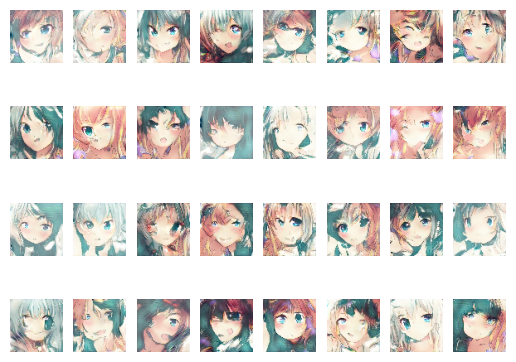

In [110]:
mygans.test_and_show()

In [111]:
mygans.discriminator.save(cwd + "/Saved_models/basic_GANs/danbooru_dataset_14000iter/discriminator")
mygans.generator.save(cwd + "/Saved_models/basic_GANs/danbooru_dataset_14000iter/generator")

INFO:tensorflow:Assets written to: C:\Users\chenq\Desktop\machine learning\Project_animeface_generator\HW3/Saved_models/basic_GANs/danbooru_dataset_14000iter/discriminator\assets
INFO:tensorflow:Assets written to: C:\Users\chenq\Desktop\machine learning\Project_animeface_generator\HW3/Saved_models/basic_GANs/danbooru_dataset_14000iter/generator\assets


In [34]:
generated_imgs_4375iter = mygans.generator(mygans.sample_batch_noise(mygans.batch_size, 100))
i = 0
for img_array in generated_imgs_4375iter:
    tf.keras.utils.save_img(cwd + "/generated_imgs/danbooru_dataset/4375iter/img{}.jpg".format(i), img_array)
    i += 1


In [105]:
fake_dataset = tf.keras.preprocessing.image_dataset_from_directory(
  cwd + "/generated_imgs/danbooru_dataset/",
  seed=123,
  image_size=(64, 64),
  batch_size=32)

Found 32 files belonging to 1 classes.


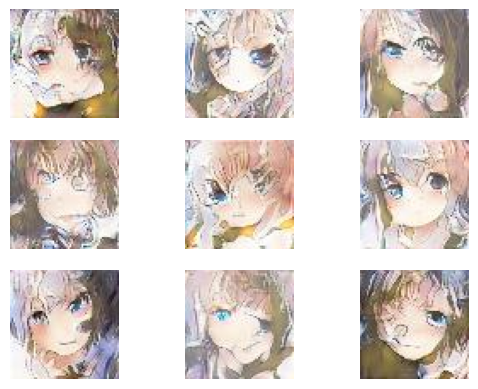

In [106]:
for images, labels in fake_dataset.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")
        
plt.show()

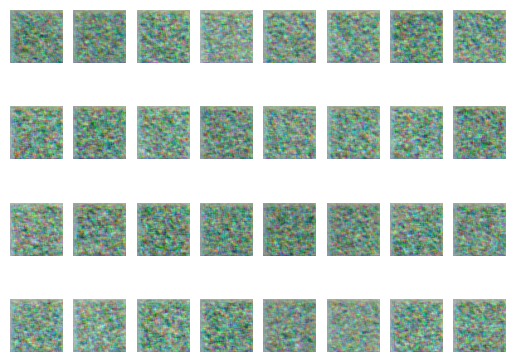

In [586]:
mygans.test_and_show()

### Save model 
#### WARNING: always check the save path!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [30]:
discriminator.save(cwd + "/Saved_models/basic_GANs/danbooru_dataset_4375iter/discriminator")

INFO:tensorflow:Assets written to: C:\Users\chenq\Desktop\machine learning\Project_animeface_generator\HW3/Saved_models/basic_GANs/danbooru_dataset_4375iter/discriminator\assets


In [31]:
generator.save(cwd + "/Saved_models/basic_GANs/danbooru_dataset_4375iter/generator")

INFO:tensorflow:Assets written to: C:\Users\chenq\Desktop\machine learning\Project_animeface_generator\HW3/Saved_models/basic_GANs/danbooru_dataset_4375iter/generator\assets


## W-Gan

In [17]:
batch_size = 32
img_height = 64
img_width = 64

In [18]:
class myWGAN(myGANs):
    
     def __init__(self, generator, discriminator, real_data_path, seed, batch_size, img_height, img_width):
            super().__init__(generator, discriminator, real_data_path, seed, batch_size, img_height, img_width)
            
     
     def loss_d_fn(self, real_predicts, fake_predicts, batch_size):
        
        # calculate loss for real images
        avg_real_loss = tf.reduce_mean(real_predicts)
        
        # calculate loss for fake images
        avg_fake_loss = tf.reduce_mean(fake_predicts)
        
        return - ( avg_real_loss - avg_fake_loss )        
    
     def loss_g_fn(self, fake_predicts, batch_size):
        
        # calculate loss for fake images
        avg_fake_loss = tf.reduce_mean(-fake_predicts)
        #avg_fake_loss = tf.math.divide(sum_fake_loss, tf.constant(float(batch_size)))
        
        return avg_fake_loss

In [39]:
Wgenerator = Sequential([
    
    Dense(128*16*16, activation = 'relu', input_shape = (100, )),# input a noise vector with length 100
    
    tf.keras.layers.Reshape((16, 16, 128), input_shape=(128*16*16,)),
    
    tf.keras.layers.UpSampling2D(size=(2, 2)),
    
    Conv2D(128, 4, activation = 'relu', padding = 'same'),
    
    tf.keras.layers.UpSampling2D(size=(2, 2)),
    
    #tf.keras.layers.Dropout(0.5),
    
    Conv2D(64, 4, activation = 'relu', padding = 'same'),
    
    #tf.keras.layers.Dropout(0.5),
    Conv2D(32, 4, activation = 'relu', padding = 'same'),
    
    Conv2D(3, 4, activation = 'tanh', padding = 'same'),

    # For a neural network, small numbers (-1, 1) often gives a better performence, so I want input and output be in this range.
    # A generator can only generate some pixels in (-1, 1) can not be an eligible adversary of discriminator
    # cause the real image can use (0, 255) as its pixel values
    # That is why we times 255 after final output.
    tf.keras.layers.experimental.preprocessing.Rescaling(255, input_shape=(img_height, img_width, 3))
])

Wgenerator.optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0002, clipvalue = 0.1)

In [40]:
Wdiscriminator = Sequential([
    
    # Again, networks works better with small number, normalize the inputs form (0, 255) to (-1, 1) is a nice preprocessing.
    tf.keras.layers.experimental.preprocessing.Rescaling(scale=1./127.5, offset=-1, input_shape=(img_height, img_width, 3)),
    
    Conv2D(32, 4, activation = 'relu', input_shape = (64, 64, 3)),
    
    Conv2D(64, 4, activation = 'relu', padding = "same"),
 
    Conv2D(128, 4, activation = 'relu'),

    Conv2D(256, 4, activation = 'relu'),
    
    Flatten(),
    
    Dense(1) # we use something contains log as its loss function, need input a value greater than 0, sigmoid is used
])

Wdiscriminator.optimizer = tf.keras.optimizers.RMSprop(learning_rate = 0.0002, clipvalue = 0.1) # do weight cliping

In [21]:
my_wgans = myWGAN(Wgenerator, Wdiscriminator, cwd + "/extra_data_from_danbooru/", 1, 32, 64, 64)

Found 140000 files belonging to 1 classes.


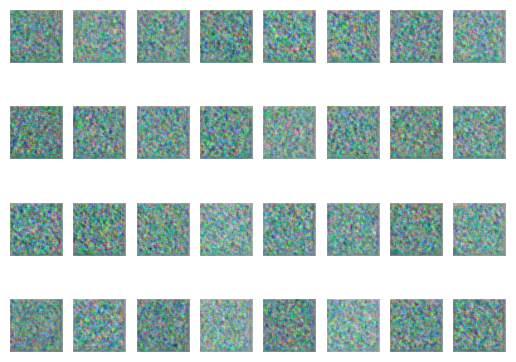

In [22]:
my_wgans.test_and_show()

Training with new tech

In [23]:
my_wgans.training(1)

Epochs: 1
Current loss for discriminator: -0.019238198176026344
Current loss for generator: 10.873588562011719


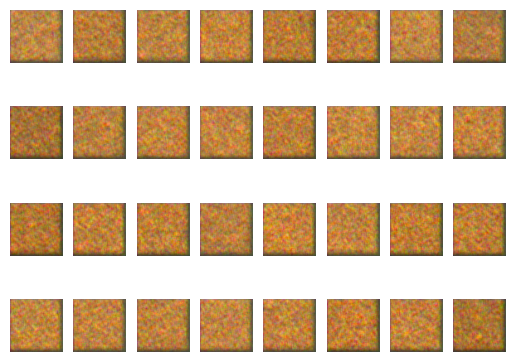

In [24]:
my_wgans.test_and_show()

In [25]:
my_wgans.training(9)

Epochs: 2
Current loss for discriminator: -7.221336364746094
Current loss for generator: 39.443115234375
Epochs: 3
Current loss for discriminator: -25.13309669494629
Current loss for generator: 47.64630889892578
Epochs: 4
Current loss for discriminator: -16.397293090820312
Current loss for generator: -34.177825927734375
Epochs: 5
Current loss for discriminator: 29.260406494140625
Current loss for generator: -82.96701049804688
Epochs: 6
Current loss for discriminator: 42.64531707763672
Current loss for generator: -62.060211181640625
Epochs: 7
Current loss for discriminator: 1.8564224243164062
Current loss for generator: -30.676990509033203
Epochs: 8
Current loss for discriminator: -37.5565071105957
Current loss for generator: -24.506683349609375
Epochs: 9
Current loss for discriminator: -62.575069427490234
Current loss for generator: -17.71083641052246
Epochs: 10
Current loss for discriminator: 8.205429077148438
Current loss for generator: -47.527713775634766


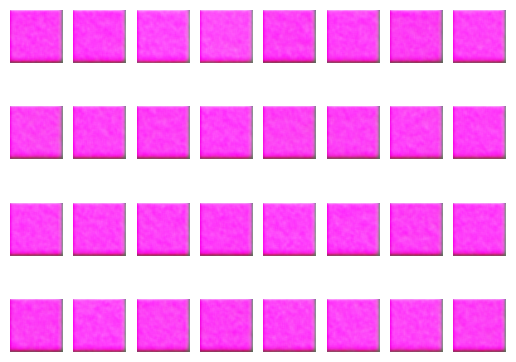

In [26]:
my_wgans.test_and_show()

In [27]:
my_wgans.training(90)

Epochs: 11
Current loss for discriminator: 168.40684509277344
Current loss for generator: -91.89047241210938
Epochs: 12
Current loss for discriminator: 188.08847045898438
Current loss for generator: -10.181574821472168
Epochs: 13
Current loss for discriminator: -11.784393310546875
Current loss for generator: 124.37847900390625
Epochs: 14
Current loss for discriminator: -129.6752166748047
Current loss for generator: 197.27325439453125
Epochs: 15
Current loss for discriminator: -204.59869384765625
Current loss for generator: 219.65977478027344
Epochs: 16
Current loss for discriminator: -195.7401123046875
Current loss for generator: 329.68804931640625
Epochs: 17
Current loss for discriminator: -300.5072326660156
Current loss for generator: 406.96173095703125
Epochs: 18
Current loss for discriminator: -377.9595947265625
Current loss for generator: 361.03973388671875
Epochs: 19
Current loss for discriminator: -336.2638854980469
Current loss for generator: 420.98077392578125
Epochs: 20
Curre

Current loss for discriminator: -3518.1357421875
Current loss for generator: 5531.908203125
Epochs: 56
Current loss for discriminator: -2437.9873046875
Current loss for generator: 3841.41943359375
Epochs: 57
Current loss for discriminator: 381.4189453125
Current loss for generator: 455.0436096191406
Epochs: 58
Current loss for discriminator: 551.0821533203125
Current loss for generator: 101.59700775146484
Epochs: 59
Current loss for discriminator: 372.7425537109375
Current loss for generator: 77.5860595703125
Epochs: 60
Current loss for discriminator: 71.07772064208984
Current loss for generator: 87.7819595336914
Epochs: 61
Current loss for discriminator: -227.50491333007812
Current loss for generator: 100.36868286132812
Epochs: 62
Current loss for discriminator: -441.2627258300781
Current loss for generator: 107.83743286132812
Epochs: 63
Current loss for discriminator: -706.3802490234375
Current loss for generator: 107.29869079589844
Epochs: 64
Current loss for discriminator: -1051.40

Current loss for generator: -33.64087677001953
Epochs: 100
Current loss for discriminator: -200.677490234375
Current loss for generator: 174.51803588867188


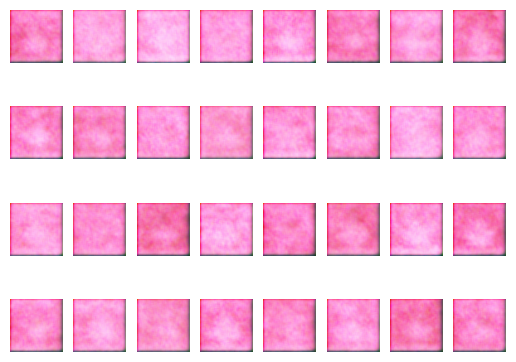

In [28]:
my_wgans.test_and_show()

In [29]:
my_wgans.training(900)

Epochs: 101
Current loss for discriminator: -463.3927307128906
Current loss for generator: -105.41603088378906
Epochs: 102
Current loss for discriminator: -223.6590576171875
Current loss for generator: 301.8680725097656
Epochs: 103
Current loss for discriminator: -428.84954833984375
Current loss for generator: -8.167734146118164
Epochs: 104
Current loss for discriminator: -914.4583129882812
Current loss for generator: -356.627197265625
Epochs: 105
Current loss for discriminator: 997.80810546875
Current loss for generator: -590.651123046875
Epochs: 106
Current loss for discriminator: 835.0033569335938
Current loss for generator: 155.5356903076172
Epochs: 107
Current loss for discriminator: -58.8148193359375
Current loss for generator: -346.57318115234375
Epochs: 108
Current loss for discriminator: 488.7232666015625
Current loss for generator: 414.039794921875
Epochs: 109
Current loss for discriminator: -173.4450225830078
Current loss for generator: -283.46954345703125
Epochs: 110
Curren

Current loss for generator: 101.70883178710938
Epochs: 145
Current loss for discriminator: -125.10935974121094
Current loss for generator: 60.252567291259766
Epochs: 146
Current loss for discriminator: 66.201904296875
Current loss for generator: 18.735084533691406
Epochs: 147
Current loss for discriminator: 57.09346008300781
Current loss for generator: 693.76416015625
Epochs: 148
Current loss for discriminator: -33.37775421142578
Current loss for generator: 100.09845733642578
Epochs: 149
Current loss for discriminator: -49.6425666809082
Current loss for generator: 326.9944152832031
Epochs: 150
Current loss for discriminator: -7.136436462402344
Current loss for generator: 81.21663665771484
Epochs: 151
Current loss for discriminator: 91.96878814697266
Current loss for generator: 220.07012939453125
Epochs: 152
Current loss for discriminator: 38.34149169921875
Current loss for generator: 79.44461822509766
Epochs: 153
Current loss for discriminator: -23.82659149169922
Current loss for gener

Current loss for discriminator: -73.00001525878906
Current loss for generator: 359.26513671875
Epochs: 189
Current loss for discriminator: -7.3524627685546875
Current loss for generator: 200.54322814941406
Epochs: 190
Current loss for discriminator: 2.3917388916015625
Current loss for generator: 224.41294860839844
Epochs: 191
Current loss for discriminator: -57.77728271484375
Current loss for generator: 161.2998504638672
Epochs: 192
Current loss for discriminator: -39.58656311035156
Current loss for generator: 287.51312255859375
Epochs: 193
Current loss for discriminator: -39.49580383300781
Current loss for generator: 127.01164245605469
Epochs: 194
Current loss for discriminator: -45.49652099609375
Current loss for generator: 246.68991088867188
Epochs: 195
Current loss for discriminator: -44.562835693359375
Current loss for generator: 102.438720703125
Epochs: 196
Current loss for discriminator: -67.50985717773438
Current loss for generator: 143.41790771484375
Epochs: 197
Current loss f

Current loss for generator: -110.51765441894531
Epochs: 232
Current loss for discriminator: 25.503753662109375
Current loss for generator: -308.0946044921875
Epochs: 233
Current loss for discriminator: 144.85708618164062
Current loss for generator: -240.87799072265625
Epochs: 234
Current loss for discriminator: 160.59652709960938
Current loss for generator: 56.77033996582031
Epochs: 235
Current loss for discriminator: -137.87234497070312
Current loss for generator: 440.7066650390625
Epochs: 236
Current loss for discriminator: -219.1370391845703
Current loss for generator: 329.3304748535156
Epochs: 237
Current loss for discriminator: -94.56739807128906
Current loss for generator: 71.72984313964844
Epochs: 238
Current loss for discriminator: -103.80894470214844
Current loss for generator: 5.665398120880127
Epochs: 239
Current loss for discriminator: 26.269683837890625
Current loss for generator: 0.6872062683105469
Epochs: 240
Current loss for discriminator: -9.193672180175781
Current los

Epochs: 275
Current loss for discriminator: -306.5474548339844
Current loss for generator: 325.0118103027344
Epochs: 276
Current loss for discriminator: -397.54364013671875
Current loss for generator: 511.5830078125
Epochs: 277
Current loss for discriminator: 52.130393981933594
Current loss for generator: 114.38602447509766
Epochs: 278
Current loss for discriminator: 564.6243896484375
Current loss for generator: -117.98204803466797
Epochs: 279
Current loss for discriminator: 651.8757934570312
Current loss for generator: 73.02218627929688
Epochs: 280
Current loss for discriminator: 273.64117431640625
Current loss for generator: 682.5609130859375
Epochs: 281
Current loss for discriminator: -175.70950317382812
Current loss for generator: 1070.6834716796875
Epochs: 282
Current loss for discriminator: -153.2073974609375
Current loss for generator: 1019.5151977539062
Epochs: 283
Current loss for discriminator: -51.31866455078125
Current loss for generator: 607.1790771484375
Epochs: 284
Curre

Current loss for discriminator: -1253.349853515625
Current loss for generator: 2179.966796875
Epochs: 319
Current loss for discriminator: -1313.9375
Current loss for generator: 2326.491455078125
Epochs: 320
Current loss for discriminator: -595.3316650390625
Current loss for generator: 1273.675537109375
Epochs: 321
Current loss for discriminator: -214.8885498046875
Current loss for generator: 666.9796752929688
Epochs: 322
Current loss for discriminator: -587.8231201171875
Current loss for generator: 1543.9705810546875
Epochs: 323
Current loss for discriminator: -901.171142578125
Current loss for generator: 1206.8505859375
Epochs: 324
Current loss for discriminator: -1447.78369140625
Current loss for generator: 1421.89013671875
Epochs: 325
Current loss for discriminator: -1567.21923828125
Current loss for generator: 1009.7145385742188
Epochs: 326
Current loss for discriminator: -1309.5435791015625
Current loss for generator: 1062.654541015625
Epochs: 327
Current loss for discriminator: -

Current loss for discriminator: -676.3444213867188
Current loss for generator: 2209.94873046875
Epochs: 363
Current loss for discriminator: -1220.0556640625
Current loss for generator: 3500.4814453125
Epochs: 364
Current loss for discriminator: -251.5899658203125
Current loss for generator: 1928.0029296875
Epochs: 365
Current loss for discriminator: -459.5125732421875
Current loss for generator: 2613.30126953125
Epochs: 366
Current loss for discriminator: -1598.85791015625
Current loss for generator: 2901.06494140625
Epochs: 367
Current loss for discriminator: -1199.0849609375
Current loss for generator: 1478.324951171875
Epochs: 368
Current loss for discriminator: 16.74871826171875
Current loss for generator: 412.617431640625
Epochs: 369
Current loss for discriminator: -145.96490478515625
Current loss for generator: 2152.324951171875
Epochs: 370
Current loss for discriminator: -1130.8560791015625
Current loss for generator: 2823.755126953125
Epochs: 371
Current loss for discriminator:

Current loss for discriminator: -160.4761505126953
Current loss for generator: 3066.733154296875
Epochs: 407
Current loss for discriminator: -1937.98876953125
Current loss for generator: 3424.7392578125
Epochs: 408
Current loss for discriminator: -2303.07861328125
Current loss for generator: 1915.8909912109375
Epochs: 409
Current loss for discriminator: -1747.0433349609375
Current loss for generator: 1544.3829345703125
Epochs: 410
Current loss for discriminator: -989.4071655273438
Current loss for generator: 1099.5316162109375
Epochs: 411
Current loss for discriminator: -540.5626220703125
Current loss for generator: 1546.59912109375
Epochs: 412
Current loss for discriminator: -2401.673828125
Current loss for generator: 5734.75146484375
Epochs: 413
Current loss for discriminator: -5922.88818359375
Current loss for generator: 8467.5947265625
Epochs: 414
Current loss for discriminator: -5977.6015625
Current loss for generator: 4989.7626953125
Epochs: 415
Current loss for discriminator: -1

Current loss for generator: 8383.564453125
Epochs: 451
Current loss for discriminator: -3658.80908203125
Current loss for generator: 7740.45947265625
Epochs: 452
Current loss for discriminator: -5089.8037109375
Current loss for generator: 8849.2041015625
Epochs: 453
Current loss for discriminator: -4897.5751953125
Current loss for generator: 4305.693359375
Epochs: 454
Current loss for discriminator: -2734.123046875
Current loss for generator: 4374.01806640625
Epochs: 455
Current loss for discriminator: -5288.3583984375
Current loss for generator: 7696.7314453125
Epochs: 456
Current loss for discriminator: -6619.04833984375
Current loss for generator: 11907.79296875
Epochs: 457
Current loss for discriminator: -4043.030517578125
Current loss for generator: 5967.38232421875
Epochs: 458
Current loss for discriminator: -4368.69091796875
Current loss for generator: 6662.44140625
Epochs: 459
Current loss for discriminator: -5669.5830078125
Current loss for generator: 5246.79296875
Epochs: 460

Current loss for discriminator: -11184.8408203125
Current loss for generator: 15283.8359375
Epochs: 496
Current loss for discriminator: -12401.9580078125
Current loss for generator: 19199.7578125
Epochs: 497
Current loss for discriminator: -13702.931640625
Current loss for generator: 20671.96484375
Epochs: 498
Current loss for discriminator: -12314.0849609375
Current loss for generator: 28476.712890625
Epochs: 499
Current loss for discriminator: -18662.4140625
Current loss for generator: 35832.26953125
Epochs: 500
Current loss for discriminator: -7107.720703125
Current loss for generator: 28121.859375
Epochs: 501
Current loss for discriminator: -17326.076171875
Current loss for generator: 28148.962890625
Epochs: 502
Current loss for discriminator: -16749.73828125
Current loss for generator: 12293.2783203125
Epochs: 503
Current loss for discriminator: -9308.7578125
Current loss for generator: 16202.984375
Epochs: 504
Current loss for discriminator: -13754.6865234375
Current loss for gen

Current loss for discriminator: 14473.4638671875
Current loss for generator: -2519.06396484375
Epochs: 541
Current loss for discriminator: 34514.8125
Current loss for generator: -42114.3671875
Epochs: 542
Current loss for discriminator: 40065.1328125
Current loss for generator: -58983.40625
Epochs: 543
Current loss for discriminator: 38819.83984375
Current loss for generator: -74049.703125
Epochs: 544
Current loss for discriminator: 43361.203125
Current loss for generator: -79054.71875
Epochs: 545
Current loss for discriminator: 42700.671875
Current loss for generator: -79680.5
Epochs: 546
Current loss for discriminator: 35942.375
Current loss for generator: -72098.6875
Epochs: 547
Current loss for discriminator: 26000.9609375
Current loss for generator: -61153.9765625
Epochs: 548
Current loss for discriminator: 10157.49609375
Current loss for generator: -46096.375
Epochs: 549
Current loss for discriminator: -3547.32421875
Current loss for generator: -24898.220703125
Epochs: 550
Curren

Current loss for discriminator: 21749.671875
Current loss for generator: -1073.2442626953125
Epochs: 587
Current loss for discriminator: 16976.72265625
Current loss for generator: 14815.4833984375
Epochs: 588
Current loss for discriminator: 11286.1357421875
Current loss for generator: 12265.6435546875
Epochs: 589
Current loss for discriminator: 3590.6171875
Current loss for generator: 20294.662109375
Epochs: 590
Current loss for discriminator: -2801.1396484375
Current loss for generator: 7717.908203125
Epochs: 591
Current loss for discriminator: -7255.4794921875
Current loss for generator: 20199.62109375
Epochs: 592
Current loss for discriminator: -8862.390625
Current loss for generator: 335.907958984375
Epochs: 593
Current loss for discriminator: -9984.201171875
Current loss for generator: 9611.8935546875
Epochs: 594
Current loss for discriminator: -8295.1611328125
Current loss for generator: -2296.53369140625
Epochs: 595
Current loss for discriminator: -6064.8056640625
Current loss f

Current loss for generator: 10613.2119140625
Epochs: 632
Current loss for discriminator: -199455.921875
Current loss for generator: 23405.1484375
Epochs: 633
Current loss for discriminator: -219064.5625
Current loss for generator: 35042.17578125
Epochs: 634
Current loss for discriminator: -233171.078125
Current loss for generator: 45409.7421875
Epochs: 635
Current loss for discriminator: -255706.09375
Current loss for generator: 57160.00390625
Epochs: 636
Current loss for discriminator: -325647.625
Current loss for generator: 67378.46875
Epochs: 637
Current loss for discriminator: -352229.90625
Current loss for generator: 76379.4453125
Epochs: 638
Current loss for discriminator: -363619.9375
Current loss for generator: 86149.5234375
Epochs: 639
Current loss for discriminator: -400896.6875
Current loss for generator: 95521.828125
Epochs: 640
Current loss for discriminator: -420528.75
Current loss for generator: 105750.734375
Epochs: 641
Current loss for discriminator: -456660.40625
Curr

Current loss for discriminator: 138427.34375
Current loss for generator: -160304.609375
Epochs: 679
Current loss for discriminator: 59631.1484375
Current loss for generator: -34295.93359375
Epochs: 680
Current loss for discriminator: -27784.1328125
Current loss for generator: 88352.96875
Epochs: 681
Current loss for discriminator: -99235.7109375
Current loss for generator: 211278.46875
Epochs: 682
Current loss for discriminator: -172045.46875
Current loss for generator: 335337.28125
Epochs: 683
Current loss for discriminator: -242189.90625
Current loss for generator: 463091.28125
Epochs: 684
Current loss for discriminator: -325234.84375
Current loss for generator: 592871.375
Epochs: 685
Current loss for discriminator: -390777.1875
Current loss for generator: 727241.5
Epochs: 686
Current loss for discriminator: -489129.90625
Current loss for generator: 864521.0
Epochs: 687
Current loss for discriminator: -582409.5
Current loss for generator: 1007931.4375
Epochs: 688
Current loss for dis

Epochs: 725
Current loss for discriminator: -14044.03125
Current loss for generator: -37599.578125
Epochs: 726
Current loss for discriminator: 10890.3828125
Current loss for generator: -36470.796875
Epochs: 727
Current loss for discriminator: 24872.2265625
Current loss for generator: -35614.6484375
Epochs: 728
Current loss for discriminator: 22791.6171875
Current loss for generator: 2808.914794921875
Epochs: 729
Current loss for discriminator: 22629.794921875
Current loss for generator: -20229.328125
Epochs: 730
Current loss for discriminator: 15610.7890625
Current loss for generator: 7291.3623046875
Epochs: 731
Current loss for discriminator: 10807.087890625
Current loss for generator: -9999.1181640625
Epochs: 732
Current loss for discriminator: 15973.740234375
Current loss for generator: -19432.171875
Epochs: 733
Current loss for discriminator: 12904.005859375
Current loss for generator: -44914.0
Epochs: 734
Current loss for discriminator: 14245.1328125
Current loss for generator: -5

Epochs: 770
Current loss for discriminator: -2154.826416015625
Current loss for generator: 28065.642578125
Epochs: 771
Current loss for discriminator: -4779.912109375
Current loss for generator: 43472.52734375
Epochs: 772
Current loss for discriminator: -2433.6171875
Current loss for generator: 52102.203125
Epochs: 773
Current loss for discriminator: 2145.375
Current loss for generator: 35321.37109375
Epochs: 774
Current loss for discriminator: 715.572265625
Current loss for generator: 41219.31640625
Epochs: 775
Current loss for discriminator: 3129.7578125
Current loss for generator: 24206.556640625
Epochs: 776
Current loss for discriminator: 784.7646484375
Current loss for generator: 2924.5390625
Epochs: 777
Current loss for discriminator: 3030.47607421875
Current loss for generator: 31316.24609375
Epochs: 778
Current loss for discriminator: -377.0390625
Current loss for generator: 20693.84765625
Epochs: 779
Current loss for discriminator: -2815.365234375
Current loss for generator: 4

Current loss for generator: 4076.197265625
Epochs: 815
Current loss for discriminator: -3536.28125
Current loss for generator: 30020.296875
Epochs: 816
Current loss for discriminator: -7114.96875
Current loss for generator: 12152.9609375
Epochs: 817
Current loss for discriminator: -8809.21875
Current loss for generator: 22536.44921875
Epochs: 818
Current loss for discriminator: -6887.4267578125
Current loss for generator: 29029.25390625
Epochs: 819
Current loss for discriminator: -6020.318359375
Current loss for generator: 15171.4560546875
Epochs: 820
Current loss for discriminator: -7456.6552734375
Current loss for generator: 4250.6884765625
Epochs: 821
Current loss for discriminator: -6102.7734375
Current loss for generator: 29672.087890625
Epochs: 822
Current loss for discriminator: -10093.978515625
Current loss for generator: 11955.7275390625
Epochs: 823
Current loss for discriminator: -8047.47607421875
Current loss for generator: 2888.123291015625
Epochs: 824
Current loss for disc

Epochs: 860
Current loss for discriminator: -9209.560546875
Current loss for generator: 48357.5703125
Epochs: 861
Current loss for discriminator: -9313.84765625
Current loss for generator: 21438.533203125
Epochs: 862
Current loss for discriminator: -8591.994140625
Current loss for generator: 50431.09375
Epochs: 863
Current loss for discriminator: -10088.607421875
Current loss for generator: 30302.626953125
Epochs: 864
Current loss for discriminator: -10512.5458984375
Current loss for generator: 54074.6171875
Epochs: 865
Current loss for discriminator: -10058.671875
Current loss for generator: 29134.8046875
Epochs: 866
Current loss for discriminator: -11930.2626953125
Current loss for generator: 45547.88671875
Epochs: 867
Current loss for discriminator: -9349.8046875
Current loss for generator: 22819.833984375
Epochs: 868
Current loss for discriminator: -11511.244140625
Current loss for generator: 48503.03125
Epochs: 869
Current loss for discriminator: -12629.439453125
Current loss for 

Current loss for discriminator: -41287.453125
Current loss for generator: -38691.046875
Epochs: 906
Current loss for discriminator: -9112.7578125
Current loss for generator: -86101.2578125
Epochs: 907
Current loss for discriminator: 33435.40625
Current loss for generator: -93592.2734375
Epochs: 908
Current loss for discriminator: 36661.0625
Current loss for generator: -69401.40625
Epochs: 909
Current loss for discriminator: 19224.5859375
Current loss for generator: -15795.806640625
Epochs: 910
Current loss for discriminator: -16988.44140625
Current loss for generator: 49170.6171875
Epochs: 911
Current loss for discriminator: -44709.4765625
Current loss for generator: 102158.6875
Epochs: 912
Current loss for discriminator: -58673.015625
Current loss for generator: 125508.828125
Epochs: 913
Current loss for discriminator: -17748.90625
Current loss for generator: 120672.0703125
Epochs: 914
Current loss for discriminator: 5571.19921875
Current loss for generator: 99318.015625
Epochs: 915
C

Current loss for generator: 71935.390625
Epochs: 951
Current loss for discriminator: -44638.6328125
Current loss for generator: 52081.62109375
Epochs: 952
Current loss for discriminator: -8057.6005859375
Current loss for generator: 30707.6640625
Epochs: 953
Current loss for discriminator: 3174.27734375
Current loss for generator: 54284.9765625
Epochs: 954
Current loss for discriminator: -9134.84375
Current loss for generator: 76794.9375
Epochs: 955
Current loss for discriminator: -15204.828125
Current loss for generator: 87213.2265625
Epochs: 956
Current loss for discriminator: -2140.203125
Current loss for generator: 61983.2421875
Epochs: 957
Current loss for discriminator: -8540.1796875
Current loss for generator: 83446.984375
Epochs: 958
Current loss for discriminator: 229.328125
Current loss for generator: 57406.15625
Epochs: 959
Current loss for discriminator: -5711.35546875
Current loss for generator: 51356.60546875
Epochs: 960
Current loss for discriminator: -2127.203125
Current

Epochs: 996
Current loss for discriminator: -10385.40625
Current loss for generator: 31050.0546875
Epochs: 997
Current loss for discriminator: -5020.740234375
Current loss for generator: 56171.55078125
Epochs: 998
Current loss for discriminator: -9046.078125
Current loss for generator: 39141.9296875
Epochs: 999
Current loss for discriminator: -5713.4296875
Current loss for generator: 53165.6796875
Epochs: 1000
Current loss for discriminator: -7732.8515625
Current loss for generator: 32599.6015625


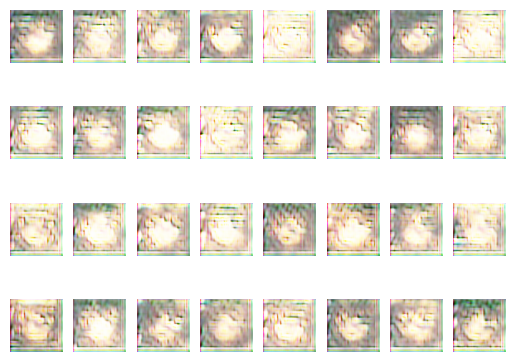

In [30]:
my_wgans.test_and_show()

In [31]:
my_wgans.training(1000)

Epochs: 1001
Current loss for discriminator: -6734.4072265625
Current loss for generator: 49191.21484375
Epochs: 1002
Current loss for discriminator: -6628.52734375
Current loss for generator: 29150.05078125
Epochs: 1003
Current loss for discriminator: -6042.52734375
Current loss for generator: 24891.984375
Epochs: 1004
Current loss for discriminator: -6707.7880859375
Current loss for generator: 28040.37890625
Epochs: 1005
Current loss for discriminator: -8059.873046875
Current loss for generator: 54395.24609375
Epochs: 1006
Current loss for discriminator: -6602.50390625
Current loss for generator: 38566.703125
Epochs: 1007
Current loss for discriminator: -4421.03515625
Current loss for generator: 45803.66796875
Epochs: 1008
Current loss for discriminator: -5720.859375
Current loss for generator: 26124.330078125
Epochs: 1009
Current loss for discriminator: -5904.0341796875
Current loss for generator: 42896.734375
Epochs: 1010
Current loss for discriminator: -5458.55078125
Current loss 

Current loss for discriminator: -8513.73046875
Current loss for generator: 34964.984375
Epochs: 1047
Current loss for discriminator: -5068.302734375
Current loss for generator: 46767.43359375
Epochs: 1048
Current loss for discriminator: -2152.2109375
Current loss for generator: 35819.94921875
Epochs: 1049
Current loss for discriminator: -3532.6875
Current loss for generator: 73309.0859375
Epochs: 1050
Current loss for discriminator: -6889.703125
Current loss for generator: 74422.2890625
Epochs: 1051
Current loss for discriminator: -937.765625
Current loss for generator: 48506.8203125
Epochs: 1052
Current loss for discriminator: -1390.8828125
Current loss for generator: 31372.625
Epochs: 1053
Current loss for discriminator: -6991.888671875
Current loss for generator: 7706.7763671875
Epochs: 1054
Current loss for discriminator: -7431.337890625
Current loss for generator: -22359.98046875
Epochs: 1055
Current loss for discriminator: 17234.1484375
Current loss for generator: 2790.0773925781

Current loss for generator: 7511.5791015625
Epochs: 1092
Current loss for discriminator: 1004.3837890625
Current loss for generator: 14031.34375
Epochs: 1093
Current loss for discriminator: -1448.130859375
Current loss for generator: 45232.5625
Epochs: 1094
Current loss for discriminator: -11493.4296875
Current loss for generator: 70232.625
Epochs: 1095
Current loss for discriminator: -831.15234375
Current loss for generator: 42223.6328125
Epochs: 1096
Current loss for discriminator: 2891.421875
Current loss for generator: 21665.91015625
Epochs: 1097
Current loss for discriminator: -5144.98828125
Current loss for generator: 36791.578125
Epochs: 1098
Current loss for discriminator: -3111.025390625
Current loss for generator: 16407.9921875
Epochs: 1099
Current loss for discriminator: -1345.70703125
Current loss for generator: 39169.96875
Epochs: 1100
Current loss for discriminator: -30.8203125
Current loss for generator: 14568.306640625
Epochs: 1101
Current loss for discriminator: -3892.

Epochs: 1137
Current loss for discriminator: -1775.25390625
Current loss for generator: 43031.01171875
Epochs: 1138
Current loss for discriminator: -4333.18359375
Current loss for generator: 33448.59375
Epochs: 1139
Current loss for discriminator: -8358.33984375
Current loss for generator: 19034.470703125
Epochs: 1140
Current loss for discriminator: -4511.98046875
Current loss for generator: 31038.75390625
Epochs: 1141
Current loss for discriminator: -4379.65625
Current loss for generator: 29712.4921875
Epochs: 1142
Current loss for discriminator: -6725.85546875
Current loss for generator: 9816.265625
Epochs: 1143
Current loss for discriminator: -4900.6376953125
Current loss for generator: 28119.8828125
Epochs: 1144
Current loss for discriminator: -8200.625
Current loss for generator: 20364.9921875
Epochs: 1145
Current loss for discriminator: -4134.177734375
Current loss for generator: 40341.00390625
Epochs: 1146
Current loss for discriminator: -6126.310546875
Current loss for generato

Epochs: 1182
Current loss for discriminator: -11260.6396484375
Current loss for generator: 8465.404296875
Epochs: 1183
Current loss for discriminator: -1694.68994140625
Current loss for generator: -7978.64794921875
Epochs: 1184
Current loss for discriminator: 6665.16015625
Current loss for generator: 6399.2080078125
Epochs: 1185
Current loss for discriminator: -3938.69580078125
Current loss for generator: 43824.4609375
Epochs: 1186
Current loss for discriminator: -29779.505859375
Current loss for generator: 69221.546875
Epochs: 1187
Current loss for discriminator: -16544.556640625
Current loss for generator: 50522.34375
Epochs: 1188
Current loss for discriminator: 5991.322265625
Current loss for generator: 33584.60546875
Epochs: 1189
Current loss for discriminator: 7149.34765625
Current loss for generator: 25427.3984375
Epochs: 1190
Current loss for discriminator: -932.08203125
Current loss for generator: 51408.265625
Epochs: 1191
Current loss for discriminator: -12475.7734375
Current 

Current loss for discriminator: -10016.421875
Current loss for generator: 47563.43359375
Epochs: 1228
Current loss for discriminator: -12392.32421875
Current loss for generator: 26094.12890625
Epochs: 1229
Current loss for discriminator: -7425.5
Current loss for generator: 41912.62890625
Epochs: 1230
Current loss for discriminator: -8914.94921875
Current loss for generator: 43354.546875
Epochs: 1231
Current loss for discriminator: -16347.83203125
Current loss for generator: 20905.0234375
Epochs: 1232
Current loss for discriminator: -4108.4775390625
Current loss for generator: 35452.671875
Epochs: 1233
Current loss for discriminator: -13509.771484375
Current loss for generator: 49200.8984375
Epochs: 1234
Current loss for discriminator: -8716.09765625
Current loss for generator: 45573.77734375
Epochs: 1235
Current loss for discriminator: -14484.82421875
Current loss for generator: 66101.96875
Epochs: 1236
Current loss for discriminator: -17248.8828125
Current loss for generator: 71770.40

Epochs: 1273
Current loss for discriminator: -15230.94921875
Current loss for generator: 52719.6328125
Epochs: 1274
Current loss for discriminator: -13851.0625
Current loss for generator: 36159.84375
Epochs: 1275
Current loss for discriminator: -21040.5390625
Current loss for generator: 16607.345703125
Epochs: 1276
Current loss for discriminator: -6982.06396484375
Current loss for generator: 40126.046875
Epochs: 1277
Current loss for discriminator: -4752.875
Current loss for generator: 58177.6171875
Epochs: 1278
Current loss for discriminator: -15898.09765625
Current loss for generator: 72620.625
Epochs: 1279
Current loss for discriminator: -8962.359375
Current loss for generator: 40919.0625
Epochs: 1280
Current loss for discriminator: -7347.98828125
Current loss for generator: 35644.59375
Epochs: 1281
Current loss for discriminator: -17397.5703125
Current loss for generator: 71551.671875
Epochs: 1282
Current loss for discriminator: -11641.8046875
Current loss for generator: 74721.8046

Current loss for discriminator: -141722.96875
Current loss for generator: 285883.5625
Epochs: 1319
Current loss for discriminator: -105972.3515625
Current loss for generator: 235724.421875
Epochs: 1320
Current loss for discriminator: -28448.703125
Current loss for generator: 182501.65625
Epochs: 1321
Current loss for discriminator: 157.65625
Current loss for generator: 172817.375
Epochs: 1322
Current loss for discriminator: 5773.125
Current loss for generator: 180934.25
Epochs: 1323
Current loss for discriminator: 13970.1875
Current loss for generator: 175703.640625
Epochs: 1324
Current loss for discriminator: 32676.4375
Current loss for generator: 131627.90625
Epochs: 1325
Current loss for discriminator: 44439.890625
Current loss for generator: 107484.21875
Epochs: 1326
Current loss for discriminator: 59255.6171875
Current loss for generator: 70823.171875
Epochs: 1327
Current loss for discriminator: 60356.9453125
Current loss for generator: 53416.73046875
Epochs: 1328
Current loss for

Epochs: 1364
Current loss for discriminator: 23005.978515625
Current loss for generator: 11475.7265625
Epochs: 1365
Current loss for discriminator: 10561.619140625
Current loss for generator: 35279.515625
Epochs: 1366
Current loss for discriminator: 4859.2734375
Current loss for generator: 52202.2421875
Epochs: 1367
Current loss for discriminator: -3081.1796875
Current loss for generator: 70576.25
Epochs: 1368
Current loss for discriminator: -5043.9375
Current loss for generator: 58755.6953125
Epochs: 1369
Current loss for discriminator: -6458.80078125
Current loss for generator: 45380.66796875
Epochs: 1370
Current loss for discriminator: -3665.01171875
Current loss for generator: 27582.55078125
Epochs: 1371
Current loss for discriminator: 4715.8505859375
Current loss for generator: 7303.0576171875
Epochs: 1372
Current loss for discriminator: 3826.48828125
Current loss for generator: -14013.1220703125
Epochs: 1373
Current loss for discriminator: 3838.48046875
Current loss for generator

Epochs: 1409
Current loss for discriminator: -7524.5625
Current loss for generator: 49248.12890625
Epochs: 1410
Current loss for discriminator: 1355.16796875
Current loss for generator: 37224.18359375
Epochs: 1411
Current loss for discriminator: -8451.208984375
Current loss for generator: 25828.912109375
Epochs: 1412
Current loss for discriminator: -3016.1171875
Current loss for generator: 35849.5859375
Epochs: 1413
Current loss for discriminator: -6050.458984375
Current loss for generator: 63618.69921875
Epochs: 1414
Current loss for discriminator: -11504.53125
Current loss for generator: 70359.8046875
Epochs: 1415
Current loss for discriminator: 454.0234375
Current loss for generator: 46173.31640625
Epochs: 1416
Current loss for discriminator: 2497.67578125
Current loss for generator: 35181.8125
Epochs: 1417
Current loss for discriminator: -353.2421875
Current loss for generator: 43508.7421875
Epochs: 1418
Current loss for discriminator: -11071.29296875
Current loss for generator: 61

Current loss for discriminator: 6093.69091796875
Current loss for generator: 13402.1201171875
Epochs: 1455
Current loss for discriminator: 6664.01953125
Current loss for generator: 24398.8125
Epochs: 1456
Current loss for discriminator: -1239.884765625
Current loss for generator: 54729.98046875
Epochs: 1457
Current loss for discriminator: -13058.1328125
Current loss for generator: 73246.625
Epochs: 1458
Current loss for discriminator: -14647.48046875
Current loss for generator: 74367.25
Epochs: 1459
Current loss for discriminator: -13934.30859375
Current loss for generator: 61544.3515625
Epochs: 1460
Current loss for discriminator: -2214.0
Current loss for generator: 23187.421875
Epochs: 1461
Current loss for discriminator: 13561.1875
Current loss for generator: -10592.75
Epochs: 1462
Current loss for discriminator: 28700.07421875
Current loss for generator: -27717.5859375
Epochs: 1463
Current loss for discriminator: 34200.72265625
Current loss for generator: -29487.40625
Epochs: 1464


Current loss for generator: -4827.44775390625
Epochs: 1500
Current loss for discriminator: -1624.7802734375
Current loss for generator: -10286.3984375
Epochs: 1501
Current loss for discriminator: -746.453125
Current loss for generator: 7586.25830078125
Epochs: 1502
Current loss for discriminator: -5750.46826171875
Current loss for generator: 29246.720703125
Epochs: 1503
Current loss for discriminator: -14495.337890625
Current loss for generator: 48183.25
Epochs: 1504
Current loss for discriminator: -9743.7421875
Current loss for generator: 31744.44921875
Epochs: 1505
Current loss for discriminator: 2270.244140625
Current loss for generator: -379.4482421875
Epochs: 1506
Current loss for discriminator: 20731.73046875
Current loss for generator: -14859.740234375
Epochs: 1507
Current loss for discriminator: 26754.36328125
Current loss for generator: -13108.435546875
Epochs: 1508
Current loss for discriminator: 18910.17578125
Current loss for generator: 10275.796875
Epochs: 1509
Current los

Current loss for discriminator: -4007.9716796875
Current loss for generator: 17467.38671875
Epochs: 1545
Current loss for discriminator: -5238.0615234375
Current loss for generator: 10852.9677734375
Epochs: 1546
Current loss for discriminator: -5120.44482421875
Current loss for generator: -2816.453369140625
Epochs: 1547
Current loss for discriminator: -262.25341796875
Current loss for generator: 19561.0234375
Epochs: 1548
Current loss for discriminator: -4036.1484375
Current loss for generator: 36445.2109375
Epochs: 1549
Current loss for discriminator: 3114.626953125
Current loss for generator: 45156.80859375
Epochs: 1550
Current loss for discriminator: -4909.71875
Current loss for generator: 57345.578125
Epochs: 1551
Current loss for discriminator: -5170.51953125
Current loss for generator: 53234.89453125
Epochs: 1552
Current loss for discriminator: 3303.40625
Current loss for generator: 37244.84765625
Epochs: 1553
Current loss for discriminator: -3280.5546875
Current loss for generat

Current loss for discriminator: -2794.46484375
Current loss for generator: 56091.484375
Epochs: 1590
Current loss for discriminator: -2964.73046875
Current loss for generator: 38668.9921875
Epochs: 1591
Current loss for discriminator: -4231.146484375
Current loss for generator: 43045.0390625
Epochs: 1592
Current loss for discriminator: -2129.66796875
Current loss for generator: 26940.06640625
Epochs: 1593
Current loss for discriminator: -5400.919921875
Current loss for generator: 30340.033203125
Epochs: 1594
Current loss for discriminator: -5100.1328125
Current loss for generator: 30646.43359375
Epochs: 1595
Current loss for discriminator: -3827.544921875
Current loss for generator: 49349.203125
Epochs: 1596
Current loss for discriminator: -6188.6015625
Current loss for generator: 66440.21875
Epochs: 1597
Current loss for discriminator: -4011.21484375
Current loss for generator: 74238.65625
Epochs: 1598
Current loss for discriminator: 1655.25
Current loss for generator: 58212.890625
Ep

Current loss for generator: 50887.05078125
Epochs: 1635
Current loss for discriminator: 1075.390625
Current loss for generator: 32781.51953125
Epochs: 1636
Current loss for discriminator: -2888.912109375
Current loss for generator: 44008.515625
Epochs: 1637
Current loss for discriminator: -1886.21875
Current loss for generator: 31611.94140625
Epochs: 1638
Current loss for discriminator: -398.958984375
Current loss for generator: 48851.15625
Epochs: 1639
Current loss for discriminator: -2085.984375
Current loss for generator: 53990.95703125
Epochs: 1640
Current loss for discriminator: -701.48828125
Current loss for generator: 58577.83203125
Epochs: 1641
Current loss for discriminator: -3455.85546875
Current loss for generator: 58059.2890625
Epochs: 1642
Current loss for discriminator: -320.65625
Current loss for generator: 39636.29296875
Epochs: 1643
Current loss for discriminator: -2453.19921875
Current loss for generator: 31657.01171875
Epochs: 1644
Current loss for discriminator: -71

Current loss for discriminator: -13206.1640625
Current loss for generator: 86378.484375
Epochs: 1681
Current loss for discriminator: -13695.47265625
Current loss for generator: 69426.9375
Epochs: 1682
Current loss for discriminator: 1658.8671875
Current loss for generator: 63124.80078125
Epochs: 1683
Current loss for discriminator: 6676.984375
Current loss for generator: 58198.19921875
Epochs: 1684
Current loss for discriminator: 13247.58984375
Current loss for generator: 40847.8515625
Epochs: 1685
Current loss for discriminator: 10282.2890625
Current loss for generator: 42567.3984375
Epochs: 1686
Current loss for discriminator: 6246.2109375
Current loss for generator: 35474.34375
Epochs: 1687
Current loss for discriminator: -605.69921875
Current loss for generator: 25862.23828125
Epochs: 1688
Current loss for discriminator: -4861.359375
Current loss for generator: 15413.1357421875
Epochs: 1689
Current loss for discriminator: -4409.33837890625
Current loss for generator: 27989.5859375


Current loss for discriminator: -344.064453125
Current loss for generator: 23146.45703125
Epochs: 1726
Current loss for discriminator: 67.986328125
Current loss for generator: 28083.908203125
Epochs: 1727
Current loss for discriminator: -718.88671875
Current loss for generator: 39165.16015625
Epochs: 1728
Current loss for discriminator: 899.625
Current loss for generator: 24999.53515625
Epochs: 1729
Current loss for discriminator: 254.009765625
Current loss for generator: 30982.94140625
Epochs: 1730
Current loss for discriminator: -42.744140625
Current loss for generator: 32964.1328125
Epochs: 1731
Current loss for discriminator: -994.330078125
Current loss for generator: 27088.76953125
Epochs: 1732
Current loss for discriminator: -1773.021484375
Current loss for generator: 23744.599609375
Epochs: 1733
Current loss for discriminator: -1361.171875
Current loss for generator: 34582.36328125
Epochs: 1734
Current loss for discriminator: -2158.638671875
Current loss for generator: 43770.476

Epochs: 1771
Current loss for discriminator: -5121.3515625
Current loss for generator: 46926.0
Epochs: 1772
Current loss for discriminator: -5749.546875
Current loss for generator: 42235.1015625
Epochs: 1773
Current loss for discriminator: -3449.962890625
Current loss for generator: 49705.640625
Epochs: 1774
Current loss for discriminator: -10578.04296875
Current loss for generator: 72407.9453125
Epochs: 1775
Current loss for discriminator: -7162.2109375
Current loss for generator: 75725.0625
Epochs: 1776
Current loss for discriminator: 5297.625
Current loss for generator: 51086.3828125
Epochs: 1777
Current loss for discriminator: 7777.99609375
Current loss for generator: 35444.9609375
Epochs: 1778
Current loss for discriminator: 3883.44921875
Current loss for generator: 34600.0390625
Epochs: 1779
Current loss for discriminator: -9309.9375
Current loss for generator: 53020.66796875
Epochs: 1780
Current loss for discriminator: -22678.28125
Current loss for generator: 58071.04296875
Epoc

Current loss for discriminator: -4270.7587890625
Current loss for generator: 14341.04296875
Epochs: 1817
Current loss for discriminator: 80810.234375
Current loss for generator: -75188.78125
Epochs: 1818
Current loss for discriminator: 146263.125
Current loss for generator: -127993.640625
Epochs: 1819
Current loss for discriminator: 189066.390625
Current loss for generator: -167178.21875
Epochs: 1820
Current loss for discriminator: 201952.078125
Current loss for generator: -181751.4375
Epochs: 1821
Current loss for discriminator: 198215.265625
Current loss for generator: -170172.78125
Epochs: 1822
Current loss for discriminator: 166427.078125
Current loss for generator: -133044.9375
Epochs: 1823
Current loss for discriminator: 123191.8984375
Current loss for generator: -89453.0234375
Epochs: 1824
Current loss for discriminator: 83673.515625
Current loss for generator: -44337.421875
Epochs: 1825
Current loss for discriminator: 48697.19140625
Current loss for generator: -1632.98046875
Ep

Current loss for generator: -11406.58203125
Epochs: 1862
Current loss for discriminator: -10675.265625
Current loss for generator: -13539.1181640625
Epochs: 1863
Current loss for discriminator: -6640.7578125
Current loss for generator: -18614.578125
Epochs: 1864
Current loss for discriminator: 4015.990234375
Current loss for generator: -23572.826171875
Epochs: 1865
Current loss for discriminator: 18477.8046875
Current loss for generator: -38552.921875
Epochs: 1866
Current loss for discriminator: 39397.04296875
Current loss for generator: -50293.8125
Epochs: 1867
Current loss for discriminator: 54711.5703125
Current loss for generator: -50370.02734375
Epochs: 1868
Current loss for discriminator: 55694.16796875
Current loss for generator: -36273.12890625
Epochs: 1869
Current loss for discriminator: 47160.26171875
Current loss for generator: -14615.4609375
Epochs: 1870
Current loss for discriminator: 29136.689453125
Current loss for generator: 10563.5146484375
Epochs: 1871
Current loss fo

Current loss for generator: 25191.1953125
Epochs: 1907
Current loss for discriminator: 9959.453125
Current loss for generator: 15249.484375
Epochs: 1908
Current loss for discriminator: 7278.486328125
Current loss for generator: 9889.5126953125
Epochs: 1909
Current loss for discriminator: 919.333984375
Current loss for generator: 3268.529296875
Epochs: 1910
Current loss for discriminator: -571.3175048828125
Current loss for generator: -5909.6044921875
Epochs: 1911
Current loss for discriminator: 1525.9013671875
Current loss for generator: -4341.1953125
Epochs: 1912
Current loss for discriminator: -732.02685546875
Current loss for generator: 1610.64306640625
Epochs: 1913
Current loss for discriminator: -3615.575439453125
Current loss for generator: -8952.6875
Epochs: 1914
Current loss for discriminator: -727.92578125
Current loss for generator: -19079.0
Epochs: 1915
Current loss for discriminator: -1539.173828125
Current loss for generator: -28698.32421875
Epochs: 1916
Current loss for d

Current loss for discriminator: -18988.626953125
Current loss for generator: 35897.16015625
Epochs: 1952
Current loss for discriminator: -8840.3525390625
Current loss for generator: 28142.54296875
Epochs: 1953
Current loss for discriminator: 12363.123046875
Current loss for generator: 21083.6484375
Epochs: 1954
Current loss for discriminator: 29502.630859375
Current loss for generator: 12900.55078125
Epochs: 1955
Current loss for discriminator: 37161.8046875
Current loss for generator: 22379.65625
Epochs: 1956
Current loss for discriminator: 20115.1171875
Current loss for generator: 57984.9375
Epochs: 1957
Current loss for discriminator: -5547.24609375
Current loss for generator: 80803.2578125
Epochs: 1958
Current loss for discriminator: -12966.33984375
Current loss for generator: 81835.53125
Epochs: 1959
Current loss for discriminator: -6903.4375
Current loss for generator: 66201.6328125
Epochs: 1960
Current loss for discriminator: 5214.47265625
Current loss for generator: 44956.95703

Current loss for generator: 80919.609375
Epochs: 1997
Current loss for discriminator: 4042.578125
Current loss for generator: 70713.6171875
Epochs: 1998
Current loss for discriminator: 12627.0390625
Current loss for generator: 47241.640625
Epochs: 1999
Current loss for discriminator: 25755.875
Current loss for generator: 24439.0703125
Epochs: 2000
Current loss for discriminator: 28075.2578125
Current loss for generator: 12780.33203125


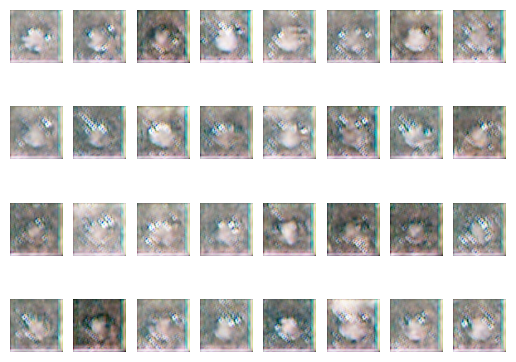

In [32]:
my_wgans.test_and_show()

In [33]:
my_wgans.training(1000)

Epochs: 2001
Current loss for discriminator: 24051.55859375
Current loss for generator: 6400.978515625
Epochs: 2002
Current loss for discriminator: 21862.646484375
Current loss for generator: 16570.44921875
Epochs: 2003
Current loss for discriminator: 15305.978515625
Current loss for generator: 8155.3994140625
Epochs: 2004
Current loss for discriminator: 8655.724609375
Current loss for generator: 9362.373046875
Epochs: 2005
Current loss for discriminator: 3515.5048828125
Current loss for generator: 1802.4744873046875
Epochs: 2006
Current loss for discriminator: 2035.3585205078125
Current loss for generator: -8952.3056640625
Epochs: 2007
Current loss for discriminator: -732.9248046875
Current loss for generator: -20223.2578125
Epochs: 2008
Current loss for discriminator: 3855.267578125
Current loss for generator: -32595.92578125
Epochs: 2009
Current loss for discriminator: 5020.91015625
Current loss for generator: -38855.796875
Epochs: 2010
Current loss for discriminator: 3064.71484375


Current loss for discriminator: 10679.62109375
Current loss for generator: -14713.572265625
Epochs: 2047
Current loss for discriminator: 2533.66796875
Current loss for generator: -2281.091064453125
Epochs: 2048
Current loss for discriminator: 2761.3623046875
Current loss for generator: 3015.27490234375
Epochs: 2049
Current loss for discriminator: 6753.80859375
Current loss for generator: -3560.377685546875
Epochs: 2050
Current loss for discriminator: 7053.501953125
Current loss for generator: -6554.41357421875
Epochs: 2051
Current loss for discriminator: 1211.287109375
Current loss for generator: -7076.794921875
Epochs: 2052
Current loss for discriminator: -760.01708984375
Current loss for generator: -3712.10986328125
Epochs: 2053
Current loss for discriminator: -670.44970703125
Current loss for generator: -721.8142700195312
Epochs: 2054
Current loss for discriminator: 1733.9248046875
Current loss for generator: 4998.50439453125
Epochs: 2055
Current loss for discriminator: 3658.9165039

Epochs: 2091
Current loss for discriminator: 7722.560546875
Current loss for generator: 11872.9599609375
Epochs: 2092
Current loss for discriminator: 8528.666015625
Current loss for generator: 26678.1875
Epochs: 2093
Current loss for discriminator: -2316.6328125
Current loss for generator: 33892.90625
Epochs: 2094
Current loss for discriminator: 5235.302734375
Current loss for generator: 19056.2109375
Epochs: 2095
Current loss for discriminator: 6207.404296875
Current loss for generator: 9059.9892578125
Epochs: 2096
Current loss for discriminator: 4900.462890625
Current loss for generator: 5404.93896484375
Epochs: 2097
Current loss for discriminator: 2744.080078125
Current loss for generator: 13598.9873046875
Epochs: 2098
Current loss for discriminator: -1890.3427734375
Current loss for generator: 10646.7314453125
Epochs: 2099
Current loss for discriminator: -1637.46826171875
Current loss for generator: 15917.306640625
Epochs: 2100
Current loss for discriminator: -1556.5595703125
Curre

Current loss for discriminator: -2171.09765625
Current loss for generator: 9187.740234375
Epochs: 2136
Current loss for discriminator: -1055.88427734375
Current loss for generator: -1421.3392333984375
Epochs: 2137
Current loss for discriminator: -760.3173828125
Current loss for generator: 2634.86572265625
Epochs: 2138
Current loss for discriminator: -2977.41650390625
Current loss for generator: 11636.9375
Epochs: 2139
Current loss for discriminator: -8809.0205078125
Current loss for generator: 15288.2470703125
Epochs: 2140
Current loss for discriminator: -5946.34375
Current loss for generator: 6367.0556640625
Epochs: 2141
Current loss for discriminator: -64.442138671875
Current loss for generator: -3614.828125
Epochs: 2142
Current loss for discriminator: 4729.57275390625
Current loss for generator: 6244.82470703125
Epochs: 2143
Current loss for discriminator: 1137.71484375
Current loss for generator: 13751.25
Epochs: 2144
Current loss for discriminator: -1268.32421875
Current loss for 

Current loss for discriminator: -6559.6962890625
Current loss for generator: 13896.060546875
Epochs: 2181
Current loss for discriminator: -4375.7080078125
Current loss for generator: 9694.52734375
Epochs: 2182
Current loss for discriminator: -5041.33203125
Current loss for generator: 11171.775390625
Epochs: 2183
Current loss for discriminator: -1236.796630859375
Current loss for generator: 16435.8359375
Epochs: 2184
Current loss for discriminator: -6271.224609375
Current loss for generator: 20764.54296875
Epochs: 2185
Current loss for discriminator: -5502.0390625
Current loss for generator: 30969.7578125
Epochs: 2186
Current loss for discriminator: -4807.876953125
Current loss for generator: 25649.802734375
Epochs: 2187
Current loss for discriminator: -2753.51171875
Current loss for generator: 25033.484375
Epochs: 2188
Current loss for discriminator: -3033.66796875
Current loss for generator: 22159.5625
Epochs: 2189
Current loss for discriminator: -7133.509765625
Current loss for gener

Current loss for discriminator: 3238.7275390625
Current loss for generator: 6467.3359375
Epochs: 2226
Current loss for discriminator: -9350.5234375
Current loss for generator: 24174.740234375
Epochs: 2227
Current loss for discriminator: -20820.3359375
Current loss for generator: 44331.140625
Epochs: 2228
Current loss for discriminator: -30906.44921875
Current loss for generator: 59218.8359375
Epochs: 2229
Current loss for discriminator: -35266.5703125
Current loss for generator: 72692.546875
Epochs: 2230
Current loss for discriminator: -31420.52734375
Current loss for generator: 69010.59375
Epochs: 2231
Current loss for discriminator: -9790.111328125
Current loss for generator: 43554.42578125
Epochs: 2232
Current loss for discriminator: 10319.404296875
Current loss for generator: 10249.515625
Epochs: 2233
Current loss for discriminator: 20152.6953125
Current loss for generator: -6036.8623046875
Epochs: 2234
Current loss for discriminator: 19163.033203125
Current loss for generator: -15

Current loss for discriminator: 260.763671875
Current loss for generator: 18700.14453125
Epochs: 2271
Current loss for discriminator: -9028.2734375
Current loss for generator: 35803.6640625
Epochs: 2272
Current loss for discriminator: -4200.912109375
Current loss for generator: 25450.72265625
Epochs: 2273
Current loss for discriminator: -12262.4208984375
Current loss for generator: 28922.78125
Epochs: 2274
Current loss for discriminator: -15312.2333984375
Current loss for generator: 28405.1953125
Epochs: 2275
Current loss for discriminator: -17783.390625
Current loss for generator: 22915.98046875
Epochs: 2276
Current loss for discriminator: -10093.69921875
Current loss for generator: 29269.65625
Epochs: 2277
Current loss for discriminator: -13591.177734375
Current loss for generator: 22743.2890625
Epochs: 2278
Current loss for discriminator: -4113.892578125
Current loss for generator: 7945.3447265625
Epochs: 2279
Current loss for discriminator: 10690.798828125
Current loss for generato

Current loss for discriminator: 35186.41015625
Current loss for generator: 19189.134765625
Epochs: 2316
Current loss for discriminator: 29592.3984375
Current loss for generator: 18810.9296875
Epochs: 2317
Current loss for discriminator: 17123.65625
Current loss for generator: 18572.60546875
Epochs: 2318
Current loss for discriminator: 9499.869140625
Current loss for generator: 19420.19921875
Epochs: 2319
Current loss for discriminator: 4219.892578125
Current loss for generator: 17468.96875
Epochs: 2320
Current loss for discriminator: -3424.052734375
Current loss for generator: 15449.681640625
Epochs: 2321
Current loss for discriminator: -9212.515625
Current loss for generator: 16535.232421875
Epochs: 2322
Current loss for discriminator: -15069.162109375
Current loss for generator: 10032.2470703125
Epochs: 2323
Current loss for discriminator: -17276.36328125
Current loss for generator: 10480.59765625
Epochs: 2324
Current loss for discriminator: -10797.2978515625
Current loss for generat

Current loss for generator: 14938.083984375
Epochs: 2361
Current loss for discriminator: 1954.3232421875
Current loss for generator: 11374.248046875
Epochs: 2362
Current loss for discriminator: -4030.08447265625
Current loss for generator: 7011.9111328125
Epochs: 2363
Current loss for discriminator: -11299.091796875
Current loss for generator: 3235.48583984375
Epochs: 2364
Current loss for discriminator: -22540.65625
Current loss for generator: -186.7760467529297
Epochs: 2365
Current loss for discriminator: -13557.7451171875
Current loss for generator: -1687.465087890625
Epochs: 2366
Current loss for discriminator: -8349.064453125
Current loss for generator: 1891.419189453125
Epochs: 2367
Current loss for discriminator: -5021.75390625
Current loss for generator: 5577.1025390625
Epochs: 2368
Current loss for discriminator: 13940.4716796875
Current loss for generator: -3430.029296875
Epochs: 2369
Current loss for discriminator: 41008.85546875
Current loss for generator: -14046.537109375


Current loss for generator: 8912.521484375
Epochs: 2406
Current loss for discriminator: -6668.2197265625
Current loss for generator: -5431.0615234375
Epochs: 2407
Current loss for discriminator: 33126.4609375
Current loss for generator: -25176.00390625
Epochs: 2408
Current loss for discriminator: 66525.8203125
Current loss for generator: -35554.8828125
Epochs: 2409
Current loss for discriminator: 70751.0234375
Current loss for generator: -14787.9267578125
Epochs: 2410
Current loss for discriminator: 37559.8828125
Current loss for generator: 32092.552734375
Epochs: 2411
Current loss for discriminator: 1343.7177734375
Current loss for generator: 59832.34375
Epochs: 2412
Current loss for discriminator: -17619.24609375
Current loss for generator: 68426.6484375
Epochs: 2413
Current loss for discriminator: -15273.37890625
Current loss for generator: 60186.81640625
Epochs: 2414
Current loss for discriminator: 4675.515625
Current loss for generator: 31086.80078125
Epochs: 2415
Current loss for

Current loss for generator: 61952.2734375
Epochs: 2451
Current loss for discriminator: -10053.88671875
Current loss for generator: 78053.59375
Epochs: 2452
Current loss for discriminator: -3559.91015625
Current loss for generator: 68165.125
Epochs: 2453
Current loss for discriminator: 8287.55859375
Current loss for generator: 45402.296875
Epochs: 2454
Current loss for discriminator: 2625.91796875
Current loss for generator: 44715.8203125
Epochs: 2455
Current loss for discriminator: 1353.81640625
Current loss for generator: 39064.671875
Epochs: 2456
Current loss for discriminator: -1287.81640625
Current loss for generator: 52516.1171875
Epochs: 2457
Current loss for discriminator: -85.62109375
Current loss for generator: 40867.203125
Epochs: 2458
Current loss for discriminator: -1511.28515625
Current loss for generator: 53958.828125
Epochs: 2459
Current loss for discriminator: -1071.38671875
Current loss for generator: 43767.73046875
Epochs: 2460
Current loss for discriminator: 1128.585

Current loss for discriminator: -4422.86328125
Current loss for generator: 41627.765625
Epochs: 2497
Current loss for discriminator: 419.802734375
Current loss for generator: 24858.306640625
Epochs: 2498
Current loss for discriminator: -4210.208984375
Current loss for generator: 38797.9140625
Epochs: 2499
Current loss for discriminator: 298.2734375
Current loss for generator: 26562.41796875
Epochs: 2500
Current loss for discriminator: -1881.9296875
Current loss for generator: 37268.3828125
Epochs: 2501
Current loss for discriminator: 941.4453125
Current loss for generator: 26206.30859375
Epochs: 2502
Current loss for discriminator: 2197.78515625
Current loss for generator: 35655.546875
Epochs: 2503
Current loss for discriminator: -2823.0078125
Current loss for generator: 31881.587890625
Epochs: 2504
Current loss for discriminator: -923.521484375
Current loss for generator: 37182.65625
Epochs: 2505
Current loss for discriminator: -620.6640625
Current loss for generator: 34289.625
Epochs

Epochs: 2542
Current loss for discriminator: -11638.03125
Current loss for generator: 93187.921875
Epochs: 2543
Current loss for discriminator: -26188.83203125
Current loss for generator: 107855.828125
Epochs: 2544
Current loss for discriminator: -19745.26953125
Current loss for generator: 80210.9375
Epochs: 2545
Current loss for discriminator: 1454.328125
Current loss for generator: 64012.75
Epochs: 2546
Current loss for discriminator: 16067.234375
Current loss for generator: 37693.1796875
Epochs: 2547
Current loss for discriminator: 15532.5703125
Current loss for generator: 28673.83203125
Epochs: 2548
Current loss for discriminator: 18172.33203125
Current loss for generator: 23718.0234375
Epochs: 2549
Current loss for discriminator: 12186.75390625
Current loss for generator: 28662.28515625
Epochs: 2550
Current loss for discriminator: 5305.181640625
Current loss for generator: 33621.859375
Epochs: 2551
Current loss for discriminator: 2233.91015625
Current loss for generator: 33140.687

Current loss for discriminator: -3567.1708984375
Current loss for generator: 14076.84765625
Epochs: 2588
Current loss for discriminator: -545.369140625
Current loss for generator: 14942.931640625
Epochs: 2589
Current loss for discriminator: 8293.732421875
Current loss for generator: 20190.56640625
Epochs: 2590
Current loss for discriminator: 4841.693359375
Current loss for generator: 31660.921875
Epochs: 2591
Current loss for discriminator: 534.94921875
Current loss for generator: 42246.49609375
Epochs: 2592
Current loss for discriminator: 1976.24609375
Current loss for generator: 43315.296875
Epochs: 2593
Current loss for discriminator: 1989.21484375
Current loss for generator: 43797.890625
Epochs: 2594
Current loss for discriminator: -615.7890625
Current loss for generator: 46476.46875
Epochs: 2595
Current loss for discriminator: -4867.015625
Current loss for generator: 43298.5390625
Epochs: 2596
Current loss for discriminator: 2349.2265625
Current loss for generator: 47894.83203125


Current loss for generator: 68956.8203125
Epochs: 2633
Current loss for discriminator: -7196.99609375
Current loss for generator: 68316.578125
Epochs: 2634
Current loss for discriminator: -1609.2578125
Current loss for generator: 60865.1171875
Epochs: 2635
Current loss for discriminator: 2129.5234375
Current loss for generator: 44565.3828125
Epochs: 2636
Current loss for discriminator: 11005.76953125
Current loss for generator: 29249.7421875
Epochs: 2637
Current loss for discriminator: 8994.193359375
Current loss for generator: 23812.671875
Epochs: 2638
Current loss for discriminator: 2470.46484375
Current loss for generator: 21016.96484375
Epochs: 2639
Current loss for discriminator: -2843.73046875
Current loss for generator: 17139.1484375
Epochs: 2640
Current loss for discriminator: -2408.314453125
Current loss for generator: 9891.115234375
Epochs: 2641
Current loss for discriminator: 4424.1630859375
Current loss for generator: 5410.15966796875
Epochs: 2642
Current loss for discrimin

Epochs: 2678
Current loss for discriminator: -8691.328125
Current loss for generator: 61247.7265625
Epochs: 2679
Current loss for discriminator: -11262.796875
Current loss for generator: 67258.6875
Epochs: 2680
Current loss for discriminator: -18426.46875
Current loss for generator: 76731.75
Epochs: 2681
Current loss for discriminator: -21465.64453125
Current loss for generator: 72898.46875
Epochs: 2682
Current loss for discriminator: -17363.5
Current loss for generator: 61871.20703125
Epochs: 2683
Current loss for discriminator: -6796.046875
Current loss for generator: 39782.30859375
Epochs: 2684
Current loss for discriminator: 5057.521484375
Current loss for generator: 16707.263671875
Epochs: 2685
Current loss for discriminator: 11359.6572265625
Current loss for generator: 4153.05078125
Epochs: 2686
Current loss for discriminator: 16578.8828125
Current loss for generator: -1949.841064453125
Epochs: 2687
Current loss for discriminator: 14906.4619140625
Current loss for generator: -465

Current loss for discriminator: -350907.3125
Current loss for generator: 504203.90625
Epochs: 2724
Current loss for discriminator: -322766.0
Current loss for generator: 466695.71875
Epochs: 2725
Current loss for discriminator: -208653.546875
Current loss for generator: 358178.0625
Epochs: 2726
Current loss for discriminator: -85746.9296875
Current loss for generator: 222275.5
Epochs: 2727
Current loss for discriminator: -1338.375
Current loss for generator: 143639.0625
Epochs: 2728
Current loss for discriminator: 23963.0625
Current loss for generator: 113138.484375
Epochs: 2729
Current loss for discriminator: 37919.8125
Current loss for generator: 109932.0
Epochs: 2730
Current loss for discriminator: 45804.15625
Current loss for generator: 124127.921875
Epochs: 2731
Current loss for discriminator: 22201.890625
Current loss for generator: 138348.765625
Epochs: 2732
Current loss for discriminator: 21649.375
Current loss for generator: 143099.609375
Epochs: 2733
Current loss for discrimin

Epochs: 2769
Current loss for discriminator: 14289.2109375
Current loss for generator: -40180.1796875
Epochs: 2770
Current loss for discriminator: 19028.22265625
Current loss for generator: -41750.89453125
Epochs: 2771
Current loss for discriminator: 31021.47265625
Current loss for generator: -42758.328125
Epochs: 2772
Current loss for discriminator: 42406.84375
Current loss for generator: -46320.578125
Epochs: 2773
Current loss for discriminator: 55389.62109375
Current loss for generator: -58398.015625
Epochs: 2774
Current loss for discriminator: 83201.265625
Current loss for generator: -67076.671875
Epochs: 2775
Current loss for discriminator: 101465.4140625
Current loss for generator: -75365.3046875
Epochs: 2776
Current loss for discriminator: 109833.484375
Current loss for generator: -65292.62109375
Epochs: 2777
Current loss for discriminator: 84068.2265625
Current loss for generator: -25300.8671875
Epochs: 2778
Current loss for discriminator: 33710.9375
Current loss for generator:

Current loss for discriminator: 124664.640625
Current loss for generator: -107454.1640625
Epochs: 2815
Current loss for discriminator: 93484.296875
Current loss for generator: -75930.234375
Epochs: 2816
Current loss for discriminator: 63142.9609375
Current loss for generator: -43702.0703125
Epochs: 2817
Current loss for discriminator: 35173.9765625
Current loss for generator: -11460.626953125
Epochs: 2818
Current loss for discriminator: 3118.6484375
Current loss for generator: 21393.47265625
Epochs: 2819
Current loss for discriminator: -24441.904296875
Current loss for generator: 55453.7578125
Epochs: 2820
Current loss for discriminator: -56914.19140625
Current loss for generator: 90082.796875
Epochs: 2821
Current loss for discriminator: -88546.609375
Current loss for generator: 125769.8984375
Epochs: 2822
Current loss for discriminator: -113269.9453125
Current loss for generator: 157890.875
Epochs: 2823
Current loss for discriminator: -143535.890625
Current loss for generator: 185655.

Current loss for generator: -290.5711364746094
Epochs: 2860
Current loss for discriminator: 7329.7412109375
Current loss for generator: 1935.8603515625
Epochs: 2861
Current loss for discriminator: 5493.3828125
Current loss for generator: 2260.062255859375
Epochs: 2862
Current loss for discriminator: 4261.052734375
Current loss for generator: 2083.086669921875
Epochs: 2863
Current loss for discriminator: 3331.595947265625
Current loss for generator: 1913.25048828125
Epochs: 2864
Current loss for discriminator: 3304.76318359375
Current loss for generator: 584.7496337890625
Epochs: 2865
Current loss for discriminator: 2046.9671630859375
Current loss for generator: -936.0690307617188
Epochs: 2866
Current loss for discriminator: 1869.575439453125
Current loss for generator: -230.1087188720703
Epochs: 2867
Current loss for discriminator: 1138.19140625
Current loss for generator: 862.238525390625
Epochs: 2868
Current loss for discriminator: 1336.310546875
Current loss for generator: 372.92010

Current loss for discriminator: 170.560546875
Current loss for generator: 1440.4788818359375
Epochs: 2905
Current loss for discriminator: -268.385986328125
Current loss for generator: 1721.822265625
Epochs: 2906
Current loss for discriminator: 24.97900390625
Current loss for generator: 1212.4337158203125
Epochs: 2907
Current loss for discriminator: 213.74127197265625
Current loss for generator: 2542.1826171875
Epochs: 2908
Current loss for discriminator: -206.359619140625
Current loss for generator: 3256.1171875
Epochs: 2909
Current loss for discriminator: -182.94091796875
Current loss for generator: 5028.48876953125
Epochs: 2910
Current loss for discriminator: -390.016845703125
Current loss for generator: 5863.4892578125
Epochs: 2911
Current loss for discriminator: -466.74267578125
Current loss for generator: 6916.15478515625
Epochs: 2912
Current loss for discriminator: 42.71337890625
Current loss for generator: 6648.11181640625
Epochs: 2913
Current loss for discriminator: -355.541503

Current loss for discriminator: -434.24658203125
Current loss for generator: 7196.3896484375
Epochs: 2949
Current loss for discriminator: -259.70166015625
Current loss for generator: 6645.0107421875
Epochs: 2950
Current loss for discriminator: -280.8134765625
Current loss for generator: 7866.326171875
Epochs: 2951
Current loss for discriminator: -342.21728515625
Current loss for generator: 5798.0703125
Epochs: 2952
Current loss for discriminator: 11.41015625
Current loss for generator: 6348.2138671875
Epochs: 2953
Current loss for discriminator: 571.58447265625
Current loss for generator: 5591.318359375
Epochs: 2954
Current loss for discriminator: -580.2578125
Current loss for generator: 6633.3671875
Epochs: 2955
Current loss for discriminator: -362.9580078125
Current loss for generator: 6146.63720703125
Epochs: 2956
Current loss for discriminator: -328.00439453125
Current loss for generator: 5225.23291015625
Epochs: 2957
Current loss for discriminator: 322.3271484375
Current loss for 

Current loss for generator: -6104.560546875
Epochs: 2993
Current loss for discriminator: 4247.9443359375
Current loss for generator: -4300.111328125
Epochs: 2994
Current loss for discriminator: 4730.6640625
Current loss for generator: -3602.5625
Epochs: 2995
Current loss for discriminator: 6636.7548828125
Current loss for generator: -3339.49365234375
Epochs: 2996
Current loss for discriminator: 11078.4091796875
Current loss for generator: -1748.2305908203125
Epochs: 2997
Current loss for discriminator: 12103.853515625
Current loss for generator: -569.2742919921875
Epochs: 2998
Current loss for discriminator: 8099.572265625
Current loss for generator: 6019.30224609375
Epochs: 2999
Current loss for discriminator: 1700.22998046875
Current loss for generator: 15144.46875
Epochs: 3000
Current loss for discriminator: -5715.1796875
Current loss for generator: 22879.74609375


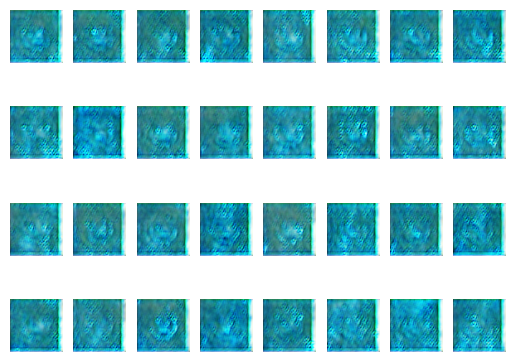

In [34]:
my_wgans.test_and_show()

Use multiple k and have a different try

In [41]:
my_wgans = myWGAN(Wgenerator, Wdiscriminator, cwd + "/extra_data_from_danbooru/", 1, 32, 64, 64)

Found 140000 files belonging to 1 classes.


In [42]:
my_wgans.training(10, k = 5)

Epochs: 1
Current loss for discriminator: 0.02457667514681816
Current loss for discriminator: -8.75086498260498
Current loss for discriminator: -59.202972412109375
Current loss for discriminator: -178.6719512939453
Current loss for discriminator: -377.8351135253906
Current loss for generator: 418.54217529296875
Epochs: 2
Current loss for discriminator: -655.4978637695312
Current loss for discriminator: -1086.5491943359375
Current loss for discriminator: -1693.39794921875
Current loss for discriminator: -2533.952392578125
Current loss for discriminator: -3720.330078125
Current loss for generator: 1727.075439453125
Epochs: 3
Current loss for discriminator: -3352.6708984375
Current loss for discriminator: -5283.79150390625
Current loss for discriminator: -6794.1044921875
Current loss for discriminator: -7970.591796875
Current loss for discriminator: -11156.2294921875
Current loss for generator: 1883.141845703125
Epochs: 4
Current loss for discriminator: -1466.75
Current loss for discrimin

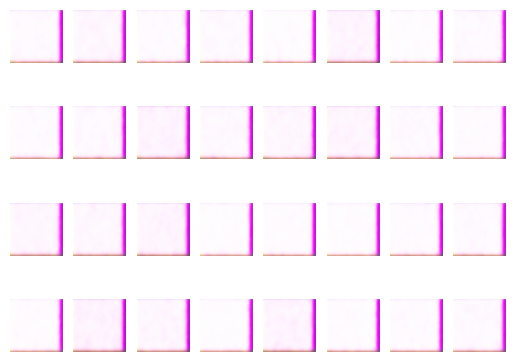

In [43]:
my_wgans.test_and_show()

In [44]:
my_wgans.training(90, k = 5)

Epochs: 11
Current loss for discriminator: -34898.9140625
Current loss for discriminator: -29466.876953125
Current loss for discriminator: -38836.3359375
Current loss for discriminator: -62700.96484375
Current loss for discriminator: -53904.40234375
Current loss for generator: -3698.16552734375
Epochs: 12
Current loss for discriminator: -41626.7734375
Current loss for discriminator: -49813.125
Current loss for discriminator: -72169.5703125
Current loss for discriminator: -98095.984375
Current loss for discriminator: -77872.421875
Current loss for generator: -9756.5390625
Epochs: 13
Current loss for discriminator: -92025.15625
Current loss for discriminator: -85068.8203125
Current loss for discriminator: -103223.515625
Current loss for discriminator: -132708.15625
Current loss for discriminator: -105078.7109375
Current loss for generator: -30853.416015625
Epochs: 14
Current loss for discriminator: 86327.9375
Current loss for discriminator: 68451.625
Current loss for discriminator: 71258

Current loss for discriminator: -727053.625
Current loss for discriminator: -1322415.25
Current loss for discriminator: -854563.375
Current loss for discriminator: -1415348.25
Current loss for discriminator: -945293.0625
Current loss for generator: -126194.8125
Epochs: 35
Current loss for discriminator: -446064.125
Current loss for discriminator: -542317.125
Current loss for discriminator: -643472.5
Current loss for discriminator: -1334183.375
Current loss for discriminator: -855527.9375
Current loss for generator: -539232.125
Epochs: 36
Current loss for discriminator: 525696.0
Current loss for discriminator: -287310.25
Current loss for discriminator: -95129.75
Current loss for discriminator: -147640.25
Current loss for discriminator: -244183.625
Current loss for generator: -1721236.0
Epochs: 37
Current loss for discriminator: 1944122.5
Current loss for discriminator: 2218279.5
Current loss for discriminator: 1770608.5
Current loss for discriminator: 1534296.0
Current loss for discrimi

Current loss for discriminator: -625119.4375
Current loss for generator: 88905.96875
Epochs: 58
Current loss for discriminator: -558531.75
Current loss for discriminator: -803348.6875
Current loss for discriminator: -799769.4375
Current loss for discriminator: -783988.25
Current loss for discriminator: -1007427.9375
Current loss for generator: 138760.6875
Epochs: 59
Current loss for discriminator: -642159.8125
Current loss for discriminator: -1074162.75
Current loss for discriminator: -1114705.125
Current loss for discriminator: -1053971.0
Current loss for discriminator: -1191549.375
Current loss for generator: 129031.6640625
Epochs: 60
Current loss for discriminator: -972271.3125
Current loss for discriminator: -1468623.375
Current loss for discriminator: -1526880.75
Current loss for discriminator: -1571815.125
Current loss for discriminator: -1777099.375
Current loss for generator: 254170.890625
Epochs: 61
Current loss for discriminator: -1844665.375
Current loss for discriminator: -

Current loss for discriminator: 2308975.25
Current loss for discriminator: 1822644.0
Current loss for discriminator: 1606309.75
Current loss for discriminator: 1340185.75
Current loss for generator: -1345784.25
Epochs: 82
Current loss for discriminator: 1119856.875
Current loss for discriminator: 854783.875
Current loss for discriminator: 594640.0625
Current loss for discriminator: 372915.5625
Current loss for discriminator: 197709.578125
Current loss for generator: 228516.140625
Epochs: 83
Current loss for discriminator: 463.28125
Current loss for discriminator: -207224.84375
Current loss for discriminator: -372425.125
Current loss for discriminator: -522919.375
Current loss for discriminator: -702560.25
Current loss for generator: 1457010.5
Epochs: 84
Current loss for discriminator: -840838.375
Current loss for discriminator: -941873.0
Current loss for discriminator: -1028304.625
Current loss for discriminator: -1039092.25
Current loss for discriminator: -1030814.9375
Current loss fo

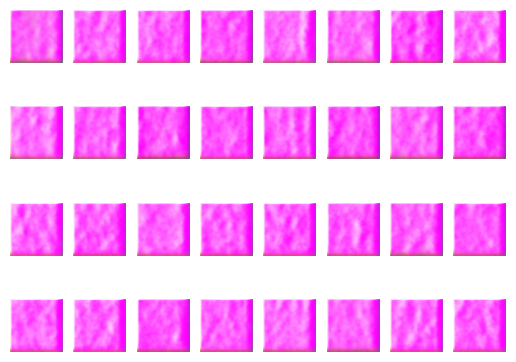

In [45]:
my_wgans.test_and_show()

In [46]:
my_wgans.training(700, k = 5)

Epochs: 101
Current loss for discriminator: -2957292.25
Current loss for discriminator: -3450719.75
Current loss for discriminator: -3618735.75
Current loss for discriminator: -3936376.25
Current loss for discriminator: -4215026.5
Current loss for generator: 6053841.0
Epochs: 102
Current loss for discriminator: -2348410.75
Current loss for discriminator: -2642319.0
Current loss for discriminator: -3130200.75
Current loss for discriminator: -3267937.5
Current loss for discriminator: -3599259.5
Current loss for generator: 6537714.0
Epochs: 103
Current loss for discriminator: -3780841.25
Current loss for discriminator: -4139165.0
Current loss for discriminator: -4068685.0
Current loss for discriminator: -4399995.5
Current loss for discriminator: -4419938.0
Current loss for generator: 7334604.0
Epochs: 104
Current loss for discriminator: -3687759.5
Current loss for discriminator: -4005027.5
Current loss for discriminator: -4417034.0
Current loss for discriminator: -4176300.0
Current loss f

Current loss for discriminator: -5930589.5
Current loss for generator: 10043808.0
Epochs: 125
Current loss for discriminator: -6678303.0
Current loss for discriminator: -7786281.0
Current loss for discriminator: -8500280.0
Current loss for discriminator: -9982331.0
Current loss for discriminator: -10549564.0
Current loss for generator: 13867572.0
Epochs: 126
Current loss for discriminator: -7336757.5
Current loss for discriminator: -8258212.5
Current loss for discriminator: -8383276.0
Current loss for discriminator: -8902193.0
Current loss for discriminator: -8403204.0
Current loss for generator: 12921812.0
Epochs: 127
Current loss for discriminator: -6762273.0
Current loss for discriminator: -7616931.5
Current loss for discriminator: -7996762.0
Current loss for discriminator: -8573054.0
Current loss for discriminator: -8993024.0
Current loss for generator: 12816398.0
Epochs: 128
Current loss for discriminator: -7513703.0
Current loss for discriminator: -7833134.0
Current loss for disc

Current loss for discriminator: 29587910.0
Current loss for discriminator: 28562228.0
Current loss for discriminator: 25045084.0
Current loss for discriminator: 22143688.0
Current loss for generator: -33359920.0
Epochs: 149
Current loss for discriminator: 22753336.0
Current loss for discriminator: 19258830.0
Current loss for discriminator: 18447932.0
Current loss for discriminator: 17301108.0
Current loss for discriminator: 15896795.0
Current loss for generator: -21518904.0
Epochs: 150
Current loss for discriminator: 13576082.0
Current loss for discriminator: 12781710.0
Current loss for discriminator: 11231192.0
Current loss for discriminator: 8957972.0
Current loss for discriminator: 8738471.0
Current loss for generator: -12079676.0
Epochs: 151
Current loss for discriminator: 7750273.0
Current loss for discriminator: 6293211.0
Current loss for discriminator: 5436065.0
Current loss for discriminator: 4575674.0
Current loss for discriminator: 3854276.0
Current loss for generator: -48569

Current loss for generator: 9291684.0
Epochs: 172
Current loss for discriminator: -72019456.0
Current loss for discriminator: -75647088.0
Current loss for discriminator: -72202200.0
Current loss for discriminator: -82881376.0
Current loss for discriminator: -86913240.0
Current loss for generator: 4817628.5
Epochs: 173
Current loss for discriminator: -84865112.0
Current loss for discriminator: -88306376.0
Current loss for discriminator: -96215944.0
Current loss for discriminator: -102780504.0
Current loss for discriminator: -96223568.0
Current loss for generator: -323320.8125
Epochs: 174
Current loss for discriminator: -107642504.0
Current loss for discriminator: -92578224.0
Current loss for discriminator: -111711688.0
Current loss for discriminator: -100933568.0
Current loss for discriminator: -112585456.0
Current loss for generator: -5046120.5
Epochs: 175
Current loss for discriminator: -110143840.0
Current loss for discriminator: -117517904.0
Current loss for discriminator: -12814839

Current loss for discriminator: 12875738.0
Current loss for discriminator: 11213839.0
Current loss for discriminator: 8404032.0
Current loss for discriminator: 6718090.0
Current loss for discriminator: 4037506.0
Current loss for generator: -11602830.0
Epochs: 196
Current loss for discriminator: 1208279.0
Current loss for discriminator: 16525.0
Current loss for discriminator: -1613622.0
Current loss for discriminator: -4175520.25
Current loss for discriminator: -5976768.0
Current loss for generator: 6055411.0
Epochs: 197
Current loss for discriminator: -8113305.0
Current loss for discriminator: -9876526.0
Current loss for discriminator: -12019055.0
Current loss for discriminator: -14587726.0
Current loss for discriminator: -15434194.0
Current loss for generator: 23079762.0
Epochs: 198
Current loss for discriminator: -17396290.0
Current loss for discriminator: -19971526.0
Current loss for discriminator: -21218460.0
Current loss for discriminator: -23678420.0
Current loss for discriminato

Current loss for discriminator: -161333328.0
Current loss for discriminator: -172905296.0
Current loss for discriminator: -176028544.0
Current loss for generator: 271471488.0
Epochs: 219
Current loss for discriminator: -150593952.0
Current loss for discriminator: -156986208.0
Current loss for discriminator: -151428928.0
Current loss for discriminator: -179575792.0
Current loss for discriminator: -167582080.0
Current loss for generator: 254951296.0
Epochs: 220
Current loss for discriminator: -124441560.0
Current loss for discriminator: -124021752.0
Current loss for discriminator: -134627552.0
Current loss for discriminator: -142191680.0
Current loss for discriminator: -147789472.0
Current loss for generator: 237951664.0
Epochs: 221
Current loss for discriminator: -88822432.0
Current loss for discriminator: -89732784.0
Current loss for discriminator: -88314184.0
Current loss for discriminator: -96974696.0
Current loss for discriminator: -88733024.0
Current loss for generator: 179696512.0

Current loss for discriminator: 13470650.0
Current loss for discriminator: 12414295.0
Current loss for discriminator: 13869136.0
Current loss for discriminator: 10699371.0
Current loss for discriminator: 10110335.0
Current loss for generator: 984628.5625
Epochs: 243
Current loss for discriminator: 10521581.0
Current loss for discriminator: 9757172.0
Current loss for discriminator: 8992308.0
Current loss for discriminator: 10264991.0
Current loss for discriminator: 8112687.0
Current loss for generator: 2623471.5
Epochs: 244
Current loss for discriminator: 9141722.0
Current loss for discriminator: 9135168.0
Current loss for discriminator: 9501654.0
Current loss for discriminator: 9324732.0
Current loss for discriminator: 8781445.0
Current loss for generator: 1077206.625
Epochs: 245
Current loss for discriminator: 7470776.5
Current loss for discriminator: 7938714.5
Current loss for discriminator: 6293014.5
Current loss for discriminator: 5760959.5
Current loss for discriminator: 6014201.0

Epochs: 266
Current loss for discriminator: -1899605.0
Current loss for discriminator: -2561899.75
Current loss for discriminator: 432592.75
Current loss for discriminator: -1867991.25
Current loss for discriminator: -1502572.875
Current loss for generator: -281784.0625
Epochs: 267
Current loss for discriminator: -273860.0
Current loss for discriminator: -1585922.375
Current loss for discriminator: -2336332.25
Current loss for discriminator: -2915361.5
Current loss for discriminator: -2963085.5
Current loss for generator: 3059233.75
Epochs: 268
Current loss for discriminator: -1301192.5
Current loss for discriminator: -1520958.5
Current loss for discriminator: -1367619.625
Current loss for discriminator: -1827742.0
Current loss for discriminator: -907051.4375
Current loss for generator: -660607.4375
Epochs: 269
Current loss for discriminator: -1172169.375
Current loss for discriminator: -911560.75
Current loss for discriminator: -1629870.5
Current loss for discriminator: -2791485.75
Cu

Current loss for discriminator: 1585998.5
Current loss for discriminator: 1163482.75
Current loss for discriminator: 132615.21875
Current loss for generator: 783020.1875
Epochs: 290
Current loss for discriminator: 393944.0625
Current loss for discriminator: 401514.8125
Current loss for discriminator: 48316.5234375
Current loss for discriminator: -725419.0625
Current loss for discriminator: -430779.1875
Current loss for generator: -906913.8125
Epochs: 291
Current loss for discriminator: 804714.5
Current loss for discriminator: 1358648.25
Current loss for discriminator: -39222.4375
Current loss for discriminator: -1116771.375
Current loss for discriminator: -892418.875
Current loss for generator: 2477417.5
Epochs: 292
Current loss for discriminator: 377571.0
Current loss for discriminator: 718589.125
Current loss for discriminator: 242434.375
Current loss for discriminator: -446685.0625
Current loss for discriminator: -594195.125
Current loss for generator: -1199757.0
Epochs: 293
Current

Epochs: 313
Current loss for discriminator: 1565052.0
Current loss for discriminator: 738530.25
Current loss for discriminator: 372030.875
Current loss for discriminator: 130980.625
Current loss for discriminator: -952188.5
Current loss for generator: 1564338.75
Epochs: 314
Current loss for discriminator: -455594.0
Current loss for discriminator: -983994.75
Current loss for discriminator: -1112500.25
Current loss for discriminator: -1213111.75
Current loss for discriminator: -1694519.25
Current loss for generator: -1766301.875
Epochs: 315
Current loss for discriminator: 109173.75
Current loss for discriminator: 471824.0
Current loss for discriminator: -157581.0
Current loss for discriminator: -142808.625
Current loss for discriminator: -1252976.5
Current loss for generator: 1992064.125
Epochs: 316
Current loss for discriminator: -258213.109375
Current loss for discriminator: -644578.375
Current loss for discriminator: -865602.875
Current loss for discriminator: -2008180.875
Current los

Current loss for discriminator: -1219169.875
Current loss for discriminator: -2180571.5
Current loss for generator: -1448672.75
Epochs: 337
Current loss for discriminator: 973886.0
Current loss for discriminator: 2473850.5
Current loss for discriminator: 652192.0
Current loss for discriminator: -647911.875
Current loss for discriminator: -186943.0
Current loss for generator: 1979344.5
Epochs: 338
Current loss for discriminator: -399478.125
Current loss for discriminator: -447698.03125
Current loss for discriminator: -924814.5
Current loss for discriminator: -170545.25
Current loss for discriminator: -1743572.75
Current loss for generator: -1848150.625
Epochs: 339
Current loss for discriminator: 2951144.0
Current loss for discriminator: 1920898.0
Current loss for discriminator: 378274.375
Current loss for discriminator: -487682.875
Current loss for discriminator: -1695426.375
Current loss for generator: 2944039.5
Epochs: 340
Current loss for discriminator: 422867.4375
Current loss for d

Current loss for discriminator: 1364876.25
Current loss for discriminator: 852465.1875
Current loss for discriminator: 587806.625
Current loss for discriminator: 196920.75
Current loss for discriminator: -540233.375
Current loss for generator: -1753610.0
Epochs: 361
Current loss for discriminator: 1057453.75
Current loss for discriminator: 1208824.5
Current loss for discriminator: 626230.875
Current loss for discriminator: 185844.875
Current loss for discriminator: -301425.96875
Current loss for generator: 1772856.0
Epochs: 362
Current loss for discriminator: 1159007.75
Current loss for discriminator: 989213.5
Current loss for discriminator: 242037.25
Current loss for discriminator: -224267.25
Current loss for discriminator: -145982.125
Current loss for generator: -1917836.0
Epochs: 363
Current loss for discriminator: 2220388.5
Current loss for discriminator: 74850.25
Current loss for discriminator: 903596.25
Current loss for discriminator: 26038.25
Current loss for discriminator: -417

Current loss for generator: 1888979.25
Epochs: 384
Current loss for discriminator: -21068.4375
Current loss for discriminator: -263606.9375
Current loss for discriminator: -406109.40625
Current loss for discriminator: -906146.0625
Current loss for discriminator: -789755.0
Current loss for generator: -1074601.125
Epochs: 385
Current loss for discriminator: 777770.5
Current loss for discriminator: -239845.625
Current loss for discriminator: -829788.125
Current loss for discriminator: -1266152.0
Current loss for discriminator: -1595958.75
Current loss for generator: 1878052.625
Epochs: 386
Current loss for discriminator: 318296.21875
Current loss for discriminator: -203200.25
Current loss for discriminator: -655222.0
Current loss for discriminator: -561079.25
Current loss for discriminator: -708781.125
Current loss for generator: -895619.375
Epochs: 387
Current loss for discriminator: -637536.25
Current loss for discriminator: -661721.0
Current loss for discriminator: -1102290.875
Current

Current loss for discriminator: -646368.875
Current loss for discriminator: -1113887.625
Current loss for discriminator: -959016.0
Current loss for discriminator: -1665868.0
Current loss for generator: -741267.375
Epochs: 408
Current loss for discriminator: 396270.0
Current loss for discriminator: -1561389.0
Current loss for discriminator: -845113.875
Current loss for discriminator: -1805210.5
Current loss for discriminator: -2098948.0
Current loss for generator: 2059113.0
Epochs: 409
Current loss for discriminator: -1018296.625
Current loss for discriminator: -1360967.375
Current loss for discriminator: -1017326.5
Current loss for discriminator: -1615752.25
Current loss for discriminator: -1322738.0
Current loss for generator: 851951.125
Epochs: 410
Current loss for discriminator: -410082.78125
Current loss for discriminator: -704462.125
Current loss for discriminator: -1412062.375
Current loss for discriminator: -2081655.0
Current loss for discriminator: -2453998.5
Current loss for g

Current loss for discriminator: 9228862.0
Current loss for discriminator: 7724927.5
Current loss for discriminator: 6911395.0
Current loss for discriminator: 5485136.0
Current loss for discriminator: 2289627.25
Current loss for generator: -3811624.5
Epochs: 432
Current loss for discriminator: 1959027.375
Current loss for discriminator: 1943752.625
Current loss for discriminator: 72681.125
Current loss for discriminator: -3477040.75
Current loss for discriminator: -4283723.0
Current loss for generator: 9419766.0
Epochs: 433
Current loss for discriminator: 158572.25
Current loss for discriminator: -55094.5
Current loss for discriminator: -390322.75
Current loss for discriminator: -905079.0
Current loss for discriminator: -1024697.5
Current loss for generator: 5171353.0
Epochs: 434
Current loss for discriminator: 4108451.0
Current loss for discriminator: 3876027.0
Current loss for discriminator: 2859365.25
Current loss for discriminator: 2915920.75
Current loss for discriminator: 2018009.

Epochs: 455
Current loss for discriminator: 10177568.0
Current loss for discriminator: 8730273.0
Current loss for discriminator: 7841150.0
Current loss for discriminator: 4781171.0
Current loss for discriminator: 2134892.25
Current loss for generator: 1345253.625
Epochs: 456
Current loss for discriminator: 4599522.5
Current loss for discriminator: 2414896.0
Current loss for discriminator: 1339857.0
Current loss for discriminator: -794361.75
Current loss for discriminator: -2436368.0
Current loss for generator: 6392412.0
Epochs: 457
Current loss for discriminator: 3652310.5
Current loss for discriminator: 1615148.0
Current loss for discriminator: 326355.25
Current loss for discriminator: -193182.5
Current loss for discriminator: -1482257.75
Current loss for generator: 5564519.0
Epochs: 458
Current loss for discriminator: 5839285.5
Current loss for discriminator: 5245992.0
Current loss for discriminator: 3555630.25
Current loss for discriminator: 2078394.75
Current loss for discriminator

Current loss for discriminator: 149385808.0
Current loss for discriminator: 134561504.0
Current loss for generator: -187045568.0
Epochs: 479
Current loss for discriminator: 173886544.0
Current loss for discriminator: 154929696.0
Current loss for discriminator: 144374064.0
Current loss for discriminator: 132358896.0
Current loss for discriminator: 116093776.0
Current loss for generator: -167563104.0
Epochs: 480
Current loss for discriminator: 148121248.0
Current loss for discriminator: 126162256.0
Current loss for discriminator: 129734064.0
Current loss for discriminator: 119295368.0
Current loss for discriminator: 102650992.0
Current loss for generator: -143975984.0
Epochs: 481
Current loss for discriminator: 199969088.0
Current loss for discriminator: 179802192.0
Current loss for discriminator: 168734624.0
Current loss for discriminator: 167629344.0
Current loss for discriminator: 147674096.0
Current loss for generator: -182587728.0
Epochs: 482
Current loss for discriminator: 29618441

Current loss for generator: 226562384.0
Epochs: 502
Current loss for discriminator: -150236384.0
Current loss for discriminator: -152064368.0
Current loss for discriminator: -151893792.0
Current loss for discriminator: -161458240.0
Current loss for discriminator: -160740416.0
Current loss for generator: 191515168.0
Epochs: 503
Current loss for discriminator: -114393328.0
Current loss for discriminator: -120947472.0
Current loss for discriminator: -119514224.0
Current loss for discriminator: -122684872.0
Current loss for discriminator: -131620816.0
Current loss for generator: 156094304.0
Epochs: 504
Current loss for discriminator: -104367144.0
Current loss for discriminator: -109164864.0
Current loss for discriminator: -113085824.0
Current loss for discriminator: -118116512.0
Current loss for discriminator: -125963672.0
Current loss for generator: 148382000.0
Epochs: 505
Current loss for discriminator: -104072072.0
Current loss for discriminator: -106818152.0
Current loss for discrimina

Current loss for discriminator: -4166121.5
Current loss for discriminator: -4686192.5
Current loss for discriminator: -6386412.0
Current loss for generator: 611341.125
Epochs: 526
Current loss for discriminator: -1651853.0
Current loss for discriminator: 788073.5
Current loss for discriminator: -1657513.0
Current loss for discriminator: -196984.0
Current loss for discriminator: -1999302.5
Current loss for generator: -5138378.0
Epochs: 527
Current loss for discriminator: 12732417.0
Current loss for discriminator: 7889671.0
Current loss for discriminator: 3991076.5
Current loss for discriminator: 4895530.0
Current loss for discriminator: 897177.0
Current loss for generator: -787529.625
Epochs: 528
Current loss for discriminator: 5740263.0
Current loss for discriminator: 995768.0625
Current loss for discriminator: -1467313.5
Current loss for discriminator: -5730636.0
Current loss for discriminator: -10231398.0
Current loss for generator: 16616342.0
Epochs: 529
Current loss for discriminat

Current loss for discriminator: -2046035.5
Current loss for discriminator: -1841774.375
Current loss for discriminator: -3469891.0
Current loss for discriminator: -4281938.5
Current loss for generator: 1867113.0
Epochs: 550
Current loss for discriminator: -567042.25
Current loss for discriminator: -380340.75
Current loss for discriminator: 3120.375
Current loss for discriminator: -2927325.5
Current loss for discriminator: -1400313.75
Current loss for generator: 4806328.5
Epochs: 551
Current loss for discriminator: 3535723.25
Current loss for discriminator: 2001608.5
Current loss for discriminator: 1939878.5
Current loss for discriminator: 834098.75
Current loss for discriminator: 503938.375
Current loss for generator: -2171387.5
Epochs: 552
Current loss for discriminator: 27226546.0
Current loss for discriminator: 28840844.0
Current loss for discriminator: 24328394.0
Current loss for discriminator: 23572018.0
Current loss for discriminator: 22791088.0
Current loss for generator: -25499

Current loss for discriminator: -12109521.0
Current loss for discriminator: -13664002.0
Current loss for discriminator: -16761399.0
Current loss for discriminator: -20895618.0
Current loss for discriminator: -14529456.0
Current loss for generator: 3171224.75
Epochs: 574
Current loss for discriminator: -4033898.0
Current loss for discriminator: -8605378.0
Current loss for discriminator: -9960398.0
Current loss for discriminator: -16322242.0
Current loss for discriminator: -13519484.0
Current loss for generator: -9075136.0
Epochs: 575
Current loss for discriminator: 10234740.0
Current loss for discriminator: 16005188.0
Current loss for discriminator: 13609096.0
Current loss for discriminator: 14241334.0
Current loss for discriminator: 6934480.0
Current loss for generator: -23891224.0
Epochs: 576
Current loss for discriminator: 30674702.0
Current loss for discriminator: 21790748.0
Current loss for discriminator: 27131206.0
Current loss for discriminator: 22316440.0
Current loss for discri

Current loss for discriminator: 1058722.25
Current loss for discriminator: 785522.25
Current loss for discriminator: 500342.0
Current loss for discriminator: -199068.0
Current loss for discriminator: -430886.5
Current loss for generator: 5730923.5
Epochs: 598
Current loss for discriminator: 2043775.0
Current loss for discriminator: 1727969.25
Current loss for discriminator: 1046090.25
Current loss for discriminator: 945873.625
Current loss for discriminator: 458785.75
Current loss for generator: 607280.5
Epochs: 599
Current loss for discriminator: 638845.8125
Current loss for discriminator: 764574.4375
Current loss for discriminator: 262033.25
Current loss for discriminator: 226537.75
Current loss for discriminator: -543795.5
Current loss for generator: 4676606.0
Epochs: 600
Current loss for discriminator: 1676136.25
Current loss for discriminator: 1040613.75
Current loss for discriminator: 602348.5
Current loss for discriminator: 354925.3125
Current loss for discriminator: -219930.359

Epochs: 621
Current loss for discriminator: 22142372.0
Current loss for discriminator: 20834076.0
Current loss for discriminator: 15856147.0
Current loss for discriminator: 14973074.0
Current loss for discriminator: 13655922.0
Current loss for generator: -28008382.0
Epochs: 622
Current loss for discriminator: 18125452.0
Current loss for discriminator: 16522806.0
Current loss for discriminator: 15910736.0
Current loss for discriminator: 10698314.0
Current loss for discriminator: 8996062.0
Current loss for generator: -27948888.0
Epochs: 623
Current loss for discriminator: 14149908.0
Current loss for discriminator: 12984998.0
Current loss for discriminator: 9869410.0
Current loss for discriminator: 6713952.0
Current loss for discriminator: 6225958.0
Current loss for generator: -27520808.0
Epochs: 624
Current loss for discriminator: 9777770.0
Current loss for discriminator: 7322056.0
Current loss for discriminator: 7169776.0
Current loss for discriminator: 1824208.0
Current loss for discri

Current loss for discriminator: -595526848.0
Current loss for discriminator: -581829632.0
Current loss for discriminator: -587665216.0
Current loss for discriminator: -627500608.0
Current loss for discriminator: -597751744.0
Current loss for generator: -1694023.375
Epochs: 645
Current loss for discriminator: -643125760.0
Current loss for discriminator: -626394240.0
Current loss for discriminator: -660572416.0
Current loss for discriminator: -690611648.0
Current loss for discriminator: -660115840.0
Current loss for generator: -5012989.0
Epochs: 646
Current loss for discriminator: -653239040.0
Current loss for discriminator: -654912320.0
Current loss for discriminator: -691713280.0
Current loss for discriminator: -698078080.0
Current loss for discriminator: -726505344.0
Current loss for generator: -13024844.0
Epochs: 647
Current loss for discriminator: -753987712.0
Current loss for discriminator: -751703232.0
Current loss for discriminator: -719720256.0
Current loss for discriminator: -7

Current loss for discriminator: -449741056.0
Current loss for discriminator: -384296832.0
Current loss for discriminator: -645586048.0
Current loss for discriminator: -629511680.0
Current loss for discriminator: -547558784.0
Current loss for generator: -1365918464.0
Epochs: 668
Current loss for discriminator: -669283328.0
Current loss for discriminator: -563433088.0
Current loss for discriminator: -589229696.0
Current loss for discriminator: -812911488.0
Current loss for discriminator: -786990336.0
Current loss for generator: -1311288064.0
Epochs: 669
Current loss for discriminator: -798477184.0
Current loss for discriminator: -805518592.0
Current loss for discriminator: -708105472.0
Current loss for discriminator: -678848512.0
Current loss for discriminator: -838003584.0
Current loss for generator: -1249017344.0
Epochs: 670
Current loss for discriminator: -1208726400.0
Current loss for discriminator: -905213184.0
Current loss for discriminator: -1216495616.0
Current loss for discrimin

Epochs: 690
Current loss for discriminator: -9170163712.0
Current loss for discriminator: -8977497088.0
Current loss for discriminator: -10365986816.0
Current loss for discriminator: -9312647168.0
Current loss for discriminator: -9777917952.0
Current loss for generator: -5714117.0
Epochs: 691
Current loss for discriminator: -9705603072.0
Current loss for discriminator: -9657490432.0
Current loss for discriminator: -10323994624.0
Current loss for discriminator: -11445971968.0
Current loss for discriminator: -10334741504.0
Current loss for generator: -2506998.25
Epochs: 692
Current loss for discriminator: -10816251904.0
Current loss for discriminator: -10901912576.0
Current loss for discriminator: -10320723968.0
Current loss for discriminator: -10682957824.0
Current loss for discriminator: -10973322240.0
Current loss for generator: -5051937.0
Epochs: 693
Current loss for discriminator: -11386050560.0
Current loss for discriminator: -10723155968.0
Current loss for discriminator: -11992962

Current loss for discriminator: -28296443904.0
Current loss for discriminator: -30036307968.0
Current loss for discriminator: -33286576128.0
Current loss for discriminator: -34754162688.0
Current loss for generator: -4562523.5
Epochs: 713
Current loss for discriminator: -31567171584.0
Current loss for discriminator: -37668368384.0
Current loss for discriminator: -30232725504.0
Current loss for discriminator: -35635740672.0
Current loss for discriminator: -36681158656.0
Current loss for generator: -5957809.0
Epochs: 714
Current loss for discriminator: -35385802752.0
Current loss for discriminator: -36049620992.0
Current loss for discriminator: -35766673408.0
Current loss for discriminator: -35148378112.0
Current loss for discriminator: -37284864000.0
Current loss for generator: -6982976.0
Epochs: 715
Current loss for discriminator: -33791432704.0
Current loss for discriminator: -39827140608.0
Current loss for discriminator: -35735474176.0
Current loss for discriminator: -37487636480.0
C

Current loss for discriminator: -49711759360.0
Current loss for discriminator: -43560546304.0
Current loss for generator: -42712948736.0
Epochs: 735
Current loss for discriminator: -45535035392.0
Current loss for discriminator: -43183718400.0
Current loss for discriminator: -51377471488.0
Current loss for discriminator: -46217916416.0
Current loss for discriminator: -53606174720.0
Current loss for generator: -42495664128.0
Epochs: 736
Current loss for discriminator: -55568572416.0
Current loss for discriminator: -42498097152.0
Current loss for discriminator: -45540409344.0
Current loss for discriminator: -58523525120.0
Current loss for discriminator: -48340377600.0
Current loss for generator: -42204295168.0
Epochs: 737
Current loss for discriminator: -63158280192.0
Current loss for discriminator: -61478547456.0
Current loss for discriminator: -57622740992.0
Current loss for discriminator: -63171698688.0
Current loss for discriminator: -62425255936.0
Current loss for generator: -4163401

Current loss for discriminator: 274878562304.0
Current loss for generator: -400648503296.0
Epochs: 757
Current loss for discriminator: 251485323264.0
Current loss for discriminator: 248176410624.0
Current loss for discriminator: 255532040192.0
Current loss for discriminator: 253483958272.0
Current loss for discriminator: 232298332160.0
Current loss for generator: -385195442176.0
Epochs: 758
Current loss for discriminator: 230731825152.0
Current loss for discriminator: 235769364480.0
Current loss for discriminator: 240600727552.0
Current loss for discriminator: 215733567488.0
Current loss for discriminator: 222071455744.0
Current loss for generator: -370199298048.0
Epochs: 759
Current loss for discriminator: 228578803712.0
Current loss for discriminator: 243582763008.0
Current loss for discriminator: 230900662272.0
Current loss for discriminator: 242144722944.0
Current loss for discriminator: 215592566784.0
Current loss for generator: -355696279552.0
Epochs: 760
Current loss for discrim

Current loss for generator: -156352790528.0
Epochs: 779
Current loss for discriminator: 98853003264.0
Current loss for discriminator: 96289718272.0
Current loss for discriminator: 94574845952.0
Current loss for discriminator: 90673471488.0
Current loss for discriminator: 89652092928.0
Current loss for generator: -149180596224.0
Epochs: 780
Current loss for discriminator: 97088061440.0
Current loss for discriminator: 90097524736.0
Current loss for discriminator: 85808480256.0
Current loss for discriminator: 95099895808.0
Current loss for discriminator: 93183377408.0
Current loss for generator: -142274723840.0
Epochs: 781
Current loss for discriminator: 87252983808.0
Current loss for discriminator: 90002964480.0
Current loss for discriminator: 88250671104.0
Current loss for discriminator: 89635692544.0
Current loss for discriminator: 86255042560.0
Current loss for generator: -135633215488.0
Epochs: 782
Current loss for discriminator: 80560447488.0
Current loss for discriminator: 80641277

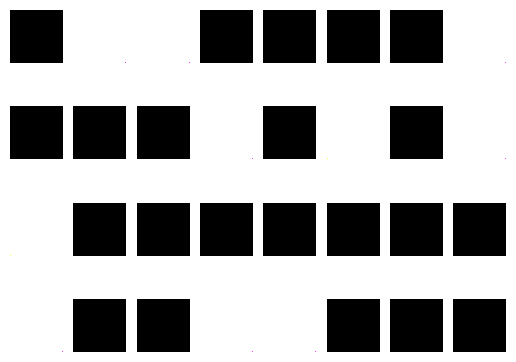

In [47]:
my_wgans.test_and_show()

## Conditional Gan

### New generator and discriminator

Our new task is take not only a noise vector but also a text condition(e.g. blue eyes, blown hair) to generator a anime img. To do this, we need a two-input generator with one input as a text. Also we need 

In [ ]:
# we can not use secquential this time

# first, define inputs
noise_input = keras.Input(
    shape=(100,), name="noise_vector"
)

condition_input = keras.Input(
    shape=(119,), name="conditions"
)

# Embedding (wisely turn a word condition to a vector by a trainable embedding layer)

condition_emb = layers.Embedding(num_words, 256)(condition_input)

concatenated_input = layers.concatenate([noise_input, condition_emb])

x = layers.Dense(4*4*512)(concatenated_input)
x = layers.Reshape((4, 4, 512))(x)
x = layers.Batchnorm(mom = 0.9)

x = layers.Conv2DTranspose(256, 5, activation="relu")(x)
x = layers.Batchnorm(mom = 0.9)

x = layers.Conv2DTranspose(128, 5, activation="relu")(x)
x = layers.Batchnorm(mom = 0.9)

x = layers.Conv2DTranspose(64, 5, activation="relu")(x)
x = layers.Batchnorm(mom = 0.9)

output = layers.Conv2DTranspose(3, 5, activation="tanh")(x)

conditional_generator = keras.Model([noise_input, condition_input], output, name="conditional_generator")